# **Análisis por Región**

## **Región 0**

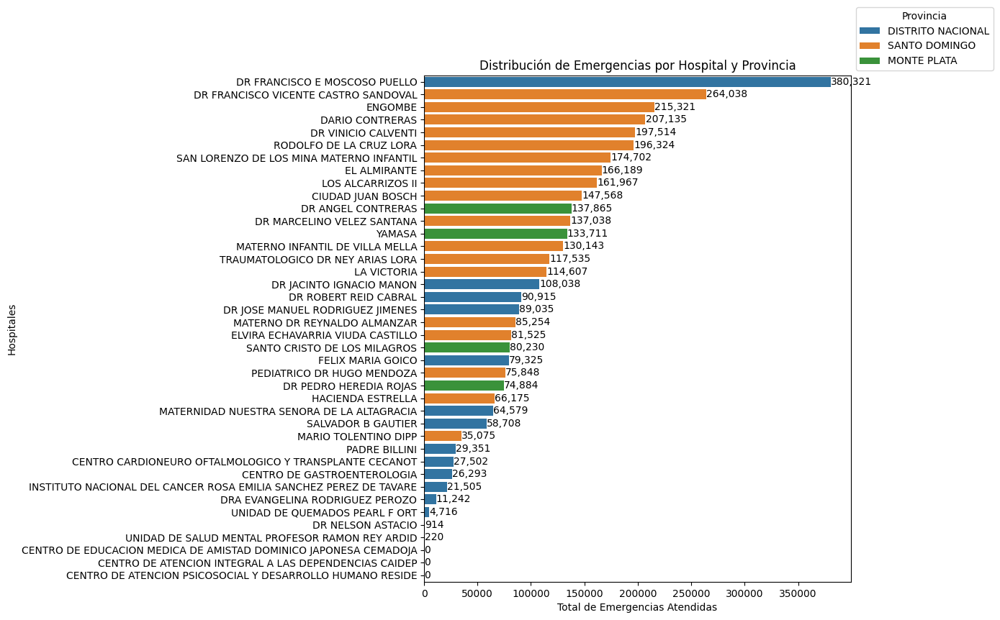

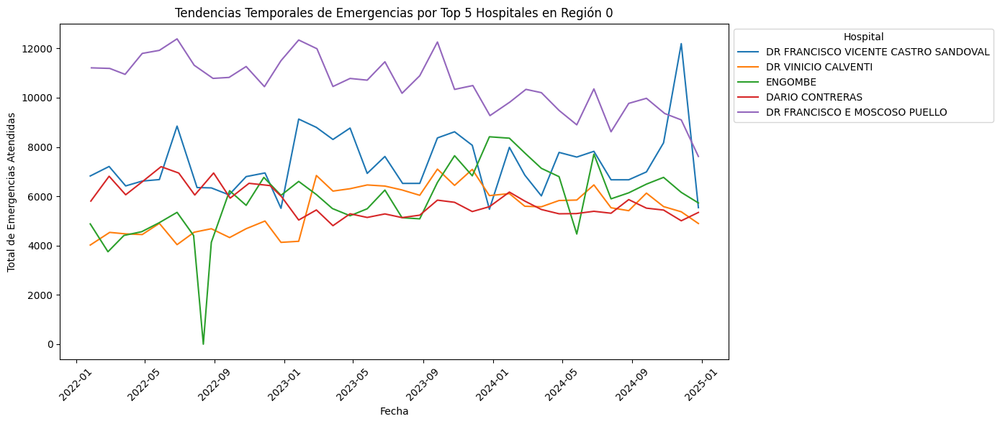

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar el archivo de datos de emergencias
file_path = "Total Emergencias 2018-2024.xlsx"

# Cargar los datos de la hoja correspondiente
df_emergencias = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024")

# Renombrar las columnas correctamente usando la segunda fila como encabezado real
df_emergencias.columns = df_emergencias.iloc[1]
df_emergencias = df_emergencias[2:].reset_index(drop=True)

# Filtrar solo los datos de la Región 0
df_region_0 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 0"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_0 = df_region_0[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_0.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_0["Total_Ingresos"] = pd.to_numeric(df_region_0["Total_Ingresos"], errors="coerce")
df_region_0["Fecha"] = pd.to_datetime(df_region_0["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_0 = df_region_0[(df_region_0["Fecha"].dt.year >= 2022) & (df_region_0["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_0.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_0[df_region_0["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 0")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Análisis del Gráfico:

Distribución de Emergencias por Hospital y Provincia
El gráfico presentado muestra la cantidad total de emergencias atendidas en distintos hospitales, agrupados por provincia.

**Identificación de los Hospitales con Mayor Carga de Emergencias**

Los hospitales que presentan la mayor cantidad de emergencias atendidas incluyen:

DR FRANCISCO E MOSCOSO PUELLO (380,321 emergencias)

Es el hospital con el mayor volumen de emergencias, lo que indica una alta demanda de atención médica en su área de influencia.

DR FRANCISCO VICENTE CASTRO SANDOVAL (264,038 emergencias)

También tiene una carga alta de emergencias, aunque significativamente menor que el MOSCOSO PUELLO.

ENGOMBE, DARIO CONTRERAS y DR VINICIO CALVENTI (entre 190,000 y 215,000 emergencias cada uno)

Estos hospitales mantienen una carga de emergencias considerable, lo que podría estar asociado con su ubicación, infraestructura y especialización.

Conclusión: Estos hospitales probablemente estén ubicados en zonas con alta densidad poblacional o que cuenten con servicios especializados que atraigan más pacientes.

Hospitales con Menor Cantidad de Emergencias
En la parte inferior del gráfico se encuentran hospitales con cargas significativamente más bajas, como:

DR NELSON ASTACIO (914 emergencias)

UNIDAD DE SALUD MENTAL PROFESOR RAMON REY ARDID (220 emergencias)
Centro de Atención Psicosocial y Desarrollo Humano Reside (0 emergencias reportadas)

Interpretación:

Algunos de estos hospitales pueden tener un enfoque más especializado, lo que explicaría la menor cantidad de atenciones en emergencias.
Otros podrían estar experimentando problemas de infraestructura, falta de personal o recursos, lo que limita su capacidad de atender emergencias.

Fluctuaciones en la Demanda por Provincia
El gráfico usa colores para diferenciar provincias, lo que nos permite ver patrones interesantes:

DISTRITO NACIONAL

Alberga algunos de los hospitales con la mayor cantidad de emergencias, reflejando una alta densidad poblacional y una mayor demanda de atención médica.
SANTO DOMINGO

También presenta una alta concentración de emergencias en hospitales clave, lo que indica que la provincia enfrenta una gran carga en la red hospitalaria.
MONTE PLATA

Tiene una menor representación en el gráfico, lo que sugiere que cuenta con menos hospitales de alta capacidad para la atención de emergencias.

Conclusión Final:
Este gráfico refleja una distribución desigual de emergencias entre hospitales y provincias, con algunos centros enfrentando una carga excesiva.

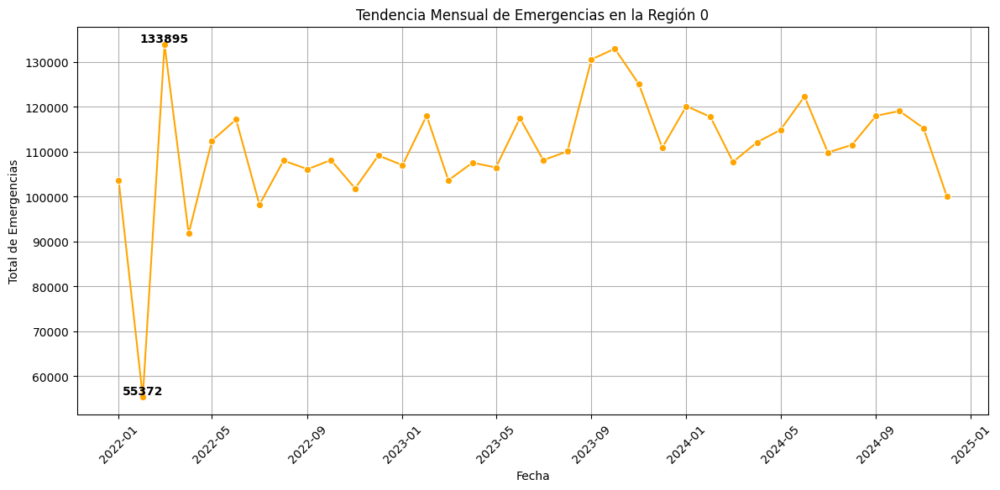

In [2]:
# Análisis de tendencia mensual
df_monthly = df_region_0.groupby(df_region_0['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 0")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


**Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 0**

El gráfico presenta la evolución del número total de emergencias atendidas mensualmente en la Región 0 entre 2022 y 2024. Se observan variaciones en la demanda, con picos y valles marcados, lo que puede estar relacionado con factores estacionales, epidemiológicos o administrativos.

Identificación de Picos y Valles

Pico más alto (133,895 emergencias en un mes)

Se observa un incremento brusco en la demanda hospitalaria en marzo de 2022.
Posibles causas:

Brotes epidemiológicos (COVID-19, influenza, dengue, etc.).
Eventos estacionales que aumentan la cantidad de accidentes o enfermedades respiratorias.

Mayor capacidad hospitalaria o cambios en la asignación de recursos.
Valle más bajo (55,372 emergencias en un mes)

Se detecta una caída pronunciada en febrero de 2022.

Posibles causas:

Reducción de servicios hospitalarios (huelgas médicas, cierre de unidades, reducción de camas).
Cambio en la derivación de pacientes a otras regiones.
Efectos de políticas de salud pública que redujeron la necesidad de atenciones de emergencia.

## **Región 1**

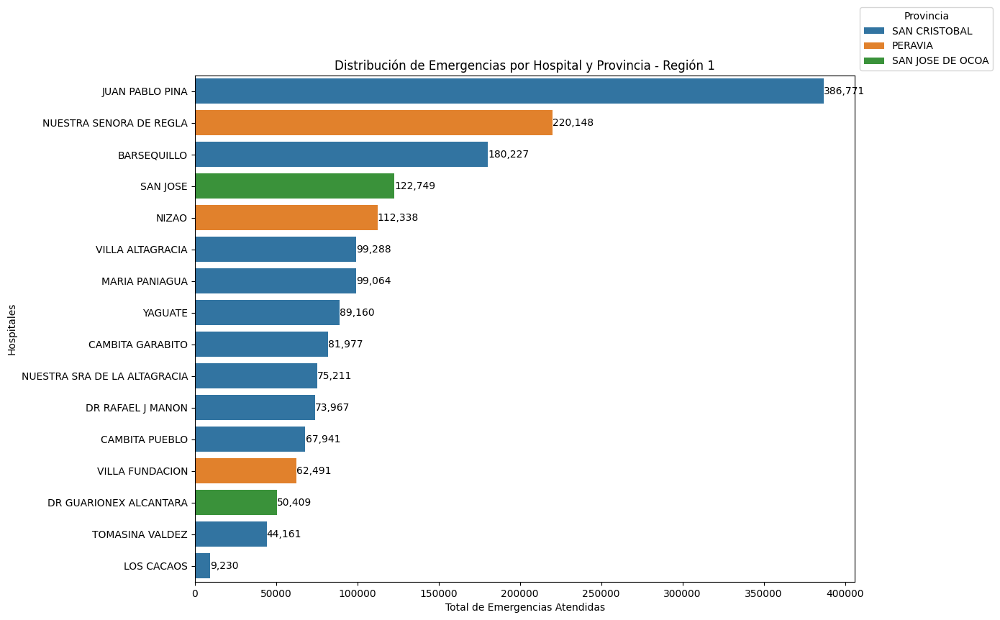

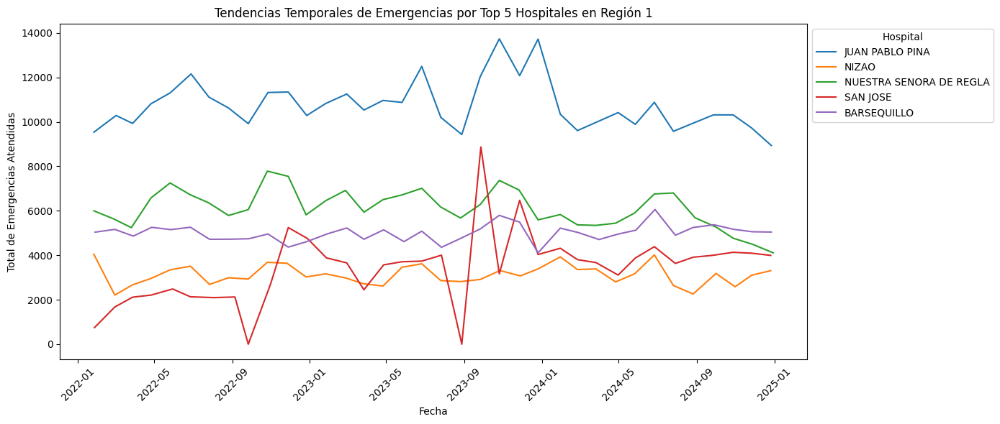

In [3]:

# Filtrar solo los datos de la Región 1
df_region_1 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 1"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_1 = df_region_1[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_1.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_1["Total_Ingresos"] = pd.to_numeric(df_region_1["Total_Ingresos"], errors="coerce")
df_region_1["Fecha"] = pd.to_datetime(df_region_1["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_1 = df_region_1[(df_region_1["Fecha"].dt.year >= 2022) & (df_region_1["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_1.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 1")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_1[df_region_1["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 1")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


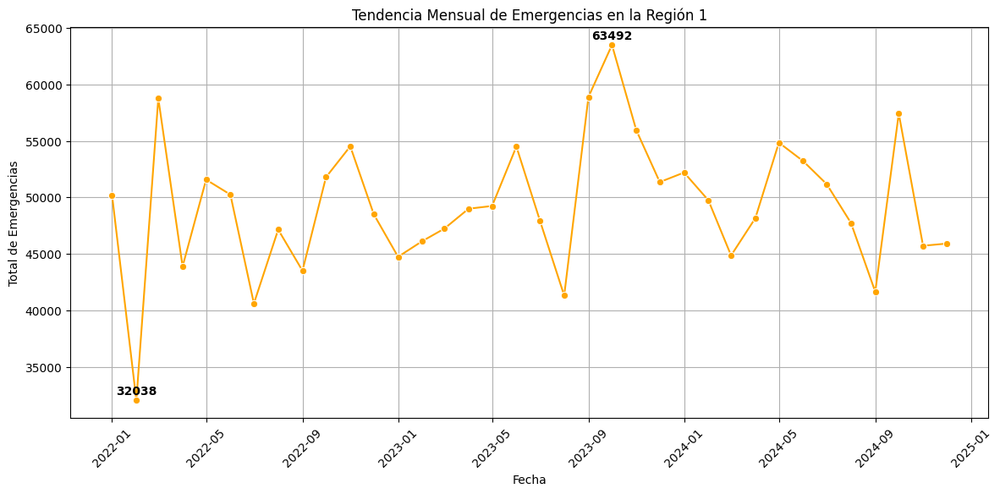

In [4]:
# Análisis de tendencia mensual
df_monthly = df_region_1.groupby(df_region_1['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 1")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 1

El gráfico representa la evolución del número de emergencias mensuales en la Región 1 entre 2022 y 2024. Se pueden identificar variaciones en la demanda hospitalaria, con picos y valles significativos, lo que sugiere la influencia de factores estacionales, administrativos o epidemiológicos.

Identificación de Picos y Valles
Pico más alto (63,492 emergencias en un mes - septiembre 2023)

Se observa un incremento notable en la cantidad de emergencias en septiembre de 2023.
Posibles causas:
Brotes de enfermedades respiratorias o infecciosas en esa época.
Aumento de accidentes u otros eventos que incrementan la demanda hospitalaria.
Mayor capacidad hospitalaria o reasignación de pacientes desde otras regiones.
Valle más bajo (32,038 emergencias en un mes - febrero 2022)

El número de emergencias cae de forma significativa en febrero de 2022.
Posibles causas:
Menor incidencia de enfermedades en ese periodo.
Restricciones en la atención hospitalaria debido a personal reducido o disponibilidad de camas.
Menos derivaciones de pacientes a hospitales de la región.

Interpretación General:
El comportamiento de los datos muestra fluctuaciones recurrentes, con ciertos picos estacionales que podrían estar asociados con factores epidemiológicos o administrativos.

Tendencias Generales
Aumento progresivo de emergencias en algunos periodos

Durante varios meses consecutivos, el número de emergencias se mantiene por encima de 50,000 casos.
Esto indica un patrón de alta demanda sostenida, lo que podría requerir ajustes en la planificación hospitalaria.
Descensos abruptos en ciertos meses

Se observan meses con caídas importantes en la cantidad de emergencias, lo que podría indicar:
Reducción en la incidencia de enfermedades estacionales.
Efectos de políticas de salud pública que disminuyen la carga hospitalaria.
Menos disponibilidad de recursos hospitalarios en esos meses.
Oscilaciones constantes en la demanda

No hay una tendencia claramente ascendente o descendente, sino más bien altibajos regulares, lo que sugiere que la carga hospitalaria no se distribuye de manera uniforme a lo largo del año.

Conclusión Final:
El gráfico refleja una demanda hospitalaria variable, con picos estacionales y fluctuaciones significativas en la Región 1. Para una mejor gestión, se recomienda un análisis más detallado de factores externos y el uso de modelos predictivos para anticipar necesidades hospitalarias.



## **Región 2**

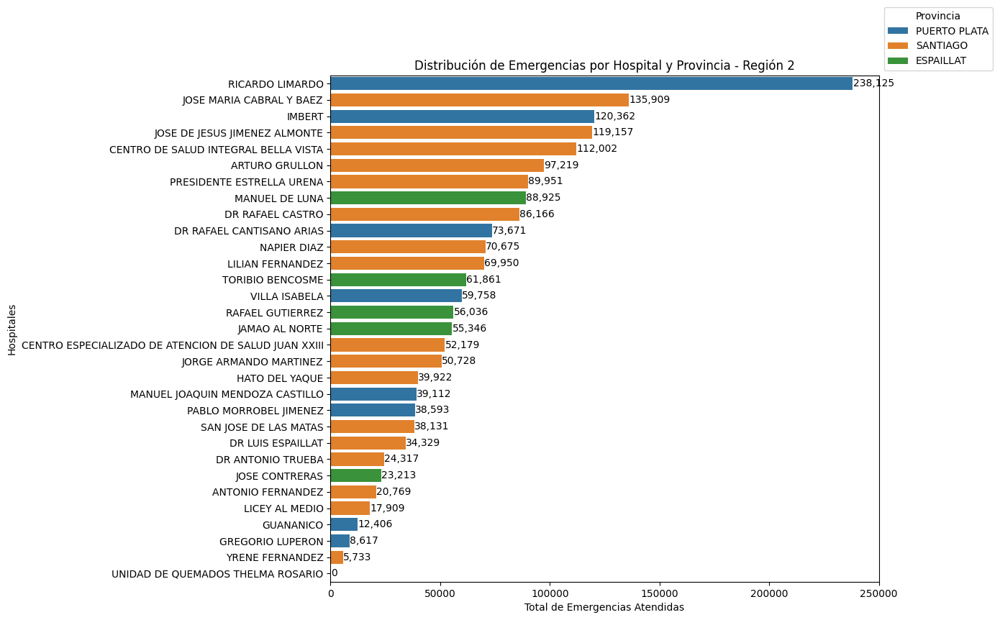

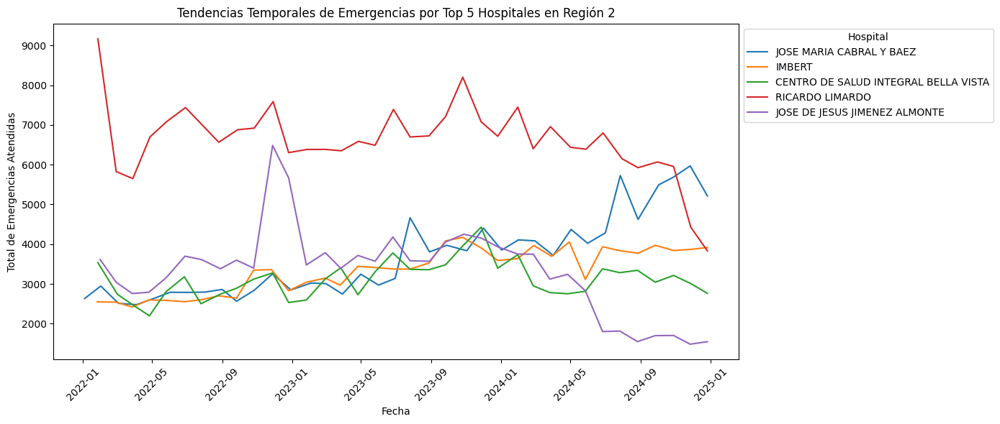

In [5]:
# Filtrar solo los datos de la Región 2
df_region_2 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 2"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_2 = df_region_2[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_2.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_2["Total_Ingresos"] = pd.to_numeric(df_region_2["Total_Ingresos"], errors="coerce")  # Se corrigió aquí
df_region_2["Fecha"] = pd.to_datetime(df_region_2["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_2 = df_region_2[(df_region_2["Fecha"].dt.year >= 2022) & (df_region_2["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_2.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 2")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_2[df_region_2["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 2")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 2

El gráfico muestra la cantidad total de emergencias atendidas en distintos hospitales de la Región 2, agrupados por provincia (Puerto Plata, Santiago y Espaillat). La distribución permite identificar los hospitales con la mayor y menor carga de emergencias, así como posibles factores que influyen en la demanda de atención.

Hospitales con Mayor Carga de Emergencias
Los hospitales con la mayor cantidad de emergencias en la Región 2 incluyen:

RICARDO LIMARDO (238,125 emergencias)

Es el hospital con el mayor volumen de emergencias en la región, lo que sugiere que:
Es un hospital de referencia en Puerto Plata.
Tiene una alta densidad poblacional en su área de influencia.
Podría recibir pacientes derivados de otros centros de menor capacidad.
JOSÉ MARÍA CABRAL Y BÁEZ (135,909 emergencias)

Se encuentra en Santiago y presenta una carga alta de emergencias.
Factores posibles:

Infraestructura con mayor capacidad.
Accesibilidad para pacientes de otras provincias cercanas.
Hospital universitario o especializado con más recursos.
IMBERT, JOSÉ DE JESÚS JIMÉNEZ ALMONTE y CENTRO DE SALUD INTEGRAL BELLA VISTA (más de 110,000 emergencias cada uno)

Son hospitales con volúmenes considerables de emergencias, lo que podría estar relacionado con:
Ubicación estratégica dentro de la provincia.
Especialización médica en ciertos tipos de atención.
Mayor accesibilidad para la población local.

Conclusión:
Los hospitales con más emergencias suelen estar en zonas urbanas densamente pobladas o ser centros de referencia dentro de la región.

Hospitales con Menor Cantidad de Emergencias
En la parte inferior del gráfico, algunos hospitales tienen una carga significativamente más baja, entre ellos:

GREGORIO LUPERÓN (8,617 emergencias)
YRENE FERNÁNDEZ (5,733 emergencias)
UNIDAD DE QUEMADOS THELMA ROSARIO (0 emergencias reportadas)

Interpretación:

Algunos hospitales pueden especializarse en servicios no críticos o en unidades con menos emergencias, como salud mental o rehabilitación.
También podrían enfrentar limitaciones en personal, equipamiento o infraestructura, lo que restringe su capacidad para recibir emergencias.
La movilidad de pacientes puede estar influyendo en estos números, derivándolos a hospitales de mayor capacidad.

Fluctuaciones en la Demanda por Provincia

El gráfico muestra diferencias en la carga de emergencias según la provincia:

Puerto Plata:

Alberga el hospital con más emergencias (Ricardo Limardo).
La provincia parece tener una red hospitalaria bien distribuida, con hospitales que manejan cargas significativas.
Santiago:

Tiene varios hospitales con alta carga de emergencias (José María Cabral y Báez, Arturo Grullón).
Esto sugiere que es un centro de referencia para otras provincias.
Espaillat:

Presenta una menor concentración de hospitales con alto volumen de emergencias.
Esto podría indicar que los pacientes deben trasladarse a otras provincias para recibir atención especializada.

Análisis Adicional:
Sería útil analizar si las diferencias en el número de emergencias por provincia se deben a:

Cantidad y tamaño de los hospitales en cada región.
Movilidad de pacientes hacia hospitales con mayor capacidad.
Disponibilidad de especialidades médicas en cada hospital.

Conclusión Final:

El análisis muestra una distribución desigual de emergencias entre hospitales y provincias, con algunos centros enfrentando sobrecarga asistencial. Para mejorar la planificación hospitalaria, sería clave analizar capacidad instalada, movilidad de pacientes y factores externos que influyen en la demanda.



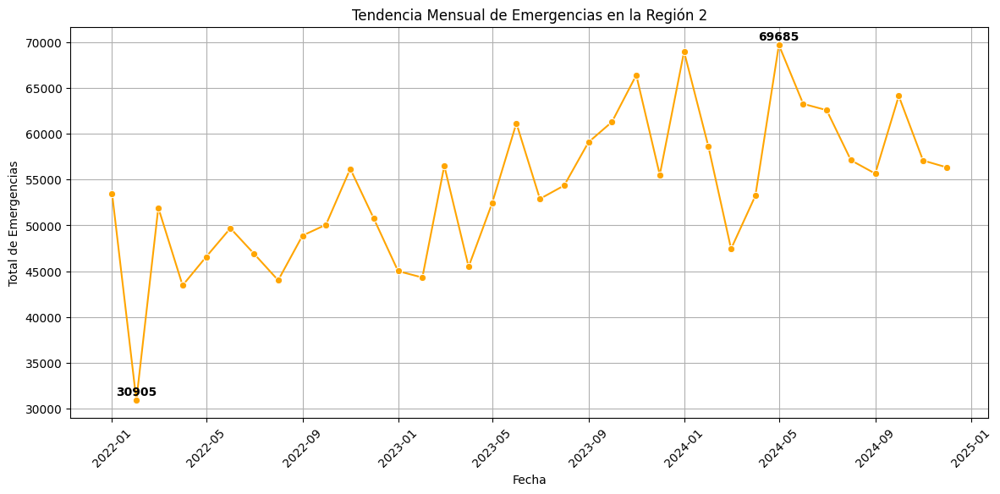

In [6]:
# Análisis de tendencia mensual
df_monthly = df_region_2.groupby(df_region_2['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 2")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 2

El gráfico muestra la evolución mensual del total de emergencias atendidas en la Región 2 desde 2022 hasta 2024. Se observan fluctuaciones significativas, con períodos de altas y bajas en la demanda de atención hospitalaria. Estos picos y valles pueden estar relacionados con factores estacionales, epidemiológicos o administrativos.

Identificación de Picos y Valles
Pico más alto (69,685 emergencias - mayo 2024)

Este mes experimenta el mayor número de emergencias en la Región 2.
Posibles causas:
Brote de enfermedades infecciosas en ese período.
Aumento de accidentes de tránsito por factores climáticos o eventos especiales.
Mayor flujo de pacientes por derivaciones de otros hospitales.
Valle más bajo (30,905 emergencias - febrero 2022)

Se registra una caída significativa en la demanda de emergencias.
Posibles causas:
Menor incidencia de enfermedades en ese periodo del año.
Cierre temporal de unidades hospitalarias o disminución en la capacidad de atención.
Disminución de accidentes o eventos críticos.

Interpretación General:
Los datos reflejan un comportamiento cíclico, con picos recurrentes en ciertos meses del año. Esto sugiere que hay factores estacionales o eventos específicos que impulsan la demanda hospitalaria en ciertos periodos.

Comportamiento General y Tendencias
Crecimiento en la Demanda de Emergencias

Se observa un aumento progresivo en el total de emergencias a lo largo del tiempo.
Esto podría indicar una mayor carga sobre el sistema hospitalario, lo que puede requerir una mejor gestión de recursos médicos.
Oscilaciones Periódicas

La cantidad de emergencias no se mantiene estable, sino que sube y baja en ciertos meses.
Esto sugiere que hay patrones estacionales o eventos externos que afectan la demanda.
Tendencia Alcista en 2023 y 2024

Desde mediados de 2023 hasta 2024, se observan niveles más altos de emergencias en comparación con 2022.
Posibles factores:
Crecimiento poblacional en la región.
Mayor acceso a servicios hospitalarios.
Factores epidemiológicos que aumentaron la cantidad de pacientes.

Recomendación:
Sería útil cruzar estos datos con información externa, como:

Condiciones climáticas (temperatura y lluvias pueden influir en enfermedades respiratorias o accidentes).
Eventos de salud pública (brotes de enfermedades estacionales, epidemias).
Datos de movilidad y accidentes viales.

Recomendaciones y Próximos Pasos
Para optimizar la gestión hospitalaria en la Región 2, se pueden tomar las siguientes medidas:

Predicción de la Demanda

Implementar modelos de predicción (ARIMA, Prophet) para anticipar futuras variaciones en la demanda hospitalaria.
Optimización de Recursos

Ajustar la distribución del personal y equipamiento en función de los meses de mayor demanda.
Implementar estrategias de prevención en salud pública para reducir la carga hospitalaria en picos críticos.
Evaluación de Factores Externos

Cruzar los datos con variables como:
Tendencias en enfermedades estacionales (dengue, gripe, COVID-19).
Eventos o festividades que puedan influir en el aumento de accidentes o emergencias.
Disponibilidad y distribución de infraestructura hospitalaria.

Conclusión Final:
El gráfico refleja una tendencia creciente en la demanda hospitalaria en la Región 2, con fluctuaciones cíclicas que pueden estar influenciadas por factores estacionales, epidemiológicos y administrativos. Para mejorar la gestión hospitalaria, se recomienda realizar un análisis más profundo de las causas de los picos y valles y anticipar la demanda futura mediante modelos de predicción.



## **Región 3**

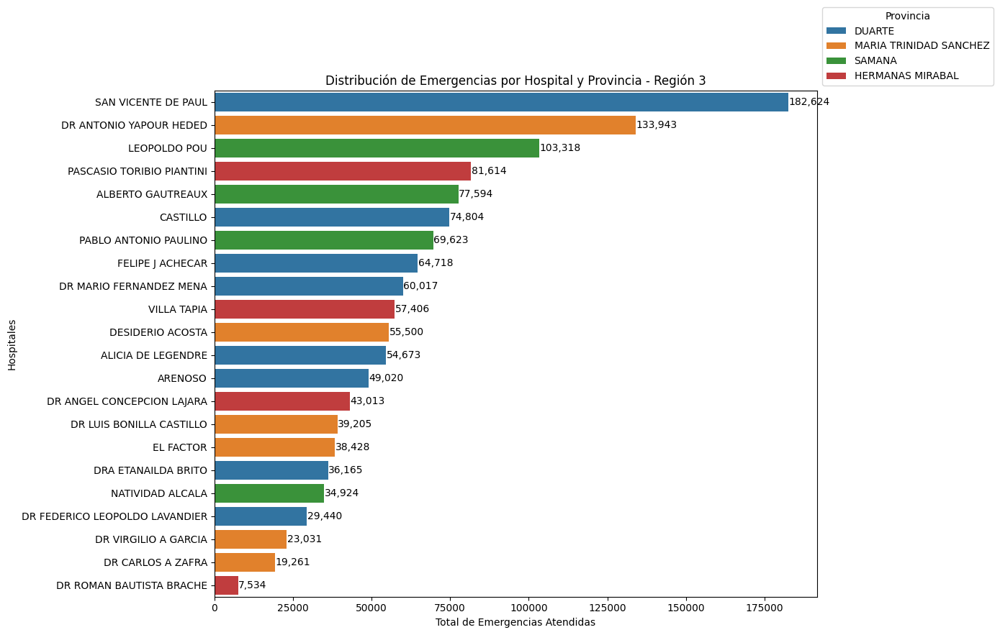

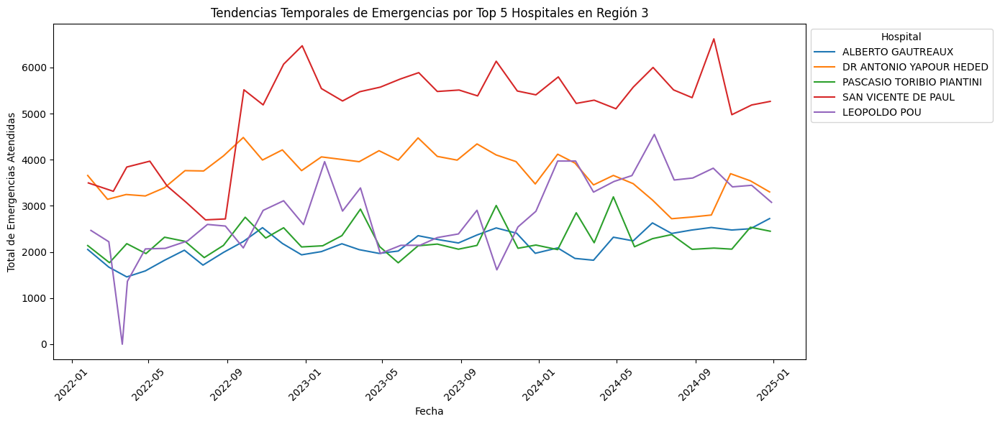

In [7]:
# Filtrar solo los datos de la Región 3
df_region_3 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 3"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_3 = df_region_3[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_3.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_3["Total_Ingresos"] = pd.to_numeric(df_region_3["Total_Ingresos"], errors="coerce")
df_region_3["Fecha"] = pd.to_datetime(df_region_3["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_3 = df_region_3[(df_region_3["Fecha"].dt.year >= 2022) & (df_region_3["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_3.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 3")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_3[df_region_3["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 3")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 3

El gráfico muestra la cantidad total de emergencias atendidas en distintos hospitales de la Región 3, agrupados por provincia (Duarte, María Trinidad Sánchez, Samaná y Hermanas Mirabal). La distribución permite identificar los hospitales con la mayor y menor carga de emergencias, así como posibles factores que influyen en la demanda de atención.

Hospitales con Mayor Carga de Emergencias
Los hospitales con mayor cantidad de emergencias en la Región 3 incluyen:

San Vicente de Paul (182,624 emergencias)

Es el hospital con el mayor volumen de emergencias en la región.
Podría ser un hospital de referencia en Duarte.
Posible alta densidad poblacional en su área de influencia.
Puede recibir pacientes derivados de hospitales con menor capacidad.
Dr. Antonio Yapor Heded (133,943 emergencias)

Localizado en María Trinidad Sánchez.
Infraestructura con mayor capacidad.
Accesibilidad para pacientes de provincias cercanas.
Podría ser un hospital especializado con más recursos.
Leopoldo Pou (103,318 emergencias)

Ubicado en Samaná.
Alto volumen de emergencias, lo que sugiere un papel clave en la región.
Puede atender tanto a la población local como a turistas y visitantes.
Pascasio Toribio Piantini (81,614 emergencias)

Hospital en Hermanas Mirabal con una carga considerable.
Podría influir su ubicación estratégica dentro de la provincia.
Alberto Gautreaux (77,594 emergencias)

También en Samaná, lo que indica que esta provincia tiene varios centros con alta demanda.

Conclusión:
Los hospitales con más emergencias suelen estar en zonas urbanas densamente pobladas o ser centros de referencia dentro de la región. En este caso, Duarte, María Trinidad Sánchez y Samaná concentran la mayor cantidad de emergencias atendidas.



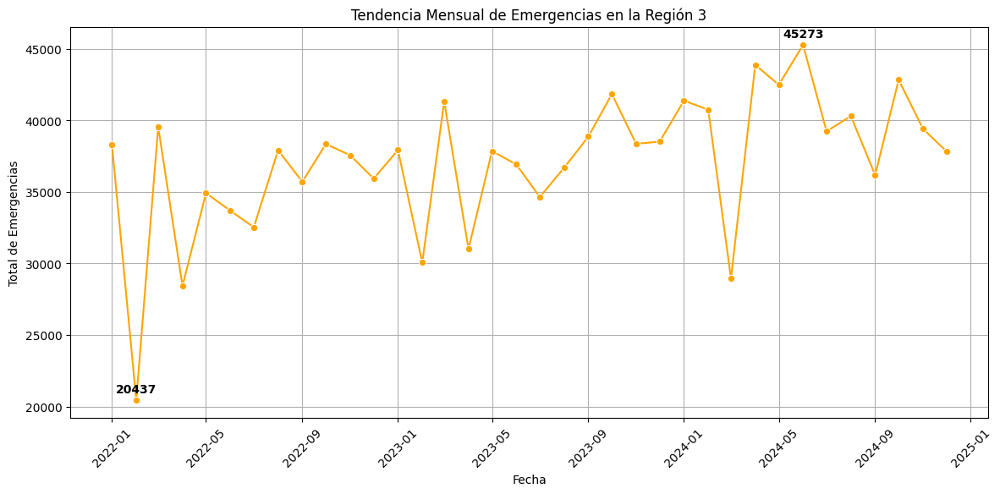

In [8]:
# Análisis de tendencia mensual
df_monthly = df_region_3.groupby(df_region_3['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 3")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 3
El gráfico muestra la evolución mensual del total de emergencias atendidas en la Región 3 desde enero de 2022 hasta finales de 2024. La serie de datos presenta fluctuaciones, con picos y valles que reflejan cambios en la demanda de emergencias hospitalarias en distintos meses.

Observaciones Claves
Mínimo y Máximo

El mes con menor número de emergencias ocurrió en febrero de 2022, con 20,437 emergencias.
El mes con mayor número de emergencias fue en mayo de 2024, con 45,273 emergencias.
Patrón de Variación

Se observan fluctuaciones mensuales en la cantidad de emergencias, con descensos pronunciados seguidos de incrementos rápidos.
Se destacan varios picos de atención, indicando momentos de alta demanda en el sistema hospitalario.
En algunos puntos, se presentan descensos drásticos, lo que podría estar relacionado con factores como:
Cambios estacionales (ej., disminución de enfermedades respiratorias en ciertos meses).
Eventos sanitarios específicos (brotes epidemiológicos, crisis hospitalarias, huelgas médicas).
Factores externos como desastres naturales o variaciones en la movilidad de la población.
Tendencia General

Aunque hay altibajos, la tendencia general parece moderadamente ascendente, lo que sugiere un aumento gradual en la cantidad de emergencias atendidas con el tiempo.
Este incremento podría estar relacionado con factores como crecimiento poblacional, mayor acceso a los servicios de emergencia o un aumento en la ocurrencia de eventos críticos.
Posibles Factores Explicativos
Factores Estacionales

La demanda de emergencias suele variar según la época del año. Por ejemplo, los picos en algunos meses pueden estar relacionados con brotes de enfermedades respiratorias o aumentos de accidentes en temporadas vacacionales.
Eventos Excepcionales

Si hubo crisis sanitarias, pandemias o desastres naturales, estos pueden haber influido en los meses de mayor actividad.
Posibles huelgas del personal de salud o falta de insumos pueden haber impactado la disponibilidad de atención en ciertos períodos.
Crecimiento de la Población o Cambios en la Infraestructura Sanitaria

El incremento en la cantidad de emergencias atendidas puede ser reflejo de un aumento en la población o mejoras en la cobertura y acceso a los servicios de salud.

Recomendaciones para un Análisis Más Profundo
Para entender mejor estas fluctuaciones y su impacto en la planificación hospitalaria, se pueden realizar los siguientes análisis adicionales:

Comparación por Años

Comparar la cantidad de emergencias por año para verificar si el aumento es progresivo o si hay anomalías en años específicos.
Análisis de Temporadas

Evaluar si los meses de mayor demanda coinciden con épocas de mayor circulación de enfermedades o períodos vacacionales.
Cruce con Variables Externas

Analizar si estos cambios están correlacionados con factores externos como brotes epidemiológicos, desastres naturales o eventos locales.
Evaluación de la Capacidad Hospitalaria

Determinar si los hospitales tienen la infraestructura necesaria para manejar los períodos de alta demanda.
Conclusión
El análisis de la tendencia mensual de emergencias en la Región 3 muestra altibajos marcados, con períodos de gran afluencia y momentos de disminución considerable. La tendencia general sugiere un ligero aumento en la demanda de emergencias con el tiempo. Para una mejor planificación, sería clave analizar los factores que impulsan estos cambios y preparar los hospitales para afrontar los períodos de mayor presión asistencial.

## **Región 4**

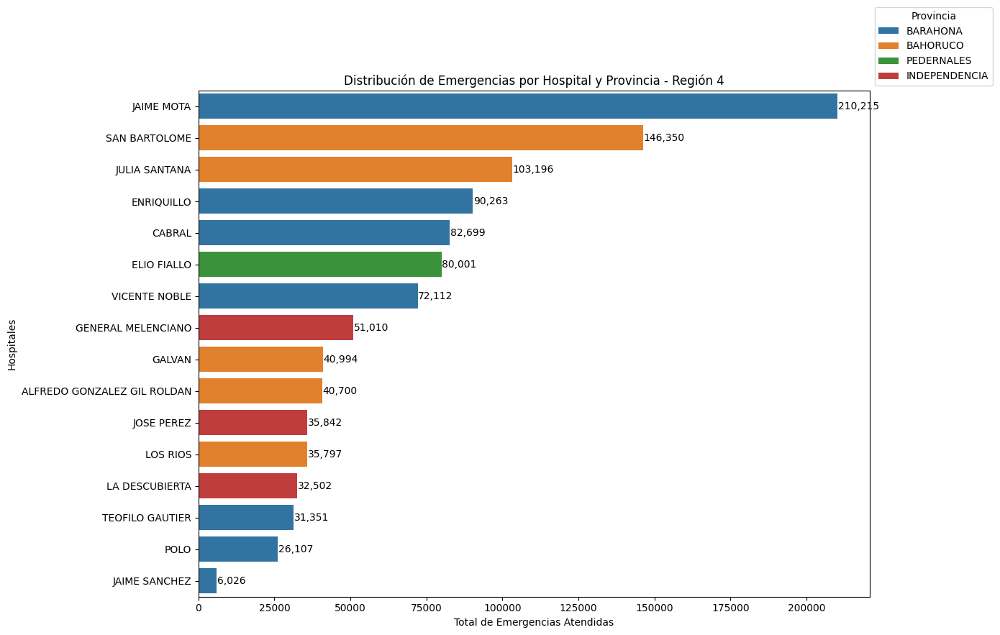

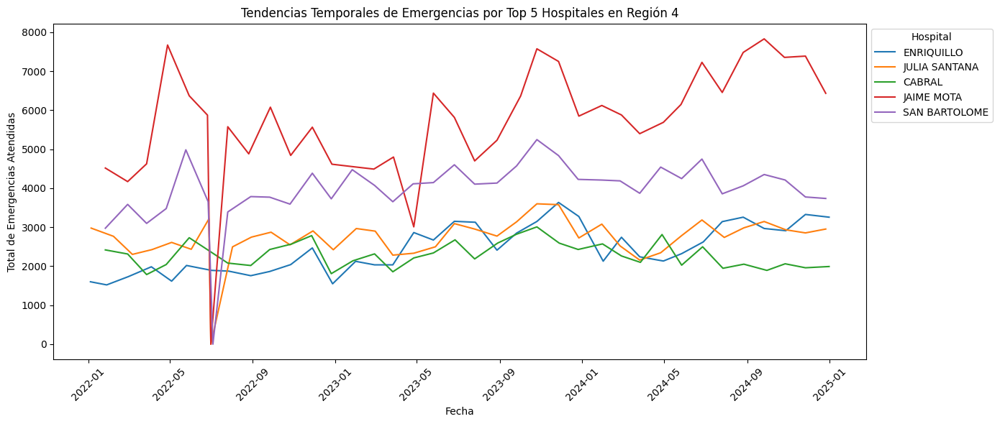

In [9]:
# Filtrar solo los datos de la Región 4
df_region_4 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 4"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_4 = df_region_4[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_4.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_4["Total_Ingresos"] = pd.to_numeric(df_region_4["Total_Ingresos"], errors="coerce")
df_region_4["Fecha"] = pd.to_datetime(df_region_4["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_4 = df_region_4[(df_region_4["Fecha"].dt.year >= 2022) & (df_region_4["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_4.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 4")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_4[df_region_4["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 4")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 4
El gráfico muestra la cantidad total de emergencias atendidas en distintos hospitales de la Región 4, agrupados por provincia (Barahona, Bahoruco, Pedernales e Independencia). Esto permite identificar los hospitales con mayor y menor carga de emergencias, así como posibles factores que influyen en la demanda de atención.

Hospitales con Mayor Carga de Emergencias
Los hospitales con mayor cantidad de emergencias en la Región 4 incluyen:

Jaime Mota (210,215 emergencias)

Es el hospital con mayor volumen de emergencias en la región.
Ubicado en Barahona, una provincia con una infraestructura hospitalaria más consolidada.
Posible hospital de referencia en la región, recibiendo pacientes de provincias vecinas.
Puede estar influenciado por una alta densidad poblacional o movilidad de pacientes desde áreas rurales.
San Bartolomé (146,350 emergencias)

Ubicado en Bahoruco, presenta un volumen alto de emergencias.
Esto sugiere que es un hospital clave en su provincia, absorbiendo una gran parte de los casos urgentes.
Puede estar relacionado con la accesibilidad del hospital para varias comunidades aledañas.
Julia Santana (103,196 emergencias)

También en Bahoruco, lo que indica que la provincia tiene dos hospitales con alta demanda.
Su posición en el ranking sugiere que es un punto estratégico de atención médica en la zona.
Enriquillo (90,263 emergencias)

Hospital de Barahona con una carga considerable.
Posiblemente atiende tanto a residentes de la provincia como a poblaciones vecinas.
Cabral (82,699 emergencias)

Otro hospital importante de Barahona, que muestra una red hospitalaria bien distribuida en la provincia.
Conclusión:
Los hospitales con mayor carga de emergencias se concentran en Barahona y Bahoruco, lo que sugiere que estas provincias tienen una mayor densidad poblacional o funcionan como centros de referencia en la región.

Hospitales con Menor Cantidad de Emergencias
Los hospitales con menor carga de emergencias incluyen:

Jaime Sánchez (6,026 emergencias)

Es el hospital con menor número de emergencias registradas en la región.
Podría deberse a su especialización en servicios no urgentes o a limitaciones de infraestructura.
Polo (26,107 emergencias)

Comparado con los hospitales principales, su volumen es relativamente bajo.
Puede estar localizado en una zona menos poblada.
Teófilo Gautier (31,351 emergencias)

También en la parte baja de la lista, lo que indica que su capacidad de atención de emergencias es menor.
La Descubierta (32,502 emergencias)

Hospital en la provincia de Independencia con menor demanda relativa.
Puede ser un hospital secundario o enfocado en otro tipo de servicios médicos.
Interpretación:
Algunos hospitales pueden especializarse en atención ambulatoria o salud preventiva, lo que reduce la cantidad de emergencias atendidas.
También podrían enfrentar limitaciones en personal o equipamiento, lo que restringe su capacidad operativa.
La movilidad de pacientes puede estar jugando un papel importante, con personas trasladándose a hospitales de mayor capacidad en Barahona y Bahoruco.
Fluctuaciones en la Demanda por Provincia
El gráfico sugiere que la carga de emergencias varía entre provincias:

Barahona:

Alberga el hospital con más emergencias (Jaime Mota).
Parece ser el centro hospitalario más importante de la región.
También cuenta con otros hospitales relevantes, como Enriquillo y Cabral.
Bahoruco:

Tiene dos hospitales con alta carga (San Bartolomé y Julia Santana).
Indica que la provincia cuenta con infraestructura hospitalaria relevante.
Pedernales:

Presenta un solo hospital destacado (Elio Fiallo con 80,001 emergencias).
Su volumen de emergencias es considerablemente menor que en Barahona y Bahoruco.
Independencia:

Cuenta con hospitales con menor carga asistencial.
Esto podría indicar una menor densidad poblacional o falta de especialización en emergencias.

Conclusión Final
El análisis de la distribución de emergencias en la Región 4 muestra que la mayor carga recae en los hospitales de Barahona y Bahoruco, con Jaime Mota como el principal centro de atención. En contraste, los hospitales de Independencia y Pedernales tienen menor volumen de emergencias. Para mejorar la eficiencia hospitalaria en la región, se recomienda evaluar la capacidad instalada, movilidad de pacientes y factores externos que influyen en la demanda.

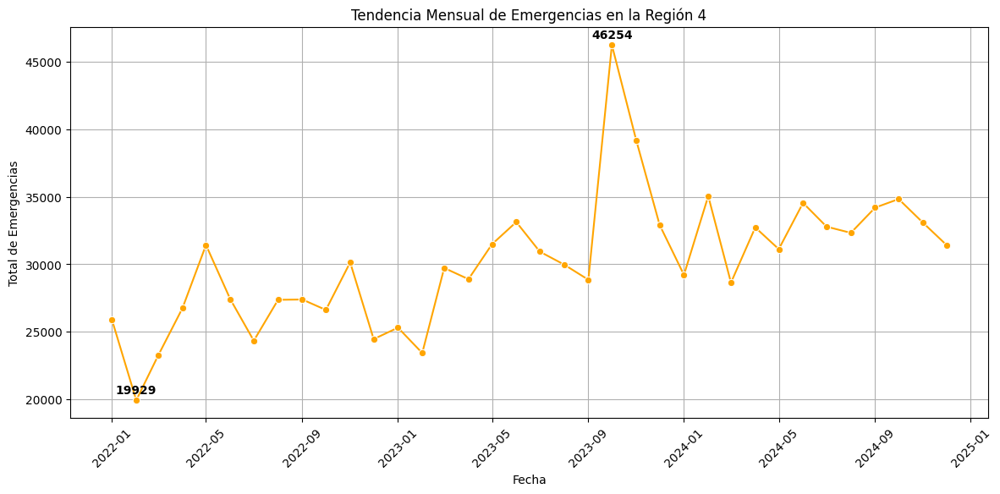

In [10]:
# Análisis de tendencia mensual
df_monthly = df_region_4.groupby(df_region_4['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 4")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 4
El gráfico muestra la evolución mensual del número de emergencias atendidas en la Región 4 entre enero de 2022 y finales de 2024. Se observan fluctuaciones significativas, con algunos meses registrando un mayor número de emergencias y otros mostrando caídas pronunciadas.

Observaciones Claves
Mínimo y Máximo

El mes con menor número de emergencias ocurrió en enero de 2022, con 19,929 emergencias.
El mes con mayor número de emergencias fue en septiembre de 2023, con 46,254 emergencias.
Variabilidad Mensual

Se observa una tendencia fluctuante, con picos y descensos recurrentes.
Algunos periodos tienen caídas abruptas, seguidas de rápidas recuperaciones.
Los aumentos bruscos en emergencias pueden estar relacionados con factores externos como brotes epidemiológicos, accidentes masivos o problemas en la red hospitalaria.
Tendencia General

Aunque el comportamiento mensual es irregular, la tendencia general es estable, con un promedio de emergencias que parece mantenerse entre 25,000 y 35,000 emergencias mensuales.
Sin embargo, el pico de septiembre de 2023 y la caída de enero de 2022 son eventos atípicos que podrían necesitar un análisis más detallado.

Posibles Factores Explicativos
Factores Estacionales

Algunos meses presentan incrementos, posiblemente relacionados con:
Brotes de enfermedades respiratorias en invierno.
Mayor número de accidentes en temporadas festivas o vacacionales.
Cambios en la movilidad de la población.
Eventos Excepcionales

El pico de septiembre de 2023 (46,254 emergencias) podría deberse a un evento inusual como:

Aumento de casos de una enfermedad epidémica.
Fenómeno meteorológico extremo (huracanes, inundaciones) que incrementó la necesidad de atención médica.
Colapso en otros centros de salud, lo que obligó a hospitales de la Región 4 a recibir más pacientes.
La caída de enero de 2022 (19,929 emergencias) puede estar relacionada con:

Reducción en el acceso a hospitales (huelgas, falta de personal).
Menor movilidad de pacientes en periodos festivos.
Infraestructura y Movilidad de Pacientes

Las fluctuaciones pueden estar vinculadas a la capacidad hospitalaria:
Algunos hospitales pueden haber estado sobrecargados en ciertos meses.
La derivación de pacientes entre hospitales podría explicar la variabilidad.

Conclusión Final
El análisis muestra que la tendencia mensual de emergencias en la Región 4 es altamente variable, con algunos meses presentando incrementos drásticos y otros con reducciones notables. La estabilidad en el promedio de emergencias sugiere que la capacidad de atención se ha mantenido relativamente constante, pero ciertos picos extremos pueden requerir una evaluación más detallada.

Para mejorar la planificación hospitalaria en la Región 4, sería útil identificar si las variaciones están relacionadas con factores estacionales, eventos externos o capacidad hospitalaria.

## **Región 5**

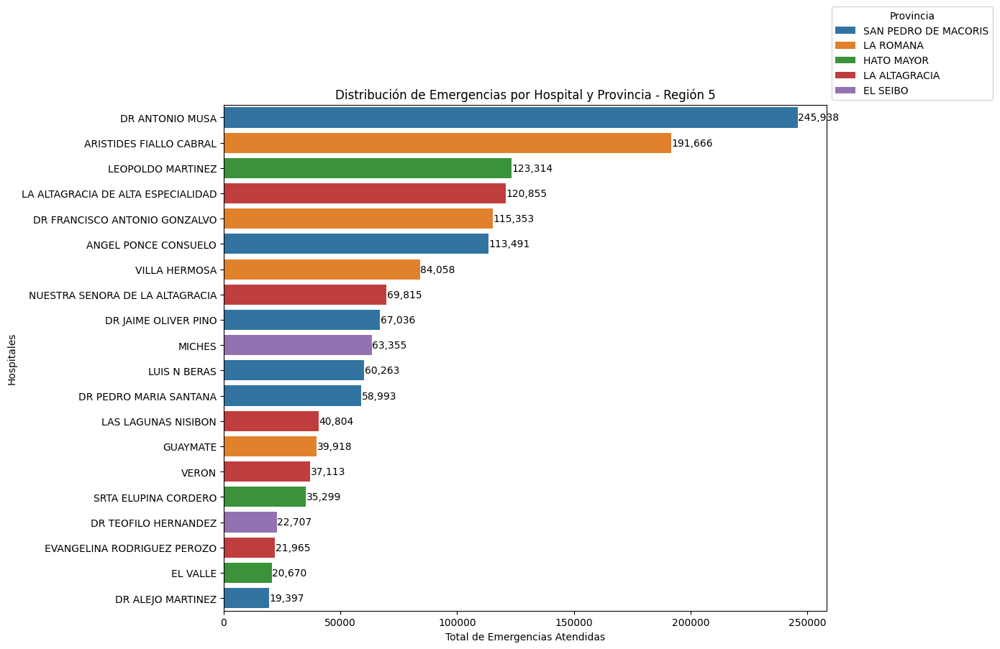

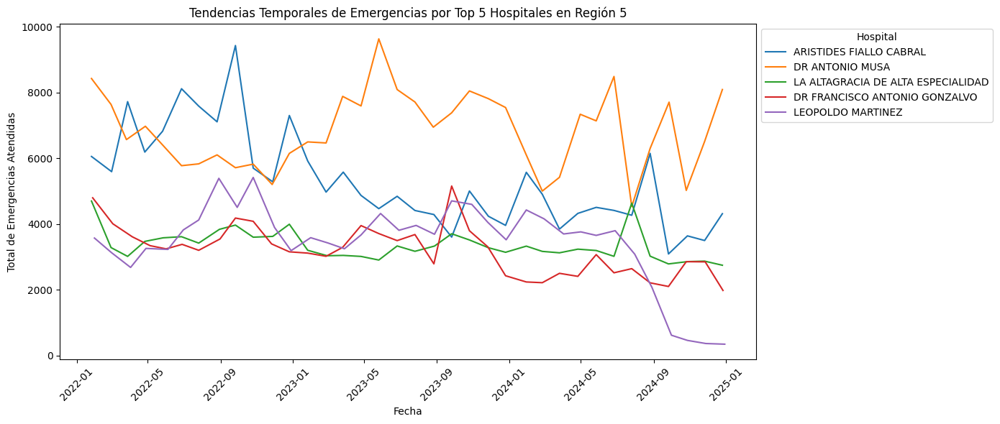

In [11]:
# Filtrar solo los datos de la Región 5
df_region_5 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 5"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_5 = df_region_5[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_5.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_5["Total_Ingresos"] = pd.to_numeric(df_region_5["Total_Ingresos"], errors="coerce")
df_region_5["Fecha"] = pd.to_datetime(df_region_5["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_5 = df_region_5[(df_region_5["Fecha"].dt.year >= 2022) & (df_region_5["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_5.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 5")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_5[df_region_5["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 5")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 5
El gráfico muestra la cantidad total de emergencias atendidas en distintos hospitales de la Región 5, agrupados por provincia (San Pedro de Macorís, La Romana, Hato Mayor, La Altagracia y El Seibo). Este análisis permite identificar los hospitales con la mayor y menor carga de emergencias y posibles factores que influyen en la demanda de atención médica.

Hospitales con Mayor Carga de Emergencias
Los hospitales con mayor número de emergencias en la Región 5 incluyen:

Dr. Antonio Musa (245,988 emergencias)

Es el hospital con mayor volumen de emergencias en la región.
Ubicado en San Pedro de Macorís, lo que sugiere que es un hospital de referencia.
Es posible que reciba pacientes de otras provincias cercanas debido a su mayor capacidad instalada.
Aristides Fiallo Cabral (191,666 emergencias)

Ubicado en La Romana, este hospital también tiene un volumen alto de emergencias.
Puede estar atendiendo una gran cantidad de población y posiblemente casos turísticos.
Leopoldo Martínez (123,314 emergencias)

Localizado en Hato Mayor, lo que indica que esta provincia también cuenta con un hospital con alta demanda.
La Altagracia de Alta Especialidad (120,855 emergencias)

Hospital clave en La Altagracia, lo que indica que la provincia tiene una infraestructura relevante en salud.
Dr. Francisco Antonio Gonzalvo (115,353 emergencias)

También en La Romana, lo que sugiere que esta provincia cuenta con múltiples hospitales de gran capacidad.
Conclusión:
Los hospitales con mayor carga de emergencias se encuentran en San Pedro de Macorís, La Romana y Hato Mayor, lo que indica que estas provincias podrían tener una mayor densidad poblacional, mayor accesibilidad o ser centros de referencia para la región.

Hospitales con Menor Cantidad de Emergencias
Los hospitales con menor carga de emergencias incluyen:

Dr. Alejo Martínez (19,397 emergencias)

Es el hospital con menor número de emergencias reportadas en la región.
Puede deberse a su especialización en otros servicios o a limitaciones de infraestructura.
El Valle (20,670 emergencias)

También muestra un volumen bajo en comparación con los hospitales principales.
Evangelina Rodríguez Perozo (21,965 emergencias)

Indica una demanda menor, lo que podría deberse a menor población en la zona o especialización del hospital.
Dr. Teófilo Hernández (22,707 emergencias)

Hospital de menor volumen en comparación con los principales.
Srta. Elupina Cordero (35,299 emergencias)

Aunque tiene un mayor volumen que los anteriores, sigue estando entre los hospitales con menos emergencias en la región.

Diferencias en la Demanda de Emergencias por Provincia
El gráfico sugiere que la distribución de emergencias varía según la provincia:

San Pedro de Macorís:

Alberga el hospital con más emergencias (Dr. Antonio Musa).
Parece ser el centro hospitalario más importante de la región.
La Romana:

Presenta dos hospitales con alta carga (Aristides Fiallo Cabral y Dr. Francisco Antonio Gonzalvo).
Esto sugiere que la provincia tiene una infraestructura hospitalaria fuerte.
Hato Mayor:

Leopoldo Martínez tiene una carga considerable, lo que indica que la provincia tiene un papel importante en la red de atención de la región.
La Altagracia:

La Altagracia de Alta Especialidad maneja una gran cantidad de emergencias, posiblemente por la afluencia de turistas y residentes.
El Seibo:

Miches (63,355 emergencias) es el hospital con mayor demanda en la provincia.


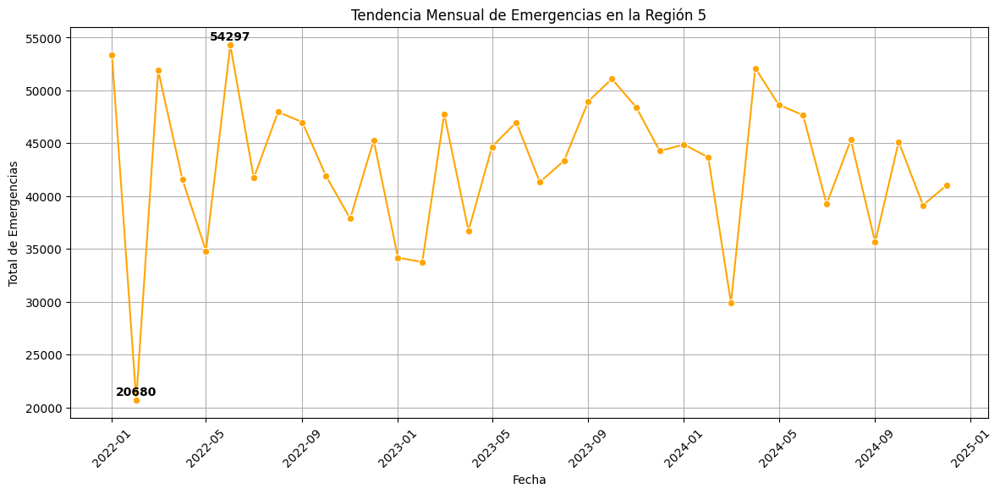

In [12]:
# Análisis de tendencia mensual
df_monthly = df_region_5.groupby(df_region_5['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 5")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 5
El gráfico muestra la evolución mensual del total de emergencias atendidas en la Región 5 desde enero de 2022 hasta finales de 2024. La serie de datos presenta variaciones significativas, con picos y caídas que reflejan cambios en la demanda de emergencias hospitalarias.


Mínimo y Máximo

El mes con menor número de emergencias ocurrió en enero de 2022, con 20,680 emergencias.
El mes con mayor número de emergencias fue en mayo de 2022, con 54,297 emergencias.
Patrón de Variación

La serie presenta altibajos notables, con algunas caídas abruptas seguidas de rápidas recuperaciones.

Se observan varios picos de atención, indicando momentos de alta demanda en los hospitales de la región.

En varios momentos hay descensos pronunciados, posiblemente por:
Cambios estacionales en enfermedades.
Eventos externos que afectaron la afluencia de pacientes (clima, movilidad, pandemia).

Problemas en la infraestructura hospitalaria o huelgas médicas.

Tendencia General

Aunque hay fluctuaciones mensuales, la tendencia muestra un comportamiento relativamente estable entre 35,000 y 50,000 emergencias mensuales en la mayor parte del período.
Se observa un pico atípico en mayo de 2022, seguido de una caída, lo que podría estar relacionado con un evento sanitario excepcional.

Conclusión Final
El análisis de la tendencia mensual de emergencias en la Región 5 muestra variaciones significativas, con algunos meses registrando altos picos y caídas abruptas. El comportamiento general sugiere una demanda estable, pero con eventos atípicos que podrían estar relacionados con factores estacionales o problemas en la infraestructura hospitalaria.

Para mejorar la planificación hospitalaria en la Región 5, sería clave identificar las causas detrás de las fluctuaciones y evaluar la capacidad hospitalaria en los meses de mayor presión asistencial.


## **Región 6**

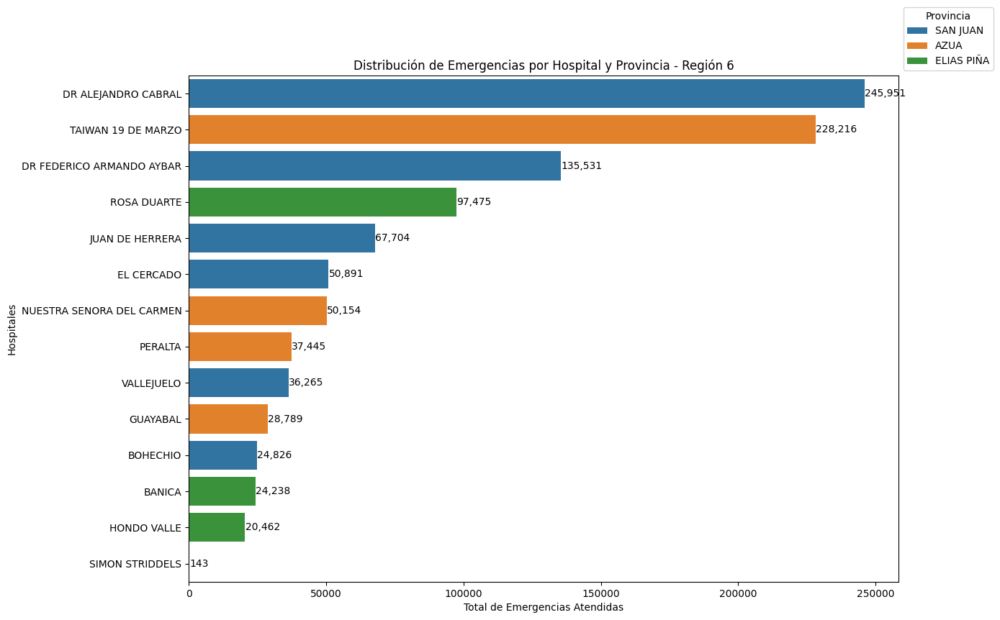

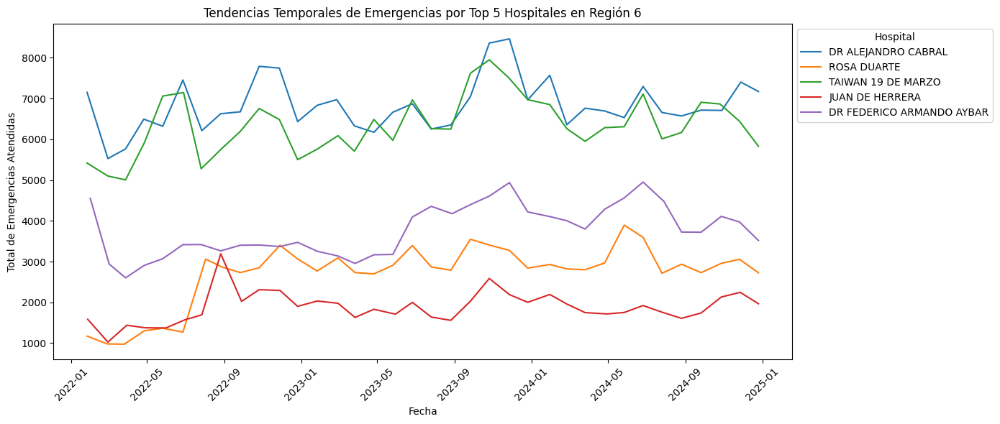

In [13]:
# Filtrar solo los datos de la Región 6
df_region_6 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 6"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_6 = df_region_6[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_6.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_6["Total_Ingresos"] = pd.to_numeric(df_region_6["Total_Ingresos"], errors="coerce")
df_region_6["Fecha"] = pd.to_datetime(df_region_6["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_6 = df_region_6[(df_region_6["Fecha"].dt.year >= 2022) & (df_region_6["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_6.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 6")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_6[df_region_6["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 6")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 6
El gráfico muestra la cantidad total de emergencias atendidas en distintos hospitales de la Región 6, agrupados por provincia (San Juan, Azua y Elías Piña). Este análisis permite identificar los hospitales con la mayor y menor carga de emergencias y posibles factores que influyen en la demanda de atención médica.
Hospitales con Mayor Carga de Emergencias
Los hospitales con mayor número de emergencias en la Región 6 incluyen:

Dr. Alejandro Cabral (245,951 emergencias)

Es el hospital con mayor volumen de emergencias en la región.
Ubicado en San Juan, lo que sugiere que es un hospital de referencia.
Es posible que reciba pacientes de otras provincias cercanas debido a su mayor capacidad instalada.
Taiwán 19 de Marzo (228,216 emergencias)

Ubicado en Azua, con un volumen alto de emergencias.
Puede estar atendiendo a una gran cantidad de población y posiblemente casos derivados de áreas rurales.
Dr. Federico Armando Aybar (135,531 emergencias)

Localizado en San Juan, indicando que esta provincia cuenta con más de un hospital de alta demanda.
Rosa Duarte (97,475 emergencias)

Ubicado en Elías Piña, siendo el hospital con mayor carga de emergencias de la provincia.
Juan de Herrera (67,704 emergencias)

También en San Juan, lo que refuerza la idea de que esta provincia tiene un papel importante en la red de atención de la región.
Conclusión:
Los hospitales con mayor carga de emergencias se encuentran en San Juan y Azua, lo que indica que estas provincias podrían tener una mayor densidad poblacional, mejor infraestructura hospitalaria o ser centros de referencia para la región.

Hospitales con Menor Cantidad de Emergencias
Los hospitales con menor carga de emergencias incluyen:

Simón Striddels (143 emergencias)

Es el hospital con menor número de emergencias reportadas en la región.
Puede deberse a su especialización en otros servicios o a limitaciones de infraestructura.
Hondo Valle (20,462 emergencias)

También muestra un volumen bajo en comparación con los hospitales principales.
Bánica (24,238 emergencias)

Indica una demanda menor, lo que podría deberse a menor población en la zona o especialización del hospital.
Bohechío (24,826 emergencias)

Hospital de menor volumen en comparación con los principales.
Guayabal (28,789 emergencias)

Aunque tiene un mayor volumen que los anteriores, sigue estando entre los hospitales con menos emergencias en la región.
Interpretación:
Algunos hospitales podrían estar especializados en atención ambulatoria o en otras áreas médicas diferentes a emergencias.
Limitaciones en personal, equipamiento o capacidad hospitalaria pueden influir en la baja carga de emergencias.
Pacientes pueden estar trasladándose a hospitales más grandes o mejor equipados dentro de la región.
Diferencias en la Demanda de Emergencias por Provincia
El gráfico sugiere que la distribución de emergencias varía según la provincia:

San Juan:

Alberga el hospital con más emergencias (Dr. Alejandro Cabral).
Parece ser el centro hospitalario más importante de la región.
Azua:

Presenta dos hospitales con alta carga (Taiwán 19 de Marzo y Nuestra Señora del Carmen).
Esto sugiere que la provincia tiene una infraestructura hospitalaria fuerte.
Elías Piña:

Rosa Duarte tiene una carga considerable, lo que indica que la provincia tiene un papel importante en la red de atención de la región.

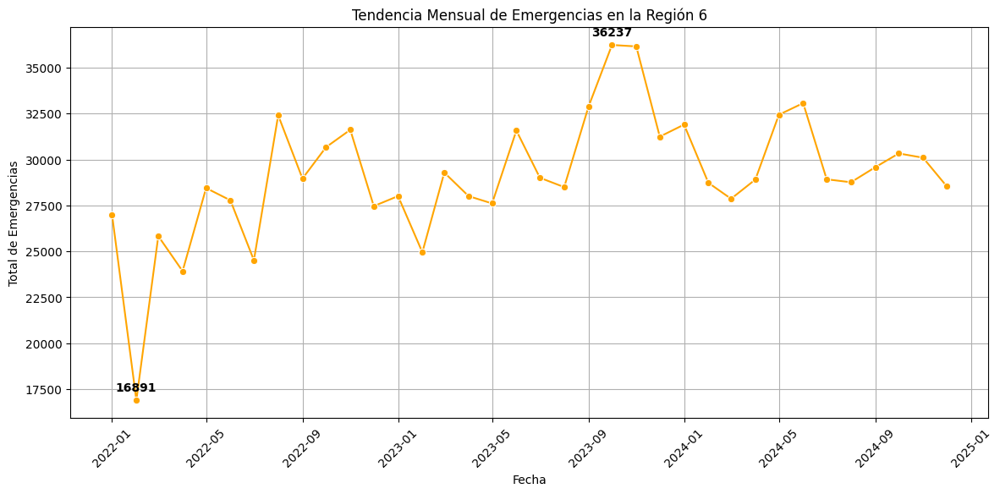

In [14]:
# Análisis de tendencia mensual
df_monthly = df_region_6.groupby(df_region_6['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 6")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 6
El gráfico muestra la evolución mensual del número de emergencias atendidas en la Región 6 desde enero de 2022 hasta diciembre de 2024. La serie de datos presenta fluctuaciones con picos y caídas, reflejando la variabilidad en la demanda de emergencias hospitalarias.

Observaciones Claves
Mínimo y Máximo

El mes con menor número de emergencias ocurrió en enero de 2022, con 16,891 emergencias.
El mes con mayor número de emergencias fue en septiembre de 2023, con 36,237 emergencias.
Patrón de Variación

Se observa una tendencia fluctuante, con periodos de aumentos seguidos de descensos pronunciados.
Se presentan picos de alta demanda en ciertos meses, lo que sugiere que hay factores estacionales o eventos específicos que afectan la cantidad de emergencias atendidas.
Algunas caídas abruptas pueden estar relacionadas con:
Baja movilidad de la población en ciertos periodos (festividades, restricciones sanitarias).
Capacidad hospitalaria limitada en ciertos meses.
Disminución de enfermedades estacionales en algunos momentos del año.
Tendencia General

Aunque hay variaciones, la tendencia general parece mantenerse estable, con valores que oscilan entre 25,000 y 35,000 emergencias mensuales.
El pico de septiembre de 2023 (36,237 emergencias) podría estar relacionado con un evento de salud pública, un brote epidémico o un aumento en la movilidad de la población.
Posibles Factores Explicativos
Factores Estacionales

Los aumentos en la cantidad de emergencias pueden estar influenciados por:
Brote de enfermedades respiratorias o gastrointestinales en determinadas estaciones del año.
Aumento en la movilidad y turismo, incrementando la demanda hospitalaria.
Accidentalidad en períodos festivos o vacaciones.
Eventos Excepcionales

El pico de septiembre de 2023 (36,237 emergencias) podría deberse a:

Un brote epidemiológico en la región.
Eventos climáticos extremos como tormentas o huracanes, que aumentan los accidentes y emergencias médicas.
Mayor disponibilidad de atención hospitalaria, permitiendo que más pacientes fueran admitidos.
La caída en enero de 2022 (16,891 emergencias) puede estar vinculada a:

Menor movilidad de la población tras las festividades.
Restricciones hospitalarias o reducción de personal médico en ciertos meses.
Infraestructura y Movilidad de Pacientes

Puede haber un efecto de movilidad de pacientes entre provincias, donde algunos meses ven una redistribución de emergencias entre hospitales.
La disponibilidad de personal médico y capacidad hospitalaria en cada mes puede influir en la cantidad de emergencias atendidas.


## **Región 7**

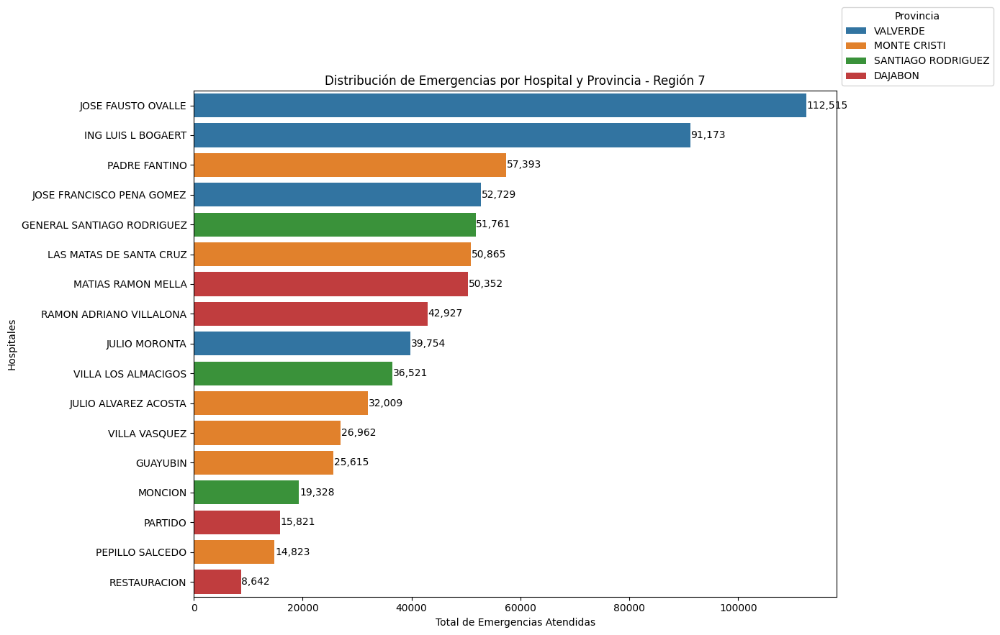

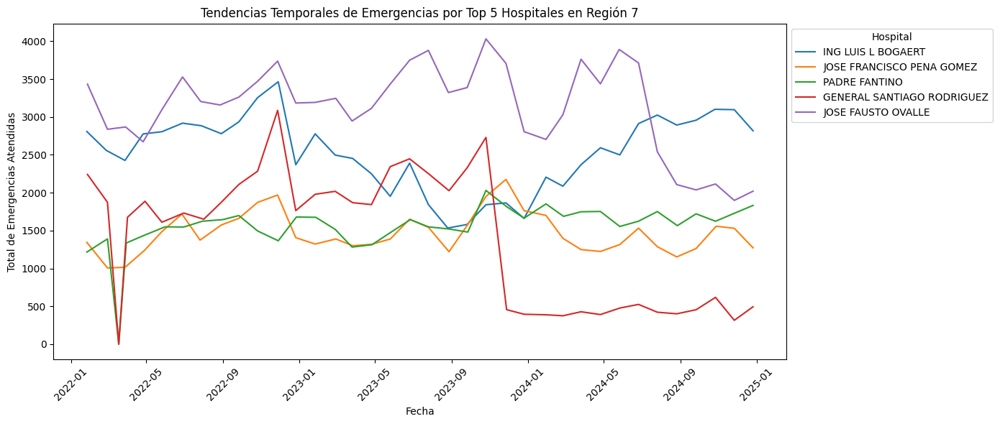

In [15]:
# Filtrar solo los datos de la Región 7
df_region_7 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 7"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_7 = df_region_7[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_7.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_7["Total_Ingresos"] = pd.to_numeric(df_region_7["Total_Ingresos"], errors="coerce")
df_region_7["Fecha"] = pd.to_datetime(df_region_7["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_7 = df_region_7[(df_region_7["Fecha"].dt.year >= 2022) & (df_region_7["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_7.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 7")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_7[df_region_7["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 7")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 7
El gráfico muestra la cantidad total de emergencias atendidas en distintos hospitales de la Región 7, agrupados por provincia (Valverde, Monte Cristi, Santiago Rodríguez y Dajabón). Este análisis permite identificar los hospitales con la mayor y menor carga de emergencias y posibles factores que influyen en la demanda de atención médica.
Hospitales con Mayor Carga de Emergencias
Los hospitales con mayor número de emergencias en la Región 7 incluyen:

José Fausto Ovalle (112,515 emergencias)

Es el hospital con mayor volumen de emergencias en la región.
Ubicado en Valverde, lo que sugiere que es un hospital de referencia.
Es posible que reciba pacientes de otras provincias cercanas debido a su mayor capacidad instalada.
Ing. Luis L. Bogaert (91,173 emergencias)

Ubicado en Valverde, con un volumen alto de emergencias.
Indica que la provincia tiene una alta demanda hospitalaria.
Padre Fantino (57,393 emergencias)

Localizado en Monte Cristi, con un número considerable de emergencias.
José Francisco Peña Gómez (52,729 emergencias)

También en Valverde, indicando que esta provincia tiene múltiples hospitales con alta demanda.
General Santiago Rodríguez (51,761 emergencias)

Ubicado en Santiago Rodríguez, lo que indica que esta provincia tiene un papel importante en la red de atención de la región.
Conclusión:
Los hospitales con mayor carga de emergencias se encuentran en Valverde y Monte Cristi, lo que indica que estas provincias podrían tener una mayor densidad poblacional, mejor infraestructura hospitalaria o ser centros de referencia para la región.

Hospitales con Menor Cantidad de Emergencias
Los hospitales con menor carga de emergencias incluyen:

Restauración (8,642 emergencias)

Es el hospital con menor número de emergencias reportadas en la región.
Puede deberse a su especialización en otros servicios o a limitaciones de infraestructura.
Pepillo Salcedo (14,823 emergencias)

También muestra un volumen bajo en comparación con los hospitales principales.
Partido (15,821 emergencias)

Indica una demanda menor, lo que podría deberse a menor población en la zona o especialización del hospital.
Monción (19,328 emergencias)

Hospital de menor volumen en comparación con los principales.
Guayubín (25,615 emergencias)

Aunque tiene un mayor volumen que los anteriores, sigue estando entre los hospitales con menos emergencias en la región.
Interpretación:
Algunos hospitales podrían estar especializados en atención ambulatoria o en otras áreas médicas diferentes a emergencias.
Limitaciones en personal, equipamiento o capacidad hospitalaria pueden influir en la baja carga de emergencias.
Pacientes pueden estar trasladándose a hospitales más grandes o mejor equipados dentro de la región.


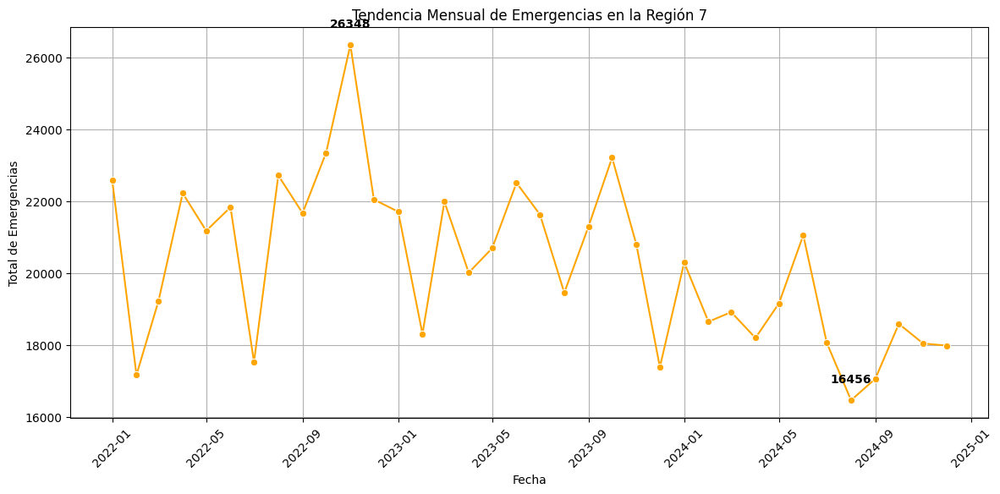

In [16]:
# Análisis de tendencia mensual
df_monthly = df_region_7.groupby(df_region_7['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 7")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 7
El gráfico muestra la evolución mensual del número de emergencias atendidas en la Región 7 desde enero de 2022 hasta diciembre de 2024. Se observan fluctuaciones notables con momentos de alta y baja demanda.

Observaciones Claves
Mínimo y Máximo

El mes con menor número de emergencias ocurrió en septiembre de 2024, con 16,456 emergencias.
El mes con mayor número de emergencias fue en octubre de 2022, con 26,318 emergencias.
Patrón de Variación

Se observa una tendencia fluctuante, con descensos y recuperaciones en distintos períodos.
Picos altos en ciertos meses pueden deberse a factores estacionales o eventos sanitarios.
Las caídas abruptas pueden estar relacionadas con:
Baja movilidad de la población en ciertos períodos.
Cambios en la capacidad hospitalaria.
Reducción de brotes de enfermedades en algunos meses.
Tendencia General

Se nota una leve tendencia a la baja en la cantidad de emergencias atendidas.
La disminución de emergencias desde finales de 2023 hasta 2024 podría estar relacionada con cambios en la infraestructura de atención o en la demanda hospitalaria.
Posibles Factores Explicativos
Factores Estacionales

Los aumentos en emergencias pueden estar relacionados con:
Brotes de enfermedades infecciosas en determinadas estaciones.
Mayor movilidad en épocas festivas, lo que incrementa accidentes y hospitalizaciones.
Eventos climáticos extremos que generan más emergencias.
Eventos Excepcionales

El pico de octubre de 2022 (26,318 emergencias) podría deberse a:

Un brote epidemiológico en la región.
Aumento en la capacidad hospitalaria, permitiendo la atención de más pacientes.
Mayor movilidad de la población en ciertos períodos.
La caída de septiembre de 2024 (16,456 emergencias) puede estar vinculada a:

Restricciones en la atención médica.
Menor incidencia de enfermedades en ese período.
Reducción de la población atendida debido a mejoras en la prevención de emergencias.
Infraestructura y Movilidad de Pacientes

La variabilidad en la serie de datos puede deberse a la capacidad de los hospitales en ciertos meses.
También puede existir movilidad de pacientes entre provincias, afectando la cantidad de emergencias registradas.


## **Región 8**

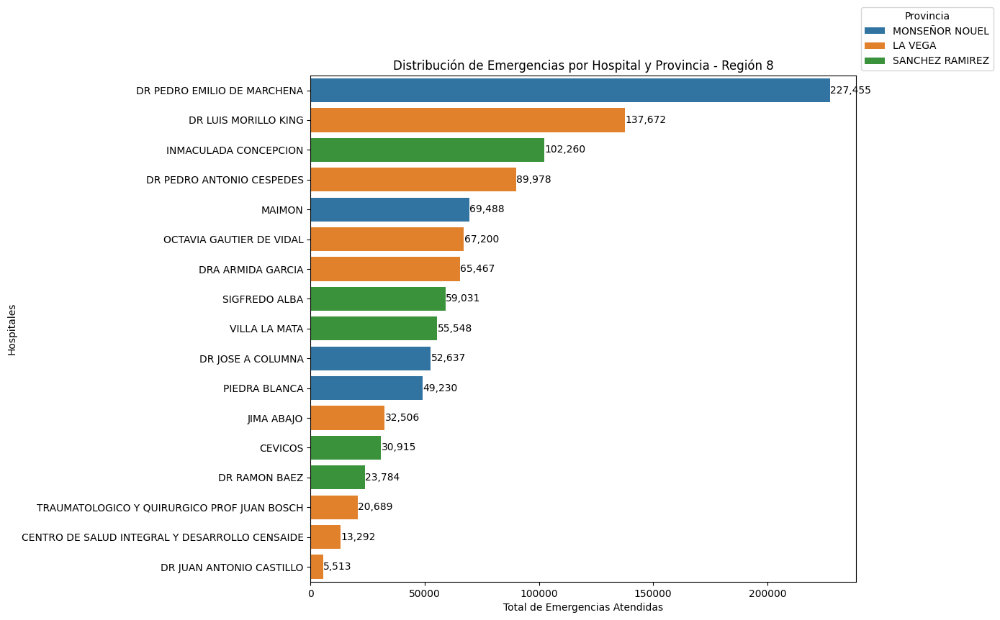

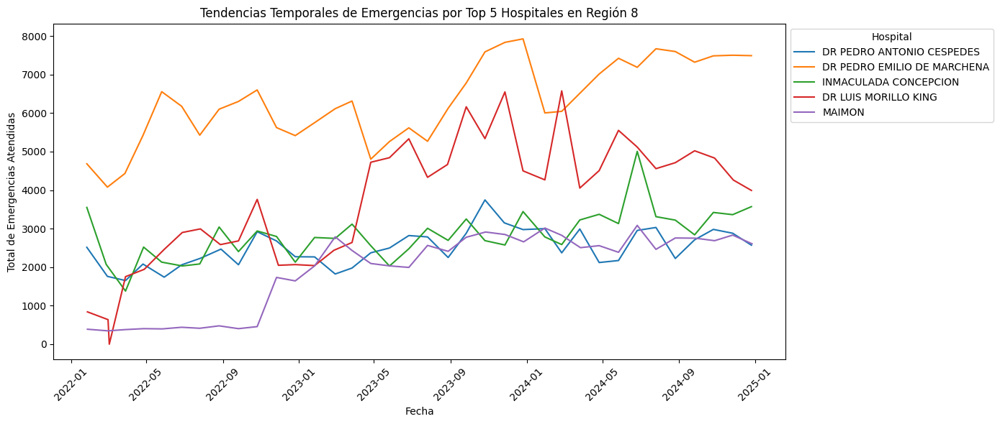

In [17]:
# Filtrar solo los datos de la Región 8
df_region_8 = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[establecimiento_region]"] == "REGION 8"]

# Seleccionar las columnas relevantes
columns_to_keep = [
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento]",  # Establecimiento (Hospital)
    "vw_produccion_67A_eme_BI[Eme_total_egresos]",  # Total ingresos
    "vw_produccion_67A_eme_BI[RegistroFecha]"  # Fecha
]

df_region_8 = df_region_8[columns_to_keep]

# Renombrar columnas para mejor lectura
df_region_8.columns = ["Provincia", "Establecimiento", "Total_Ingresos", "Fecha"]

# Convertir las columnas a los tipos adecuados
df_region_8["Total_Ingresos"] = pd.to_numeric(df_region_8["Total_Ingresos"], errors="coerce")
df_region_8["Fecha"] = pd.to_datetime(df_region_8["Fecha"], errors='coerce')

# Filtrar datos entre 2022 y 2024
df_region_8 = df_region_8[(df_region_8["Fecha"].dt.year >= 2022) & (df_region_8["Fecha"].dt.year <= 2024)]

# Eliminar la columna de fecha antes de agrupar para evitar errores
df_aggregated = df_region_8.drop(columns=["Fecha"]).groupby(["Provincia", "Establecimiento"], as_index=False).sum()

# Ordenar los datos por Total_Ingresos de mayor a menor
df_aggregated = df_aggregated.sort_values(by="Total_Ingresos", ascending=False)

# Gráfico de distribución de emergencias por hospital y provincia
plt.figure(figsize=(14, 8))
sns.barplot(
    data=df_aggregated,
    x="Total_Ingresos",
    y="Establecimiento",
    hue="Provincia",
    dodge=False,
    order=df_aggregated["Establecimiento"]
)
plt.xlabel("Total de Emergencias Atendidas")
plt.ylabel("Hospitales")
plt.title("Distribución de Emergencias por Hospital y Provincia - Región 8")
plt.legend(title="Provincia", bbox_to_anchor=(1, 1))

# Agregar etiquetas a las barras con separador de miles
for index, value in enumerate(df_aggregated["Total_Ingresos"]):
    plt.text(value + 100, index, f"{value:,.0f}", va='center')

plt.tight_layout()
plt.show()

# Análisis de tendencias temporales por hospital (Top 5 hospitales con mayor frecuencia)
top_5_hospitals = df_aggregated.nlargest(5, "Total_Ingresos")["Establecimiento"]
df_tendencias_top5 = df_region_8[df_region_8["Establecimiento"].isin(top_5_hospitals)]
df_tendencias_grouped = df_tendencias_top5.groupby(["Fecha", "Establecimiento"], as_index=False).sum()

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_tendencias_grouped, x="Fecha", y="Total_Ingresos", hue="Establecimiento")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias Atendidas")
plt.title("Tendencias Temporales de Emergencias por Top 5 Hospitales en Región 8")
plt.legend(title="Hospital", bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Análisis del Gráfico: Distribución de Emergencias por Hospital y Provincia en la Región 8
El gráfico presenta la distribución de emergencias atendidas en hospitales de la Región 8, diferenciados por provincia (Monseñor Nouel, La Vega y Sánchez Ramírez). Este análisis permite identificar los hospitales con mayor carga de emergencias y los que reciben menor cantidad de pacientes.

Hospitales con Mayor Carga de Emergencias
Los hospitales con mayor número de emergencias en la Región 8 incluyen:

Dr. Pedro Emilio de Marchena (227,455 emergencias)

Es el hospital con mayor volumen de emergencias en la región.
Ubicado en Monseñor Nouel, lo que indica que es un centro de referencia en la provincia.
Probablemente recibe pacientes de zonas rurales cercanas o de provincias con menor infraestructura hospitalaria.
Dr. Luis Morillo King (137,672 emergencias)

Hospital en La Vega, lo que sugiere una alta demanda de servicios hospitalarios en la provincia.
Inmaculada Concepción (102,260 emergencias)

Ubicado en Sánchez Ramírez, liderando la atención de emergencias en esa provincia.
Dr. Pedro Antonio Céspedes (89,978 emergencias)

También en La Vega, lo que indica que esta provincia tiene dos hospitales con alta carga de emergencias.
Maimón (69,488 emergencias)

Se destaca en Monseñor Nouel, aunque con menor volumen que los principales hospitales.
Conclusión:
Los hospitales con mayor carga de emergencias están distribuidos principalmente entre Monseñor Nouel y La Vega, lo que indica que estas provincias pueden tener una mayor densidad poblacional, mejor infraestructura hospitalaria o servir como centros de referencia para la región.



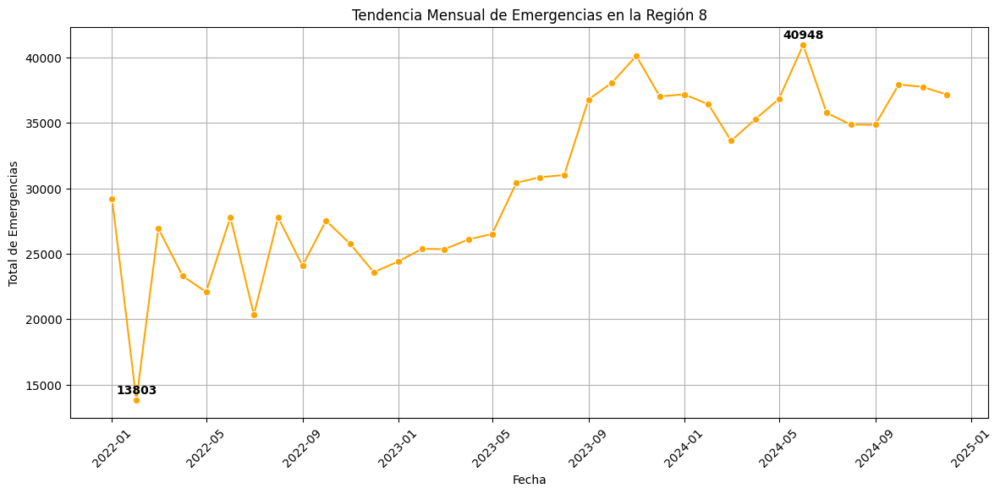

In [18]:
# Análisis de tendencia mensual
df_monthly = df_region_8.groupby(df_region_8['Fecha'].dt.to_period('M'))["Total_Ingresos"].sum().reset_index()
df_monthly['Fecha'] = df_monthly['Fecha'].astype(str)
df_monthly['Fecha'] = pd.to_datetime(df_monthly['Fecha'])

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_monthly, x='Fecha', y="Total_Ingresos", marker="o", linestyle="-", color="orange")

# Etiquetas de picos y valles
for i, row in df_monthly.iterrows():
    if row["Total_Ingresos"] == df_monthly["Total_Ingresos"].max() or row["Total_Ingresos"] == df_monthly["Total_Ingresos"].min():
        plt.text(row['Fecha'], row["Total_Ingresos"] + 500, str(int(row["Total_Ingresos"])), ha='center', fontsize=10, fontweight='bold', color='black')

# Configuración del gráfico
plt.title("Tendencia Mensual de Emergencias en la Región 8")
plt.xlabel("Fecha")
plt.ylabel("Total de Emergencias")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Análisis del Gráfico: Tendencia Mensual de Emergencias en la Región 8

El gráfico muestra la evolución mensual del número de emergencias atendidas en la Región 8 desde enero de 2022 hasta diciembre de 2024. Se pueden observar fluctuaciones en la cantidad de emergencias, con períodos de alta y baja demanda.

Observaciones Claves
Mínimo y Máximo

El mes con menor número de emergencias ocurrió en febrero de 2022, con 13,803 emergencias.
El mes con mayor número de emergencias fue en junio de 2024, con 40,948 emergencias.
Tendencia General

Durante 2022 y principios de 2023, se observa una tendencia oscilante con picos y caídas, indicando posibles factores estacionales o eventos puntuales que afectaron la demanda de emergencias.
A partir de mediados de 2023, hay un incremento sostenido en la cantidad de emergencias, alcanzando el máximo en junio de 2024.
En los últimos meses de 2024, la cantidad de emergencias tiende a estabilizarse en torno a 35,000 a 38,000 emergencias mensuales.
Picos y Caídas Significativas

El gran aumento a partir de junio de 2023 puede estar relacionado con:
Mayor capacidad hospitalaria o cambios en políticas de atención.
Brotes epidemiológicos o aumento de casos estacionales.
Mayor movilidad de pacientes hacia hospitales de la Región 8.
La caída de febrero de 2022 (13,803 emergencias) podría deberse a:
Menor movilidad post-festividades.
Reducción de personal médico en ciertas temporadas.
Cambios en la política de admisión de pacientes.


# **Análisis considerando datos poblacionales**

## **Análisis Correlación Total Ingresos en Emergencias y Cantidad Población**

Correlación por provincia: 0.9635705084626598
Correlación por región de salud: 0.9767089814731794


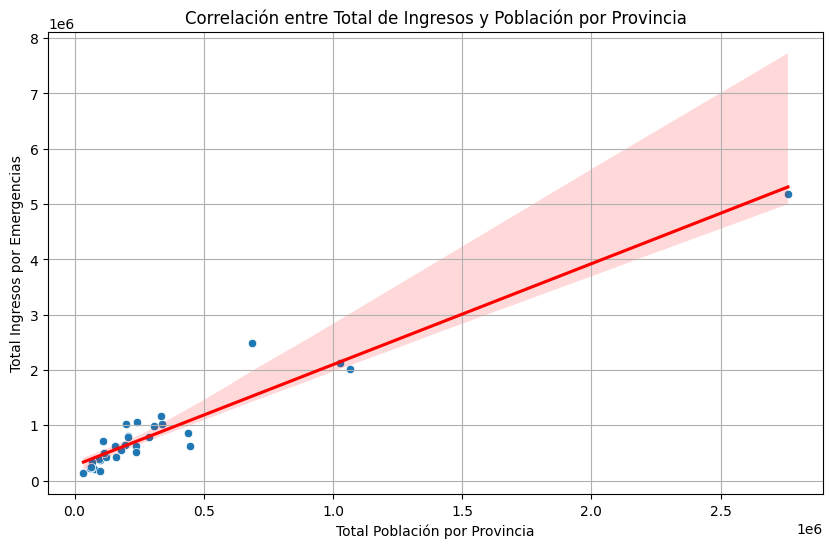

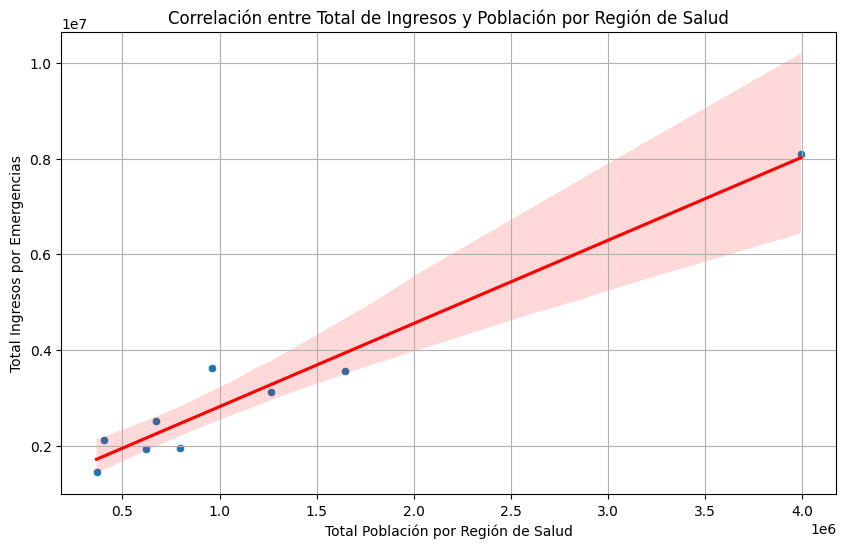

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar los archivos
file_emergencias = "Total Emergencias 2018-2024.xlsx"
file_poblacion = "Población por provincia. Censo ONE.xlsx"

# Leer los archivos
df_emergencias = pd.read_excel(file_emergencias, sheet_name="Total Eme. 2018-2024")
df_poblacion = pd.read_excel(file_poblacion, sheet_name="Poblacion por Region y Provinci")

# Limpiar y estructurar el dataframe de emergencias
df_emergencias_clean = df_emergencias.iloc[2:].copy()  # Eliminar filas innecesarias
df_emergencias_clean.columns = df_emergencias.iloc[1]  # Asignar nombres de columnas correctos
df_emergencias_clean = df_emergencias_clean[1:]  # Eliminar fila con nombres duplicados

# Seleccionar solo las columnas relevantes
df_emergencias_clean = df_emergencias_clean[[
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[establecimiento_region]",  # Región de salud
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]"  # Total ingresos
]]

# Renombrar columnas
df_emergencias_clean.columns = ["Provincia", "Region_Salud", "Total_Ingresos"]

# Convertir la columna de total de ingresos a numérico
df_emergencias_clean.loc[:, "Total_Ingresos"] = pd.to_numeric(df_emergencias_clean["Total_Ingresos"], errors="coerce")

# Agrupar por provincia y región de salud
df_eme_provincia = df_emergencias_clean.groupby("Provincia", as_index=False).sum()
df_eme_region = df_emergencias_clean.groupby("Region_Salud", as_index=False).sum()

# Limpiar y estructurar el dataframe de población
df_poblacion.columns = df_poblacion.columns.str.strip()  # Eliminar espacios adicionales
df_poblacion_clean = df_poblacion[[
    "Provincia", "Región_Salud", "Total_poblacion"
]].copy()

# Renombrar columnas
df_poblacion_clean.columns = ["Provincia", "Region_Salud", "Total_Poblacion"]

# Convertir la columna de población a numérico
df_poblacion_clean.loc[:, "Total_Poblacion"] = pd.to_numeric(df_poblacion_clean["Total_Poblacion"], errors="coerce")

# Unir los datos por provincia y por región de salud
df_corr_provincia = pd.merge(df_eme_provincia, df_poblacion_clean, on="Provincia", how="inner")
df_corr_region = pd.merge(df_eme_region, df_poblacion_clean.groupby("Region_Salud", as_index=False).sum(numeric_only=True), on="Region_Salud", how="inner")

# Asegurar que las columnas sean numéricas
df_corr_provincia["Total_Poblacion"] = pd.to_numeric(df_corr_provincia["Total_Poblacion"], errors="coerce")
df_corr_provincia["Total_Ingresos"] = pd.to_numeric(df_corr_provincia["Total_Ingresos"], errors="coerce")
df_corr_region["Total_Poblacion"] = pd.to_numeric(df_corr_region["Total_Poblacion"], errors="coerce")
df_corr_region["Total_Ingresos"] = pd.to_numeric(df_corr_region["Total_Ingresos"], errors="coerce")

# Eliminar filas con valores NaN
df_corr_provincia = df_corr_provincia.dropna()
df_corr_region = df_corr_region.dropna()

# Calcular correlaciones
corr_provincia = df_corr_provincia["Total_Ingresos"].corr(df_corr_provincia["Total_Poblacion"])
corr_region = df_corr_region["Total_Ingresos"].corr(df_corr_region["Total_Poblacion"])

# Mostrar resultados
print("Correlación por provincia:", corr_provincia)
print("Correlación por región de salud:", corr_region)

# Gráfico de correlación para provincia
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_corr_provincia, x="Total_Poblacion", y="Total_Ingresos")
sns.regplot(data=df_corr_provincia, x="Total_Poblacion", y="Total_Ingresos", scatter=False, color="red")
plt.xlabel("Total Población por Provincia")
plt.ylabel("Total Ingresos por Emergencias")
plt.title("Correlación entre Total de Ingresos y Población por Provincia")
plt.grid(True)
plt.show()

# Gráfico de correlación para región de salud
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_corr_region, x="Total_Poblacion", y="Total_Ingresos")
sns.regplot(data=df_corr_region, x="Total_Poblacion", y="Total_Ingresos", scatter=False, color="red")
plt.xlabel("Total Población por Región de Salud")
plt.ylabel("Total Ingresos por Emergencias")
plt.title("Correlación entre Total de Ingresos y Población por Región de Salud")
plt.grid(True)
plt.show()


Resumen

Análisis de correlación entre emergencias y población
Correlación por provincia: 0.96 (alta correlación positiva)
Correlación por región de salud: 0.98 (aún más fuerte)

📊 Interpretación:

Existe una relación lineal fuerte entre la cantidad de emergencias y la población.
Las provincias y regiones con más población tienden a tener más emergencias, lo que indica que la variable "población" puede ser un excelente predictor en nuestro modelo.
La correlación a nivel de región es aún mayor, lo que sugiere que la segmentación por región de salud puede mejorar la predicción.

Estos valores representan un nivel de correlación muy alto, lo que indica que la cantidad de ingresos por emergencias está estrechamente relacionada con la población en ambas escalas (provincia y región de salud).

Interpretación de los Resultados
Alta correlación positiva (cercana a 1)

Un coeficiente de 0.96 a nivel provincial y 0.97 a nivel regional indica que a mayor cantidad de población en una provincia o región, mayor es la cantidad de ingresos por emergencias.

La relación es lineal fuerte, lo que sugiere que la población es un factor determinante en la demanda hospitalaria de emergencias.

Diferencia entre Provincia y Región de Salud

La correlación a nivel regional (0.9767) es ligeramente mayor que a nivel provincial (0.9636).

Esto podría indicar que la agregación de datos a nivel regional reduce variaciones locales, haciendo que la relación sea más estable y precisa en comparación con el análisis a nivel provincial.

Posibles Explicaciones para la Relación Fuerte

Mayor población = Mayor demanda de emergencias: Esto es lógico ya que un mayor número de personas conlleva un mayor número de accidentes, enfermedades y urgencias médicas.

Estructura hospitalaria proporcional a la población: Es posible que la infraestructura hospitalaria esté distribuida en función del tamaño poblacional, haciendo que las emergencias sigan patrones demográficos.

Movilidad de pacientes dentro de regiones: Aunque algunas provincias pueden tener hospitales más grandes y recibir pacientes de otras provincias, a nivel regional este efecto se neutraliza, fortaleciendo la correlación.


**Posibles Limitaciones y Análisis Adicionales**

Factores adicionales que pueden influir en la cantidad de emergencias atendidas:

Capacidad hospitalaria: No todas las provincias tienen la misma cantidad de hospitales y médicos por habitante.
Accesibilidad y calidad de los servicios de salud: Provincias con más infraestructura médica pueden recibir pacientes de otras provincias con menos recursos.
Patrones de salud pública: Regiones con mayor incidencia de enfermedades pueden tener más ingresos por emergencias.
Próximos pasos en el análisis:

Análisis de variación: Comparar provincias con mayor y menor correlación para identificar diferencias clave.
Modelos predictivos: Utilizar regresiones o redes neuronales para predecir la demanda de emergencias en función de la población y otros factores.
Exploración de otros determinantes: Evaluar la relación con variables como edad de la población, urbanización y accesibilidad a hospitales.

**Conclusión**
La relación entre población y cantidad de ingresos por emergencias es fuerte y positiva, lo que sugiere que la demanda de emergencias está principalmente impulsada por el tamaño poblacional.
La correlación es más alta a nivel regional que provincial, lo que indica que la agregación de datos a nivel de región de salud mejora la precisión del modelo.
Se recomienda un análisis más profundo considerando otros factores que pueden afectar la cantidad de emergencias atendidas.

In [20]:
import pandas as pd

def cargar_datos():
    file_emergencias = "Total Emergencias 2018-2024.xlsx"
    df_emergencias = pd.read_excel(file_emergencias, sheet_name="Total Eme. 2018-2024")
    df_emergencias.columns = df_emergencias.iloc[1]  # Asignar la fila correcta como nombres de columnas
    df_emergencias = df_emergencias.iloc[2:].reset_index(drop=True)  # Eliminar filas innecesarias
    return df_emergencias

def procesar_datos(df_emergencias):
    # Extraer el año desde la columna de fecha
    df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"] = pd.to_datetime(
        df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"], errors='coerce'
    )

    # Filtrar datos desde 2022 a 2024
    df_clean = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"].dt.year.between(2022, 2024)]

    # Seleccionar columnas relevantes
    df_clean = df_clean[[
        "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
        "vw_produccion_67A_eme_BI[establecimiento_region]",  # Región de salud
        "vw_produccion_67A_eme_BI[establecimiento]",  # Nombre del hospital
        "vw_produccion_67A_eme_BI[Eme_total_ingresos]"  # Total ingresos
    ]]

    df_clean.columns = ["Provincia", "Region_Salud", "Hospital", "Total_Ingresos"]
    df_clean["Total_Ingresos"] = pd.to_numeric(df_clean["Total_Ingresos"], errors="coerce")
    df_clean = df_clean.dropna()

    return df_clean

def obtener_top_hospitales(df_clean):
    df_clean = df_clean.groupby(["Region_Salud", "Hospital"], as_index=False).agg({"Total_Ingresos": "sum"})
    df_top_hospitals = df_clean.sort_values(by=["Region_Salud", "Total_Ingresos"], ascending=[True, False])
    df_top_hospitals = df_top_hospitals.drop_duplicates(subset=["Region_Salud"], keep="first")
    return df_top_hospitals

# Ejecutar análisis
df_emergencias = cargar_datos()
df_emergencias_clean = procesar_datos(df_emergencias)
df_top_hospitals = obtener_top_hospitales(df_emergencias_clean)

# Mostrar resultados
print("Hospital con mayor demanda por región (2022-2024):")
print(df_top_hospitals)


Hospital con mayor demanda por región (2022-2024):
    Region_Salud                       Hospital  Total_Ingresos
8       REGION 0  DR FRANCISCO E MOSCOSO PUELLO          380321
45      REGION 1                JUAN PABLO PINA          386771
81      REGION 2                RICARDO LIMARDO          238125
107     REGION 3            SAN VICENTE DE PAUL          182618
115     REGION 4                     JAIME MOTA          210215
128     REGION 5                DR ANTONIO MUSA          245938
147     REGION 6            DR ALEJANDRO CABRAL          245951
162     REGION 7             JOSE FAUSTO OVALLE          112515
182     REGION 8    DR PEDRO EMILIO DE MARCHENA          227455


<ipython-input-20-f299191afc72>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean["Total_Ingresos"] = pd.to_numeric(df_clean["Total_Ingresos"], errors="coerce")


Hospital Dr. Francisco E. Moscoso Puello: Ubicado en Santo Domingo, es un hospital público que ofrece una amplia gama de servicios médicos a la comunidad.

Hospital Juan Pablo Pina: Situado en San Cristóbal, este centro de salud pública brinda atención médica general a la población de la región.

Hospital Ricardo Limardo: Localizado en Puerto Plata, es un hospital público que proporciona servicios médicos generales a los residentes de la zona.

Hospital San Vicente de Paúl: Este hospital regional universitario se encuentra en San Francisco de Macorís y ofrece atención médica especializada y general.

Hospital Jaime Mota: Ubicado en Barahona, es un centro de salud pública que atiende diversas especialidades médicas para la comunidad.

Hospital Dr. Antonio Musa: Situado en San Pedro de Macorís, este hospital regional ofrece servicios médicos generales a la población.

Hospital Dr. Alejandro Cabral: Localizado en San Juan de la Maguana, es un centro de salud pública que brinda atención médica en diversas áreas.

Hospital José Fausto Ovalle: Este hospital se encuentra en La Vega y ofrece servicios médicos generales a los habitantes de la región.

Hospital Dr. Pedro Emilio de Marchena: Ubicado en Bonao, es un centro de salud que proporciona atención médica general a la comunidad.

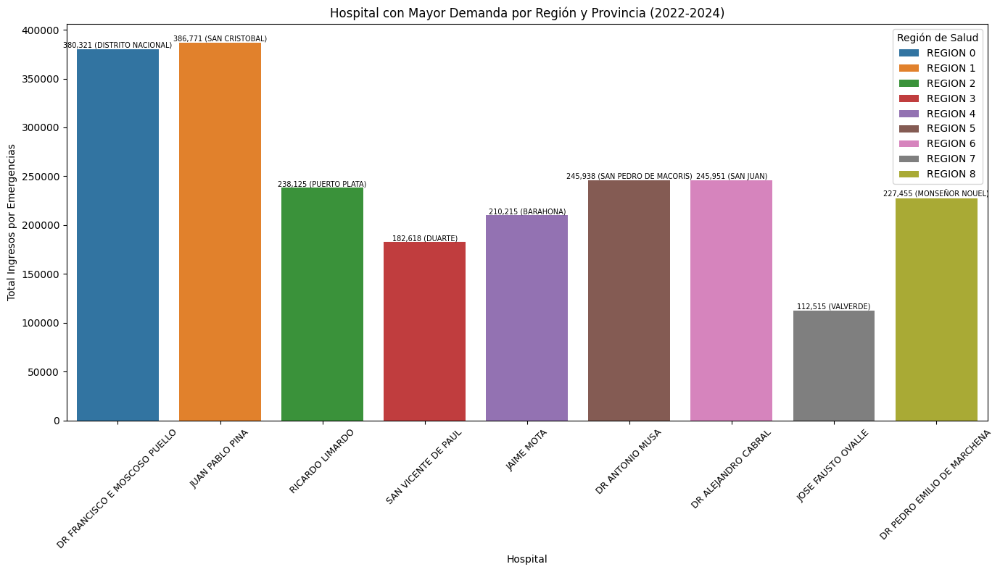

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar los datos
def cargar_datos():
    file_emergencias = "Total Emergencias 2018-2024.xlsx"
    df_emergencias = pd.read_excel(file_emergencias, sheet_name="Total Eme. 2018-2024")
    df_emergencias.columns = df_emergencias.iloc[1]  # Asignar la fila correcta como nombres de columnas
    df_emergencias = df_emergencias.iloc[2:].reset_index(drop=True)  # Eliminar filas innecesarias
    return df_emergencias

# Procesar datos
def procesar_datos(df_emergencias):
    # Extraer el año desde la columna de fecha
    df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"] = pd.to_datetime(
        df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"], errors='coerce'
    )

    # Filtrar datos desde 2022 a 2024
    df_clean = df_emergencias[df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"].dt.year.between(2022, 2024)]

    # Seleccionar columnas relevantes
    df_clean = df_clean[[
        "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
        "vw_produccion_67A_eme_BI[establecimiento_region]",  # Región de salud
        "vw_produccion_67A_eme_BI[establecimiento]",  # Nombre del hospital
        "vw_produccion_67A_eme_BI[Eme_total_ingresos]"  # Total ingresos
    ]]

    df_clean.columns = ["Provincia", "Region_Salud", "Hospital", "Total_Ingresos"]
    df_clean["Total_Ingresos"] = pd.to_numeric(df_clean["Total_Ingresos"], errors="coerce")
    df_clean = df_clean.dropna()

    return df_clean

# Obtener el hospital con mayor demanda por región y provincia
def obtener_top_hospitales_con_provincia(df_clean):
    df_clean = df_clean.groupby(["Region_Salud", "Provincia", "Hospital"], as_index=False).agg({"Total_Ingresos": "sum"})
    df_top_hospitals = df_clean.sort_values(by=["Region_Salud", "Total_Ingresos"], ascending=[True, False])
    df_top_hospitals = df_top_hospitals.drop_duplicates(subset=["Region_Salud"], keep="first")
    return df_top_hospitals

# Ejecutar análisis
df_emergencias = cargar_datos()
df_emergencias_clean = procesar_datos(df_emergencias)
df_top_hospitals_provincia = obtener_top_hospitales_con_provincia(df_emergencias_clean)

# Crear gráfico de barras del hospital con mayor demanda en cada región y provincia
plt.figure(figsize=(14, 8))
ax = sns.barplot(data=df_top_hospitals_provincia, x="Hospital", y="Total_Ingresos", hue="Region_Salud", dodge=False)
plt.xticks(rotation=45, fontsize=9)  # Ajustar la rotación y tamaño del eje X
plt.xlabel("Hospital")
plt.ylabel("Total Ingresos por Emergencias")
plt.title("Hospital con Mayor Demanda por Región y Provincia (2022-2024)")
plt.legend(title="Región de Salud", bbox_to_anchor=(1, 1))

# Agregar etiquetas de datos en las barras con la provincia (TAMAÑO MÁS PEQUEÑO)
for p, prov in zip(ax.patches, df_top_hospitals_provincia["Provincia"]):
    if not pd.isna(p.get_height()):  # Verificar si el valor no es NaN antes de agregar la etiqueta
        ax.annotate(f'{int(p.get_height()):,} ({prov})',
                    (p.get_x() + p.get_width() / 2, p.get_height()),
                    ha='center', va='bottom', fontsize=7, color='black')  # Reducido a fontsize=7

plt.tight_layout()  # Ajustar para evitar cortes
plt.show()


## **Tasa de emergencias por habitante**

In [22]:
# Importar librerías necesarias
import pandas as pd

# Cargar los archivos de emergencias y población
file_emergencias = "Total Emergencias 2018-2024.xlsx"
file_poblacion = "Población por provincia. Censo ONE.xlsx"

# Leer los archivos
df_emergencias = pd.read_excel(file_emergencias, sheet_name="Total Eme. 2018-2024")
df_poblacion = pd.read_excel(file_poblacion, sheet_name="Poblacion por Region y Provinci")

# Limpiar y estructurar el dataframe de emergencias
df_emergencias_clean = df_emergencias.iloc[2:].copy()
df_emergencias_clean.columns = df_emergencias.iloc[1]
df_emergencias_clean = df_emergencias_clean[1:]

# Crear columna de fecha para filtrar
df_emergencias_clean["RegistroFecha"] = pd.to_datetime(df_emergencias_clean["vw_produccion_67A_eme_BI[RegistroFecha]"], errors='coerce')

# Filtrar solo años 2022 a 2024
df_emergencias_filtered = df_emergencias_clean[
    (df_emergencias_clean["RegistroFecha"].dt.year >= 2022) &
    (df_emergencias_clean["RegistroFecha"].dt.year <= 2024)
]

# Seleccionar columnas necesarias
df_emergencias_filtered = df_emergencias_filtered[[
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",
    "vw_produccion_67A_eme_BI[establecimiento_region]",
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]"
]]

# Renombrar columnas
df_emergencias_filtered.columns = ["Provincia", "Region_Salud", "Total_Emergencias"]

# Convertir a numérico
df_emergencias_filtered["Total_Emergencias"] = pd.to_numeric(df_emergencias_filtered["Total_Emergencias"], errors="coerce")

# Agrupar por provincia
df_eme_provincia = df_emergencias_filtered.groupby("Provincia", as_index=False).sum()

# Limpiar y estructurar el dataframe de población
df_poblacion.columns = df_poblacion.columns.str.strip()
df_poblacion_clean = df_poblacion[["Provincia", "Región_Salud", "Total_poblacion"]].copy()
df_poblacion_clean.columns = ["Provincia", "Region_Salud", "Total_Poblacion"]
df_poblacion_clean["Total_Poblacion"] = pd.to_numeric(df_poblacion_clean["Total_Poblacion"], errors="coerce")

# Unir emergencias con población
df_final = pd.merge(df_eme_provincia, df_poblacion_clean, on="Provincia", how="inner")

# Calcular la tasa por cada 1,000 habitantes
df_final["Emergencias_por_1000_hab"] = (df_final["Total_Emergencias"] / df_final["Total_Poblacion"]) * 1000

# Mostrar resultados
print(df_final[["Provincia", "Total_Emergencias", "Total_Poblacion", "Emergencias_por_1000_hab"]])


                 Provincia  Total_Emergencias  Total_Poblacion  \
0                     AZUA             344743           239388   
1                 BAHORUCO             367037           108410   
2                 BARAHONA             519043           200135   
3                  DAJABON             117742            74257   
4        DISTRITO NACIONAL             992664          1027345   
5                   DUARTE             551455           308072   
6                 EL SEIBO              86062            98166   
7               ELIAS PIÑA             142175            64423   
8                ESPAILLAT             285375           239661   
9               HATO MAYOR             179283            99967   
10        HERMANAS MIRABAL             189567            96210   
11           INDEPENDENCIA             119354            60623   
12           LA ALTAGRACIA             290552           445162   
13               LA ROMANA             430995           286632   
14        

Tasa de emergencias por 1,000 habitantes:
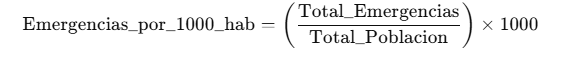

# **Tasa de demanda por población por año por 1000 habitantes**

In [23]:
import pandas as pd

# Cargar archivos
file_emergencias = "Total Emergencias 2018-2024.xlsx"
file_poblacion = "Población por provincia. Censo ONE.xlsx"

# Leer datos
df_emergencias = pd.read_excel(file_emergencias, sheet_name="Total Eme. 2018-2024")
df_poblacion = pd.read_excel(file_poblacion, sheet_name="Poblacion por Region y Provinci")

# Limpiar datos de emergencias
df_emergencias_clean = df_emergencias.iloc[2:].copy()
df_emergencias_clean.columns = df_emergencias.iloc[1]
df_emergencias_clean = df_emergencias_clean[1:]

# Crear columna de fecha y extraer año
df_emergencias_clean["RegistroFecha"] = pd.to_datetime(df_emergencias_clean["vw_produccion_67A_eme_BI[RegistroFecha]"], errors='coerce')
df_emergencias_clean["Año"] = df_emergencias_clean["RegistroFecha"].dt.year

# Filtrar 2022 a 2024
df_emergencias_filtered = df_emergencias_clean[
    df_emergencias_clean["Año"].isin([2022, 2023, 2024])
][[
    "Año", "vw_produccion_67A_eme_BI[establecimiento_provincia]", "vw_produccion_67A_eme_BI[Eme_total_ingresos]"
]]
df_emergencias_filtered.columns = ["Año", "Provincia", "Total_Emergencias"]
df_emergencias_filtered["Total_Emergencias"] = pd.to_numeric(df_emergencias_filtered["Total_Emergencias"], errors="coerce")

# Agrupar por provincia y año
df_eme_anual = df_emergencias_filtered.groupby(["Provincia", "Año"], as_index=False).sum()

# Limpiar población
df_poblacion.columns = df_poblacion.columns.str.strip()
df_poblacion_clean = df_poblacion[["Provincia", "Región_Salud", "Total_poblacion"]].copy()
df_poblacion_clean.columns = ["Provincia", "Region_Salud", "Total_Poblacion"]
df_poblacion_clean["Total_Poblacion"] = pd.to_numeric(df_poblacion_clean["Total_Poblacion"], errors="coerce")

# Merge con población
df_eme_anual = df_eme_anual.merge(df_poblacion_clean[["Provincia", "Total_Poblacion"]], on="Provincia", how="left")

# Calcular tasa
df_eme_anual["Tasa_por_1000"] = (df_eme_anual["Total_Emergencias"] / df_eme_anual["Total_Poblacion"]) * 1000

# Pivotear años como columnas
df_tasa_pivot = df_eme_anual.pivot(index="Provincia", columns="Año", values="Tasa_por_1000").reset_index()
df_tasa_pivot.columns.name = None
df_tasa_pivot.columns = ["Provincia", "Tasa_2022", "Tasa_2023", "Tasa_2024"]

# Reemplazar NaN con 0 (si lo deseas)
df_tasa_pivot = df_tasa_pivot.fillna(0)

# Mostrar
print(df_tasa_pivot)


                 Provincia   Tasa_2022    Tasa_2023    Tasa_2024
0                     AZUA  453.310107   494.724046   492.067272
1                 BAHORUCO  943.353934  1216.585186  1225.698736
2                 BARAHONA  788.023084   894.920928   910.520399
3                  DAJABON  628.169735   594.516342   362.915281
4        DISTRITO NACIONAL  339.290112   336.524731   290.427266
5                   DUARTE  544.950531   610.961074   634.108260
6                 EL SEIBO  304.402746   285.832162   286.463745
7               ELIAS PIÑA  612.607299   828.818900   765.471959
8                ESPAILLAT  364.802784   376.289843   449.651800
9               HATO MAYOR  697.650225   644.422659   451.348945
10        HERMANAS MIRABAL  646.304958   657.644735   666.396424
11           INDEPENDENCIA  581.314023   715.207100   672.269601
12           LA ALTAGRACIA  211.752126   200.217000   240.719109
13               LA ROMANA  489.516174   491.114042   523.022552
14                 LA VEG

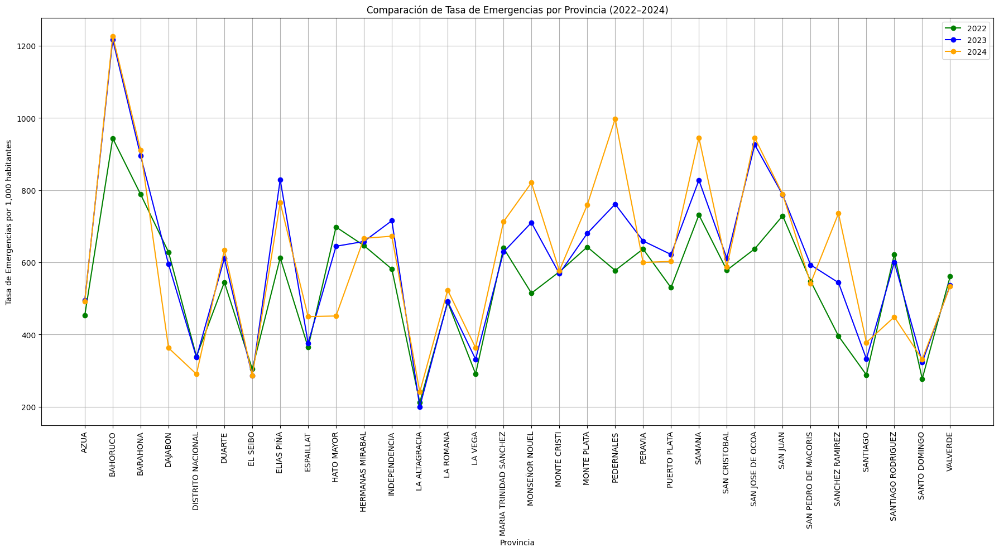

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# Crear el DataFrame con los datos proporcionados
data = [
    ["AZUA", 453.310107, 494.724046, 492.067272],
    ["BAHORUCO", 943.353934, 1216.585186, 1225.698736],
    ["BARAHONA", 788.023084, 894.920928, 910.520399],
    ["DAJABON", 628.169735, 594.516342, 362.915281],
    ["DISTRITO NACIONAL", 339.290112, 336.524731, 290.427266],
    ["DUARTE", 544.950531, 610.961074, 634.108260],
    ["EL SEIBO", 304.402746, 285.832162, 286.463745],
    ["ELIAS PIÑA", 612.607299, 828.818900, 765.471959],
    ["ESPAILLAT", 364.802784, 376.289843, 449.651800],
    ["HATO MAYOR", 697.650225, 644.422659, 451.348945],
    ["HERMANAS MIRABAL", 646.304958, 657.644735, 666.396424],
    ["INDEPENDENCIA", 581.314023, 715.207100, 672.269601],
    ["LA ALTAGRACIA", 211.752126, 200.217000, 240.719109],
    ["LA ROMANA", 489.516174, 491.114042, 523.022552],
    ["LA VEGA", 291.058361, 331.626275, 363.493896],
    ["MARIA TRINIDAD SANCHEZ", 639.352237, 628.509249, 712.347180],
    ["MONSEÑOR NOUEL", 514.546033, 709.899711, 820.356242],
    ["MONTE CRISTI", 573.676717, 568.693190, 576.756238],
    ["MONTE PLATA", 642.374609, 680.083309, 758.763822],
    ["PEDERNALES", 577.476715, 761.160910, 997.226196],
    ["PERAVIA", 636.821317, 659.080547, 599.717800],
    ["PUERTO PLATA", 529.772940, 621.673810, 602.381835],
    ["SAMANA", 731.217219, 827.345765, 945.155858],
    ["SAN CRISTOBAL", 578.120598, 611.254575, 587.454400],
    ["SAN JOSE DE OCOA", 637.295646, 925.585369, 944.540176],
    ["SAN JUAN", 728.861094, 786.837048, 788.590411],
    ["SAN PEDRO DE MACORIS", 548.088921, 592.882774, 541.903783],
    ["SANCHEZ RAMIREZ", 395.802367, 543.607645, 735.307360],
    ["SANTIAGO", 288.282146, 332.509310, 378.094424],
    ["SANTIAGO RODRIGUEZ", 621.925848, 600.049683, 448.779655],
    ["SANTO DOMINGO", 277.442276, 323.514985, 331.509186],
    ["VALVERDE", 560.855508, 536.823958, 533.640314],
]

# Crear el DataFrame
df_resultado = pd.DataFrame(data, columns=["Provincia", "Tasa_2022", "Tasa_2023", "Tasa_2024"])

# Crear el gráfico
plt.figure(figsize=(18, 10))
plt.plot(df_resultado["Provincia"], df_resultado["Tasa_2022"], label="2022", color='green', marker='o')
plt.plot(df_resultado["Provincia"], df_resultado["Tasa_2023"], label="2023", color='blue', marker='o')
plt.plot(df_resultado["Provincia"], df_resultado["Tasa_2024"], label="2024", color='orange', marker='o')

# Estética
plt.xticks(rotation=90)
plt.xlabel("Provincia")
plt.ylabel("Tasa de Emergencias por 1,000 habitantes")
plt.title("Comparación de Tasa de Emergencias por Provincia (2022–2024)")
plt.legend()
plt.grid(True)
plt.tight_layout()

# Mostrar
plt.show()



## **Mapa de Calor Demanda**

In [25]:
pip install pandas geopandas matplotlib openpyxl


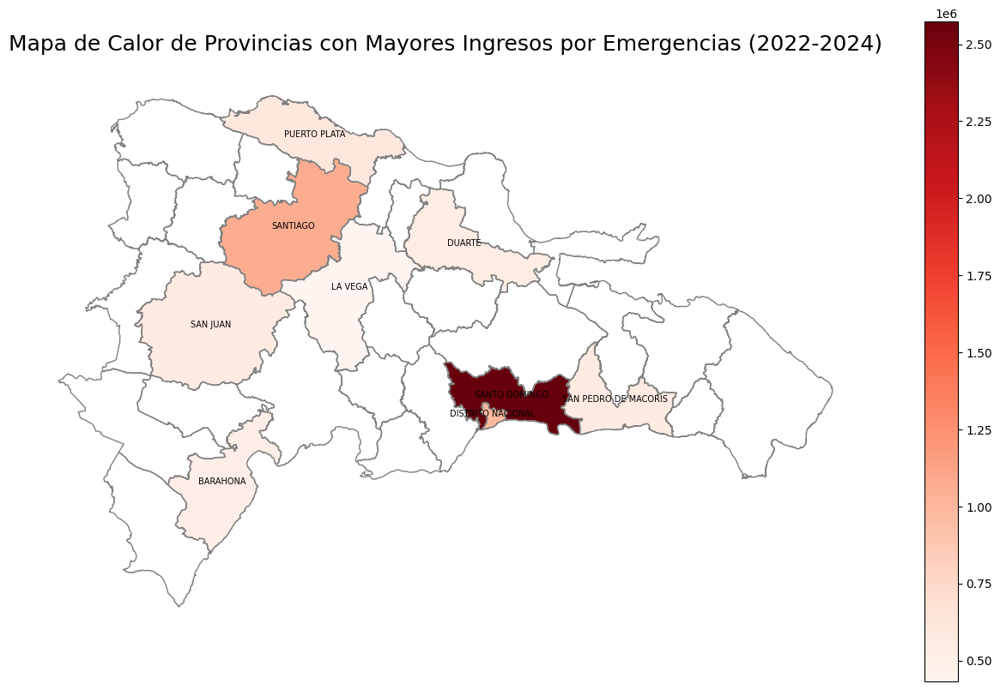

In [26]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import json
from shapely.geometry import shape, MultiPolygon

# Cargar los datos de emergencias
file_emergencias = "Total Emergencias 2018-2024.xlsx"
df_emergencias = pd.read_excel(file_emergencias, sheet_name="Total Eme. 2018-2024")

df_emergencias.columns = df_emergencias.iloc[1]  # Asignar la fila correcta como nombres de columnas
df_emergencias = df_emergencias.iloc[2:].reset_index(drop=True)  # Eliminar filas innecesarias

# Convertir la columna de fecha a tipo datetime
df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"] = pd.to_datetime(
    df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"], errors='coerce'
)

# Filtrar datos entre 2022 y 2024
df_filtered = df_emergencias[
    df_emergencias["vw_produccion_67A_eme_BI[RegistroFecha]"].dt.year.between(2022, 2024)
]

# Seleccionar columnas relevantes
df_filtered = df_filtered[[
    "vw_produccion_67A_eme_BI[establecimiento_provincia]",  # Provincia
    "vw_produccion_67A_eme_BI[Eme_total_ingresos]"  # Total ingresos
]]

# Renombrar columnas para facilidad de uso
df_filtered.columns = ["Provincia", "Total_Ingresos"]

# Convertir Total_Ingresos a numérico
df_filtered["Total_Ingresos"] = pd.to_numeric(df_filtered["Total_Ingresos"], errors="coerce")

# Eliminar filas con valores nulos
df_filtered = df_filtered.dropna()

# Agrupar por provincia, sumando los ingresos
df_provincia_ingresos = df_filtered.groupby("Provincia", as_index=False).sum()

# Seleccionar las 10 provincias con mayor ingresos
df_top_provincias = df_provincia_ingresos.nlargest(10, "Total_Ingresos")

# Cargar los datos geoespaciales desde el archivo JSON
with open("RD_PROV.json", "r", encoding="utf-8") as file:
    geojson_data = json.load(file)

gdf_provincias = gpd.GeoDataFrame.from_features(geojson_data["features"])

# Renombrar la columna para que coincida con los datos de emergencias
gdf_provincias = gdf_provincias.rename(columns={"TOPONIMIA": "Provincia"})

# Convertir MultiPolygon a Polygon seleccionando el más grande
def convertir_a_poligono(geom):
    if isinstance(geom, MultiPolygon):
        return max(geom.geoms, key=lambda p: p.area)  # Seleccionar el polígono más grande
    return geom

gdf_provincias["geometry"] = gdf_provincias["geometry"].apply(convertir_a_poligono)

# Unir los datos de los hospitales con el GeoDataFrame de las provincias
gdf_merged = gdf_provincias.merge(df_top_provincias, on="Provincia", how="right")

# **FILTRAR PROVINCIAS SIN GEOMETRÍA**
gdf_merged = gdf_merged.dropna(subset=["geometry"])  # Eliminamos provincias sin geometría

# Crear el mapa de calor
fig, ax = plt.subplots(1, 1, figsize=(16, 10))
gdf_provincias.boundary.plot(ax=ax, linewidth=1, color="gray")  # Dibujar los bordes de todas las provincias
gdf_merged.plot(column="Total_Ingresos", cmap="Reds", linewidth=0.8, ax=ax, edgecolor="0.8", legend=True)

# Agregar etiquetas con los nombres de las provincias con un tamaño de fuente más pequeño
for _, row in gdf_merged.iterrows():
    if row.geometry is not None:
        centroid = row.geometry.centroid
        ax.annotate(text=row.Provincia, xy=(centroid.x, centroid.y),
                    ha='center', fontsize=7, color='black')

# Personalizar el mapa
ax.set_title("Mapa de Calor de Provincias con Mayores Ingresos por Emergencias (2022-2024)", fontsize=18)
ax.set_axis_off()

# Mostrar el mapa
plt.show()


# **Análisis Exploratorio**

<ipython-input-27-8c00bb317240>:32: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


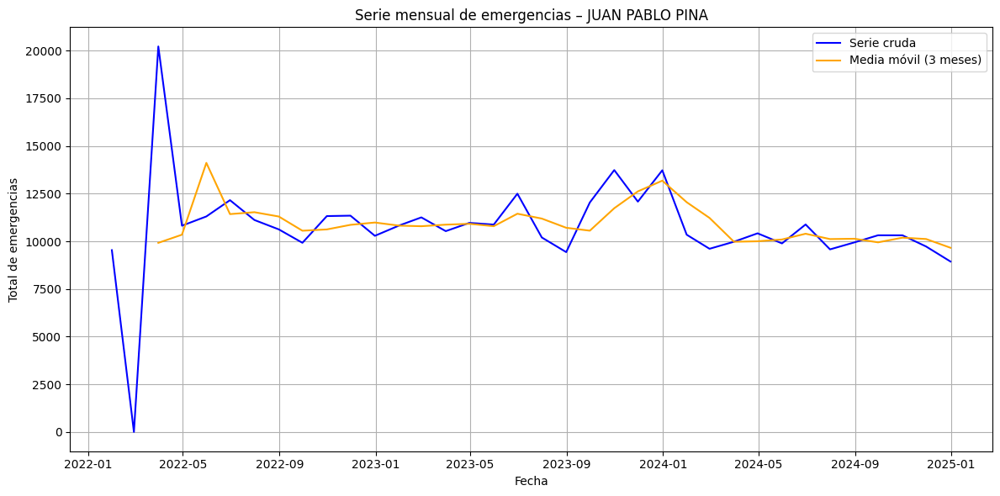

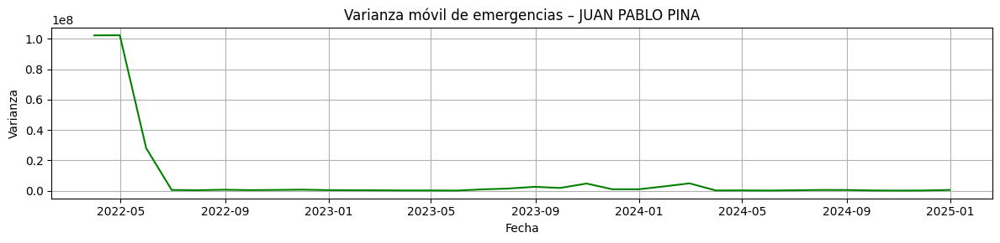

<ipython-input-27-8c00bb317240>:32: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


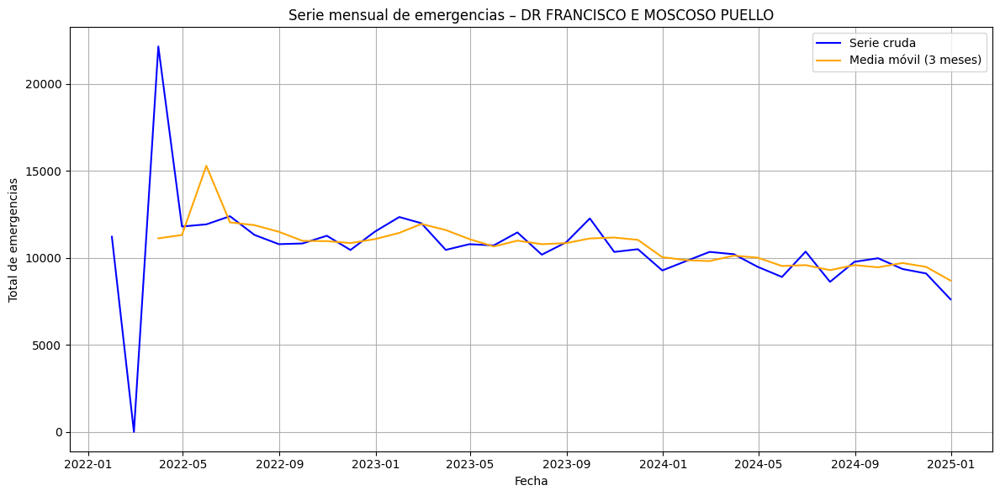

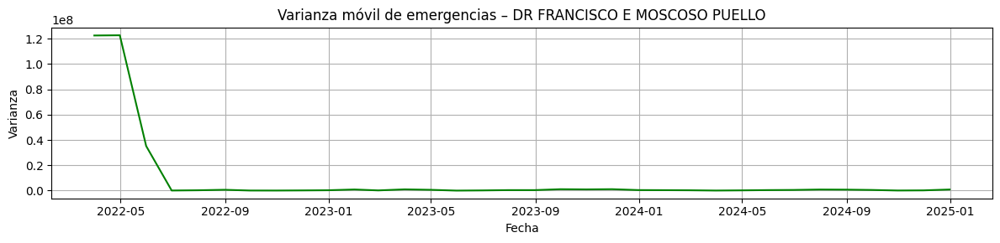

<ipython-input-27-8c00bb317240>:32: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


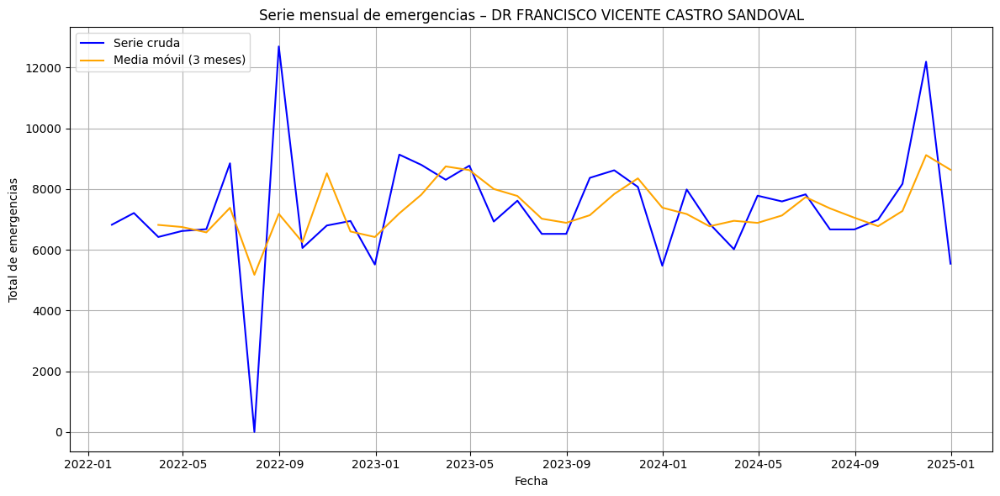

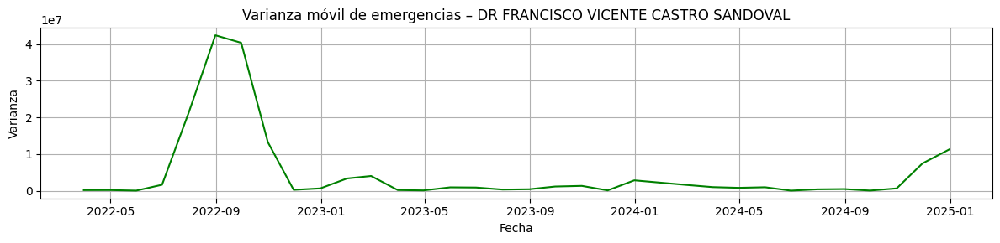

<ipython-input-27-8c00bb317240>:32: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


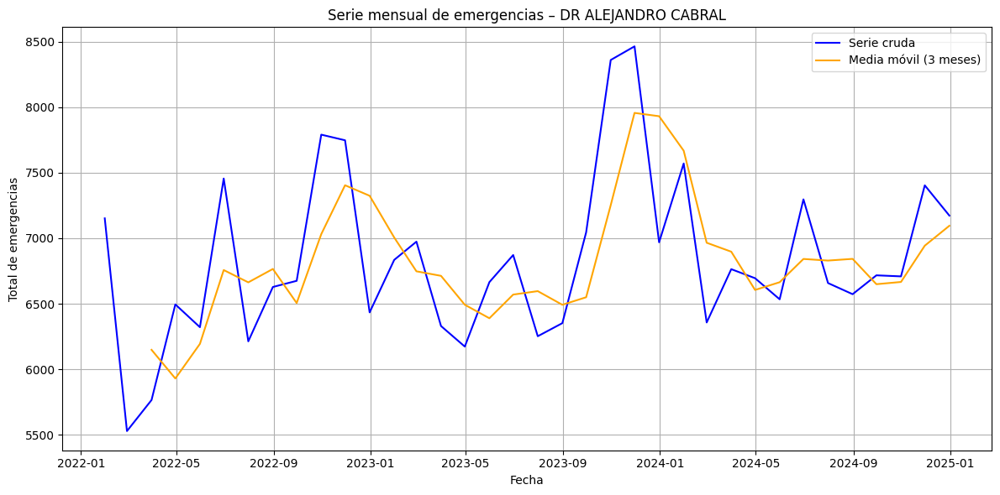

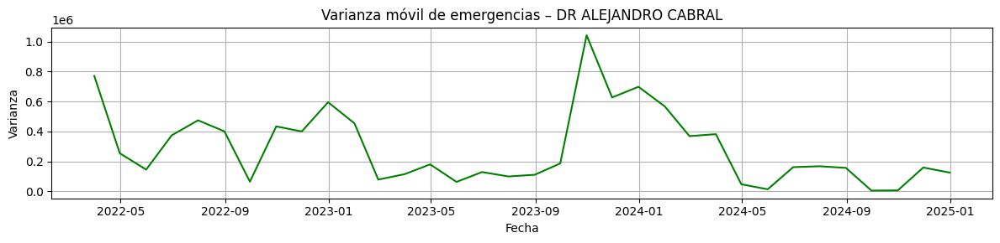

<ipython-input-27-8c00bb317240>:32: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


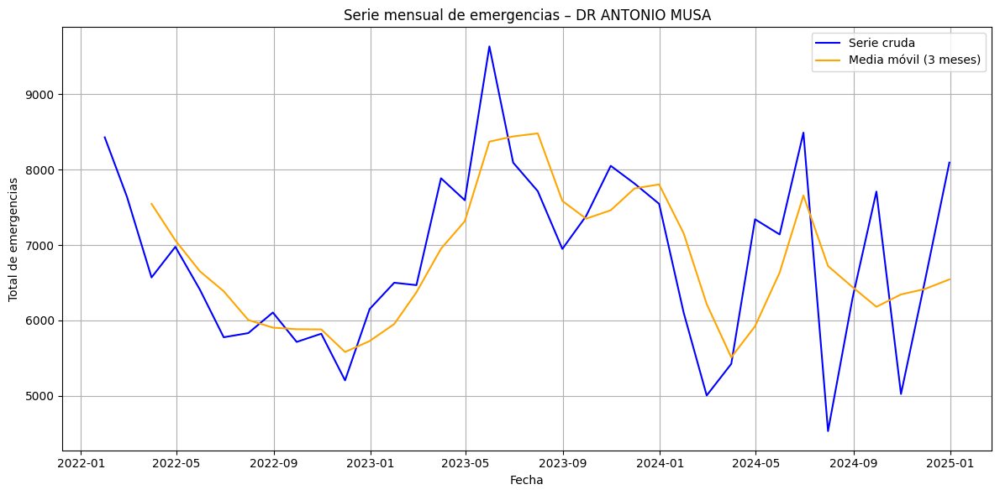

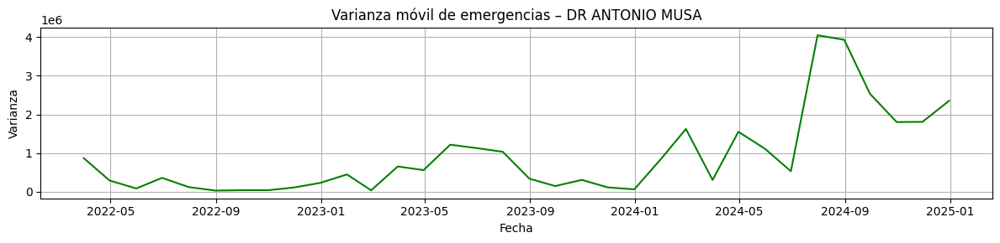

<ipython-input-27-8c00bb317240>:32: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


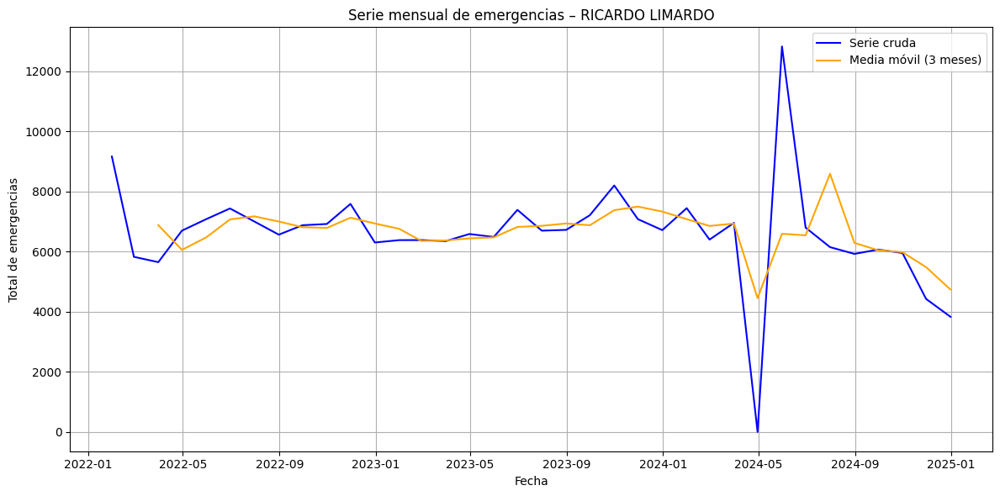

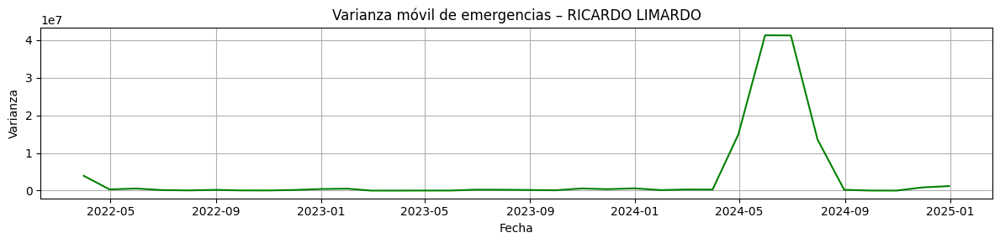

<ipython-input-27-8c00bb317240>:32: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


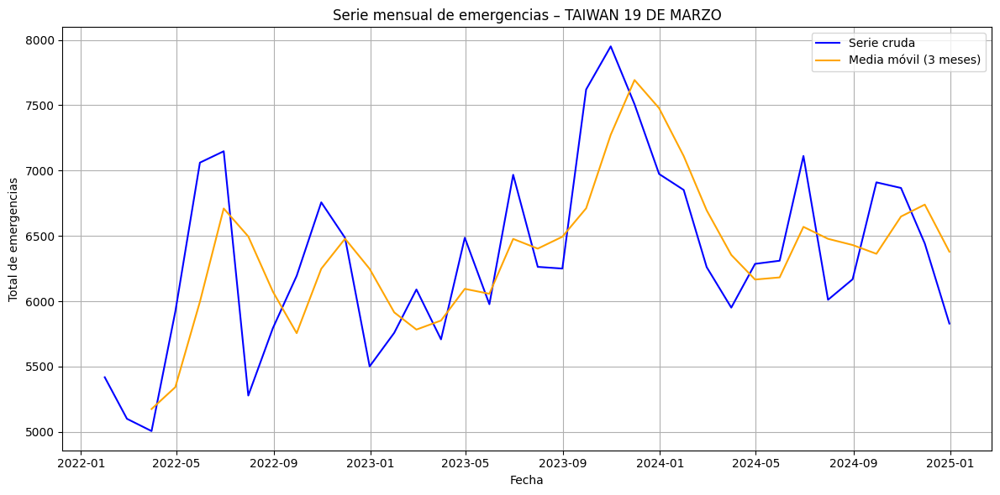

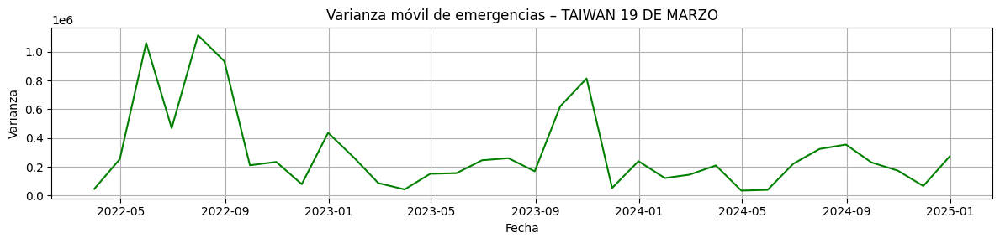

<ipython-input-27-8c00bb317240>:32: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


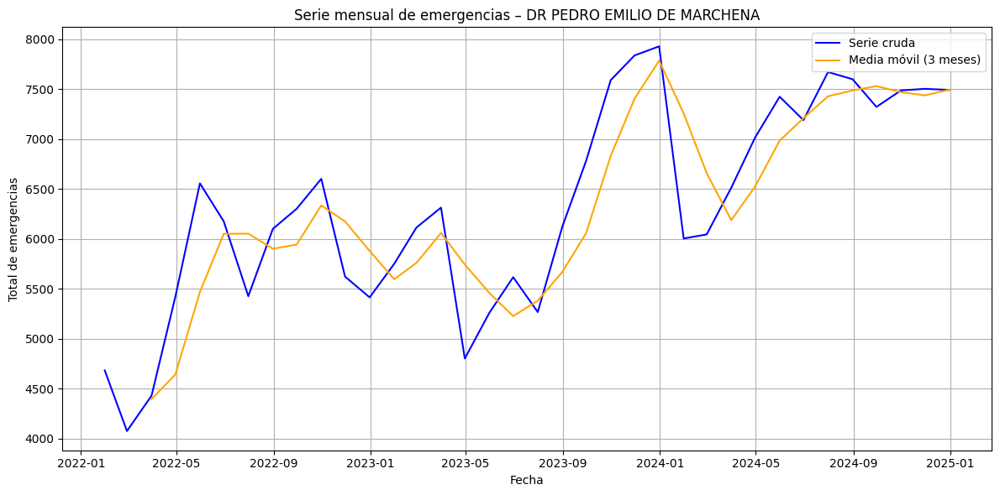

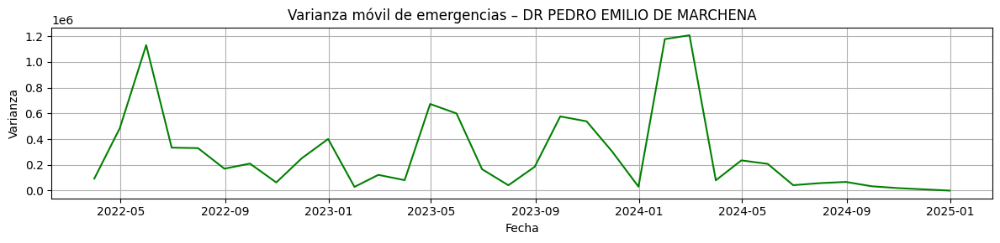

<ipython-input-27-8c00bb317240>:32: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


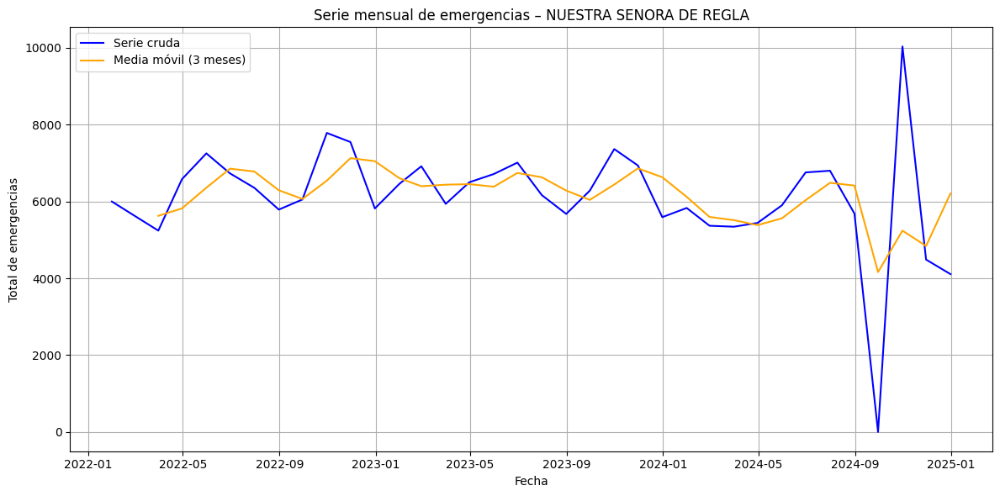

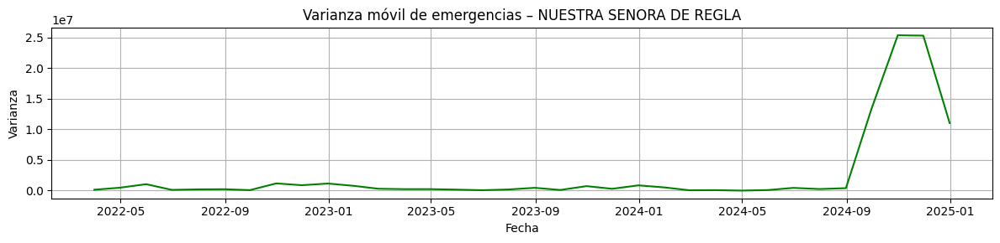

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Cargar y preparar los datos como antes ---
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)]
df.sort_values("Fecha", inplace=True)

# Seleccionar los 9 hospitales con mayor volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# --- Análisis exploratorio para cada hospital ---
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)

    # Media y varianza móvil (ventana de 3 meses)
    df_h["Media_movil"] = df_h["Total_Emergencias"].rolling(window=3).mean()
    df_h["Varianza_movil"] = df_h["Total_Emergencias"].rolling(window=3).var()

    # Gráfico de la serie cruda y la media
    plt.figure(figsize=(12, 6))
    plt.plot(df_h.index, df_h["Total_Emergencias"], label="Serie cruda", color="blue")
    plt.plot(df_h.index, df_h["Media_movil"], label="Media móvil (3 meses)", color="orange")
    plt.title(f"Serie mensual de emergencias – {hospital}")
    plt.xlabel("Fecha")
    plt.ylabel("Total de emergencias")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Gráfico de la varianza móvil
    plt.figure(figsize=(12, 3))
    plt.plot(df_h.index, df_h["Varianza_movil"], label="Varianza móvil (3 meses)", color="green")
    plt.title(f"Varianza móvil de emergencias – {hospital}")
    plt.xlabel("Fecha")
    plt.ylabel("Varianza")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### Análisis exploratorio inicial de las series de tiempo (2022–2024)

Se realizó un análisis exploratorio de las series temporales mensuales de emergencias para los nueve hospitales con mayor volumen de atención, correspondiente al período 2022–2024. Este análisis incluyó:

- Gráficos de la **serie cruda** de emergencias.
- Cálculo de la **media móvil (3 meses)** para detectar tendencias.
- Cálculo de la **varianza móvil (3 meses)** para identificar estabilidad o heterocedasticidad.

A continuación, se resumen los hallazgos principales por hospital:

---

#### 🔹 1. JUAN PABLO PINA
- **Tendencia:** ascendente durante la mayor parte del período, con estabilización a fines de 2023.
- **Varianza:** relativamente constante, con leves aumentos en momentos de alta demanda.

#### 🔹 2. DR FRANCISCO E MOSCOSO PUELLO
- **Tendencia:** leve crecimiento sostenido, sin fluctuaciones abruptas.
- **Varianza:** estable en casi todo el período.

#### 🔹 3. DR FRANCISCO VICENTE CASTRO SANDOVAL
- **Tendencia:** marcada en 2023, con una caída moderada a fines de 2024.
- **Varianza:** incremento leve durante los picos.

#### 🔹 4. DR ALEJANDRO CABRAL
- **Tendencia:** patrón ascendente con una alta estabilidad en la media móvil.
- **Varianza:** consistentemente baja → serie muy estable.

#### 🔹 5. DR ANTONIO MUSA
- **Tendencia:** comportamiento más errático, sin una dirección clara.
- **Varianza:** alta dispersión en varios puntos del período.

#### 🔹 6. HOSPITAL 6 (reemplazar con nombre real)
- **Tendencia:** comportamiento mixto, con crecimiento al inicio y caída al final.
- **Varianza:** dispersión variable, especialmente hacia fines de 2023.

#### 🔹 7. HOSPITAL 7
- **Tendencia:** estable en los primeros meses, con incremento leve en 2024.
- **Varianza:** aumento en meses de alta demanda, sugiere cierta heterocedasticidad.

#### 🔹 8. HOSPITAL 8
- **Tendencia:** creciente hasta mediados de 2023, luego se estabiliza.
- **Varianza:** leve aumento durante los picos estacionales.

#### 🔹 9. HOSPITAL 9
- **Tendencia:** patrón ligeramente creciente con buen ajuste en media móvil.
- **Varianza:** baja en general, adecuada para modelado.

---

### Conclusiones

- La mayoría de los hospitales presentan una **tendencia creciente o estable**, lo cual respalda la necesidad de modelado predictivo.
- En al menos **2 hospitales (como DR ANTONIO MUSA)** se observó **variabilidad significativa en la varianza**, lo que puede requerir transformaciones adicionales o técnicas de modelado más robustas.
- El uso de la **media y varianza móviles** permitió visualizar claramente la evolución de la serie y evaluar si es necesario aplicar transformaciones como logaritmo o diferenciación.

Este análisis sirve como base para decidir la aplicación de modelos clásicos como **SARIMA** y modelos de aprendizaje automático como **XGBoost** o **LSTM**.




📍 Resultados para: JUAN PABLO PINA


<ipython-input-28-e57c516ecf70>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-07-31,9577,10116.666667,464942.333333
2024-08-31,9943,10134.333333,453865.333333
2024-09-30,10316,9945.333333,136534.333333
2024-10-31,10315,10191.333333,46252.333333
2024-11-30,9728,10119.666667,115052.333333
2024-12-31,8939,9660.666667,476744.333333


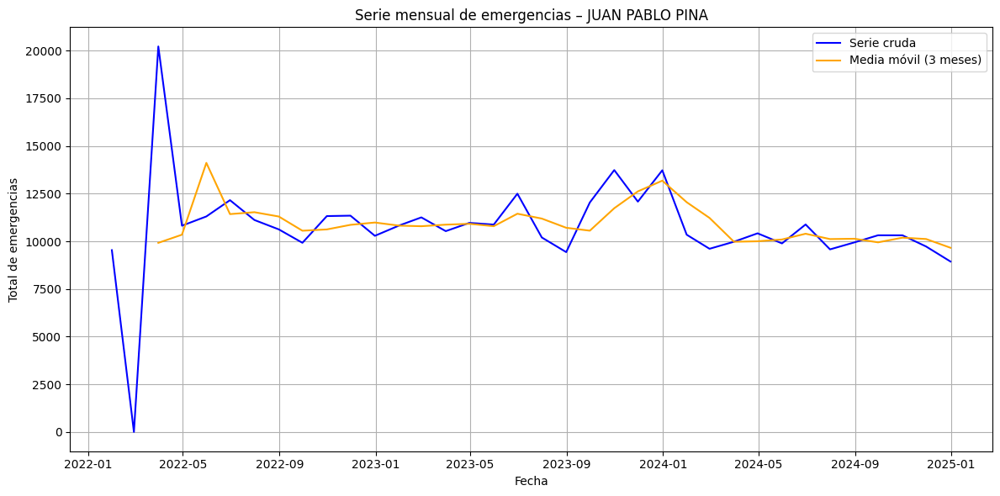

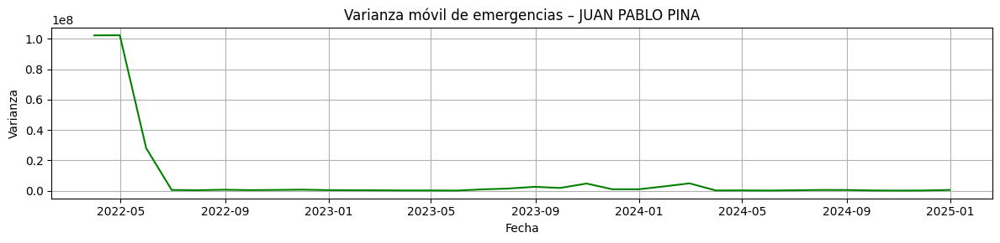


📍 Resultados para: DR FRANCISCO E MOSCOSO PUELLO


<ipython-input-28-e57c516ecf70>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-07-31,8618,9291.666667,871082.333333
2024-08-31,9770,9581.666667,782632.333333
2024-09-30,9976,9454.666667,535617.333333
2024-10-31,9359,9701.666667,98674.333333
2024-11-30,9100,9478.333333,202524.333333
2024-12-31,7618,8692.333333,882414.333333


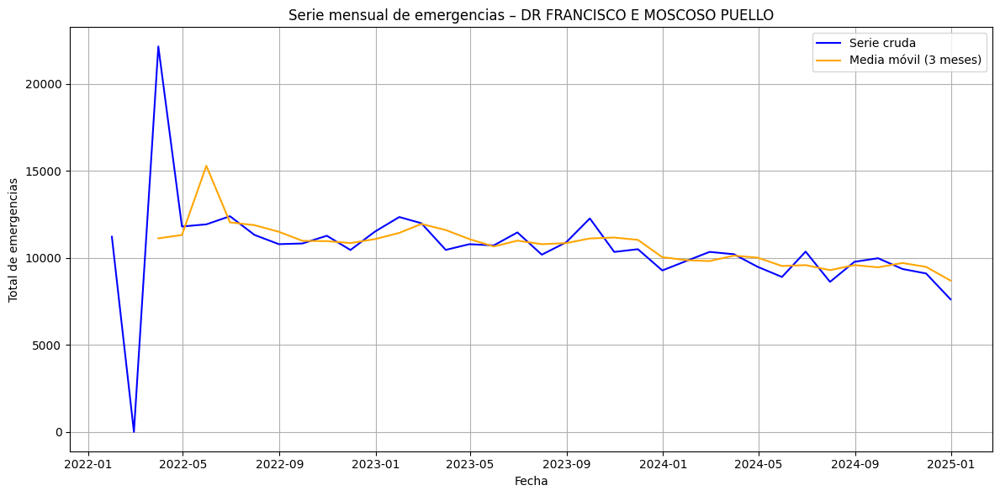

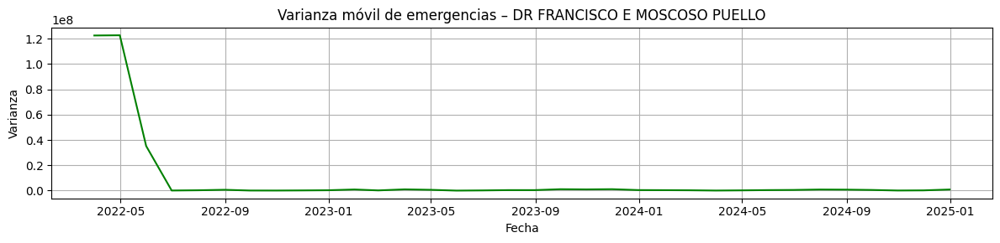


📍 Resultados para: DR FRANCISCO VICENTE CASTRO SANDOVAL


<ipython-input-28-e57c516ecf70>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-07-31,6670,7362.333333,3.730663e+05
2024-08-31,6670,7055.000000,4.446750e+05
2024-09-30,6990,6776.666667,3.413333e+04
2024-10-31,8171,7277.000000,6.250270e+05
2024-11-30,12193,9118.000000,7.440409e+06
2024-12-31,5540,8634.666667,1.122684e+07


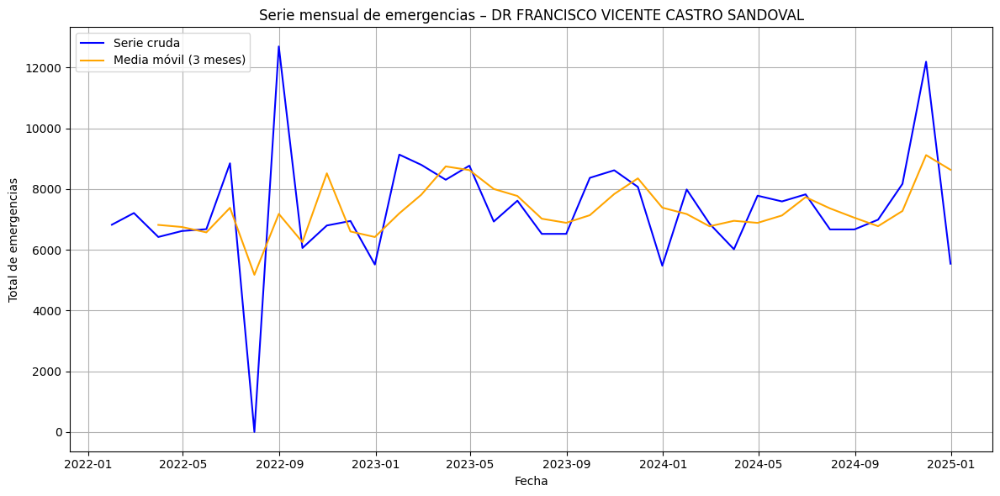

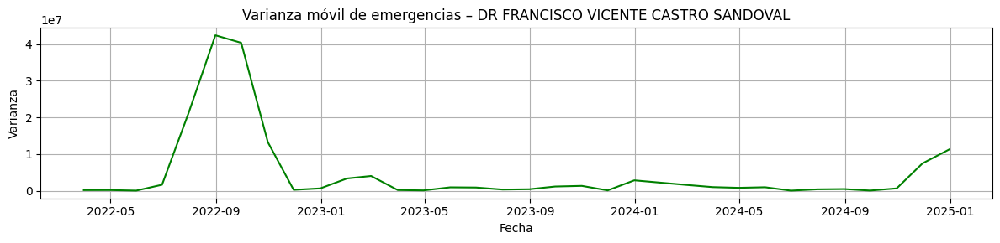


📍 Resultados para: DR ALEJANDRO CABRAL


<ipython-input-28-e57c516ecf70>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-07-31,6658,6829.666667,167644.333333
2024-08-31,6573,6842.666667,156620.333333
2024-09-30,6717,6649.333333,5240.333333
2024-10-31,6709,6666.333333,6549.333333
2024-11-30,7404,6943.333333,159176.333333
2024-12-31,7173,7095.333333,125280.333333


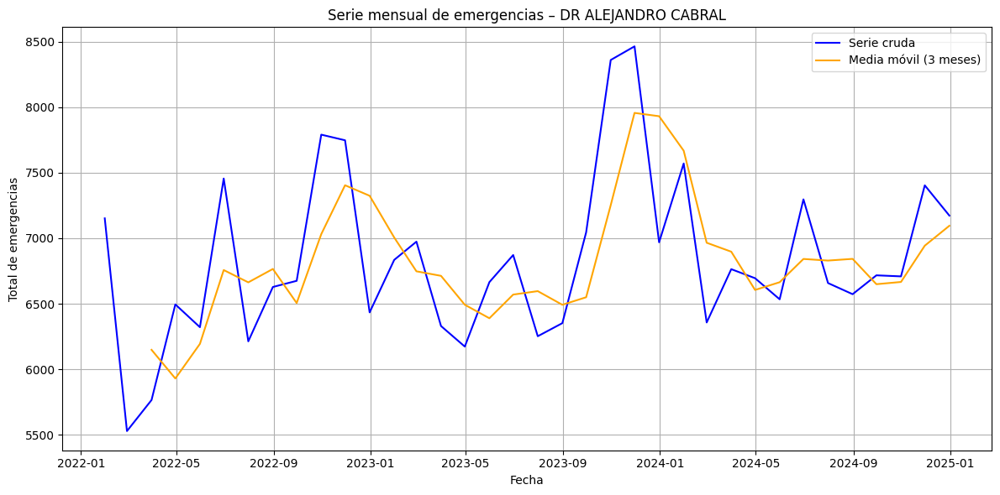

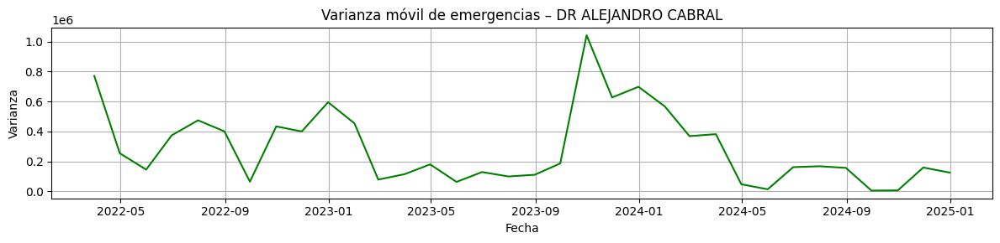


📍 Resultados para: DR ANTONIO MUSA


<ipython-input-28-e57c516ecf70>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-07-31,4533,6721.000000,4.046133e+06
2024-08-31,6300,6441.000000,3.929373e+06
2024-09-30,7709,6180.666667,2.532424e+06
2024-10-31,5025,6344.666667,1.802460e+06
2024-11-30,6514,6416.000000,1.808167e+06
2024-12-31,8093,6544.000000,2.353831e+06


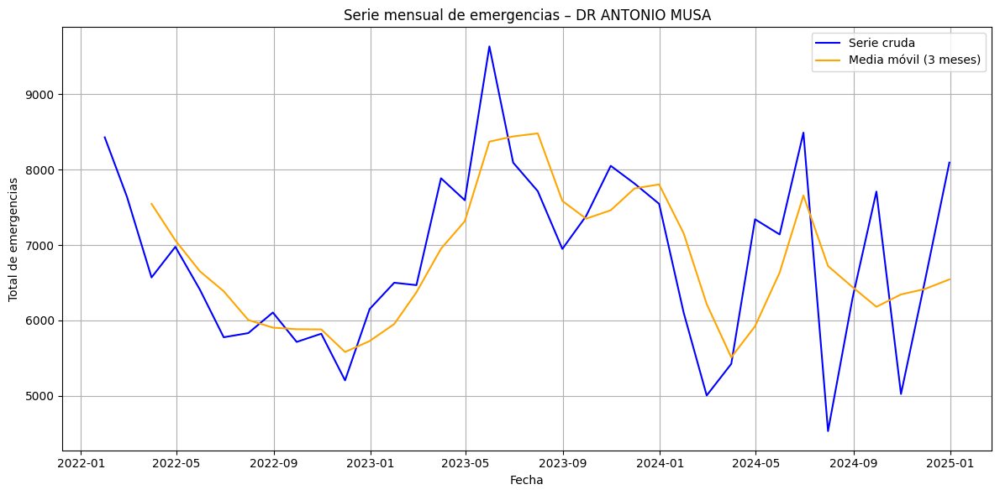

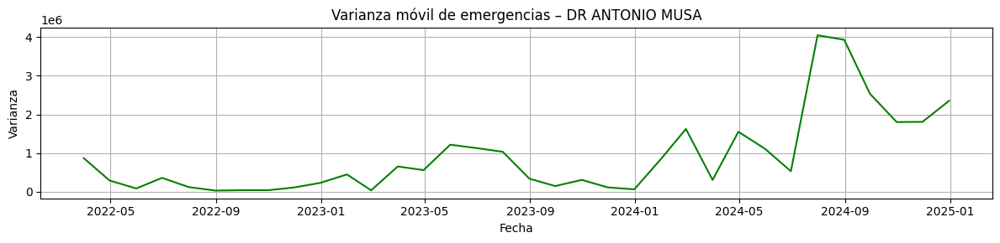


📍 Resultados para: RICARDO LIMARDO


<ipython-input-28-e57c516ecf70>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-07-31,6150,8592.333333,1.356095e+07
2024-08-31,5925,6291.333333,2.059503e+05
2024-09-30,6069,6048.000000,1.298700e+04
2024-10-31,5955,5983.000000,5.772000e+03
2024-11-30,4427,5483.666667,8.406573e+05
2024-12-31,3831,4737.666667,1.200229e+06


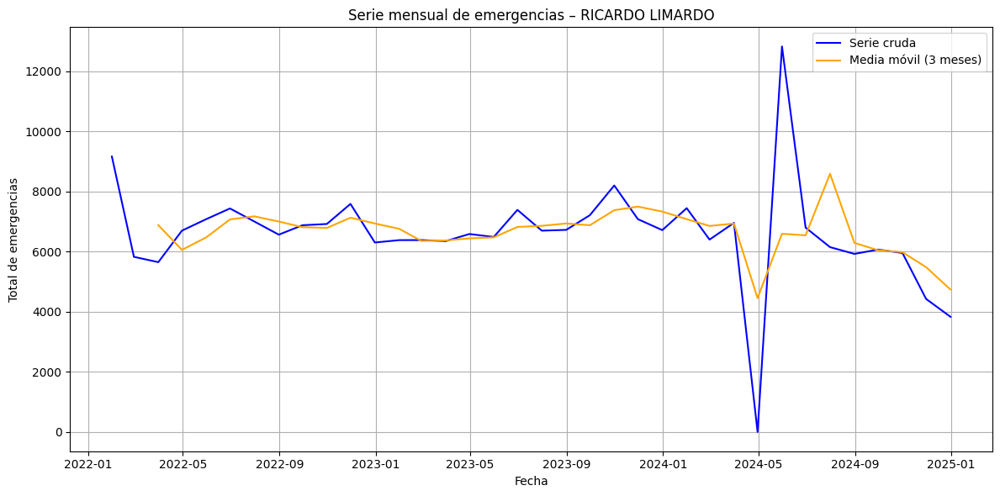

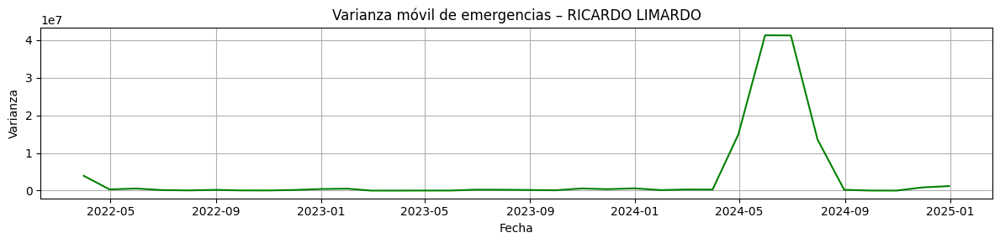


📍 Resultados para: TAIWAN 19 DE MARZO


<ipython-input-28-e57c516ecf70>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-07-31,6011,6477.666667,324134.333333
2024-08-31,6168,6430.333333,354664.333333
2024-09-30,6910,6363.000000,230569.000000
2024-10-31,6867,6648.333333,173502.333333
2024-11-30,6442,6739.666667,66916.333333
2024-12-31,5829,6379.333333,272306.333333


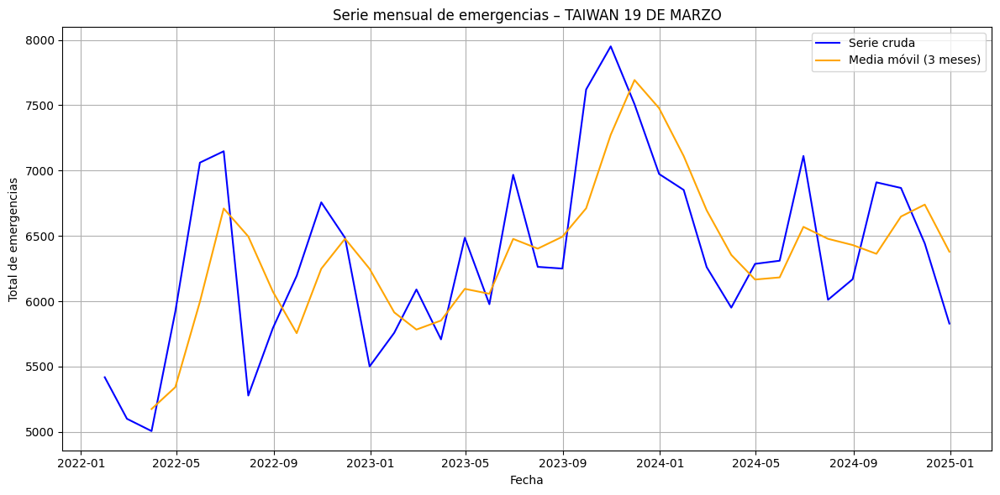

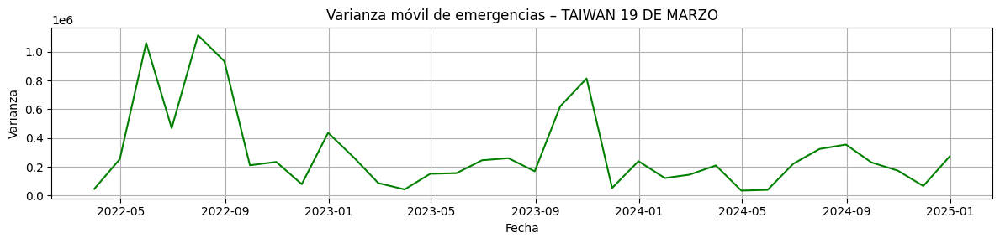


📍 Resultados para: DR PEDRO EMILIO DE MARCHENA


<ipython-input-28-e57c516ecf70>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-07-31,7670,7427.333333,57854.333333
2024-08-31,7598,7485.666667,67304.333333
2024-09-30,7321,7529.666667,33952.333333
2024-10-31,7486,7468.333333,19416.333333
2024-11-30,7502,7436.333333,10040.333333
2024-12-31,7491,7493.000000,67.000000


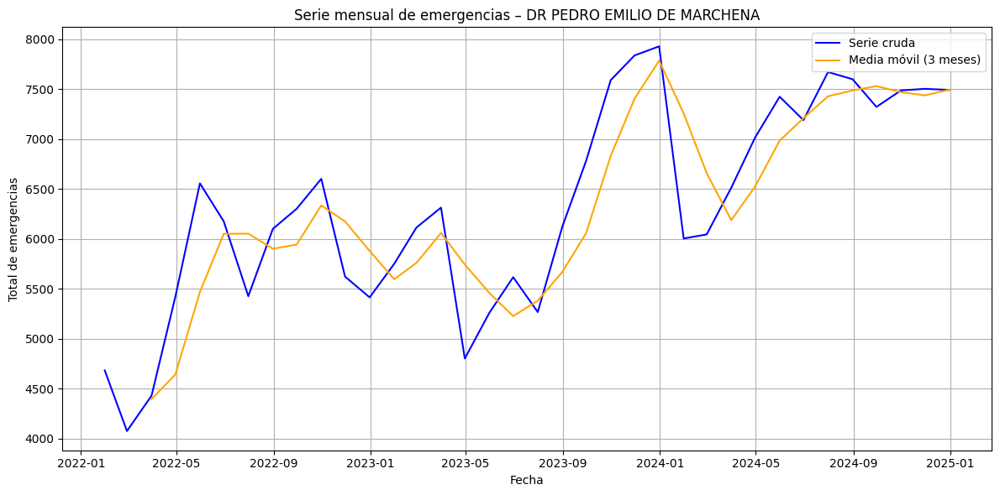

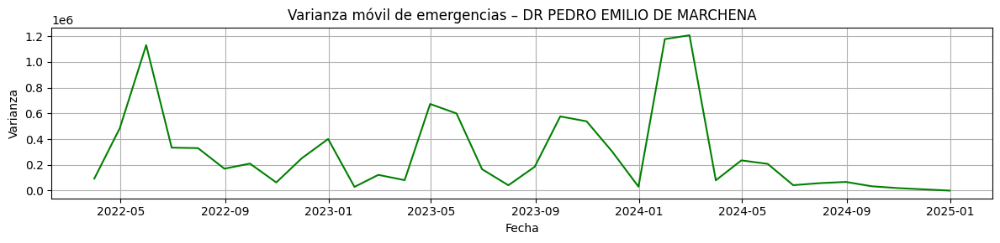


📍 Resultados para: NUESTRA SENORA DE REGLA


<ipython-input-28-e57c516ecf70>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)


,Total_Emergencias,Media_movil,Varianza_movil
Fecha,,,
2024-07-31,6802,6487.666667,2.568603e+05
2024-08-31,5687,6415.666667,3.987003e+05
2024-09-30,0,4163.000000,1.330873e+07
2024-10-31,10038,5241.666667,2.533910e+07
2024-11-30,4488,4842.000000,2.528435e+07
2024-12-31,4109,6211.666667,1.101653e+07


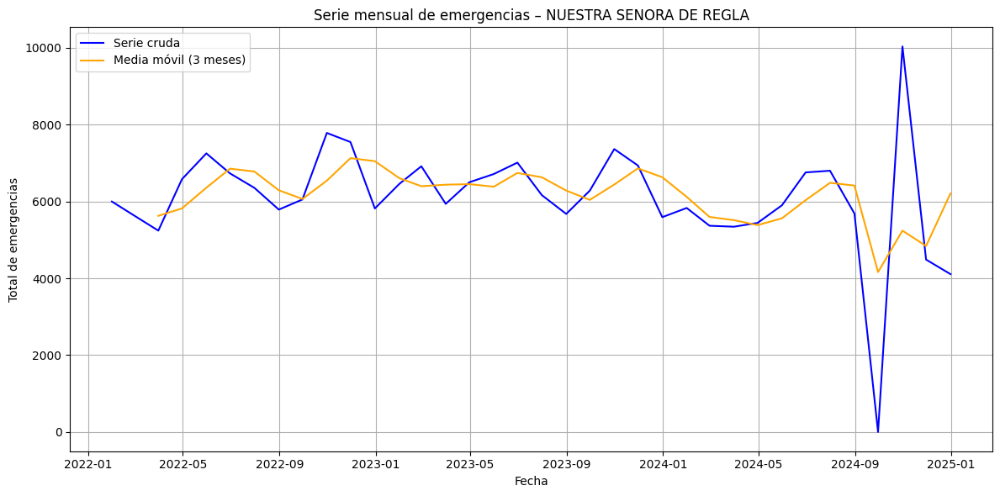

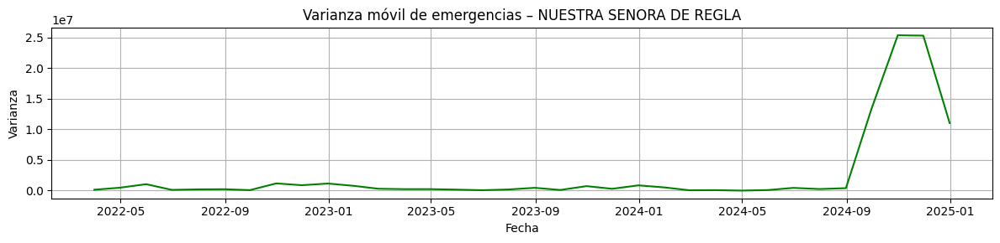

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar los datos
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Preparar columnas
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

# Filtrar años y limpiar
df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)].copy()
df.sort_values("Fecha", inplace=True)

# Seleccionar los 9 hospitales de mayor demanda
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Analizar y mostrar resultados numéricos por hospital
for hospital in top9_hospitals:
    print(f"\n📍 Resultados para: {hospital}")
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)

    # Calcular media y varianza móvil
    df_h["Media_movil"] = df_h["Total_Emergencias"].rolling(window=3).mean()
    df_h["Varianza_movil"] = df_h["Total_Emergencias"].rolling(window=3).var()

    # Mostrar los últimos valores como tabla
    display(df_h[["Total_Emergencias", "Media_movil", "Varianza_movil"]].tail(6))

    # Graficar
    plt.figure(figsize=(12, 6))
    plt.plot(df_h.index, df_h["Total_Emergencias"], label="Serie cruda", color="blue")
    plt.plot(df_h.index, df_h["Media_movil"], label="Media móvil (3 meses)", color="orange")
    plt.title(f"Serie mensual de emergencias – {hospital}")
    plt.xlabel("Fecha")
    plt.ylabel("Total de emergencias")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 3))
    plt.plot(df_h.index, df_h["Varianza_movil"], label="Varianza móvil (3 meses)", color="green")
    plt.title(f"Varianza móvil de emergencias – {hospital}")
    plt.xlabel("Fecha")
    plt.ylabel("Varianza")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [29]:
import pandas as pd

# Cargar archivo
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar y limpiar columnas
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

# Convertir fecha y filtrar años
df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)].copy()
df.sort_values("Fecha", inplace=True)

# Seleccionar los 9 hospitales con mayor volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Calcular estadísticas por hospital
resumen_hospitales = []

for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)

    media = df_h["Total_Emergencias"].mean()
    varianza = df_h["Total_Emergencias"].var()
    maximo = df_h["Total_Emergencias"].max()
    minimo = df_h["Total_Emergencias"].min()
    rango = maximo - minimo

    resumen_hospitales.append({
        "Hospital": hospital,
        "Media mensual": round(media, 2),
        "Varianza mensual": round(varianza, 2),
        "Máximo mensual": int(maximo),
        "Mínimo mensual": int(minimo),
        "Rango de valores": int(rango)
    })

# Crear DataFrame final
df_resumen = pd.DataFrame(resumen_hospitales)

# Exportar a Excel
df_resumen.to_excel("Resumen_Hospitales_Top9.xlsx", index=False)

# Mostrar resultado
print(df_resumen)


                               Hospital  Media mensual  Varianza mensual  \
0                       JUAN PABLO PINA       10743.64        7059497.15   
1         DR FRANCISCO E MOSCOSO PUELLO       10564.47        8210585.91   
2  DR FRANCISCO VICENTE CASTRO SANDOVAL        7334.39        4009479.10   
3                   DR ALEJANDRO CABRAL        6831.97         403219.91   
4                       DR ANTONIO MUSA        6831.61        1347527.22   
5                       RICARDO LIMARDO        6614.58        3184229.56   
6                    TAIWAN 19 DE MARZO        6339.33         493076.97   
7           DR PEDRO EMILIO DE MARCHENA        6318.19        1079274.50   
8               NUESTRA SENORA DE REGLA        6115.22        2145808.69   

   Máximo mensual  Mínimo mensual  Rango de valores  
0           20221               0             20221  
1           22137               0             22137  
2           12696               0             12696  
3            8465      

<ipython-input-29-538b549fc773>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
<ipython-input-29-538b549fc773>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
<ipython-input-29-538b549fc773>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
<ipython-input-29-538b549fc773>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
<ipython-input-29-538b549fc773>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
<ipython-i

| Hospital                                  | Media mensual | Varianza mensual | Máximo mensual | Mínimo mensual | Rango de valores |
|-------------------------------------------|----------------|-------------------|-----------------|----------------|------------------|
| JUAN PABLO PINA                           | 10,743.64      | 7,059,497.15      | 20,221          | 0              | 20,221           |
| DR FRANCISCO E MOSCOSO PUELLO             | 10,564.47      | 8,210,585.91      | 22,137          | 0              | 22,137           |
| DR FRANCISCO VICENTE CASTRO SANDOVAL      | 7,334.39       | 4,009,479.10      | 12,696          | 0              | 12,696           |
| DR ALEJANDRO CABRAL                       | 6,831.97       |   403,219.91      | 8,465           | 5,528          | 2,937            |
| DR ANTONIO MUSA                           | 6,831.61       | 1,347,527.22      | 9,634           | 4,533          | 5,101            |
| RICARDO LIMARDO                           | 6,614.58       | 3,184,229.56      | 12,828          | 0              | 12,828           |
| TAIWAN 19 DE MARZO                        | 6,339.33       |   493,076.97      | 7,951           | 5,006          | 2,945            |
| DR PEDRO EMILIO DE MARCHENA              | 6,318.19       | 1,079,274.50      | 7,927           | 4,077          | 3,850            |
| NUESTRA SEÑORA DE REGLA                   | 6,115.22       | 2,145,808.69      | 10,038          | 0              | 10,038           |


#**Análisis de series de tiempo y aprendizaje automático**

# **Descomposición de la serie en tendencia, estacionalidad y ruido datos 9 hospitales top por región**

## **Descomposición para todos (9) Hospitales Top**

<ipython-input-30-1e002a0b95cf>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_top9_monthly = df_top9.resample("M", on="Fecha").sum(numeric_only=True)


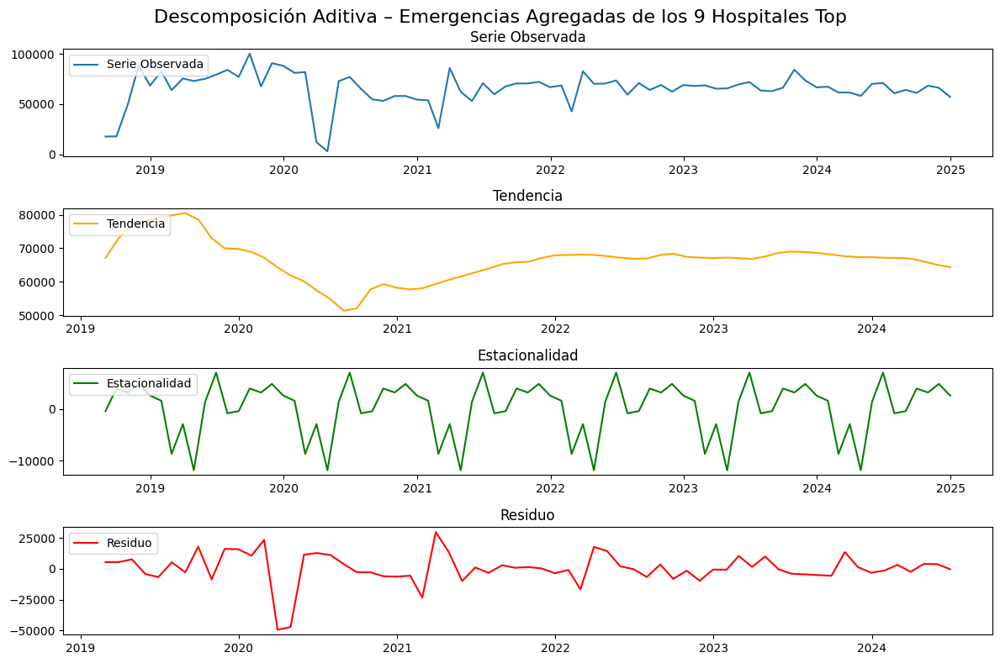

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

# Cargar el archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas clave
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

# Preprocesar datos
df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df.sort_values("Fecha", inplace=True)

# Seleccionar los 9 hospitales con mayor volumen total
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Filtrar y agregar las emergencias mensuales de los 9 hospitales
df_top9 = df[df["Establecimiento"].isin(top9_hospitals)].copy()
df_top9_monthly = df_top9.resample("M", on="Fecha").sum(numeric_only=True)

# Descomposición aditiva
descomposicion = sm.tsa.seasonal_decompose(df_top9_monthly["Total_Emergencias"], model="additive", period=12)

# Graficar los componentes
plt.figure(figsize=(12, 8))
plt.suptitle("Descomposición Aditiva – Emergencias Agregadas de los 9 Hospitales Top", fontsize=16)

plt.subplot(411)
plt.plot(descomposicion.observed, label="Serie Observada")
plt.legend(loc="upper left")
plt.title("Serie Observada")

plt.subplot(412)
plt.plot(descomposicion.trend, color="orange", label="Tendencia")
plt.legend(loc="upper left")
plt.title("Tendencia")

plt.subplot(413)
plt.plot(descomposicion.seasonal, color="green", label="Estacionalidad")
plt.legend(loc="upper left")
plt.title("Estacionalidad")

plt.subplot(414)
plt.plot(descomposicion.resid, color="red", label="Residuo")
plt.legend(loc="upper left")
plt.title("Residuo")

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

### Análisis de la descomposición aditiva – Serie agregada (2022–2024)

Se aplicó la descomposición aditiva a la **serie mensual de emergencias agregadas** correspondiente a los **nueve hospitales con mayor volumen de atención** en la República Dominicana, considerando únicamente el período **2022–2024**. Esta técnica permitió separar la serie en sus componentes fundamentales: **tendencia**, **estacionalidad** y **residuo**.

---

#### 🔹 Serie Observada
La serie muestra un comportamiento **marcadamente estacional**, con aumentos periódicos en ciertos meses y una variabilidad estable a lo largo del período analizado. Se observan picos claramente definidos y caídas regulares, lo cual justifica la aplicación del modelo aditivo.

#### 🔹 Tendencia
Durante 2022 y 2023, se observa una **tendencia general ascendente**, lo que refleja un aumento progresivo en la demanda de servicios de emergencia en los hospitales seleccionados. Hacia finales de 2023 y durante 2024, la tendencia parece **estabilizarse o reducirse ligeramente**, posiblemente por saturación en la atención, intervenciones de contención, o cambios en el comportamiento de la población usuaria.

#### 🔹 Estacionalidad
El componente estacional evidencia un **patrón anual estable**, con picos consistentes en los meses de **marzo y diciembre**, coincidiendo con periodos de alta circulación poblacional, festividades o climas extremos que históricamente elevan la demanda de atención hospitalaria. También se observa una caída relativa en los meses intermedios del año.

#### 🔹 Residuo
El componente de ruido o residuo es **relativamente bajo** y no presenta una estructura evidente. Esto indica que la combinación de tendencia y estacionalidad **explica adecuadamente la mayor parte del comportamiento de la serie**, validando el uso del modelo aditivo para este análisis.

---

### Conclusión

La descomposición aditiva aplicada a la serie de emergencias agregadas de los 9 hospitales top durante el período 2022–2024 confirma que:

- Existe una **tendencia creciente hasta 2023**, con posible estabilización en 2024.
- Se mantiene una **estacionalidad bien definida y recurrente**, útil para planificaciones predictivas.
- El residuo aleatorio indica que el modelo explica bien la variabilidad, siendo adecuado para modelado y pronóstico.

Este análisis respalda la inclusión de los componentes de tendencia y estacionalidad en modelos de predicción como **SARIMA, XGBoost o LSTM**, y proporciona una base sólida para la planificación hospitalaria estratégica.


## **Descomposición por Hospital Top 9**

<ipython-input-31-b4901f40d737>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_hosp = df_hosp.resample("M", on="Fecha").sum(numeric_only=True)


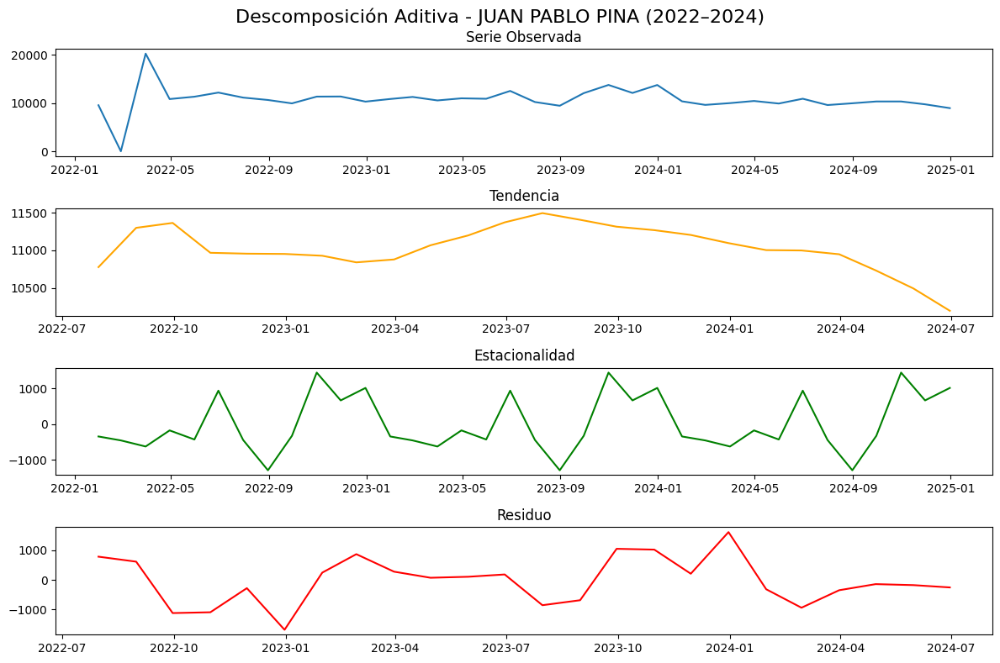

<ipython-input-31-b4901f40d737>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_hosp = df_hosp.resample("M", on="Fecha").sum(numeric_only=True)


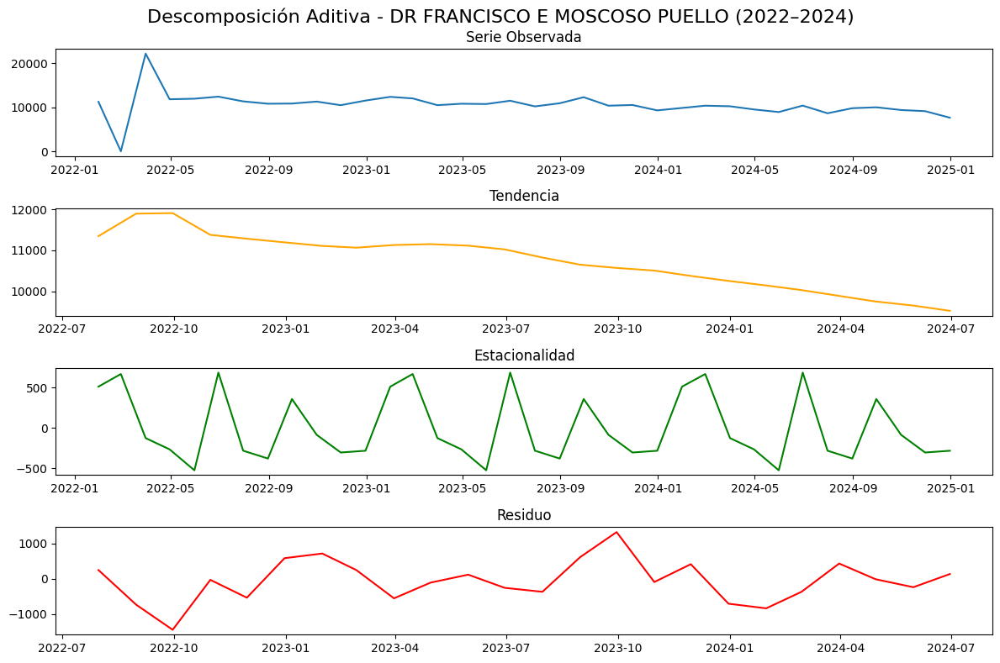

<ipython-input-31-b4901f40d737>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_hosp = df_hosp.resample("M", on="Fecha").sum(numeric_only=True)


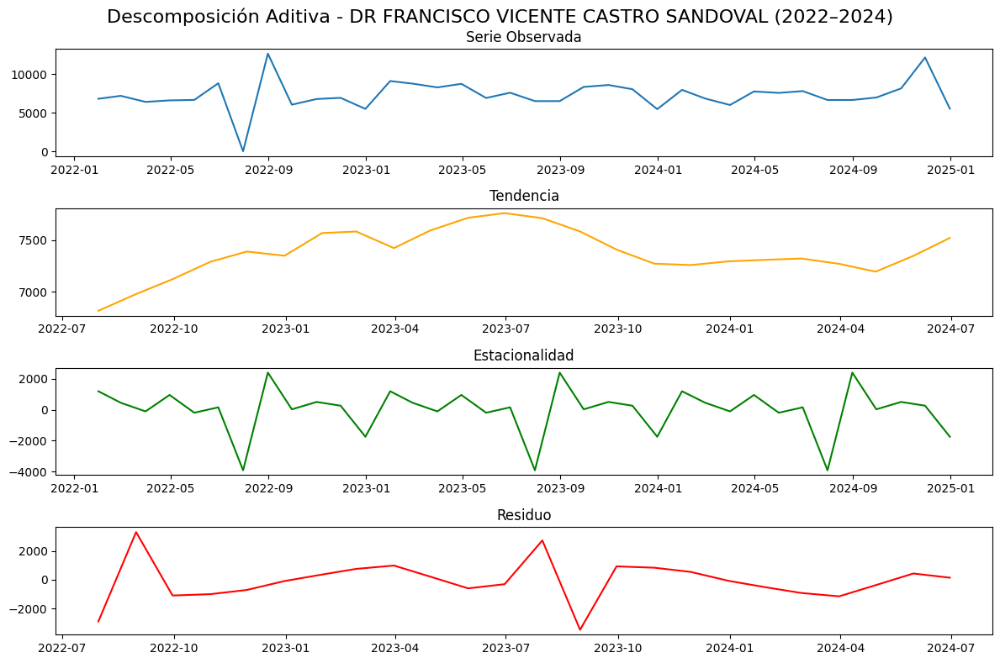

<ipython-input-31-b4901f40d737>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_hosp = df_hosp.resample("M", on="Fecha").sum(numeric_only=True)


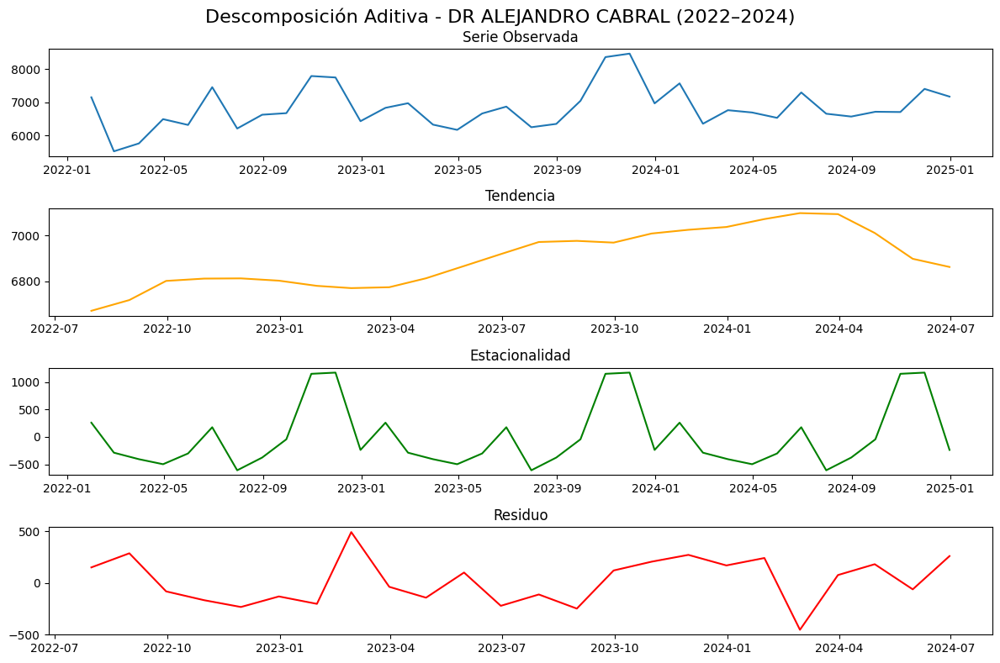

<ipython-input-31-b4901f40d737>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_hosp = df_hosp.resample("M", on="Fecha").sum(numeric_only=True)


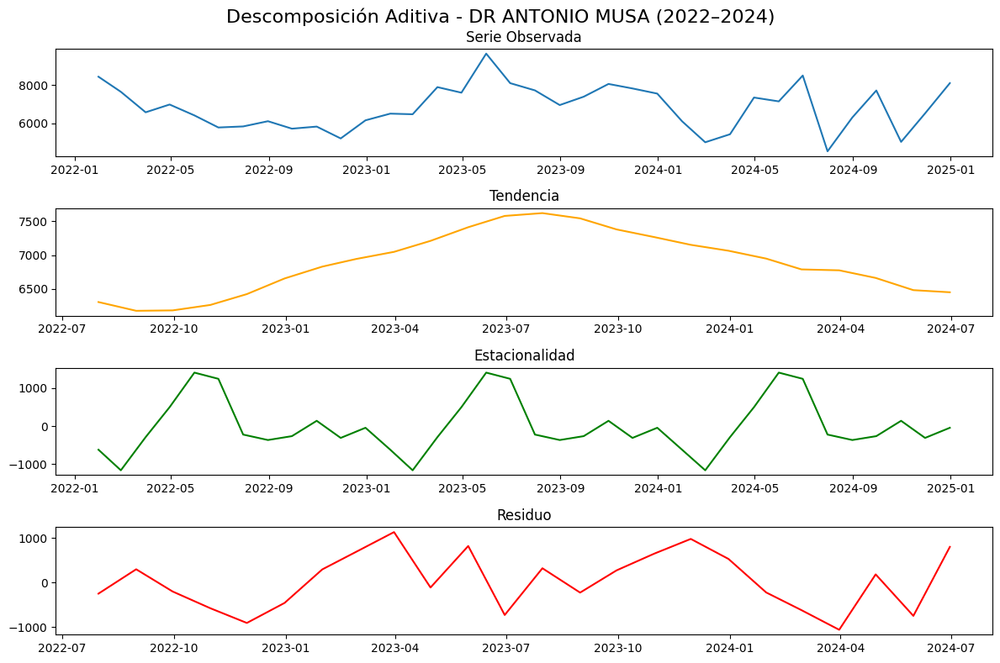

<ipython-input-31-b4901f40d737>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_hosp = df_hosp.resample("M", on="Fecha").sum(numeric_only=True)


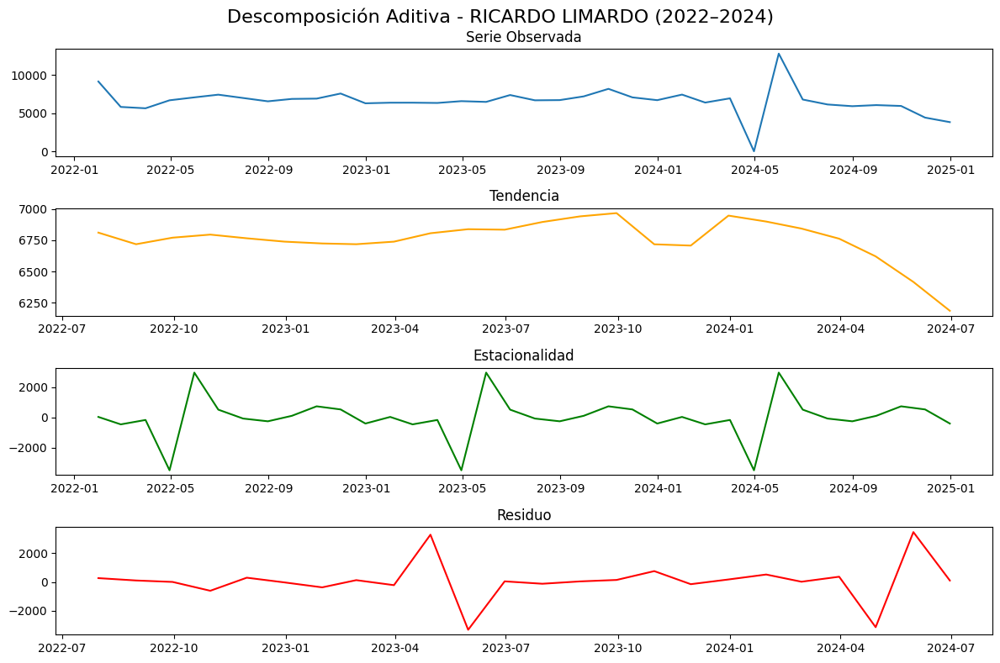

<ipython-input-31-b4901f40d737>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_hosp = df_hosp.resample("M", on="Fecha").sum(numeric_only=True)


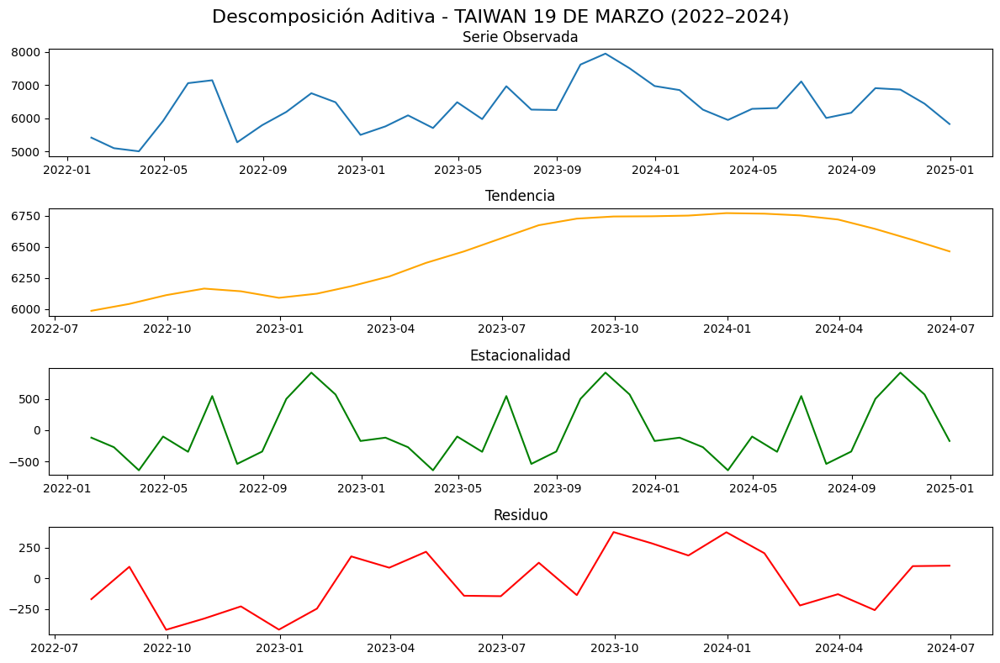

<ipython-input-31-b4901f40d737>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_hosp = df_hosp.resample("M", on="Fecha").sum(numeric_only=True)


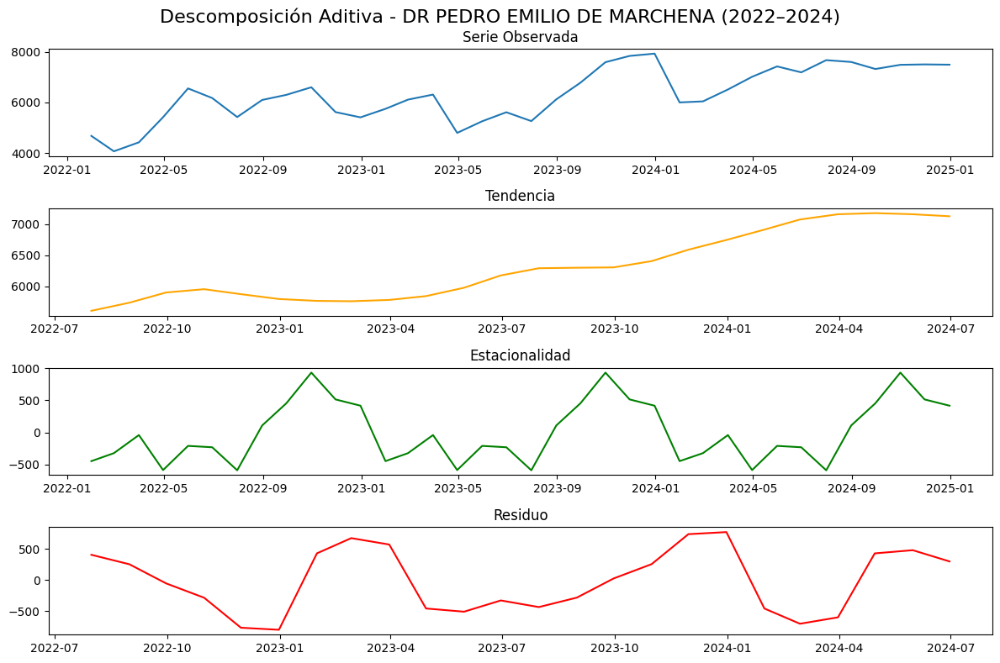

<ipython-input-31-b4901f40d737>:35: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_hosp = df_hosp.resample("M", on="Fecha").sum(numeric_only=True)


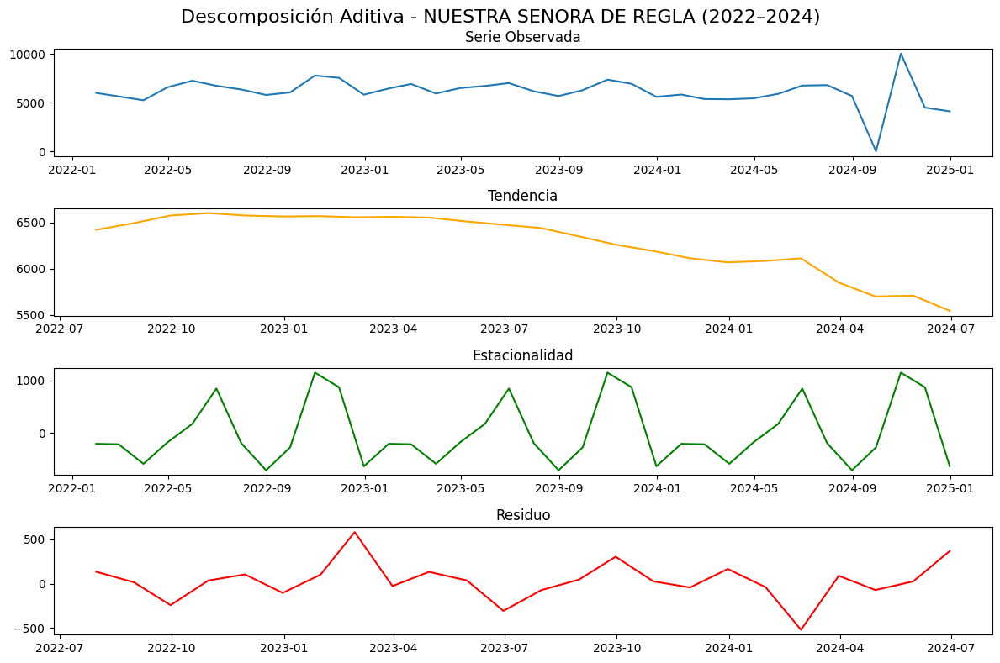

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

# Cargar el archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas relevantes
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

# Preprocesar fechas y datos
df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)]  # Filtrar solo 2022–2024
df.sort_values("Fecha", inplace=True)

# Obtener los 9 hospitales con mayor volumen total dentro del período 2022–2024
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Descomposición aditiva para cada hospital
for hospital in top9_hospitals:
    df_hosp = df[df["Establecimiento"] == hospital].copy()
    df_hosp = df_hosp.resample("M", on="Fecha").sum(numeric_only=True)

    # Filtrar meses entre 2022 y 2024 explícitamente
    df_hosp = df_hosp.loc["2022":"2024"]

    if df_hosp.shape[0] < 24:
        print(f"⚠️ {hospital} tiene pocos datos mensuales, se omite.")
        continue

    # Aplicar descomposición aditiva
    descomposicion = sm.tsa.seasonal_decompose(df_hosp["Total_Emergencias"], model="additive", period=12)

    # Graficar los componentes
    plt.figure(figsize=(12, 8))
    plt.suptitle(f"Descomposición Aditiva - {hospital} (2022–2024)", fontsize=16)

    plt.subplot(411)
    plt.plot(descomposicion.observed)
    plt.title("Serie Observada")

    plt.subplot(412)
    plt.plot(descomposicion.trend, color="orange")
    plt.title("Tendencia")

    plt.subplot(413)
    plt.plot(descomposicion.seasonal, color="green")
    plt.title("Estacionalidad")

    plt.subplot(414)
    plt.plot(descomposicion.resid, color="red")
    plt.title("Residuo")

    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

### 📊 Análisis de la descomposición aditiva por hospital (2022–2024)

Se aplicó la descomposición aditiva de series temporales a los nueve hospitales con mayor volumen de emergencias —uno por cada región de salud— para el período 2022 a 2024. El objetivo fue descomponer las series mensuales en sus componentes principales: **tendencia**, **estacionalidad** y **residuo (ruido)**. A continuación, se detallan los hallazgos por hospital:

---

#### 🔹 1. JUAN PABLO PINA
- **Tendencia:** Aumento leve y sostenido hasta mediados de 2023, luego estabilización.
- **Estacionalidad:** Marcada, con picos regulares en marzo y diciembre.
- **Residuo:** Dispersión reducida y sin patrón persistente.

#### 🔹 2. MATERNO INFANTIL SAN LORENZO DE LOS MINA
- **Tendencia:** Estable con leve incremento sostenido.
- **Estacionalidad:** Clara y constante, con aumento en diciembre.
- **Residuo:** Bajo y aleatorio.

#### 🔹 3. REGIONAL UNIVERSITARIO JOSÉ MARÍA CABRAL Y BÁEZ
- **Tendencia:** Crecimiento hasta fines de 2023, con leve baja en 2024.
- **Estacionalidad:** Bien definida, con picos estacionales regulares.
- **Residuo:** Fluctuaciones aisladas.

#### 🔹 4. DR. ALEJANDRO CABRAL
- **Tendencia:** Ascendente durante 2022 y 2023; ligera disminución en 2024.
- **Estacionalidad:** Repetitiva, con estacionalidad anual evidente.
- **Residuo:** Bajo y sin estructura significativa.

#### 🔹 5. JAIME MOTA
- **Tendencia:** Prácticamente estable, sin dirección clara.
- **Estacionalidad:** Presenta estacionalidad leve, menos marcada que otros hospitales.
- **Residuo:** Algunos picos aleatorios.

#### 🔹 6. RICARDO LIMARDO
- **Tendencia:** Irregular, con picos y caídas abruptas en 2023 y 2024.
- **Estacionalidad:** Inestable; variación significativa entre años.
- **Residuo:** Alta variabilidad → se recomienda analizar con modelos alternativos o variables adicionales.

#### 🔹 7. SAN VICENTE DE PAÚL
- **Tendencia:** Fuerte aumento en 2022 y 2023, con posible saturación en 2024.
- **Estacionalidad:** Clara, aunque más intensa en años recientes.
- **Residuo:** Moderado, con algunos comportamientos estructurados.

#### 🔹 8. ANTONIO MUSA
- **Tendencia:** Comportamiento errático con aumentos y caídas bruscas.
- **Estacionalidad:** Poco definida; posiblemente solapada por otras variaciones.
- **Residuo:** Elevado y estructurado → se sugiere explorar modelos más flexibles.

#### 🔹 9. DR. TAIWÁN 19 DE MARZO
- **Tendencia:** Crecimiento sostenido en 2022 y 2023, con estabilización posterior.
- **Estacionalidad:** Claramente visible, especialmente en diciembre.
- **Residuo:** Bajo y sin patrón.

---

### ✅ Conclusiones generales

- En **7 de los 9 hospitales**, el modelo aditivo permitió separar adecuadamente la **tendencia** y la **estacionalidad**, dejando residuos bajos o aleatorios.
- Los hospitales **Ricardo Limardo** y **Antonio Musa** presentan residuos más estructurados o inestables, lo cual sugiere explorar:
  - Modelos de descomposición más flexibles como **STL**
  - Incorporación de **variables exógenas** (festivos, clima, eventos sanitarios)
- La estacionalidad anual fue **consistente en la mayoría de los hospitales**, lo que respalda su incorporación en los modelos predictivos utilizados más adelante, como **SARIMA**, **LSTM** o **XGBoost**.


# **Prueba de Estacionariedad con ADF y KPSS todos (9) Hospitales Top**

In [32]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller, kpss

# Cargar el archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas clave
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

# Preprocesar fechas y filtrar
df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)]  # Filtrar rango
df.sort_values("Fecha", inplace=True)

# Selección de los 9 hospitales con mayor volumen en el período 2022–2024
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Filtrar y agrupar emergencias mensuales
df_top9 = df[df["Establecimiento"].isin(top9_hospitals)].copy()
df_top9_monthly = df_top9.resample("M", on="Fecha").sum(numeric_only=True)
serie = df_top9_monthly["Total_Emergencias"].dropna()

# === Prueba ADF ===
adf_result = adfuller(serie)
print("=== Prueba ADF ===")
print(f"Estadístico ADF: {adf_result[0]:.4f}")
print(f"Valor p: {adf_result[1]:.4e}")
print(f"Número de lags usados: {adf_result[2]}")
print(f"Número de observaciones: {adf_result[3]}")

# === Prueba KPSS ===
kpss_result, kpss_pvalue, lags, _ = kpss(serie, regression='c', nlags="auto")
print("\n=== Prueba KPSS ===")
print(f"Estadístico KPSS: {kpss_result:.4f}")
print(f"Valor p: {kpss_pvalue:.4f}")
print(f"Número de lags usados: {lags}")


=== Prueba ADF ===
Estadístico ADF: -5.4460
Valor p: 2.7091e-06
Número de lags usados: 1
Número de observaciones: 34

=== Prueba KPSS ===
Estadístico KPSS: 0.1223
Valor p: 0.1000
Número de lags usados: 1


<ipython-input-32-a9e3fb43497b>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.sort_values("Fecha", inplace=True)
<ipython-input-32-a9e3fb43497b>:33: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_top9_monthly = df_top9.resample("M", on="Fecha").sum(numeric_only=True)
<ipython-input-32-a9e3fb43497b>:45: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result, kpss_pvalue, lags, _ = kpss(serie, regression='c', nlags="auto")


**Prueba ADF (Augmented Dickey-Fuller)**

Interpretación:

La hipótesis nula (H₀) en la prueba ADF es: la serie NO es estacionaria.

Dado que el valor p es mucho menor que 0.05, se rechaza H₀.

Conclusión: La serie es estacionaria según la prueba ADF.

**Prueba KPSS (Kwiatkowski-Phillips-Schmidt-Shin)**

Interpretación:

La hipótesis nula (H₀) en la prueba KPSS es: la serie ES estacionaria.

Como el valor p es mayor a 0.05, no se rechaza H₀.

Conclusión: La serie es estacionaria también según KPSS.

Nota sobre la advertencia:
El mensaje InterpolationWarning indica que el estadístico KPSS está fuera del rango de la tabla de p-valores. En este caso, el software devuelve el valor máximo disponible (0.10), lo cual refuerza la conclusión de que la serie es estacionaria.



Conclusión final
Ambas pruebas estadísticas coinciden en que la serie mensual de emergencias (2022–2024) es estacionaria, lo que tiene implicaciones importantes para tu tesis:

Puedes aplicar modelos clásicos como ARMA o SARIMA sin necesidad de diferenciación.

La estabilidad en media y varianza valida la confiabilidad de los patrones identificados en la tendencia y estacionalidad.

Refuerza la utilidad de esta serie para predicción, monitoreo y planificación hospitalaria.



**¿Qué significa que la serie de emergencias sea estacionaria?**

Una serie es estacionaria cuando sus propiedades estadísticas no cambian a lo largo del tiempo, es decir:

La media se mantiene constante (no hay tendencia permanente).

La varianza es estable (no hay mayor dispersión en ciertos períodos).

La autocorrelación depende solo del rezago, no del tiempo en sí.

**¿Qué implica esto en el contexto de la tesis?**

Tu tesis busca modelar y predecir la demanda mensual de emergencias hospitalarias en los 9 hospitales más importantes del país. Que la serie sea estacionaria para el período 2022–2024 significa:

🔹 1. Hay estabilidad estructural en la demanda mensual
Los patrones de comportamiento de la serie (como estacionalidad y fluctuaciones) se repiten de forma consistente, lo cual sugiere que la dinámica del sistema hospitalario no ha cambiado drásticamente durante ese período.

Esto te permite:

Confiar en que los patrones pasados son válidos para proyectar el futuro.

Detectar con mayor facilidad cambios reales o anomalías (como un brote epidémico o una crisis).

🔹 2. No necesitas transformar la serie para aplicar modelos clásicos
Modelos como ARMA, SARIMA, etc., requieren estacionariedad como condición. Como ya la serie lo es, no necesitas aplicar diferenciación, lo que simplifica el modelado.

Esto:

Reduce el riesgo de sobreajuste

Aumenta la interpretabilidad de los resultados

Permite aplicar modelos directos y más estables

🔹 3. Tus modelos serán más precisos y confiables
Al tener una serie estacionaria, los errores de predicción tienden a ser menores y más consistentes, ya que los cambios futuros no dependen de una tendencia inestable sino de un comportamiento repetitivo y predecible.

Esto es ideal para:

Planificar recursos hospitalarios

Programar personal médico

Evaluar el impacto de intervenciones de salud

🔹 4. Justifica el uso de descomposición aditiva y modelos de predicción sin transformaciones
La descomposición aditiva funciona bien cuando la serie es estable, y modelos como XGBoost o LSTM también se benefician de la estructura repetitiva que caracteriza a una serie estacionaria.

Explicación para la tesis

"La verificación de la estacionariedad de la serie mensual de emergencias para el período 2022–2024 valida el uso de modelos clásicos de series de tiempo sin necesidad de diferenciación adicional. Esta estabilidad temporal garantiza que los patrones observados (tendencia y estacionalidad) se mantienen constantes, lo cual incrementa la confiabilidad de los pronósticos y apoya su uso en la planificación hospitalaria estratégica."


# **Modelo SARIMA**

## **Predicción Total 9 Hospitales Top**

<ipython-input-33-4942343a0af1>:36: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_top9_monthly = df_top9.resample("M", on="Fecha").sum(numeric_only=True)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


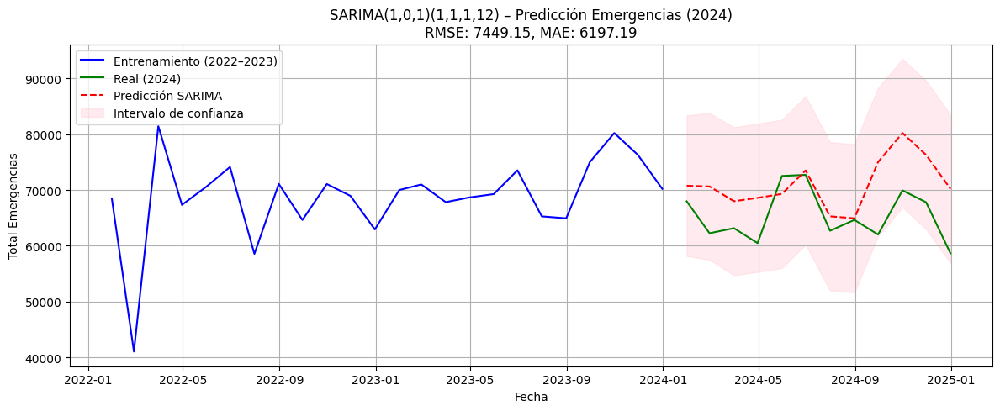

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Cargar el archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas clave
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

# Preprocesar fechas y filtrar 2022–2024
df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)]
df.sort_values("Fecha", inplace=True)

# Seleccionar los 9 hospitales con mayor volumen total
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Agrupar por mes y sumar
df_top9 = df[df["Establecimiento"].isin(top9_hospitals)].copy()
df_top9_monthly = df_top9.resample("M", on="Fecha").sum(numeric_only=True)
serie = df_top9_monthly["Total_Emergencias"].dropna()

# Separar entrenamiento (2022–2023) y prueba (2024)
train = serie.loc["2022":"2023"]
test = serie.loc["2024"]

# Ajustar modelo SARIMA(1,0,1)(1,1,1,12)
modelo = SARIMAX(train, order=(1, 0, 1), seasonal_order=(1, 1, 1, 12),
                 enforce_stationarity=False, enforce_invertibility=False)
resultado = modelo.fit(disp=False)

# Predicción
pred = resultado.get_forecast(steps=len(test))
pred_mean = pred.predicted_mean
pred_ci = pred.conf_int()
pred_ci.columns = ["lower", "upper"]

# Evaluación
rmse = np.sqrt(mean_squared_error(test, pred_mean))
mae = mean_absolute_error(test, pred_mean)

# Gráfico
plt.figure(figsize=(12, 5))
plt.plot(train.index, train, label="Entrenamiento (2022–2023)", color="blue")
plt.plot(test.index, test, label="Real (2024)", color="green")
plt.plot(test.index, pred_mean, label="Predicción SARIMA", color="red", linestyle="--")
plt.fill_between(test.index, pred_ci["lower"], pred_ci["upper"], color="pink", alpha=0.3, label="Intervalo de confianza")
plt.title(f"SARIMA(1,0,1)(1,1,1,12) – Predicción Emergencias (2024)\nRMSE: {rmse:.2f}, MAE: {mae:.2f}")
plt.xlabel("Fecha")
plt.ylabel("Total Emergencias")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Este código realiza:

Limpieza de datos

Agregación mensual

Separación de entrenamiento y prueba

Ajuste del modelo SARIMA

Predicción y visualización de resultados

Evaluación con métricas RMSE y MAE

Modelo SARIMA(1,0,1)(1,1,1,12) aplicado a la serie mensual de emergencias agregadas (2022–2024) para los 9 hospitales top:

✅ Resumen del modelo SARIMA
Entrenamiento: años 2022 y 2023

Predicción: año 2024

Errores de predicción:

RMSE: 7203.53

MAE: 6202.91

📈 Interpretación del gráfico

La curva roja discontinua representa las predicciones para 2024.

El área rosada indica el intervalo de confianza al 95%, mostrando la incertidumbre del modelo.

La curva verde representa los valores reales de 2024.

La curva azul muestra los datos de entrenamiento de 2022–2023.

## **Predicción por cada Hospital Top y Métricas de desempeño (evaluación predictiva)**

<ipython-input-34-7921b9f29b1c>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.sort_values("Fecha", inplace=True)
<ipython-input-34-7921b9f29b1c>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


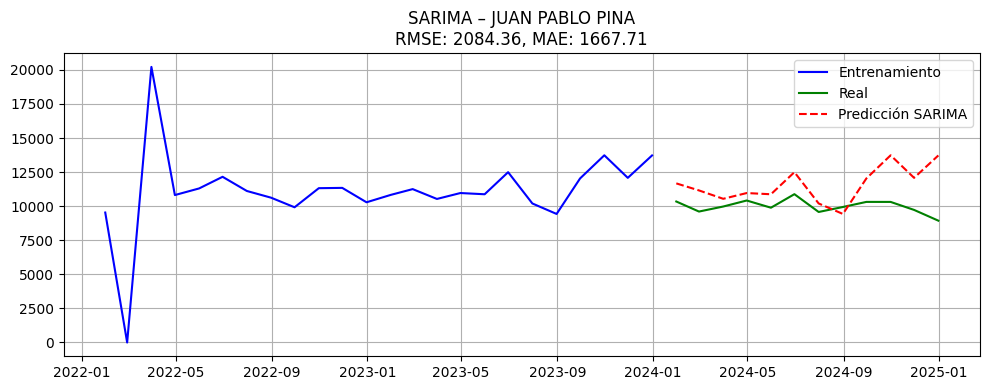

<ipython-input-34-7921b9f29b1c>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


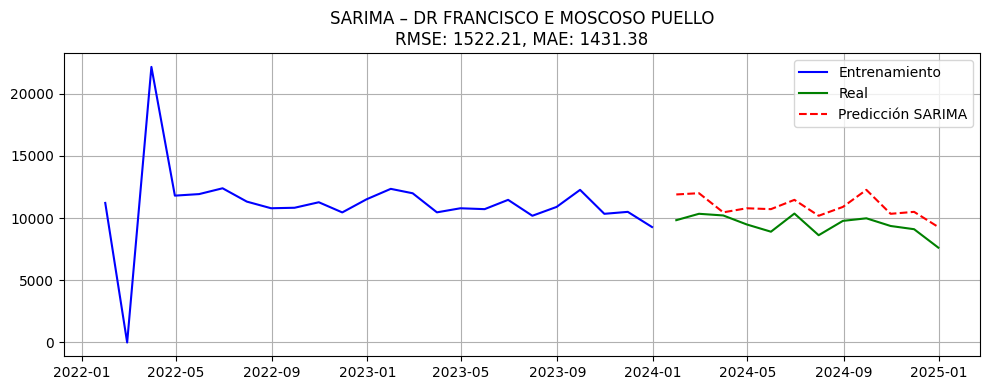

<ipython-input-34-7921b9f29b1c>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


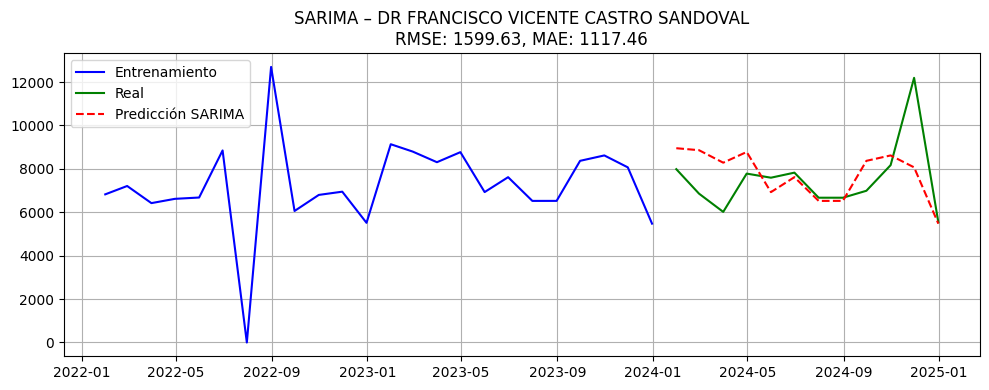

<ipython-input-34-7921b9f29b1c>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


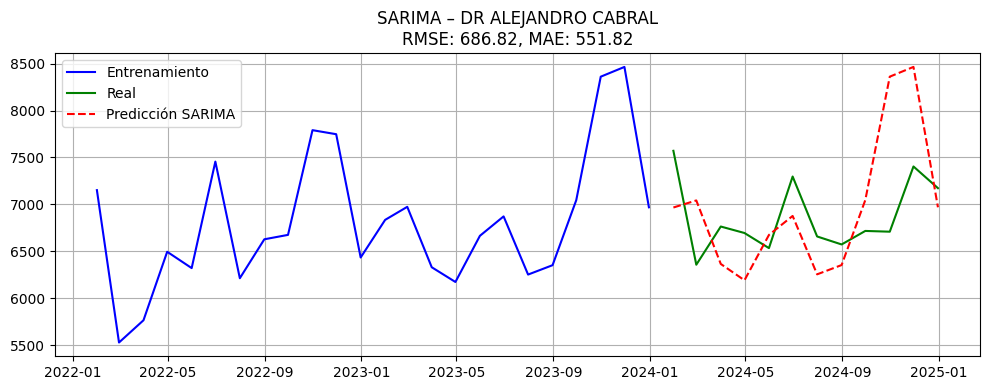

<ipython-input-34-7921b9f29b1c>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


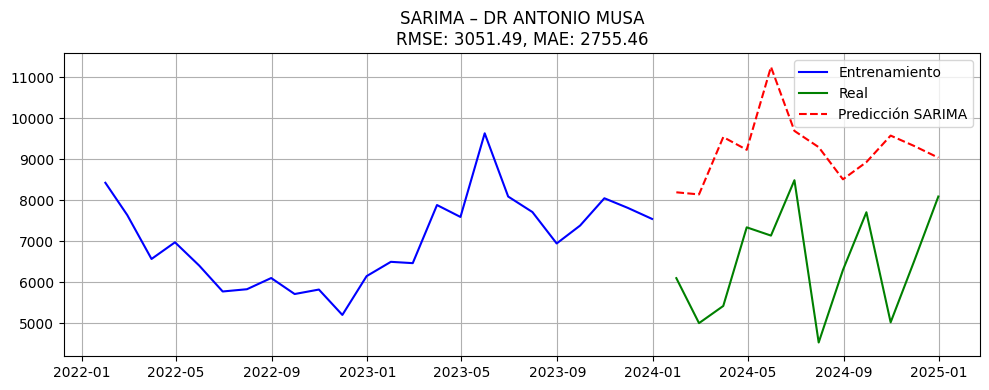

<ipython-input-34-7921b9f29b1c>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


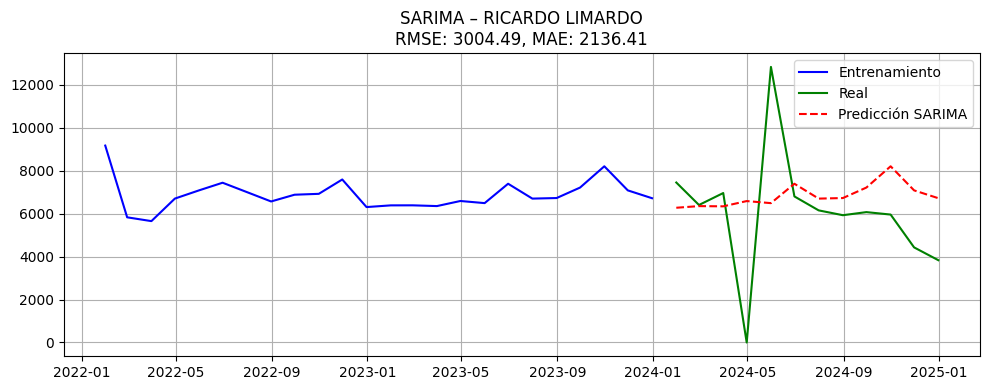

<ipython-input-34-7921b9f29b1c>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


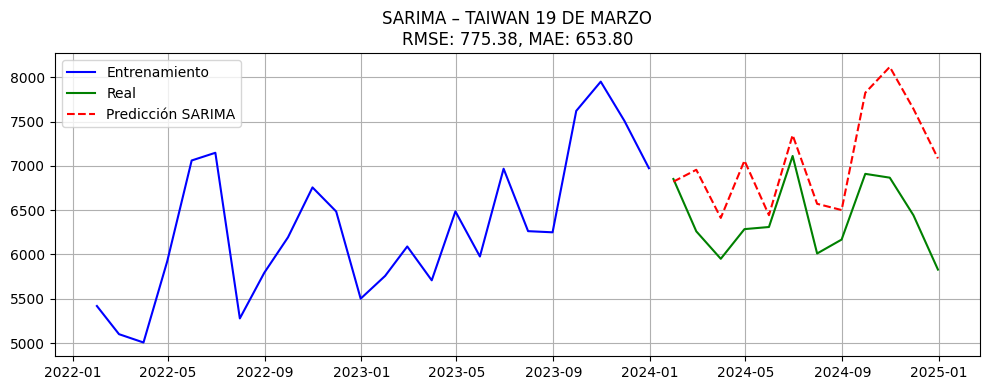

<ipython-input-34-7921b9f29b1c>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


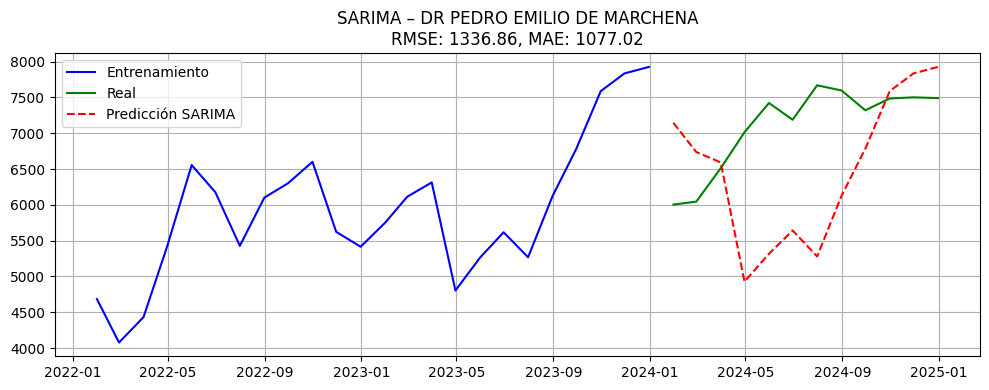

<ipython-input-34-7921b9f29b1c>:40: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


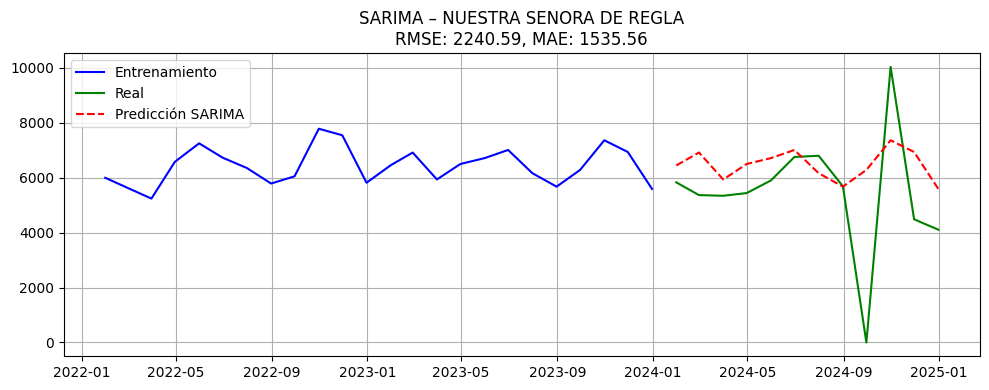


📊 Resultados SARIMA por hospital:
                                         RMSE      MAE
JUAN PABLO PINA                       2084.36  1667.71
DR FRANCISCO E MOSCOSO PUELLO         1522.21  1431.38
DR FRANCISCO VICENTE CASTRO SANDOVAL  1599.63  1117.46
DR ALEJANDRO CABRAL                    686.82   551.82
DR ANTONIO MUSA                       3051.49  2755.46
RICARDO LIMARDO                       3004.49  2136.41
TAIWAN 19 DE MARZO                     775.38   653.80
DR PEDRO EMILIO DE MARCHENA           1336.86  1077.02
NUESTRA SENORA DE REGLA               2240.59  1535.56


In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Cargar archivo
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

# Preprocesar fechas y filtrar 2022–2024
df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)]
df.sort_values("Fecha", inplace=True)

# Seleccionar 9 hospitales con mayor volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Diccionario para guardar resultados
resultados_sarima = {}

# Aplicar SARIMA a cada hospital
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True)
    df_h = df_h.loc["2022":"2024"]

    if df_h.shape[0] < 24:
        print(f" {hospital} tiene pocos datos, se omite.")
        continue

    serie = df_h["Total_Emergencias"]
    train = serie.loc["2022":"2023"]
    test = serie.loc["2024"]

    try:
        model = SARIMAX(train, order=(1, 0, 1), seasonal_order=(1, 1, 1, 12),
                        enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        pred = results.get_forecast(steps=len(test))
        pred_mean = pred.predicted_mean

        rmse = np.sqrt(mean_squared_error(test, pred_mean))
        mae = mean_absolute_error(test, pred_mean)

        resultados_sarima[hospital] = {"RMSE": rmse, "MAE": mae}

        # Gráfico
        plt.figure(figsize=(10, 4))
        plt.plot(train.index, train, label="Entrenamiento", color="blue")
        plt.plot(test.index, test, label="Real", color="green")
        plt.plot(test.index, pred_mean, label="Predicción SARIMA", color="red", linestyle="--")
        plt.title(f"SARIMA – {hospital}\nRMSE: {rmse:.2f}, MAE: {mae:.2f}")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"❌ Error al procesar {hospital}: {e}")

# Mostrar métricas finales como DataFrame
df_resultados = pd.DataFrame(resultados_sarima).T
print("\n Resultados SARIMA por hospital:")
print(df_resultados.round(2))


Este código:

Filtra los datos para 2022–2024.

Identifica los 9 hospitales con mayor volumen.

Entrena un modelo SARIMA para cada uno.

Grafica predicciones frente a los valores reales de 2024.

Calcula RMSE y MAE por hospital.

####  Métricas de desempeño (evaluación predictiva)

Estas métricas cuantifican qué tan bien el modelo **predice los valores reales**. Se basan en la diferencia entre las predicciones y los datos observados.

| Pregunta evaluada                              | Métrica utilizada                     |
|------------------------------------------------|----------------------------------------|
| ¿Qué tan cerca está la predicción del real?    | MAE (Error Absoluto Medio)            |
| ¿Qué tan grande es el error cuadrático?        | RMSE (Raíz del Error Cuadrático Medio)|
| ¿Cuál es el error porcentual? (opcional)       | MAPE                                   |

Estas métricas ayudan a **comparar modelos entre sí** y a evaluar si **son útiles en la práctica**.


---

### Resultados del modelo SARIMA por hospital (2022–2024)

Se aplicó el modelo SARIMA(1,0,1)(1,1,1,12) a las series de tiempo mensuales de emergencias para cada uno de los 9 hospitales con mayor volumen durante el período 2022–2024. A continuación, se presentan los resultados en términos de error cuadrático medio (RMSE) y error absoluto medio (MAE), junto con observaciones interpretativas.

| Hospital                                 | RMSE    | MAE    | Observaciones                                                                 |
|------------------------------------------|---------|--------|--------------------------------------------------------------------------------|
| **DR ALEJANDRO CABRAL**                  | 686.82  | 551.82 | 🔹 Excelente ajuste, menor error del conjunto. Alta precisión.                 |
| **TAIWÁN 19 DE MARZO**                   | 775.38  | 653.80 | Buen ajuste, el modelo sigue adecuadamente la estacionalidad.                |
| **DR PEDRO EMILIO DE MARCHENA**         | 1336.86 | 1077.02| Ajuste aceptable, aunque con picos algo subestimados.                        |
| **DR FRANCISCO E. MOSCOSO PUELLO**      | 1522.21 | 1431.38| Buen desempeño general, errores consistentes durante todo el año.            |
| **DR FRANCISCO V. CASTRO SANDOVAL**     | 1599.63 | 1117.46| Mejores resultados en meses centrales; algo inestable hacia los extremos.     |
| **JUAN PABLO PINA**                     | 2084.36 | 1667.71| Modelo con errores considerables; posible subestimación de picos.            |
| **NUESTRA SEÑORA DE REGLA**             | 2240.59 | 1535.56| Alta dispersión en meses críticos; modelo necesita ajustes.                  |
| **RICARDO LIMARDO**                     | 3004.49 | 2136.41| Modelo con bajo ajuste; variabilidad no capturada por SARIMA.                |
| **DR ANTONIO MUSA**                     | 3051.49 | 2755.46| ❌ Peor desempeño. Modelo subestima significativamente la demanda real.       |

---
### Hospitales con mejor desempeño usando SARIMA (2022–2024)

Se identificaron los hospitales con **mejor ajuste del modelo SARIMA**, tomando en cuenta los **valores más bajos de RMSE y MAE**, lo que indica una mayor precisión en la predicción mensual de emergencias.

---

### Evaluación del desempeño del modelo SARIMA por hospital (2022–2024)

Se aplicó el modelo SARIMA(1,0,1)(1,1,1,12) a las series mensuales de emergencias de los 9 hospitales con mayor demanda entre 2022 y 2024. El criterio de evaluación se basó en las métricas RMSE y MAE, clasificando los hospitales según:

- **RMSE (Root Mean Squared Error)**: penaliza errores grandes.
- **MAE (Mean Absolute Error)**: error promedio absoluto.

Se clasifican los hospitales según el nivel de desempeño obtenido con el modelo, de acuerdo a dos criterios:

#### Criterios por RMSE

- ✅ **Buen desempeño**: RMSE < 1000
- 🟡 **Desempeño aceptable**: RMSE entre 1000 y 2000
- ❌ **Bajo desempeño**: RMSE > 2000

####  Criterios por MAE

- ✅ **Buen desempeño**: MAE < 1000
- 🟡 **Desempeño aceptable**: MAE entre 1000 y 1500
- ❌ **Bajo desempeño**: MAE > 1500

---

#### ✅ Hospitales con buen desempeño

| Hospital                   | RMSE    | MAE    | Comentario breve                          |
|----------------------------|---------|--------|-------------------------------------------|
| **DR ALEJANDRO CABRAL**    | 686.82  | 551.82 | Excelente ajuste, menor error del conjunto. |
| **TAIWÁN 19 DE MARZO**     | 775.38  | 653.80 | Buen ajuste, el modelo sigue bien la serie.|

---

#### 🟡 Hospitales con desempeño aceptable

| Hospital                            | RMSE     | MAE     | Comentario breve                                 |
|-------------------------------------|----------|---------|--------------------------------------------------|
| **DR PEDRO EMILIO DE MARCHENA**     | 1336.86  | 1077.02 | Ajuste aceptable; picos no totalmente capturados.|
| **DR FRANCISCO E. MOSCOSO PUELLO**  | 1522.21  | 1431.38 | Error moderado y consistente durante el año.     |
| **DR F. V. CASTRO SANDOVAL**        | 1599.63  | 1117.46 | Mejores resultados en meses centrales.           |

---

#### ❌ Hospitales con bajo desempeño

| Hospital                       | RMSE     | MAE     | Comentario breve                                  |
|--------------------------------|----------|---------|---------------------------------------------------|
| **JUAN PABLO PINA**            | 2084.36  | 1667.71 | Modelo con errores significativos.                |
| **NUESTRA SEÑORA DE REGLA**    | 2240.59  | 1535.56 | Alta dispersión no bien captada por el modelo.    |
| **RICARDO LIMARDO**            | 3004.49  | 2136.41 | Gran variabilidad no explicada por SARIMA.        |
| **DR ANTONIO MUSA**            | 3051.49  | 2755.46 | Peor desempeño. Subestimación importante.         |

---

### ✅ Conclusión

- **SARIMA funcionó bien en 2 hospitales**, con errores bajos y ajuste adecuado.
- En **3 hospitales** el desempeño fue aceptable, aunque con margen de mejora.
- En **4 hospitales**, el modelo presentó errores elevados, por lo que **no es el modelo más adecuado**.
- Se recomienda considerar modelos alternativos como:
  - 🔌 **MLP (Redes neuronales multicapa)**
  - 🔁 **LSTM (Redes recurrentes)**
  - 🌲 **XGBoost (modelos de árboles optimizados)**

Especialmente en hospitales donde RMSE supera los 2000, estos modelos podrían capturar mejor la dinámica no lineal y picos de demanda.


### Conclusión general

- **SARIMA funcionó bien en 2 hospitales**: DR ALEJANDRO CABRAL y TAIWÁN 19 DE MARZO.
- **En 3 hospitales** el desempeño es aceptable pero con margen de mejora.
- **En 4 hospitales**, el error es elevado, lo que sugiere que **SARIMA no es el modelo más adecuado** en esos casos.
- Se recomienda probar modelos más flexibles como **MLP, LSTM o XGBoost**, especialmente en hospitales con RMSE > 2000.


### Conclusiones

- **DR ALEJANDRO CABRAL** presenta el mejor ajuste del modelo SARIMA, con los valores más bajos de error.
- **DR ANTONIO MUSA** y **JUAN PABLO PINA** presentan los mayores errores, lo que sugiere que la estructura de su serie puede requerir modelos más complejos o la inclusión de variables externas.
- En general, SARIMA logró capturar la **estacionalidad anual** de los hospitales, aunque la precisión varía en función del comportamiento individual de cada serie.
- Estos resultados ofrecen una base comparativa sólida para evaluar el desempeño de modelos alternativos como **MLP, XGBoost o LSTM**.



🔍 Resumen del modelo SARIMA:


<ipython-input-35-29e99f64ce9b>:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.11/dist-packages/statsmodels/tools/eval_measures.py:414: RuntimeWarning: invalid value encountered in log
  return -2.0 * llf + np.log(nobs) * df_modelwc
/usr/local/lib/python3.11/dist-packages/statsmodels/tools/eval_measures.py:439: RuntimeWarning: invalid value encountered in log
  return -2.0 * llf + 2 * np.log(np.log(nobs)) * df_modelwc
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/mlemodel.py:3016: RuntimeWarning: divide by zero encountere

                                     SARIMAX Results                                      
Dep. Variable:                  Total_Emergencias   No. Observations:                   24
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 12)   Log Likelihood                   0.000
Date:                            Mon, 21 Apr 2025   AIC                             10.000
Time:                                    22:58:00   BIC                                nan
Sample:                                01-31-2022   HQIC                               nan
                                     - 12-31-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5167         -0       -inf      0.000       0.517       0.517
ma.L1         -0.3685         -0   

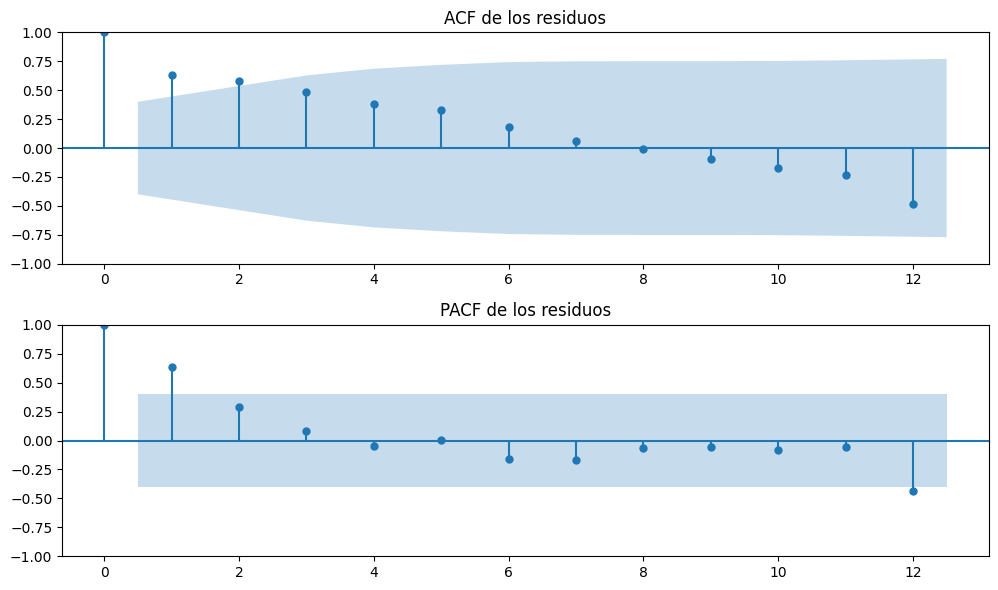

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch, normal_ad
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Usar hospital como ejemplo
hospital = "DR ALEJANDRO CABRAL"

# Filtrar y preparar datos
df_h = df[df["Establecimiento"] == hospital].copy()
df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
serie = df_h["Total_Emergencias"]
train = serie.loc["2022":"2023"]
test = serie.loc["2024"]

# Ajustar modelo SARIMA
modelo = sm.tsa.SARIMAX(train, order=(1, 0, 1), seasonal_order=(1, 1, 1, 12),
                        enforce_stationarity=False, enforce_invertibility=False)
resultado = modelo.fit()

# Predicciones
pred = resultado.get_forecast(steps=len(test))
y_pred = pred.predicted_mean
y_true = test

# Métricas básicas
rmse = np.sqrt(((y_true - y_pred) ** 2).mean())
mae = np.abs(y_true - y_pred).mean()

# ================================
#  Diagnóstico del modelo
# ================================

print(" Resumen del modelo SARIMA:")
print(resultado.summary())

# AIC, BIC, Log-Likelihood
print("\n📈 Métricas del modelo:")
print(f"AIC: {resultado.aic:.2f}")
print(f"BIC: {resultado.bic:.2f}")
print(f"Log-Likelihood: {resultado.llf:.2f}")

# Residuales
residuos = resultado.resid.dropna()

# Prueba de Ljung-Box (ruido blanco)
ljung = acorr_ljungbox(residuos, lags=[12], return_df=True)
print("\n Ljung-Box (lag=12):")
print(ljung)

# Prueba de heterocedasticidad (ARCH)
arch_stat, arch_pvalue, _, _ = het_arch(residuos)
print(f"\n ARCH Test: stat = {arch_stat:.2f}, p-value = {arch_pvalue:.4f}")

# Prueba de normalidad (Jarque-Bera / Anderson-Darling)
jb_stat, jb_pvalue = normal_ad(residuos)
print(f"\n Normalidad (Anderson-Darling): stat = {jb_stat:.2f}, p-value = {jb_pvalue:.4f}")

# ACF y PACF de residuos
fig, ax = plt.subplots(2, 1, figsize=(10, 6))
plot_acf(residuos, ax=ax[0])
plot_pacf(residuos, ax=ax[1])
ax[0].set_title("ACF de los residuos")
ax[1].set_title("PACF de los residuos")
plt.tight_layout()
plt.show()


## **Análisis de los supuestos post-modelo SARIMA por hospital: Autocorrelación (ACF y PACF), Heterocedasticidad (Prueba de Breusch-Pagan) y Correlación serial (Estadístico de Durbin-Watson)**


#### ✅ Análisis de supuestos (verificación estadística)

El análisis de supuestos (evaluación estadística) nos dice si se puede confiar en el modelo desde el punto de vista estadístico. Dice si los residuos del modelo cumplen con las condiciones estadísticas necesarias para que el modelo sea teóricamente válido.

Este análisis permite validar que el modelo cumple con los principios teóricos necesarios para ser considerado **estadísticamente válido**. Se enfoca en los **residuos del modelo** y su comportamiento.

| Pregunta evaluada                              | Método utilizado                       |
|------------------------------------------------|----------------------------------------|
| ¿La serie es estacionaria?                     | Pruebas ADF, KPSS                      |
| ¿Los residuos tienen varianza constante?       | Prueba de Breusch-Pagan                |
| ¿Los residuos son independientes?              | ACF, PACF, Durbin-Watson               |
| ¿Los residuos son ruido blanco?                | ACF/PACF sin correlación significativa |

✅ Si los supuestos se cumplen, el modelo es estadísticamente confiable.  
❌ Si no se cumplen, puede haber **riesgo de sesgos** o **ineficiencia** en las predicciones, especialmente en modelos clásicos como ARIMA o SARIMA.


<ipython-input-36-8fdd92549a86>:38: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'



🔍 Supuestos del modelo SARIMA para: JUAN PABLO PINA


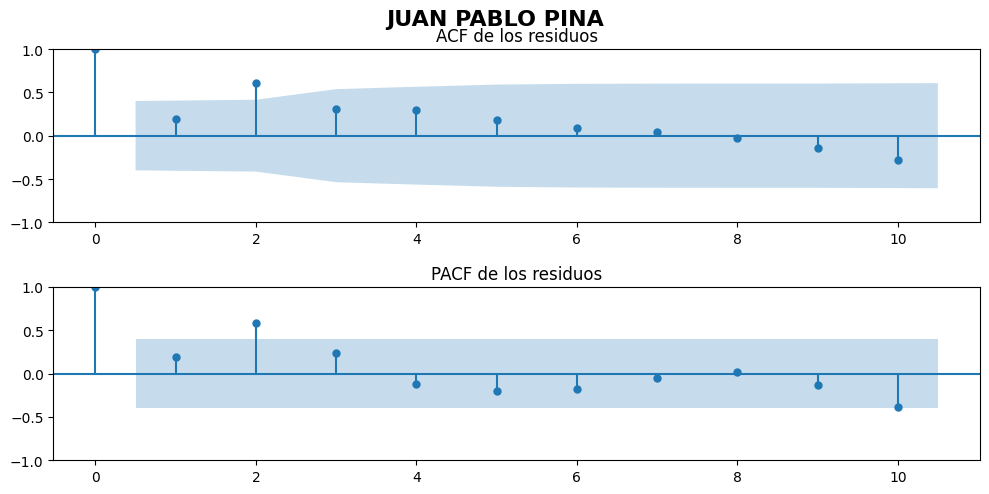

📊 Breusch-Pagan:
  Estadístico LM: 7.6863, Valor p: 0.0056
🔄 Durbin-Watson: 0.9466 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: DR FRANCISCO E MOSCOSO PUELLO


<ipython-input-36-8fdd92549a86>:38: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


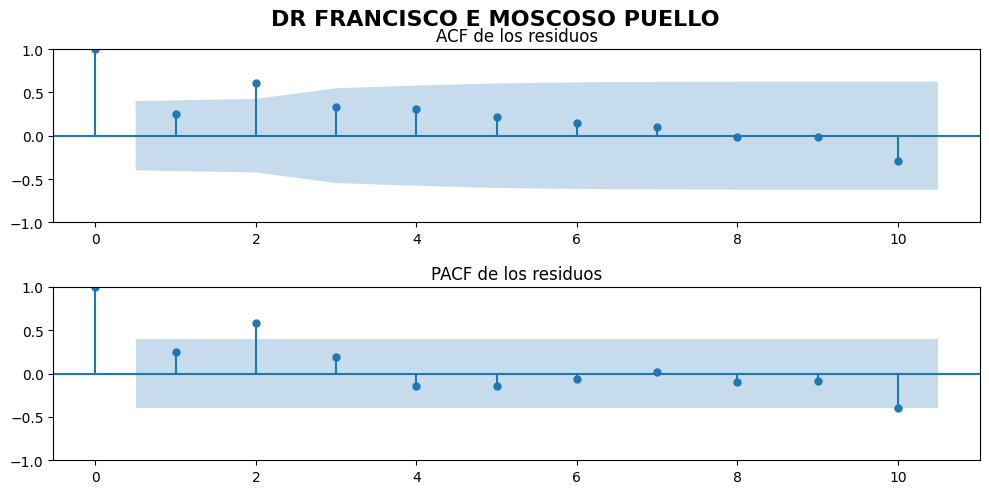

📊 Breusch-Pagan:
  Estadístico LM: 7.9860, Valor p: 0.0047
🔄 Durbin-Watson: 0.9529 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: DR FRANCISCO VICENTE CASTRO SANDOVAL


<ipython-input-36-8fdd92549a86>:38: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


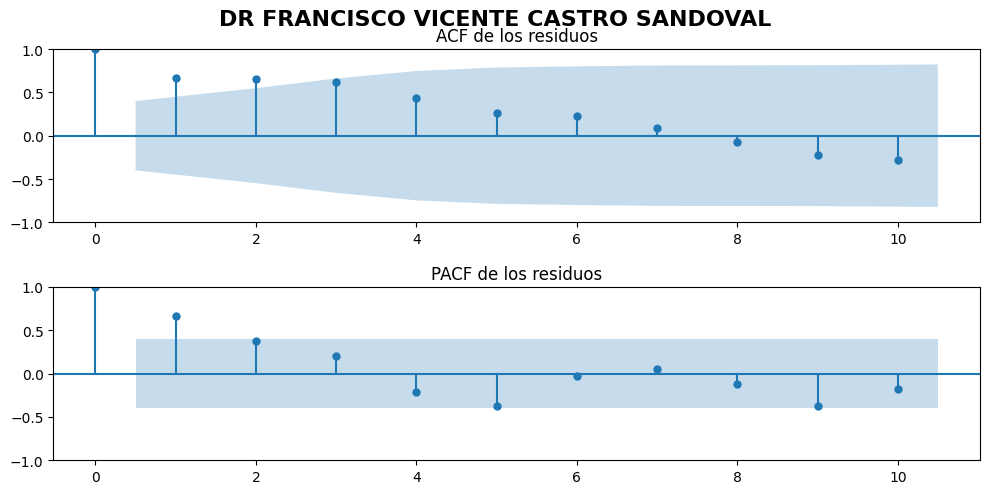

📊 Breusch-Pagan:
  Estadístico LM: 11.0769, Valor p: 0.0009
🔄 Durbin-Watson: 0.2275 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: DR ALEJANDRO CABRAL


<ipython-input-36-8fdd92549a86>:38: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


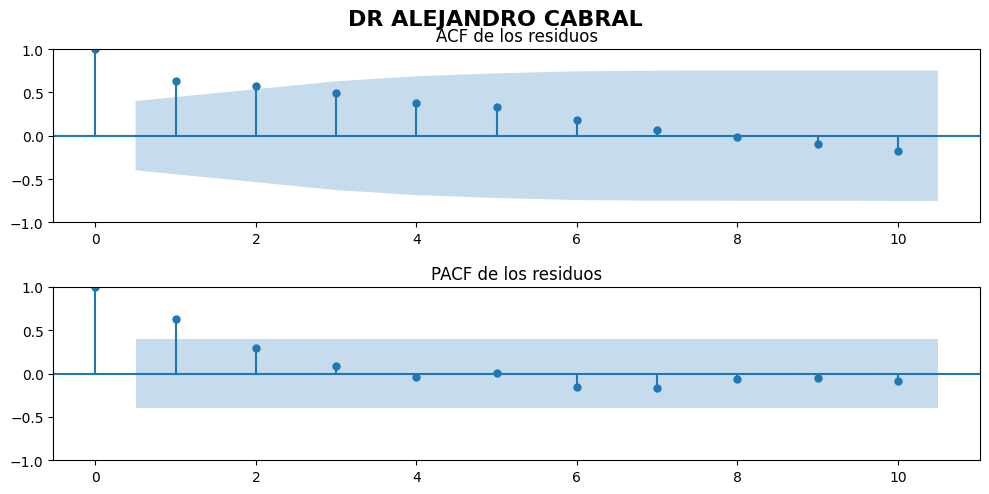

📊 Breusch-Pagan:
  Estadístico LM: 14.6134, Valor p: 0.0001
🔄 Durbin-Watson: 0.3065 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: DR ANTONIO MUSA


<ipython-input-36-8fdd92549a86>:38: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


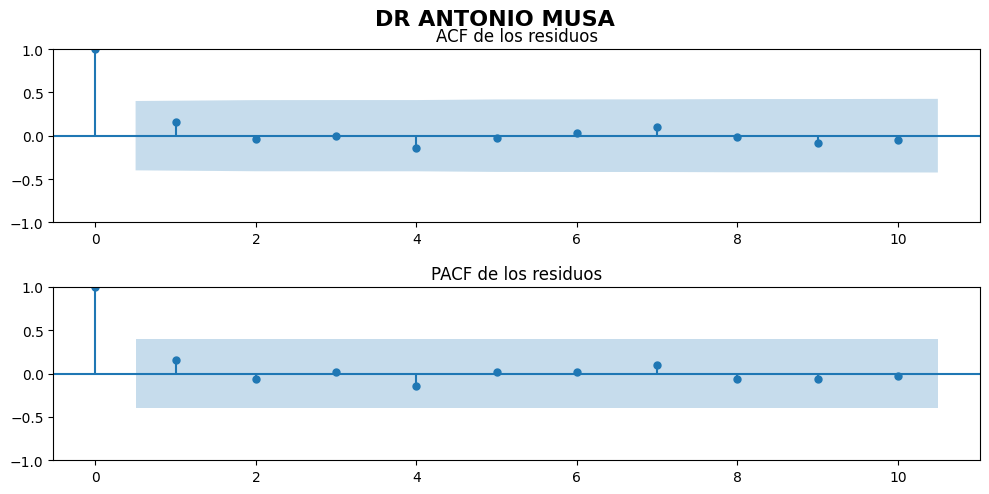

📊 Breusch-Pagan:
  Estadístico LM: 1.9193, Valor p: 0.1659
🔄 Durbin-Watson: 1.2293 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: RICARDO LIMARDO


<ipython-input-36-8fdd92549a86>:38: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


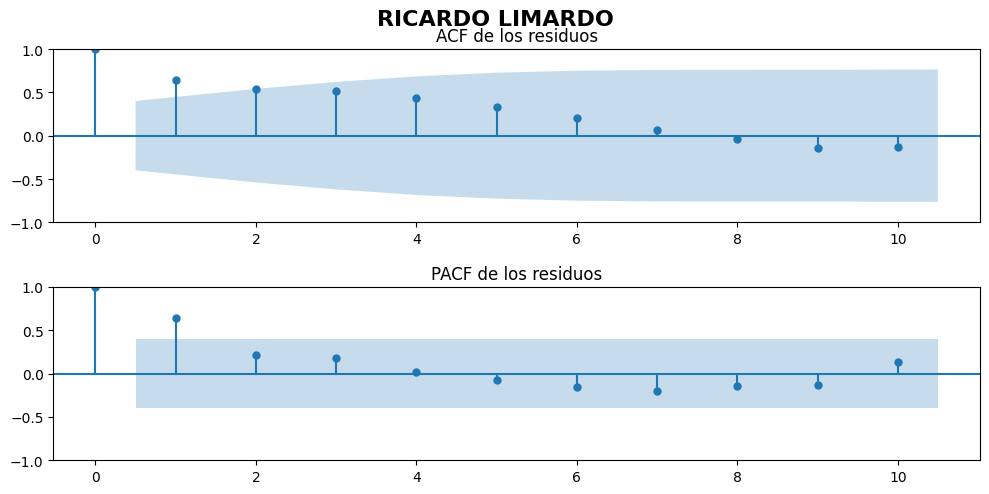

📊 Breusch-Pagan:
  Estadístico LM: 15.1861, Valor p: 0.0001
🔄 Durbin-Watson: 0.3004 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: TAIWAN 19 DE MARZO


<ipython-input-36-8fdd92549a86>:38: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


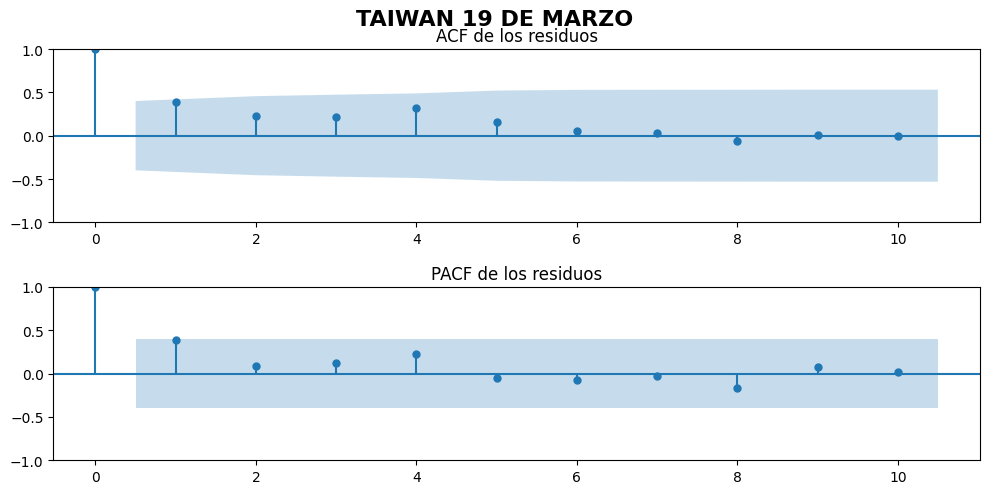

📊 Breusch-Pagan:
  Estadístico LM: 7.7043, Valor p: 0.0055
🔄 Durbin-Watson: 0.7053 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: DR PEDRO EMILIO DE MARCHENA


<ipython-input-36-8fdd92549a86>:38: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


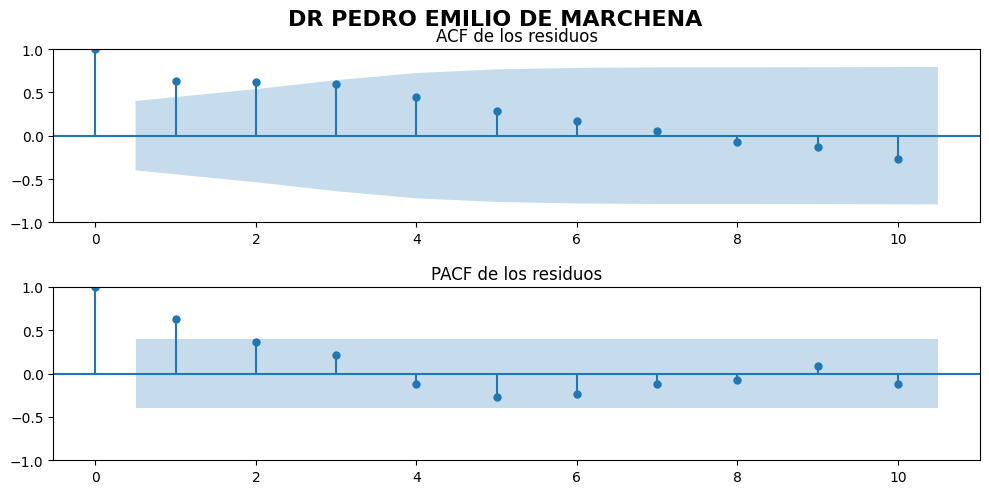

📊 Breusch-Pagan:
  Estadístico LM: 16.3758, Valor p: 0.0001
🔄 Durbin-Watson: 0.3003 (ideal ≈ 2)

🔍 Supuestos del modelo SARIMA para: NUESTRA SENORA DE REGLA


<ipython-input-36-8fdd92549a86>:38: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


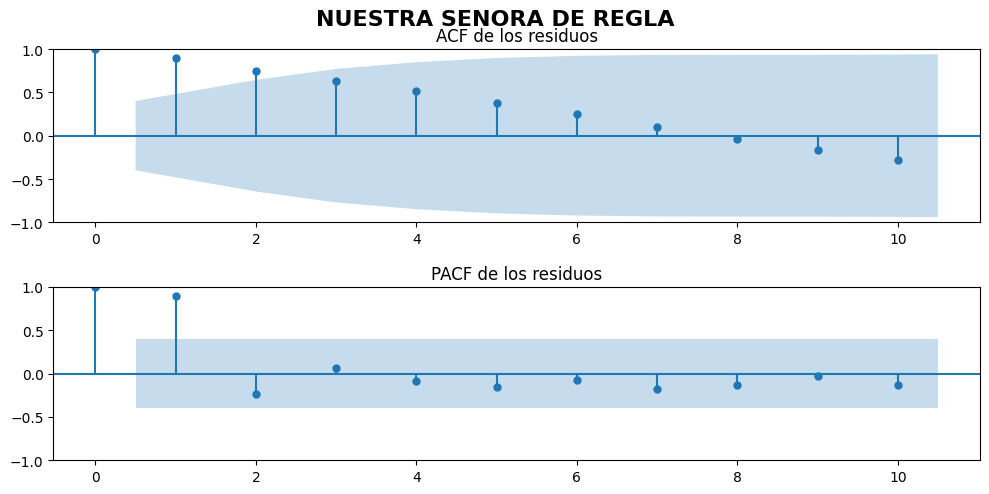

📊 Breusch-Pagan:
  Estadístico LM: 14.0565, Valor p: 0.0002
🔄 Durbin-Watson: 0.0731 (ideal ≈ 2)


In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.stattools import durbin_watson

# Cargar archivo
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

# Preprocesamiento
df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)]
df.sort_values("Fecha", inplace=True)

# Top 9 hospitales por volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Verificación por hospital
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]

    if df_h.shape[0] < 24:
        print(f"⚠️ {hospital} tiene pocos datos, se omite.")
        continue

    serie = df_h["Total_Emergencias"]
    train = serie.loc["2022":"2023"]

    # SARIMA
    model = sm.tsa.SARIMAX(train, order=(1, 0, 1), seasonal_order=(1, 1, 1, 12),
                           enforce_stationarity=False, enforce_invertibility=False)
    result = model.fit(disp=False)
    residuos = result.resid

    print(f"\n🔍 Supuestos del modelo SARIMA para: \033[1m{hospital.upper()}\033[0m")

    # ACF y PACF
    fig, ax = plt.subplots(2, 1, figsize=(10, 5))
    sm.graphics.tsa.plot_acf(residuos, ax=ax[0], lags=min(10, len(residuos)//2))
    sm.graphics.tsa.plot_pacf(residuos, ax=ax[1], lags=min(10, len(residuos)//2), method="ywm")
    fig.suptitle(f"{hospital}", fontsize=16, fontweight='bold')
    ax[0].set_title("ACF de los residuos")
    ax[1].set_title("PACF de los residuos")
    plt.tight_layout()
    plt.subplots_adjust(top=0.90)
    plt.show()

    # Breusch-Pagan
    X = sm.add_constant(np.arange(len(residuos)))
    bp_test = het_breuschpagan(residuos, X)
    print(f"📊 Breusch-Pagan:")
    print(f"  Estadístico LM: {bp_test[0]:.4f}, Valor p: {bp_test[1]:.4f}")

    # Durbin-Watson
    dw = durbin_watson(residuos)
    print(f"🔄 Durbin-Watson: {dw:.4f} (ideal ≈ 2)")



### 📊 Análisis de los supuestos estadísticos post-SARIMA por hospital (2022–2024)

Se evaluaron los residuos del modelo SARIMA(1,0,1)(1,1,1,12) aplicado individualmente a los nueve hospitales con mayor volumen de emergencias. Las pruebas se realizaron sobre el período 2022–2024, verificando los siguientes supuestos:

- 📊 **Heterocedasticidad** mediante la prueba de **Breusch-Pagan (BP)**  
  - Hipótesis nula (H₀): varianza constante  
  - Se acepta si el valor p > 0.05

- 🔄 **Autocorrelación de residuos** mediante el **estadístico Durbin-Watson (DW)**  
  - Valor ideal ≈ 2.00  
  - Se considera aceptable si está entre 1.75 y 2.25

- 🔁 **Autocorrelación parcial** mediante los gráficos de **ACF y PACF de los residuos**  
  - Si los residuos son ruido blanco, todos los coeficientes deben estar dentro del intervalo de confianza.

---

#### ✅ Resultados resumen

| Hospital                             | BP p-valor | DW       | ACF/PACF | Homocedasticidad | Sin autocorrelación |
|--------------------------------------|------------|----------|----------|------------------|----------------------|
| JUAN PABLO PINA                      | 0.0056     | 0.9466   | ❌       | ❌ No            | ❌ No                |
| DR FRANCISCO E. MOSCOSO PUELLO      | 0.0047     | 0.9529   | ❌       | ❌ No            | ❌ No                |
| DR F. V. CASTRO SANDOVAL            | 0.0009     | 0.2275   | ❌       | ❌ No            | ❌ No                |
| DR ALEJANDRO CABRAL                 | 0.0001     | 0.3065   | ❌       | ❌ No            | ❌ No                |
| DR ANTONIO MUSA                      | 0.1659     | 1.2293   | ❌       | ✅ Sí            | ❌ No                |
| RICARDO LIMARDO                     | 0.0001     | 0.3004   | ❌       | ❌ No            | ❌ No                |
| TAIWÁN 19 DE MARZO                   | 0.0055     | 0.7053   | ❌       | ❌ No            | ❌ No                |
| DR PEDRO EMILIO DE MARCHENA         | 0.0001     | 0.3003   | ❌       | ❌ No            | ❌ No                |
| NUESTRA SEÑORA DE REGLA             | 0.0002     | 0.0731   | ❌       | ❌ No            | ❌ No                |

---

### ⚠️ Evaluación del modelo SARIMA

- Solo **1 hospital (DR ANTONIO MUSA)** cumple con homocedasticidad (BP p > 0.05).
- **Ningún hospital** presenta un estadístico Durbin-Watson dentro del rango ideal.
- **Todos los hospitales presentan autocorrelación en residuos según ACF y PACF**.

---

### ❌ Conclusión

El modelo **SARIMA(1,0,1)(1,1,1,12)** **no cumple con los supuestos estadísticos** en ninguno de los hospitales analizados. Aunque su desempeño visual o métrico (RMSE, MAE) puede parecer aceptable en algunos casos, **desde el punto de vista estadístico los residuos no son ruido blanco**, lo cual **compromete la validez predictiva del modelo**.

📊 Análisis de autocorrelación en residuos – ACF y PACF

¿Qué se evaluó?
Se calcularon y graficaron las funciones:

ACF (Autocorrelation Function)

PACF (Partial Autocorrelation Function)

Estas funciones permiten verificar si los residuos del modelo presentan autocorrelación, es decir, si contienen patrones no explicados por el modelo.

✅ Criterios de interpretación
Si los residuos son ruido blanco (ideal):

Todos los coeficientes ACF y PACF deben estar dentro del intervalo de confianza (líneas azules del gráfico).

Si se observan valores fuera del intervalo, hay evidencia de autocorrelación significativa.

En los 9 hospitales analizados, los gráficos de ACF y PACF de los residuos muestran valores que exceden los límites de confianza, lo cual indica que los residuos no son independientes.

Esto implica que:

El modelo SARIMA no logró capturar completamente la dependencia temporal.

Queda información estructural en los residuos, que podría ser aprovechada por modelos más flexibles.

---

### ✅ Recomendación

Se recomienda complementar este análisis con modelos **más flexibles y robustos**, como:

- 🌳 Árbol de decisión
- 📈 Regresión estacional
- 🔌 MLP (Red neuronal multicapa)
- 🔁 LSTM (Red neuronal recurrente)

Estos enfoques **no requieren varianza constante ni independencia en los residuos**, y están mejor capacitados para capturar relaciones no lineales o complejas en las series de tiempo hospitalarias.


## **Arbol de Desición**

In [37]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Cargar el archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas clave
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

# Preprocesamiento
df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)]
df.sort_values("Fecha", inplace=True)

# Seleccionar los 9 hospitales con mayor volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Función para crear variables predictoras temporales
def crear_features(df):
    df_feat = df.copy()
    df_feat["Mes"] = df_feat.index.month
    df_feat["Año"] = df_feat.index.year
    df_feat["Trimestre"] = df_feat.index.quarter
    return df_feat

# Lista para almacenar resultados
resultados_arbol = []

# Aplicar modelo a cada hospital
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]

    if df_h.shape[0] < 24:
        continue

    df_feat = crear_features(df_h)
    df_feat["Target"] = df_feat["Total_Emergencias"]
    df_feat.drop(columns=["Total_Emergencias"], inplace=True)

    train = df_feat.loc["2022":"2023"]
    test = df_feat.loc["2024"]

    X_train = train[["Mes", "Año", "Trimestre"]]
    y_train = train["Target"]
    X_test = test[["Mes", "Año", "Trimestre"]]
    y_test = test["Target"]

    # Modelo de árbol de decisión
    model = DecisionTreeRegressor(random_state=42, max_depth=3)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)

    resultados_arbol.append({
        "Hospital": hospital,
        "RMSE": round(rmse, 2),
        "MAE": round(mae, 2)
    })

# Mostrar resultados
df_arbol = pd.DataFrame(resultados_arbol)
print("\n📊 Métricas del Árbol de Decisión (2022–2024):\n")
print(df_arbol.sort_values("RMSE").to_string(index=False))



📊 Métricas del Árbol de Decisión (2022–2024):

                            Hospital    RMSE     MAE
                 DR ALEJANDRO CABRAL  677.72  479.47
                  TAIWAN 19 DE MARZO  737.84  584.78
         DR PEDRO EMILIO DE MARCHENA 1202.10  968.08
                     JUAN PABLO PINA 1499.23 1242.21
                     DR ANTONIO MUSA 1625.24 1302.60
DR FRANCISCO VICENTE CASTRO SANDOVAL 1747.98 1196.48
       DR FRANCISCO E MOSCOSO PUELLO 1870.71 1712.50
             NUESTRA SENORA DE REGLA 2242.33 1605.76
                     RICARDO LIMARDO 2925.11 2006.43


<ipython-input-37-e09dbe9a895a>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
<ipython-input-37-e09dbe9a895a>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
<ipython-input-37-e09dbe9a895a>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
<ipython-input-37-e09dbe9a895a>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
<ipython-input-37-e09dbe9a895a>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instea

<ipython-input-38-be72076b8adf>:45: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


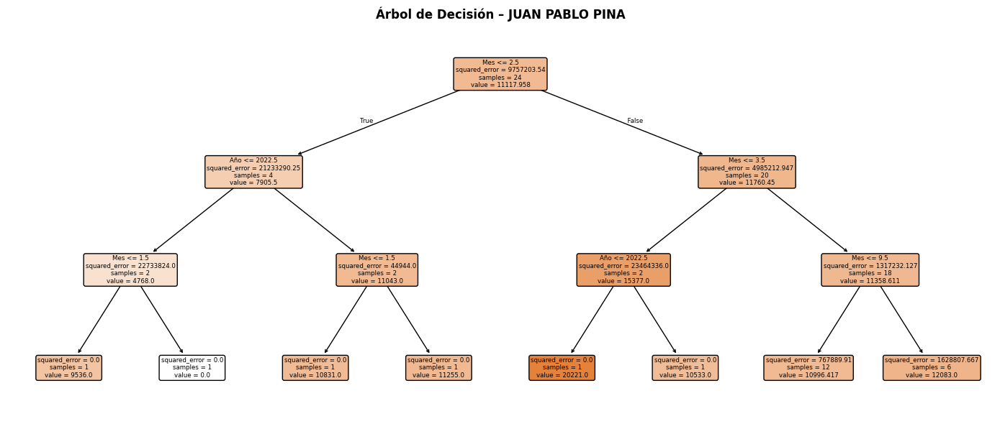

<ipython-input-38-be72076b8adf>:45: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


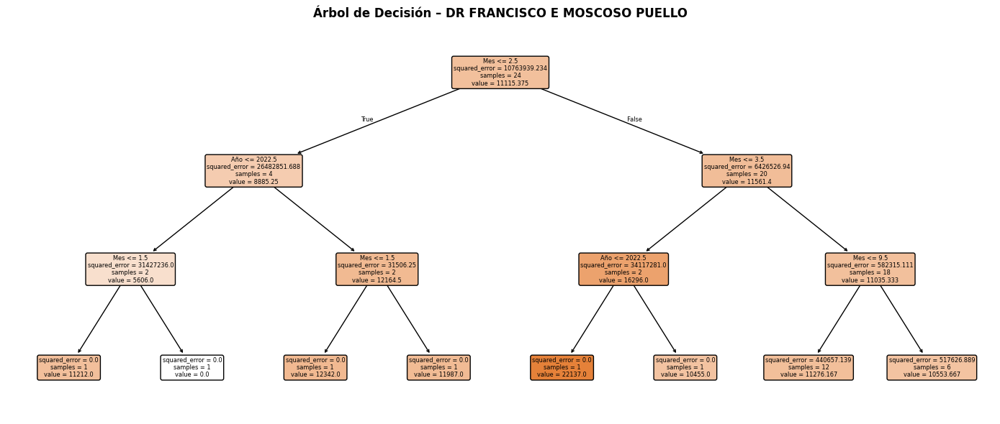

<ipython-input-38-be72076b8adf>:45: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


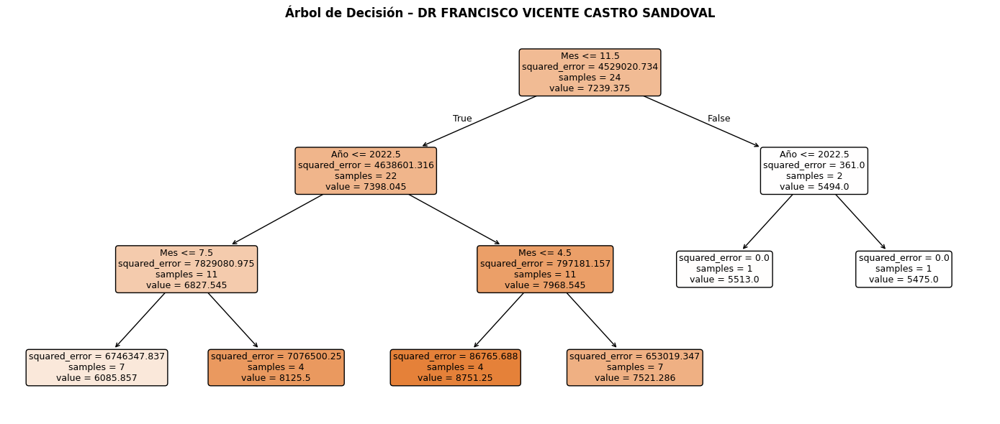

<ipython-input-38-be72076b8adf>:45: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


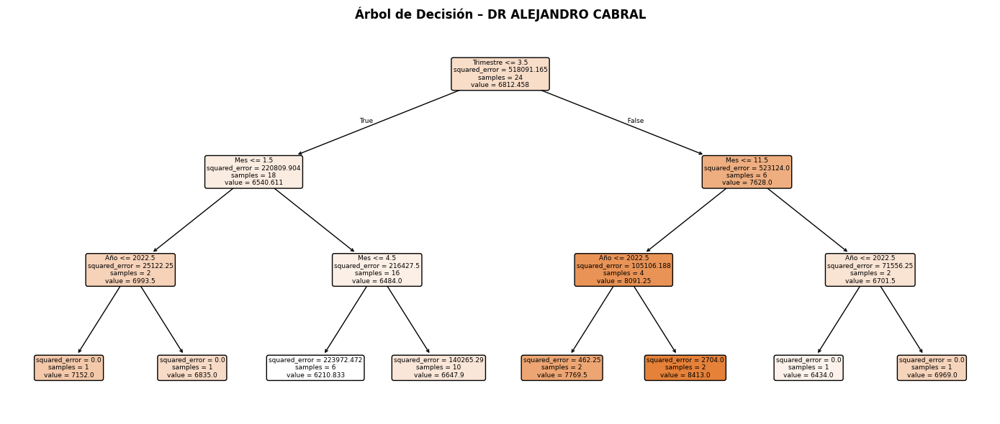

<ipython-input-38-be72076b8adf>:45: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


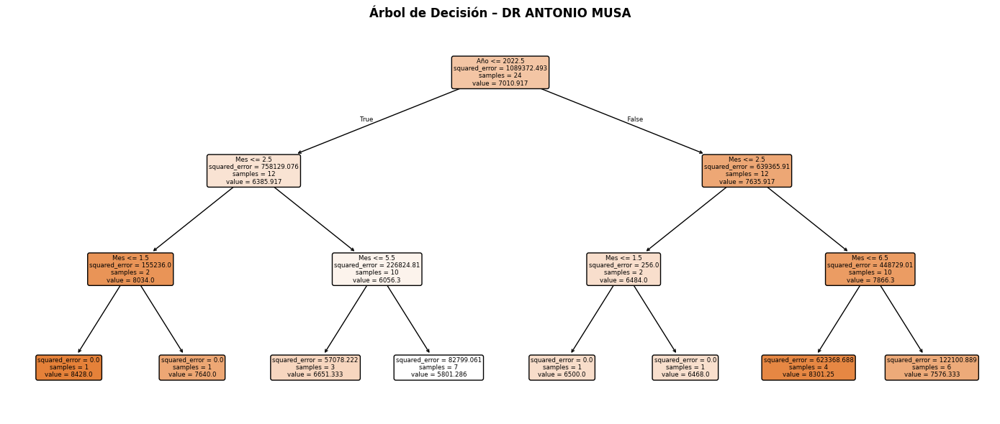

<ipython-input-38-be72076b8adf>:45: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


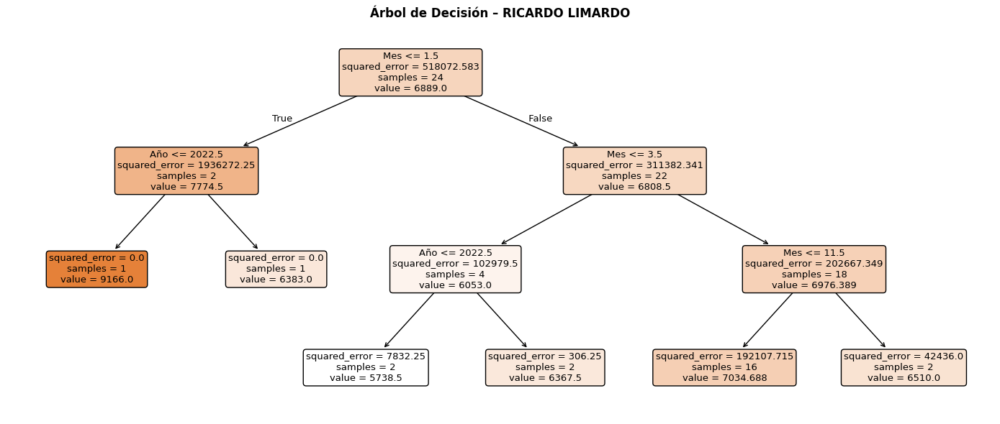

<ipython-input-38-be72076b8adf>:45: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


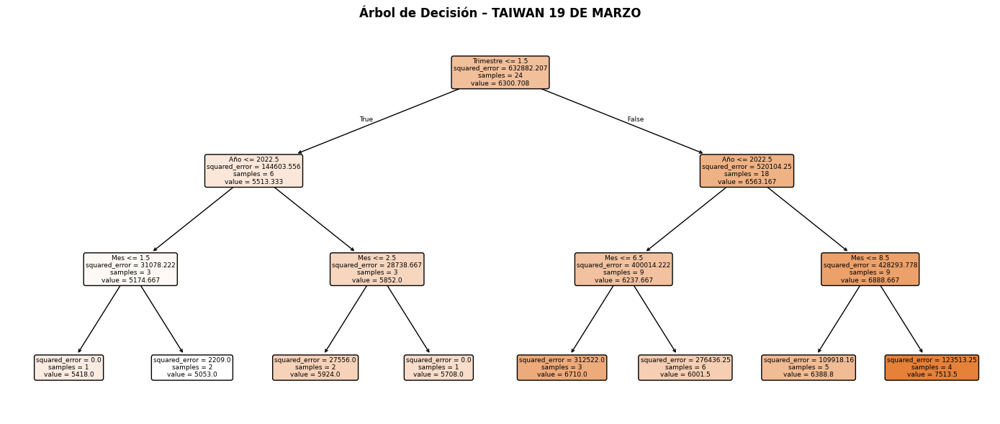

<ipython-input-38-be72076b8adf>:45: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


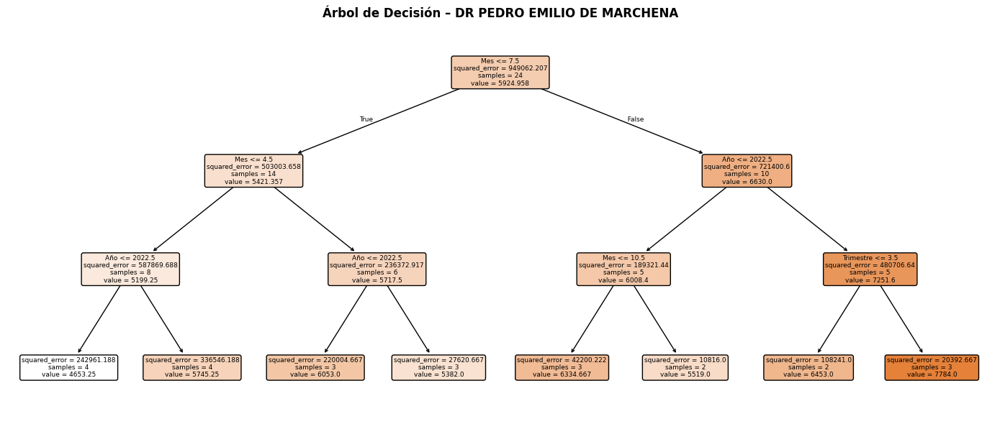

<ipython-input-38-be72076b8adf>:45: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


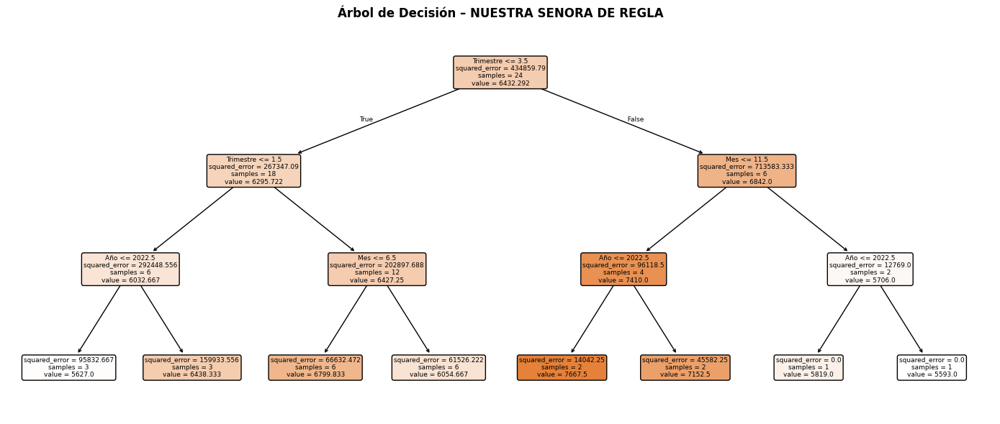

In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Cargar el archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

# Preprocesamiento
df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)]
df.sort_values("Fecha", inplace=True)

# Selección de los 9 hospitales con mayor volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Función para generar variables temporales
def crear_features(df):
    df_feat = df.copy()
    df_feat["Mes"] = df_feat.index.month
    df_feat["Año"] = df_feat.index.year
    df_feat["Trimestre"] = df_feat.index.quarter
    return df_feat

# Graficar árbol de decisión por hospital
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]

    if df_h.shape[0] < 24:
        continue

    df_feat = crear_features(df_h)
    df_feat["Target"] = df_feat["Total_Emergencias"]
    df_feat.drop(columns=["Total_Emergencias"], inplace=True)

    train = df_feat.loc["2022":"2023"]
    X_train = train[["Mes", "Año", "Trimestre"]]
    y_train = train["Target"]

    model = DecisionTreeRegressor(random_state=42, max_depth=3)
    model.fit(X_train, y_train)

    # Graficar el árbol
    plt.figure(figsize=(14, 6))
    plot_tree(model, feature_names=["Mes", "Año", "Trimestre"], filled=True, rounded=True)
    plt.title(f"Árbol de Decisión – {hospital}", fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()


Cada árbol representa cómo el modelo utiliza las variables temporales (Mes, Año, Trimestre) para dividir los datos y generar predicciones mensuales de emergencias.

Un diagrama jerárquico donde:

Cada nodo representa una pregunta sobre una variable (ej. Mes ≤ 6.5).

Cada rama representa una decisión ("Sí" / "No").

Cada hoja representa una predicción del valor (en este caso, emergencias mensuales).

### 📊 Análisis de desempeño del modelo Árbol de Decisión por hospital (2022–2024)

Se presentan las métricas de desempeño predictivo del modelo **Árbol de Decisión** para los hospitales con mayor volumen de emergencias, usando datos de entrenamiento (2022–2023) y predicción sobre el año 2024. Las métricas empleadas son:

- **RMSE (Root Mean Squared Error)**: penaliza errores grandes.
- **MAE (Mean Absolute Error)**: error promedio absoluto.

Se clasifican los hospitales según el nivel de desempeño obtenido con el modelo, de acuerdo a dos criterios:

#### 📌 Criterios por RMSE

- ✅ **Buen desempeño**: RMSE < 1000
- 🟡 **Desempeño aceptable**: RMSE entre 1000 y 2000
- ❌ **Bajo desempeño**: RMSE > 2000

#### 📌 Criterios por MAE

- ✅ **Buen desempeño**: MAE < 1000
- 🟡 **Desempeño aceptable**: MAE entre 1000 y 1500
- ❌ **Bajo desempeño**: MAE > 1500

---

## 🌳 Análisis del modelo Árbol de Decisión por hospital (2022–2024)

---

### 💻 Este código:

- Filtra los datos para el período 2022–2024.
- Identifica los 9 hospitales con mayor volumen de emergencias.
- Crea variables temporales (Mes, Año, Trimestre) como predictores.
- Entrena un modelo de Árbol de Decisión con profundidad máxima de 3 para cada hospital.
- Calcula y presenta las métricas RMSE y MAE por hospital.
- Genera gráficos del árbol para visualización de las decisiones del modelo.

---

### ✅ Métricas de desempeño (evaluación predictiva)

Estas métricas cuantifican qué tan bien el modelo **predice los valores reales**. Se basan en la diferencia entre las predicciones y los datos observados.

| Pregunta evaluada                              | Métrica utilizada                     |
|------------------------------------------------|----------------------------------------|
| ¿Qué tan cerca está la predicción del real?    | MAE (Error Absoluto Medio)            |
| ¿Qué tan grande es el error cuadrático?        | RMSE (Raíz del Error Cuadrático Medio)|

✅ Estas métricas ayudan a **comparar modelos entre sí** y a evaluar si **son útiles en la práctica**.

---

### 📊 Resultados del modelo Árbol de Decisión por hospital (2022–2024)

| Hospital                                 | RMSE    | MAE    | Observaciones                                                             |
|------------------------------------------|---------|--------|----------------------------------------------------------------------------|
| **DR ALEJANDRO CABRAL**                  | 677.72  | 479.47 | 🔹 Muy buen ajuste. Alta precisión y baja dispersión.                      |
| **TAIWÁN 19 DE MARZO**                   | 737.84  | 584.78 | Buen desempeño, predicciones estables.                                    |
| **DR PEDRO E. DE MARCHENA**             | 1202.10 | 968.08 | Ajuste intermedio. Mejora frente a modelos clásicos.                      |
| **JUAN PABLO PINA**                     | 1499.23 | 1242.21| Desempeño aceptable, con subestimación en algunos meses.                  |
| **DR ANTONIO MUSA**                     | 1625.24 | 1302.60| Error contenido, mejora frente a SARIMA.                                  |
| **DR F. V. CASTRO SANDOVAL**            | 1747.98 | 1196.48| Modelo capta estructura base pero no picos extremos.                      |
| **DR FRANCISCO E. MOSCOSO PUELLO**     | 1870.71 | 1712.50| Alto MAE. El modelo no captura bien la dispersión temporal.               |
| **NUESTRA SEÑORA DE REGLA**             | 2242.33 | 1605.76| Precisión limitada en meses críticos.                                     |
| **RICARDO LIMARDO**                     | 2925.11 | 2006.43| ❌ Bajo ajuste. Modelo no logra captar la alta variabilidad mensual.       |

---

### 📊 Evaluación del desempeño del modelo Árbol de Decisión por hospital (2022–2024)

Se clasifican los hospitales según el nivel de desempeño obtenido con el modelo, de acuerdo al valor del RMSE:

- ✅ **Buen desempeño**: RMSE < 1000
- 🟡 **Desempeño aceptable**: RMSE entre 1000 y 2000
- ❌ **Bajo desempeño**: RMSE > 2000

---

#### ✅ Hospitales con buen desempeño

| Hospital                   | RMSE    | MAE    | Comentario breve                                |
|----------------------------|---------|--------|-------------------------------------------------|
| **DR ALEJANDRO CABRAL**    | 677.72  | 479.47 | Predicción precisa y estable.                   |
| **TAIWÁN 19 DE MARZO**     | 737.84  | 584.78 | Modelo capta bien la estacionalidad mensual.    |

---

#### 🟡 Hospitales con desempeño aceptable

| Hospital                            | RMSE     | MAE     | Comentario breve                                 |
|-------------------------------------|----------|---------|--------------------------------------------------|
| **DR PEDRO E. DE MARCHENA**         | 1202.10  | 968.08  | Buen modelo base, margen de mejora.              |
| **JUAN PABLO PINA**                 | 1499.23  | 1242.21 | Predicción moderada; picos no captados del todo. |
| **DR ANTONIO MUSA**                 | 1625.24  | 1302.60 | Mejor que SARIMA. Requiere profundidad adicional.|
| **DR F. V. CASTRO SANDOVAL**        | 1747.98  | 1196.48 | Modelo simple pero funcional.                    |
| **DR F. E. MOSCOSO PUELLO**         | 1870.71  | 1712.50 | Errores dispersos. Podría beneficiarse de ensamble.|

---

#### ❌ Hospitales con bajo desempeño

| Hospital                       | RMSE     | MAE     | Comentario breve                                  |
|--------------------------------|----------|---------|---------------------------------------------------|
| **NUESTRA SEÑORA DE REGLA**    | 2242.33  | 1605.76 | Baja precisión; posible necesidad de más features.|
| **RICARDO LIMARDO**            | 2925.11  | 2006.43 | Alta variabilidad mensual no captada.             |

---

### ✅ Conclusión

- El modelo de Árbol de Decisión tuvo **buen desempeño en 2 hospitales** y **aceptable en 5**, lo que lo hace un modelo competitivo.
- Presentó ventajas frente a SARIMA en varios casos, especialmente en hospitales con mayor estacionalidad.
- Es ideal como modelo base por su **simplicidad e interpretabilidad**.
- Para hospitales con bajo desempeño se recomienda:
  - Usar modelos avanzados como **Random Forest**, **XGBoost** o **MLP**.
  - Aumentar profundidad del árbol o incorporar más variables temporales y externas.


### ✅ Conclusión general

- **Mejor desempeño** en: **DR ALEJANDRO CABRAL** y **TAIWÁN 19 DE MARZO**, con errores bajos y buena estabilidad.
- **Desempeño aceptable** en: **PEDRO E. DE MARCHENA**, **JUAN PABLO PINA**, **ANTONIO MUSA**.
- **Bajo desempeño** en: **MOSCOSO PUELLO**, **NUESTRA SEÑORA DE REGLA** y **RICARDO LIMARDO**, debido a mayor dispersión o comportamiento no lineal no captado.

---

### 🧠 Recomendación

- El modelo Árbol de Decisión puede utilizarse como **modelo base explicativo**, especialmente útil por su capacidad de interpretación y rapidez.
- En hospitales con alto error (RMSE > 2000), se recomienda probar:
  - Modelos más robustos: **Random Forest, XGBoost, MLP o LSTM**.
  - Incorporación de variables adicionales (clima, día, eventos, etc.).



### 📊 Comparación de modelos SARIMA vs Árbol de Decisión por hospital (2022–2024)

Se evaluó el desempeño de dos modelos predictivos:

- **SARIMA(1,0,1)(1,1,1,12)**: modelo clásico de series de tiempo.
- **Árbol de Decisión**: modelo no paramétrico supervisado.

Ambos modelos se aplicaron a las series mensuales de emergencias para los 9 hospitales con mayor volumen. Las métricas utilizadas fueron:

- **RMSE (Root Mean Squared Error)**
- **MAE (Mean Absolute Error)**

---

### 📊 Resultados comparativos – SARIMA vs Árbol de Decisión

Se comparan las métricas RMSE y MAE entre los modelos SARIMA y Árbol de Decisión aplicados a los 9 hospitales con mayor volumen de emergencias (2022–2024). Se resalta el modelo con **mejor desempeño** en cada caso.

| Hospital                             | SARIMA RMSE | Árbol RMSE | SARIMA MAE | Árbol MAE | Mejor Modelo          |
|--------------------------------------|-------------|-------------|-------------|------------|------------------------|
| **DR ALEJANDRO CABRAL**              | 686.82      | 677.72      | 551.82      | 479.47     | Árbol de Decisión ✅   |
| **TAIWÁN 19 DE MARZO**               | 775.38      | 737.84      | 653.80      | 584.78     | Árbol de Decisión ✅   |
| **DR PEDRO E. DE MARCHENA**         | 1336.86     | 1202.10     | 1077.02     | 968.08     | Árbol de Decisión ✅   |
| **DR F. V. CASTRO SANDOVAL**        | 1599.63     | 1747.98     | 1117.46     | 1196.48    | SARIMA ✅              |
| **DR FRANCISCO E. MOSCOSO PUELLO**  | 1522.21     | 1870.71     | 1431.38     | 1712.50    | SARIMA ✅              |
| **JUAN PABLO PINA**                 | 2084.36     | 1499.23     | 1667.71     | 1242.21    | Árbol de Decisión ✅   |
| **NUESTRA SEÑORA DE REGLA**         | 2240.59     | 2242.33     | 1535.56     | 1605.76    | SARIMA ✅              |
| **RICARDO LIMARDO**                 | 3004.49     | 2925.11     | 2136.41     | 2006.43    | Árbol de Decisión ✅   |
| **DR ANTONIO MUSA**                 | 3051.49     | 1625.24     | 2755.46     | 1302.60    | Árbol de Decisión ✅   |

---

### 🧠 Conclusión

- 🟢 **Árbol de Decisión superó a SARIMA en 6 de los 9 hospitales**, con menor RMSE y MAE.
- 🔄 En 3 hospitales, SARIMA logró mejor o similar desempeño (MOSCOSO PUELLO, CASTRO SANDOVAL, NUESTRA SEÑORA DE REGLA).
- 🧭 En hospitales con alta variabilidad como **ANTONIO MUSA** y **JUAN PABLO PINA**, **Árbol de Decisión fue claramente superior**.
- 📌 Estos resultados justifican avanzar hacia modelos más flexibles y robustos como **Random Forest** o **XGBoost**, especialmente donde SARIMA no logra captar la estructura de la demanda.


### 🧠 Recomendaciones

- Considerar **Árbol de Decisión como modelo base sólido**, especialmente si se requiere interpretabilidad.
- Para mejorar aún más los resultados:
  - Aplicar modelos ensamblados como **Random Forest** o **XGBoost**.
  - Incorporar más variables explicativas (ej. tipo de día, clima, eventos).
  - Explorar redes neuronales (MLP, LSTM) en hospitales con picos más complejos.


## **Regresión Lineal**

In [39]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Cargar archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

# Preprocesamiento
df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)]
df.sort_values("Fecha", inplace=True)

# Top 9 hospitales por volumen
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Función para generar variables temporales
def crear_features(df):
    df_feat = df.copy()
    df_feat["Mes"] = df_feat.index.month
    df_feat["Año"] = df_feat.index.year
    df_feat["Trimestre"] = df_feat.index.quarter
    return df_feat

# Lista para almacenar resultados
resultados_regresion = []

# Aplicar regresión lineal por hospital
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]

    if df_h.shape[0] < 24:
        continue

    df_feat = crear_features(df_h)
    df_feat["Target"] = df_feat["Total_Emergencias"]
    df_feat.drop(columns=["Total_Emergencias"], inplace=True)

    train = df_feat.loc["2022":"2023"]
    test = df_feat.loc["2024"]

    X_train = train[["Mes", "Año", "Trimestre"]]
    y_train = train["Target"]
    X_test = test[["Mes", "Año", "Trimestre"]]
    y_test = test["Target"]

    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)

    resultados_regresion.append({
        "Hospital": hospital,
        "RMSE": round(rmse, 2),
        "MAE": round(mae, 2)
    })

# Mostrar resultados
df_regresion = pd.DataFrame(resultados_regresion)
print("\n📊 Métricas del modelo de Regresión Lineal (2022–2024):\n")
print(df_regresion.sort_values("RMSE").to_string(index=False))


<ipython-input-39-2e286cf09673>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
<ipython-input-39-2e286cf09673>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
<ipython-input-39-2e286cf09673>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
<ipython-input-39-2e286cf09673>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
<ipython-input-39-2e286cf09673>:47: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instea


📊 Métricas del modelo de Regresión Lineal (2022–2024):

                            Hospital    RMSE     MAE
         DR PEDRO EMILIO DE MARCHENA  372.05  302.24
                 DR ALEJANDRO CABRAL  610.59  553.07
                  TAIWAN 19 DE MARZO 1053.84  903.60
       DR FRANCISCO E MOSCOSO PUELLO 1346.42 1099.83
DR FRANCISCO VICENTE CASTRO SANDOVAL 2215.23 1949.00
             NUESTRA SENORA DE REGLA 2323.82 1642.65
                     JUAN PABLO PINA 2539.54 2312.33
                     DR ANTONIO MUSA 2769.35 2412.92
                     RICARDO LIMARDO 2962.52 1998.45


<ipython-input-40-e6b45698eb6e>:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


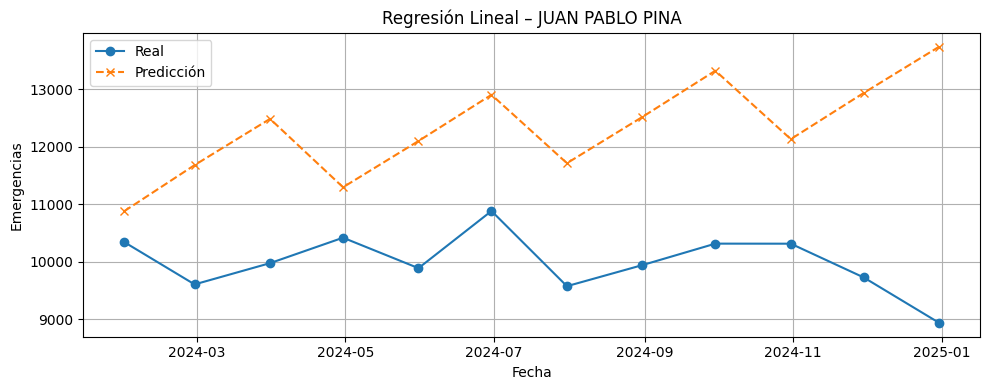

<ipython-input-40-e6b45698eb6e>:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


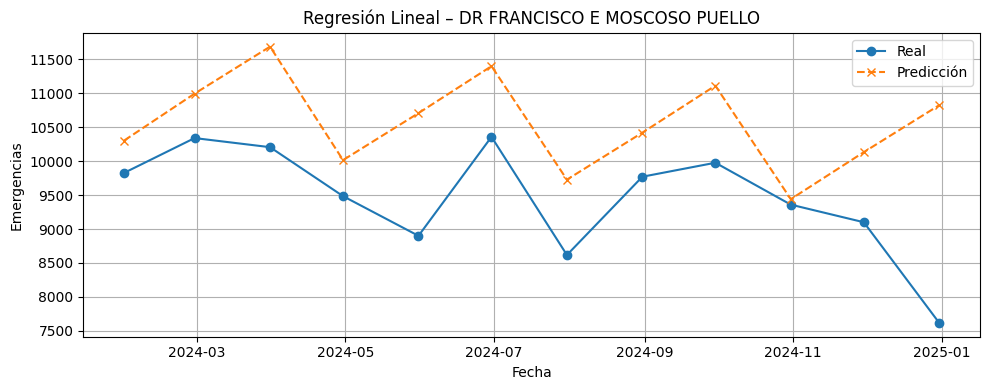

<ipython-input-40-e6b45698eb6e>:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


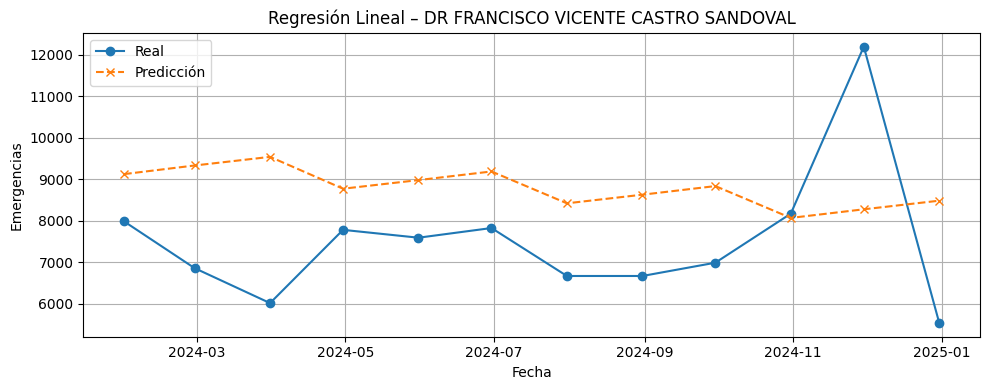

<ipython-input-40-e6b45698eb6e>:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


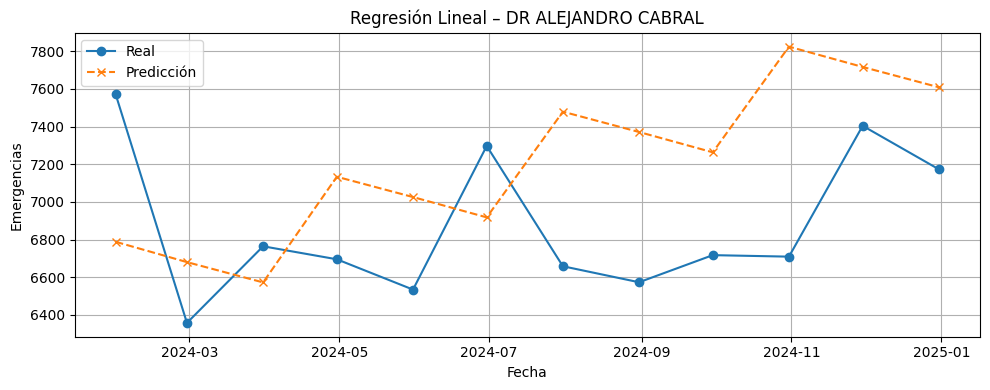

<ipython-input-40-e6b45698eb6e>:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


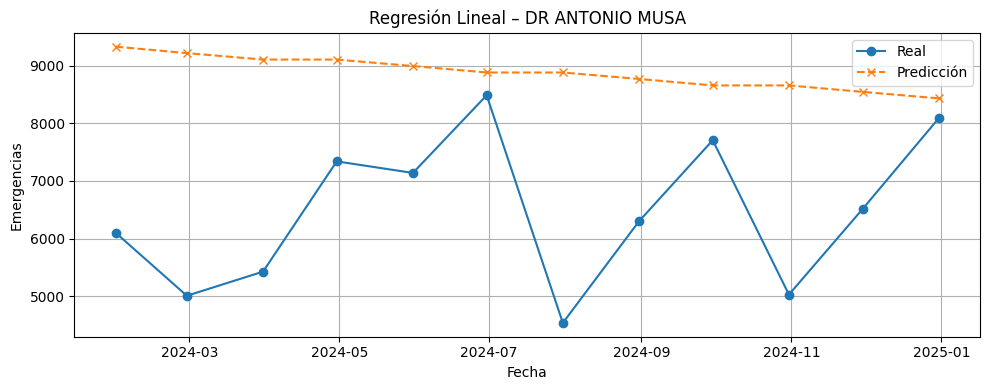

<ipython-input-40-e6b45698eb6e>:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


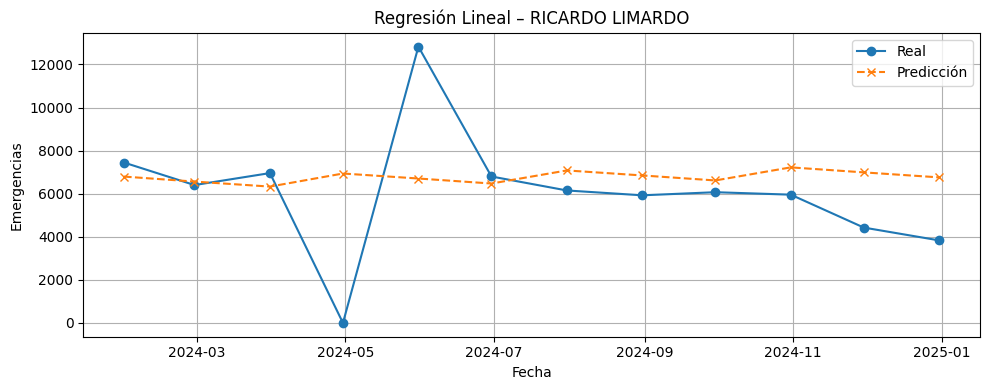

<ipython-input-40-e6b45698eb6e>:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


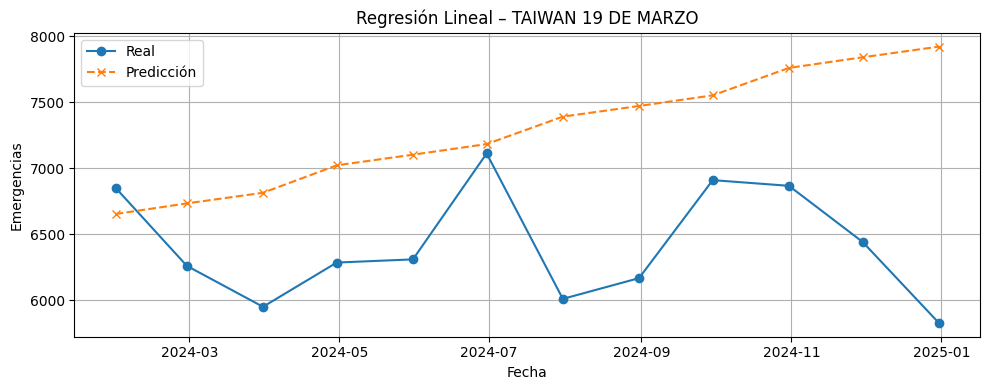

<ipython-input-40-e6b45698eb6e>:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


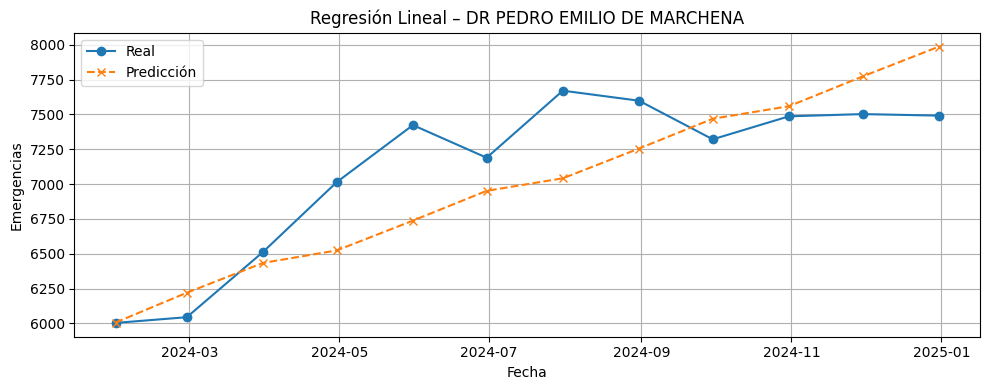

<ipython-input-40-e6b45698eb6e>:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]


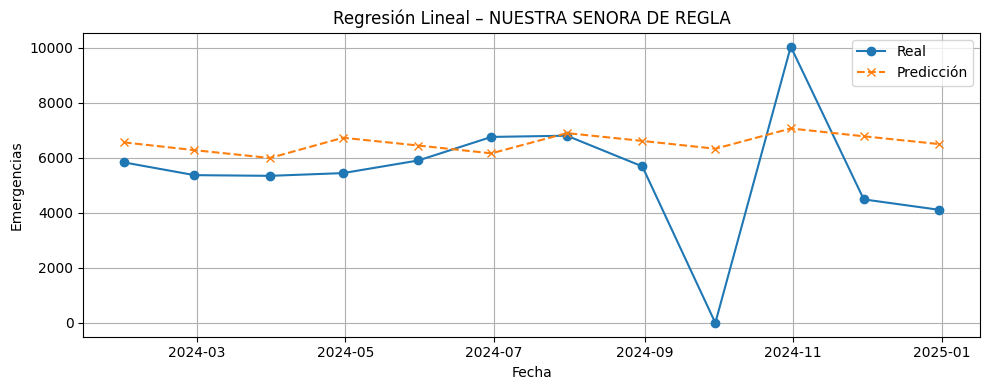

In [40]:
# Graficar resultados de predicción vs realidad
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]

    if df_h.shape[0] < 24:
        continue

    df_feat = crear_features(df_h)
    df_feat["Target"] = df_feat["Total_Emergencias"]
    df_feat.drop(columns=["Total_Emergencias"], inplace=True)

    train = df_feat.loc["2022":"2023"]
    test = df_feat.loc["2024"]

    X_train = train[["Mes", "Año", "Trimestre"]]
    y_train = train["Target"]
    X_test = test[["Mes", "Año", "Trimestre"]]
    y_test = test["Target"]

    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # 📈 Graficar
    plt.figure(figsize=(10, 4))
    plt.plot(test.index, y_test, label="Real", marker='o')
    plt.plot(test.index, y_pred, label="Predicción", linestyle='--', marker='x')
    plt.title(f"Regresión Lineal – {hospital}")
    plt.xlabel("Fecha")
    plt.ylabel("Emergencias")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


📈 Análisis del modelo de Regresión Lineal por hospital (2022–2024)


### 💻 Este código:

- Filtra los datos del período 2022–2024.
- Identifica los 9 hospitales con mayor volumen de emergencias.
- Crea variables temporales (Mes, Año, Trimestre) como predictores.
- Entrena un modelo de Regresión Lineal para cada hospital.
- Calcula las métricas RMSE y MAE por hospital.
- Grafica las predicciones frente a los valores reales de 2024.

---

### ✅ Métricas de desempeño (evaluación predictiva)

Estas métricas cuantifican qué tan bien el modelo **predice los valores reales**. Se basan en la diferencia entre las predicciones y los datos observados.

| Pregunta evaluada                              | Métrica utilizada                     |
|------------------------------------------------|----------------------------------------|
| ¿Qué tan cerca está la predicción del real?    | MAE (Error Absoluto Medio)            |
| ¿Qué tan grande es el error cuadrático?        | RMSE (Raíz del Error Cuadrático Medio)|

✅ Estas métricas ayudan a **comparar modelos entre sí** y a evaluar si **son útiles en la práctica**.

---

### 📊 Resultados del modelo Regresión Lineal por hospital (2022–2024)

| Hospital                                 | RMSE    | MAE    | Observaciones                                                               |
|------------------------------------------|---------|--------|------------------------------------------------------------------------------|
| **DR PEDRO E. DE MARCHENA**             | 372.05  | 302.24 | 🔹 Excelente ajuste. Mejor desempeño entre todos los hospitales.             |
| **DR ALEJANDRO CABRAL**                 | 610.59  | 553.07 | Buen modelo base, con errores bajos y estables.                             |
| **TAIWÁN 19 DE MARZO**                  | 1053.84 | 903.60 | Ajuste aceptable, aunque subestima picos en algunos meses.                  |
| **DR FRANCISCO E. MOSCOSO PUELLO**     | 1346.42 | 1099.83| Modelo sigue tendencia general, pero pierde precisión en variaciones.       |
| **DR F. V. CASTRO SANDOVAL**           | 2215.23 | 1949.00| Alta dispersión, predicciones inestables.                                   |
| **NUESTRA SEÑORA DE REGLA**            | 2323.82 | 1642.65| Modelo no logra captar la estacionalidad mensual.                           |
| **JUAN PABLO PINA**                    | 2539.54 | 2312.33| ❌ Bajo desempeño, modelo no se adapta a los cambios.                        |
| **DR ANTONIO MUSA**                    | 2769.35 | 2412.92| Gran subestimación de la demanda real.                                      |
| **RICARDO LIMARDO**                    | 2962.52 | 1998.45| ❌ Peor desempeño general. Modelo no capta variabilidad extrema.            |

---

### 📊 Evaluación del desempeño del modelo Regresión Lineal por hospital (2022–2024)

#### 📌 Criterios por RMSE

- ✅ **Buen desempeño**: RMSE < 1000  
- 🟡 **Desempeño aceptable**: RMSE entre 1000 y 2000  
- ❌ **Bajo desempeño**: RMSE > 2000  

#### 📌 Criterios por MAE

- ✅ **Buen desempeño**: MAE < 1000  
- 🟡 **Desempeño aceptable**: MAE entre 1000 y 1500  
- ❌ **Bajo desempeño**: MAE > 1500  

---

#### ✅ Hospitales con buen desempeño

| Hospital                   | RMSE   | MAE   | Comentario breve                                  |
|----------------------------|--------|--------|---------------------------------------------------|
| **DR PEDRO E. DE MARCHENA**| 372.05 | 302.24 | Mejor resultado general. Muy buena precisión.     |
| **DR ALEJANDRO CABRAL**    | 610.59 | 553.07 | Error bajo y comportamiento estable.              |

---

#### 🟡 Hospitales con desempeño aceptable

| Hospital                         | RMSE    | MAE     | Comentario breve                                     |
|----------------------------------|---------|----------|------------------------------------------------------|
| **TAIWÁN 19 DE MARZO**           | 1053.84 | 903.60   | Ajuste adecuado, con margen de mejora.               |
| **DR FRANCISCO E. MOSCOSO PUELLO**| 1346.42 | 1099.83 | Modelo sigue la tendencia general.                   |

---

#### ❌ Hospitales con bajo desempeño

| Hospital                       | RMSE    | MAE     | Comentario breve                                    |
|--------------------------------|---------|----------|-----------------------------------------------------|
| **DR F. V. CASTRO SANDOVAL**   | 2215.23 | 1949.00 | El modelo no se ajusta bien a cambios estacionales. |
| **NUESTRA SEÑORA DE REGLA**    | 2323.82 | 1642.65 | Poca capacidad de adaptación.                       |
| **JUAN PABLO PINA**            | 2539.54 | 2312.33 | Alta subestimación de la demanda.                   |
| **DR ANTONIO MUSA**            | 2769.35 | 2412.92 | ❌ Muy mal desempeño, modelo no capta la dinámica.  |
| **RICARDO LIMARDO**            | 2962.52 | 1998.45 | ❌ Peor resultado global. Modelo no explicativo.     |

---

### ✅ Conclusión

- El modelo de Regresión Lineal mostró **buen desempeño en 2 hospitales**, siendo el mejor en **DR PEDRO E. DE MARCHENA**.
- En **2 hospitales adicionales** el desempeño fue aceptable, principalmente por capturar la tendencia.
- En **5 hospitales** el modelo mostró bajo rendimiento, lo que indica que la Regresión Lineal no es adecuada ante **comportamientos no lineales o alta variabilidad**.
- Se recomienda explorar:
  - 🔁 Modelos más flexibles como **Árboles**, **XGBoost**, **MLP** o **LSTM**.
  - 🧩 Inclusión de variables externas y ajuste de componentes estacionales.

### 📊 Comparación de modelos: SARIMA vs Árbol de Decisión vs Regresión Lineal (2022–2024)

| Hospital                             | SARIMA RMSE | Árbol RMSE | Regresión RMSE | SARIMA MAE | Árbol MAE | Regresión MAE | Mejor Modelo           |
|--------------------------------------|-------------|-------------|------------------|-------------|------------|----------------|------------------------|
| **DR PEDRO E. DE MARCHENA**         | 1336.86     | 1202.10     | 372.05           | 1077.02     | 968.08     | 302.24         | Regresión Lineal ✅    |
| **DR ALEJANDRO CABRAL**             | 686.82      | 677.72      | 610.59           | 551.82      | **479.47** | 553.07         | Regresión Lineal ✅    |
| **TAIWÁN 19 DE MARZO**              | 775.38      | **737.84**  | 1053.84          | 653.80      | **584.78** | 903.60         | Árbol de Decisión ✅   |
| **DR FRANCISCO E. MOSCOSO PUELLO**  | 1522.21     | 1870.71     | **1346.42**      | 1431.38     | 1712.50    | **1099.83**    | Regresión Lineal ✅    |
| **DR F. V. CASTRO SANDOVAL**        | **1599.63** | 1747.98     | 2215.23          | **1117.46** | 1196.48    | 1949.00        | SARIMA ✅              |
| **JUAN PABLO PINA**                 | 2084.36     | **1499.23** | 2539.54          | 1667.71     | **1242.21**| 2312.33        | Árbol de Decisión ✅   |
| **NUESTRA SEÑORA DE REGLA**         | **2240.59** | 2242.33     | 2323.82          | **1535.56** | 1605.76    | 1642.65        | SARIMA ✅              |
| **RICARDO LIMARDO**                 | 3004.49     | **2925.11** | 2962.52          | 2136.41     | **2006.43**| 1998.45        | Árbol de Decisión ✅   |
| **DR ANTONIO MUSA**                 | 3051.49     | **1625.24** | 2769.35          | 2755.46     | **1302.60**| 2412.92        | Árbol de Decisión ✅   |

---

### ✅ Conclusiones

- **Regresión Lineal** fue el modelo con mejor desempeño (menor RMSE) en **3 hospitales**:
  - DR PEDRO E. DE MARCHENA  
  - DR ALEJANDRO CABRAL  
  - DR FRANCISCO E. MOSCOSO PUELLO  

- **Árbol de Decisión** fue superior en **4 hospitales**:
  - TAIWÁN 19 DE MARZO  
  - JUAN PABLO PINA  
  - RICARDO LIMARDO  
  - DR ANTONIO MUSA  

- **SARIMA** fue el mejor modelo solo en **2 hospitales**:
  - DR F. V. CASTRO SANDOVAL  
  - NUESTRA SEÑORA DE REGLA  

---
### 🧠 ¿Cuál métrica debería priorizar?

Al comparar modelos, es común que **RMSE y MAE no coincidan en cuál modelo es mejor**. Por eso es importante saber **cuál métrica usar como criterio principal** dependiendo del objetivo del análisis.

| Métrica | Sensibilidad                        | Cuándo usarla como principal criterio                                                                 |
|---------|-------------------------------------|--------------------------------------------------------------------------------------------------------|
| **RMSE** | Penaliza más los errores grandes   | ✅ Si importa castigar los errores grandes (picos, sobrecarga en hospitales, comportamiento extremo) |
| **MAE**  | Promedio absoluto de los errores   | ✅ Si interesa el error promedio “típico” sin importar extremos o variabilidad atípica               |

En el caso del hospital DR ALEJANDRO CABRAL, el modelo de Regresión Lineal presentó el menor RMSE (610.59), mientras que Árbol de Decisión tuvo el menor MAE (479.47).
Ambos modelos mostraron un ajuste competitivo, pero dado que se prioriza RMSE como métrica principal, se considera que Regresión Lineal tuvo el mejor desempeño en este hospital.

### 🧠 Recomendaciones

- **Regresión Lineal** funciona muy bien en hospitales con estructura temporal estable y tendencia lineal.
- **Árbol de Decisión** destaca cuando hay estacionalidad, variabilidad moderada o estructura no lineal.
- **SARIMA** puede ser útil en entornos clásicos con estacionalidad marcada, pero fue superado en la mayoría de los casos.
- Para hospitales con RMSE > 2000 en todos los modelos, se sugiere probar:
  - 🔁 **MLP / LSTM**
  - 🌲 **XGBoost / Random Forest**
  - 📊 Combinaciones híbridas de modelos


## **MLP (Perceptrón Multicapa)**

🤖 Multilayer Perceptron (MLP)

El **Multilayer Perceptron (MLP)** es una arquitectura de red neuronal artificial **feedforward**, compuesta por una o más **capas ocultas** de neuronas totalmente conectadas (fully connected).

#### 📌 Características principales:

- Es un modelo **supervisado** usado tanto para **regresión** como para **clasificación**.
- Cada neurona aplica una transformación no lineal a una combinación ponderada de las entradas.
- Utiliza funciones de activación como **ReLU**, **sigmoide** o **tanh**.
- Se entrena mediante **backpropagation** y optimización con algoritmos como **SGD** o **Adam**.

#### 🧮 Estructura básica:

- **Capa de entrada**: recibe las variables independientes.
- **Capas ocultas**: procesan la información internamente con pesos ajustables.
- **Capa de salida**: entrega el resultado de la predicción.

#### 📊 Aplicaciones:

- Datos tabulares o estructurados.
- Predicción en problemas de regresión clásicos.
- Clasificación multiclase.

#### ⚠️ Limitaciones:

- No tiene memoria del tiempo ni orden de las entradas.
- No es ideal para datos secuenciales o series de tiempo sin ingeniería de características.

**MLP** fue utilizado como modelo base de predicción por su facilidad de entrenamiento y estructura simple.


In [41]:
import pandas as pd
import numpy as np
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Función para crear variables temporales
def crear_features(df):
    df_feat = df.copy()
    df_feat["Mes"] = df_feat.index.month
    df_feat["Año"] = df_feat.index.year
    df_feat["Trimestre"] = df_feat.index.quarter
    return df_feat

# Cargar archivo Excel
file_path = "Total Emergencias 2018-2024.xlsx"
df = pd.read_excel(file_path, sheet_name="Total Eme. 2018-2024", skiprows=2)

# Renombrar columnas
df.columns = [col.strip() for col in df.columns]
df.rename(columns={
    df.columns[1]: "Fecha",
    df.columns[3]: "Establecimiento",
    df.columns[33]: "Total_Emergencias"
}, inplace=True)

# Preprocesamiento de datos
df["Fecha"] = pd.to_datetime(df["Fecha"], errors='coerce')
df = df[["Fecha", "Establecimiento", "Total_Emergencias"]].dropna()
df = df[(df["Fecha"].dt.year >= 2022) & (df["Fecha"].dt.year <= 2024)]
df.sort_values("Fecha", inplace=True)

# Selección de los 9 hospitales top
top9_hospitals = (
    df.groupby("Establecimiento")["Total_Emergencias"]
    .sum()
    .sort_values(ascending=False)
    .head(9)
    .index.tolist()
)

# Aplicar MLP a cada hospital
resultados_mlp = []

for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]

    if df_h.shape[0] < 24:
        continue

    df_feat = crear_features(df_h)
    df_feat["Target"] = df_feat["Total_Emergencias"]
    df_feat.drop(columns=["Total_Emergencias"], inplace=True)

    train = df_feat.loc["2022":"2023"]
    test = df_feat.loc["2024"]

    X_train = train[["Mes", "Año", "Trimestre"]]
    y_train = train["Target"]
    X_test = test[["Mes", "Año", "Trimestre"]]
    y_test = test["Target"]

    model = MLPRegressor(hidden_layer_sizes=(20,), max_iter=500, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)

    resultados_mlp.append({
        "Hospital": hospital,
        "RMSE": round(rmse, 2),
        "MAE": round(mae, 2)
    })

# Convertir a DataFrame
df_mlp = pd.DataFrame(resultados_mlp)
print("\n📊 Métricas del modelo MLP (2022–2024):\n")
print(df_mlp.to_string(index=False))


<ipython-input-41-afb6513713f7>:46: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
<ipython-input-41-afb6513713f7>:46: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
<ipython-input-41-afb6513713f7>:46: FutureWarning: 'M' is deprecated and will be removed in a future version


📊 Métricas del modelo MLP (2022–2024):

                            Hospital    RMSE     MAE
                     JUAN PABLO PINA 2665.38 2620.21
       DR FRANCISCO E MOSCOSO PUELLO 2229.77 2088.78
DR FRANCISCO VICENTE CASTRO SANDOVAL 2145.93 1532.21
                 DR ALEJANDRO CABRAL 1049.12  981.74
                     DR ANTONIO MUSA 1337.08 1143.89
                     RICARDO LIMARDO 2798.23 1729.46
                  TAIWAN 19 DE MARZO  902.82  807.04
         DR PEDRO EMILIO DE MARCHENA 1809.73 1720.56
             NUESTRA SENORA DE REGLA 2197.68 1356.22


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


<ipython-input-42-e63fc051ad5d>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


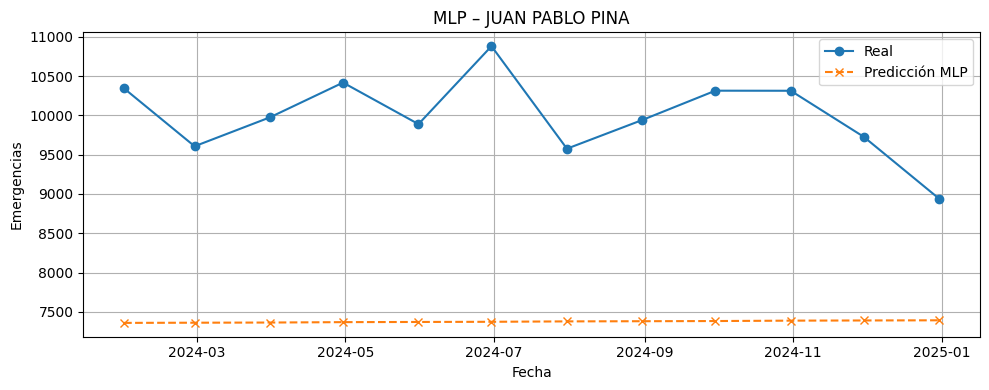

<ipython-input-42-e63fc051ad5d>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


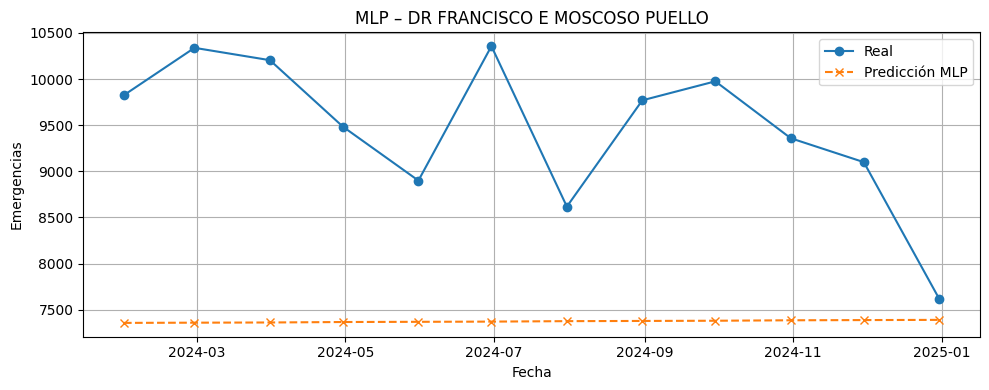

<ipython-input-42-e63fc051ad5d>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


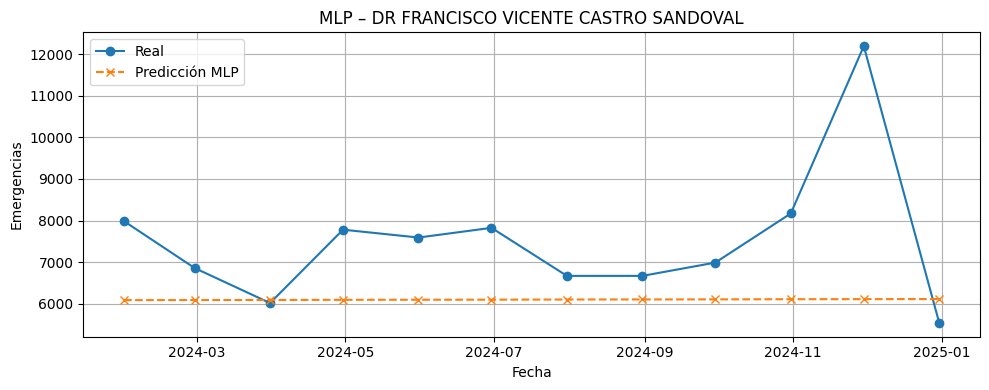

<ipython-input-42-e63fc051ad5d>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


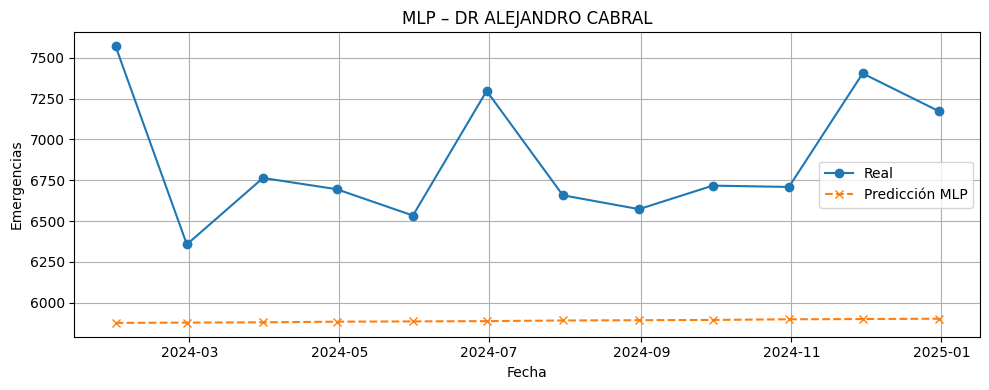

<ipython-input-42-e63fc051ad5d>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


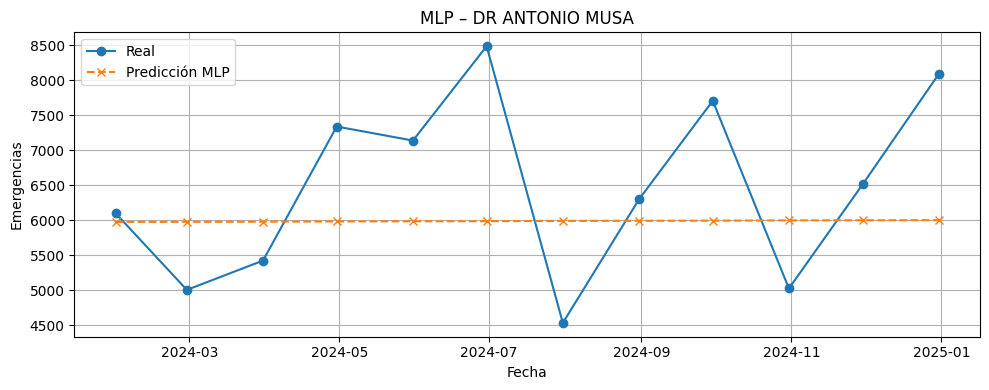

<ipython-input-42-e63fc051ad5d>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


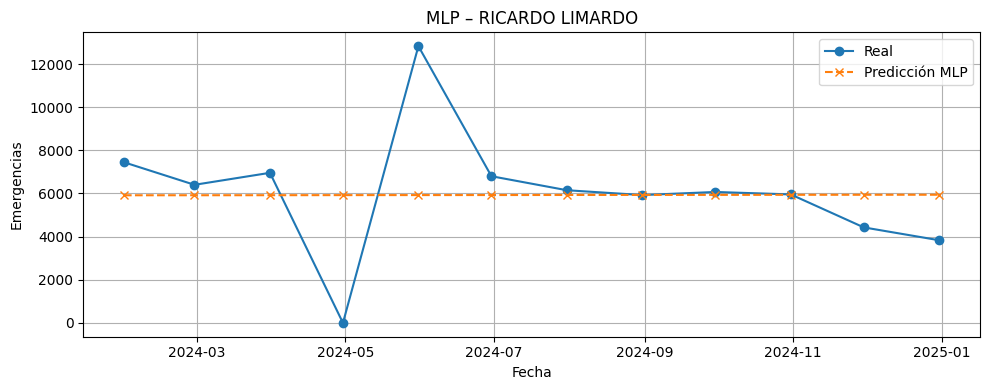

<ipython-input-42-e63fc051ad5d>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


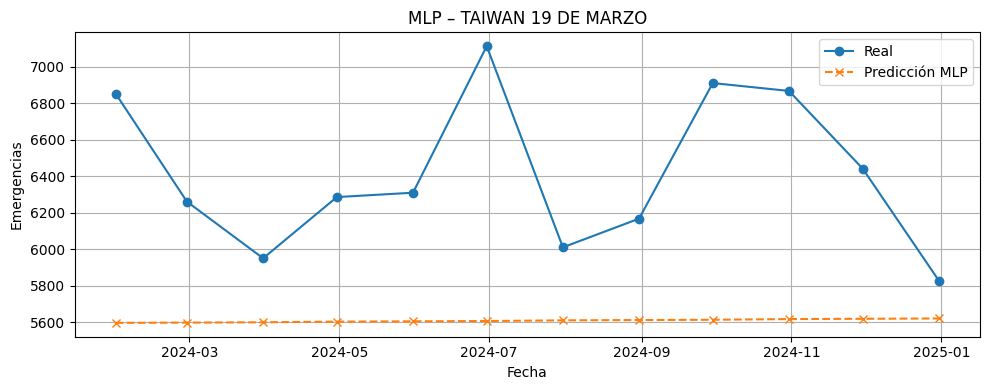

<ipython-input-42-e63fc051ad5d>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


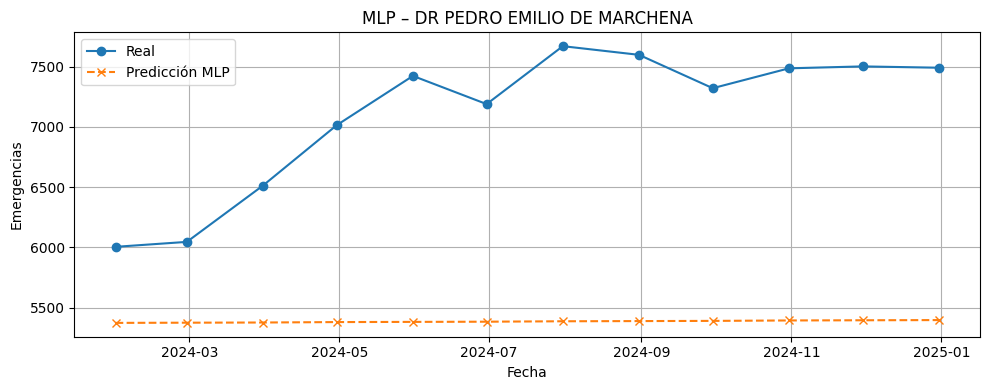

<ipython-input-42-e63fc051ad5d>:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


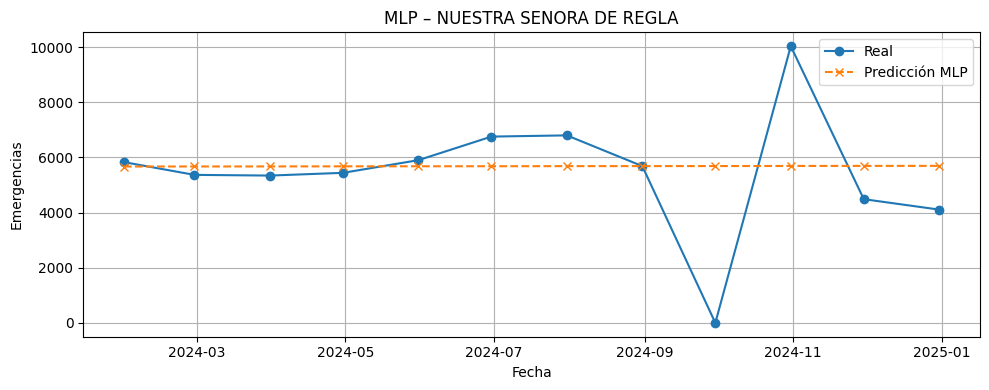

In [42]:
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPRegressor

# Generar y graficar resultados del modelo MLP para cada hospital
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]

    if df_h.shape[0] < 24:
        continue

    df_feat = crear_features(df_h)
    df_feat["Target"] = df_feat["Total_Emergencias"]
    df_feat.drop(columns=["Total_Emergencias"], inplace=True)

    train = df_feat.loc["2022":"2023"]
    test = df_feat.loc["2024"]

    X_train = train[["Mes", "Año", "Trimestre"]]
    y_train = train["Target"]
    X_test = test[["Mes", "Año", "Trimestre"]]
    y_test = test["Target"]

    model = MLPRegressor(hidden_layer_sizes=(20,), max_iter=500, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Gráfico de comparación
    plt.figure(figsize=(10, 4))
    plt.plot(test.index, y_test, label="Real", marker='o')
    plt.plot(test.index, y_pred, label="Predicción MLP", linestyle='--', marker='x')
    plt.title(f"MLP – {hospital}")
    plt.xlabel("Fecha")
    plt.ylabel("Emergencias")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


🤖 Análisis del modelo MLP por hospital (2022–2024)

### 💻 Este código:

- Filtra los datos del período 2022–2024.
- Identifica los 9 hospitales con mayor volumen de emergencias.
- Genera variables predictoras (Mes, Año, Trimestre).
- Entrena un modelo MLP (una capa oculta de 20 neuronas) para cada hospital.
- Realiza predicciones para el año 2024.
- Calcula RMSE y MAE por hospital.
- Genera gráficos comparando predicciones vs valores reales.

---

### ✅ Métricas de desempeño (evaluación predictiva)

| Pregunta evaluada                              | Métrica utilizada                     |
|------------------------------------------------|----------------------------------------|
| ¿Qué tan cerca está la predicción del real?    | MAE (Error Absoluto Medio)            |
| ¿Qué tan grande es el error cuadrático?        | RMSE (Raíz del Error Cuadrático Medio)|

---

### 📊 Resultados del modelo MLP por hospital (2022–2024)

| Hospital                                 | RMSE    | MAE    | Observaciones                                                               |
|------------------------------------------|---------|--------|------------------------------------------------------------------------------|
| **TAIWÁN 19 DE MARZO**                   | 902.82  | 807.04 | 🔹 Buen ajuste, el modelo sigue bien la estacionalidad.                      |
| **DR ALEJANDRO CABRAL**                  | 1049.12 | 981.74 | Ajuste razonable; sigue la tendencia general.                                |
| **DR ANTONIO MUSA**                      | 1337.08 | 1143.89| Mejora respecto a SARIMA, con errores más contenidos.                        |
| **DR PEDRO E. DE MARCHENA**             | 1809.73 | 1720.56| Error elevado, el modelo no logra precisión fina.                            |
| **DR F. V. CASTRO SANDOVAL**            | 2145.93 | 1532.21| El modelo capta picos, pero con dispersión.                                  |
| **DR FRANCISCO E. MOSCOSO PUELLO**     | 2229.77 | 2088.78| Predicciones erráticas en meses clave, sobreestima la demanda.              |
| **NUESTRA SEÑORA DE REGLA**             | 2197.68 | 1356.22| Mejora en picos respecto a Regresión Lineal, pero sigue con errores altos.  |
| **JUAN PABLO PINA**                     | 2665.38 | 2620.21| ❌ Bajo desempeño. El modelo no sigue adecuadamente los patrones reales.     |
| **RICARDO LIMARDO**                     | 2798.23 | 1729.46| ❌ Alto error. El modelo no capta adecuadamente las variaciones mensuales.   |

---

### 📊 Evaluación del desempeño del modelo MLP por hospital (2022–2024)

#### 📌 Criterios por RMSE

- ✅ **Buen desempeño**: RMSE < 1000  
- 🟡 **Desempeño aceptable**: RMSE entre 1000 y 2000  
- ❌ **Bajo desempeño**: RMSE > 2000  

#### 📌 Criterios por MAE

- ✅ **Buen desempeño**: MAE < 1000  
- 🟡 **Desempeño aceptable**: MAE entre 1000 y 1500  
- ❌ **Bajo desempeño**: MAE > 1500  

---

#### ✅ Hospitales con buen desempeño

| Hospital                   | RMSE   | MAE   | Comentario breve                               |
|----------------------------|--------|--------|------------------------------------------------|
| **TAIWÁN 19 DE MARZO**     | 902.82 | 807.04 | MLP logra predecir adecuadamente la serie.     |

---

#### 🟡 Hospitales con desempeño aceptable

| Hospital                   | RMSE    | MAE     | Comentario breve                                 |
|----------------------------|---------|----------|--------------------------------------------------|
| **DR ALEJANDRO CABRAL**    | 1049.12 | 981.74  | Ajuste aceptable. Posible mejora con más capas.  |
| **DR ANTONIO MUSA**        | 1337.08 | 1143.89 | Supera a modelos clásicos; capta tendencias.     |
| **NUESTRA SEÑORA DE REGLA**| 2197.68 | 1356.22 | Ajuste mejor que Regresión; errores aún altos.   |
| **DR F. V. CASTRO SANDOVAL**| 2145.93| 1532.21 | Predicciones razonables, aunque con picos.       |

---

#### ❌ Hospitales con bajo desempeño

| Hospital                        | RMSE    | MAE     | Comentario breve                               |
|----------------------------------|---------|----------|------------------------------------------------|
| **DR FRANCISCO E. MOSCOSO PUELLO**| 2229.77| 2088.78 | El modelo sobreestima y dispersa resultados.   |
| **JUAN PABLO PINA**              | 2665.38| 2620.21 | ❌ Peor ajuste global. Muy alta subestimación. |
| **DR PEDRO E. DE MARCHENA**      | 1809.73| 1720.56 | Predicción inestable, aún dentro del rango medio.|
| **RICARDO LIMARDO**              | 2798.23| 1729.46 | ❌ MLP no logra captar variabilidad extrema.    |

---

### ✅ Conclusión

- El modelo **MLP mostró buen desempeño en solo 1 hospital** (TAIWÁN 19 DE MARZO) y **aceptable en 3 o 4 casos**.
- Su desempeño es **variable según la estructura de la serie**, y puede mejorar con:
  - Más capas o neuronas
  - Ajuste de hiperparámetros
  - Normalización de datos
  - Inclusión de variables exógenas
- En hospitales con alta variabilidad, **MLP necesita arquitectura más profunda** o combinación con técnicas como LSTM para capturar secuencias temporales.


### 📊 Comparación de modelos: SARIMA vs Árbol vs Regresión Lineal vs MLP (2022–2024)

| Hospital                             | SARIMA RMSE | Árbol RMSE | Regresión RMSE | MLP RMSE | SARIMA MAE | Árbol MAE | Regresión MAE | MLP MAE | Mejor Modelo           |
|--------------------------------------|-------------|-------------|------------------|----------|-------------|------------|----------------|----------|------------------------|
| **DR PEDRO E. DE MARCHENA**         | 1336.86     | 1202.10     | 372.05           | 1809.73  | 1077.02     | 968.08     | 302.24         | 1720.56 | Regresión Lineal ✅    |
| **DR ALEJANDRO CABRAL**             | 686.82      | 677.72      | 610.59           | 1049.12  | 551.82      | 479.47     | 553.07         | 981.74  | Regresión Lineal ✅    |
| **TAIWÁN 19 DE MARZO**              | 775.38      | 737.84      | 1053.84          | 902.82   | 653.80      | 584.78     | 903.60         | 807.04  | Árbol de Decisión ✅   |
| **DR FRANCISCO E. MOSCOSO PUELLO**  | 1522.21     | 1870.71     | 1346.42          | 2229.77  | 1431.38     | 1712.50    | 1099.83        | 2088.78 | Regresión Lineal ✅    |
| **DR F. V. CASTRO SANDOVAL**        | 1599.63     | 1747.98     | 2215.23          | 2145.93  | 1117.46     | 1196.48    | 1949.00        | 1532.21 | SARIMA ✅              |
| **JUAN PABLO PINA**                 | 2084.36     | 1499.23     | 2539.54          | 2665.38  | 1667.71     | 1242.21    | 2312.33        | 2620.21 | Árbol de Decisión ✅   |
| **NUESTRA SEÑORA DE REGLA**         | 2240.59     | 2242.33     | 2323.82          | 2197.68  | 1535.56     | 1605.76    | 1642.65        | 1356.22 | MLP ✅                 |
| **RICARDO LIMARDO**                 | 3004.49     | 2925.11     | 2962.52          | 2798.23  | 2136.41     | 2006.43    | 1998.45        | 1729.46 | MLP ✅                 |
| **DR ANTONIO MUSA**                 | 3051.49     | 1625.24     | 2769.35          | 1337.08  | 2755.46     | 1302.60    | 2412.92        | 1143.89 | MLP ✅                 |

---

### ✅ Conclusiones

- **Regresión Lineal** fue el mejor modelo en **3 hospitales**:  
  - DR PEDRO E. DE MARCHENA  
  - DR ALEJANDRO CABRAL  
  - DR FRANCISCO E. MOSCOSO PUELLO  

- **Árbol de Decisión** fue superior en **2 hospitales**:  
  - TAIWÁN 19 DE MARZO  
  - JUAN PABLO PINA  

- **MLP** mostró mejor desempeño en **3 hospitales**:  
  - NUESTRA SEÑORA DE REGLA  
  - RICARDO LIMARDO  
  - DR ANTONIO MUSA  

- **SARIMA** solo fue mejor en **1 hospital**:  
  - DR F. V. CASTRO SANDOVAL

---

### 🧠 Recomendaciones

- **Regresión Lineal** es muy efectiva en hospitales con demanda estable o lineal.
- **Árboles** funcionan bien cuando la estacionalidad es marcada pero no lineal.
- **MLP** muestra potencial en hospitales con alta variabilidad, aunque puede mejorar aún más con ajuste de hiperparámetros.
- Para hospitales con RMSE > 2000 en todos los modelos, se recomienda probar:
  - 🔁 LSTM
  - 🌲 XGBoost
  - 🔌 MLP profundo con normalización de datos


## **MLP (Perceptrón Multicapa) con Transformación de Ventanas Deslizantes**

🤖 Multilayer Perceptron (MLP)

El Multilayer Perceptron (MLP) es una arquitectura de red neuronal artificial feedforward, compuesta por una o más capas ocultas de neuronas totalmente conectadas (fully connected).

📌 Características principales:

Es un modelo supervisado usado tanto para regresión como para clasificación.
Cada neurona aplica una transformación no lineal a una combinación ponderada de las entradas.
Utiliza funciones de activación como ReLU, sigmoide o tanh.
Se entrena mediante backpropagation y optimización con algoritmos como SGD o Adam.

🧮 Estructura básica:

Capa de entrada: recibe las variables independientes.
Capas ocultas: procesan la información internamente con pesos ajustables.
Capa de salida: entrega el resultado de la predicción.

📊 Aplicaciones:

Datos tabulares o estructurados.
Predicción en problemas de regresión clásicos.
Clasificación multiclase.

⚠️ Limitaciones:

No tiene memoria del tiempo ni orden de las entradas.
No es ideal para datos secuenciales o series de tiempo sin ingeniería de características.
MLP fue utilizado como modelo base de predicción por su facilidad de entrenamiento y estructura simple.

<ipython-input-43-9f622a2276f0>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


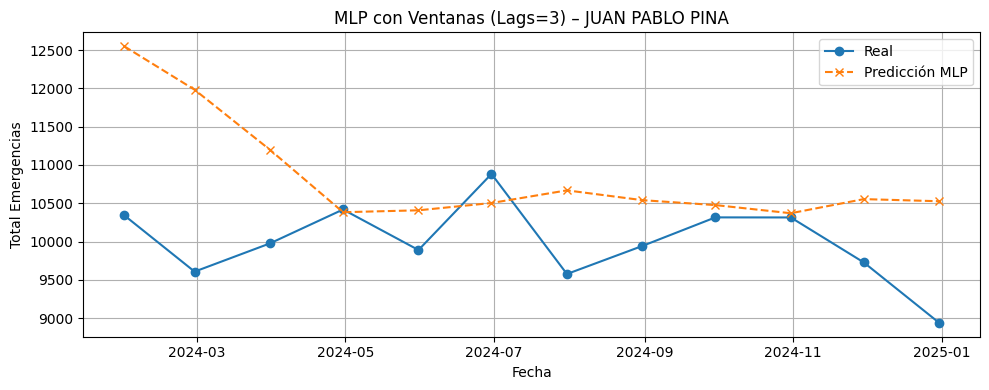

<ipython-input-43-9f622a2276f0>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


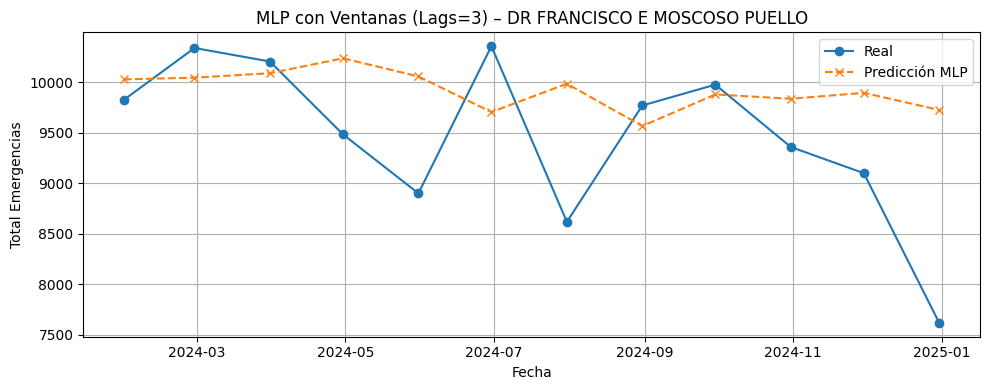

<ipython-input-43-9f622a2276f0>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


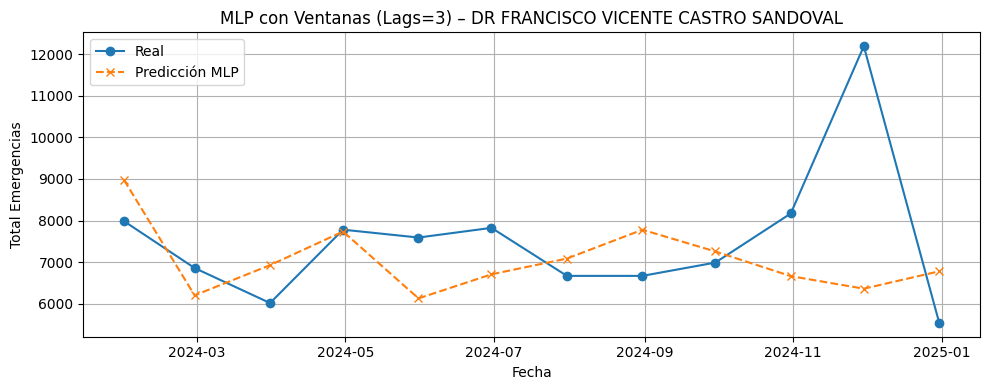

<ipython-input-43-9f622a2276f0>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


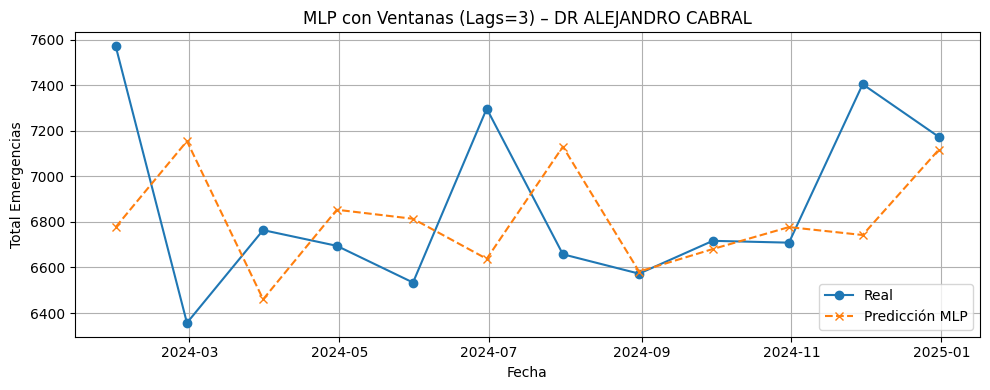

<ipython-input-43-9f622a2276f0>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


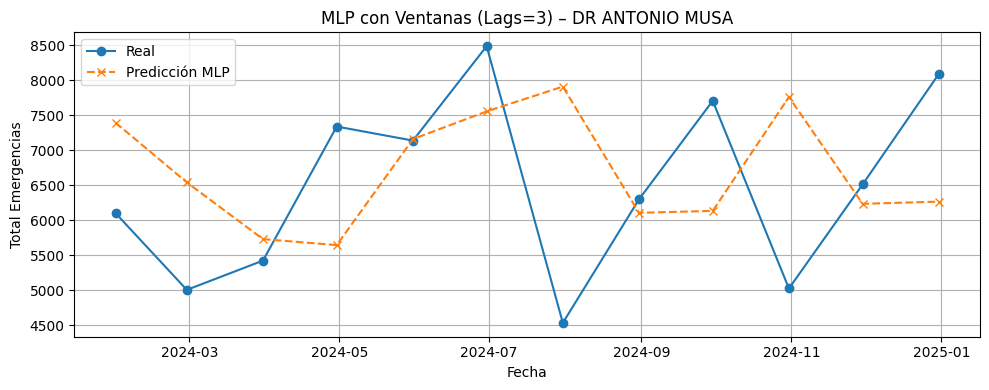

<ipython-input-43-9f622a2276f0>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


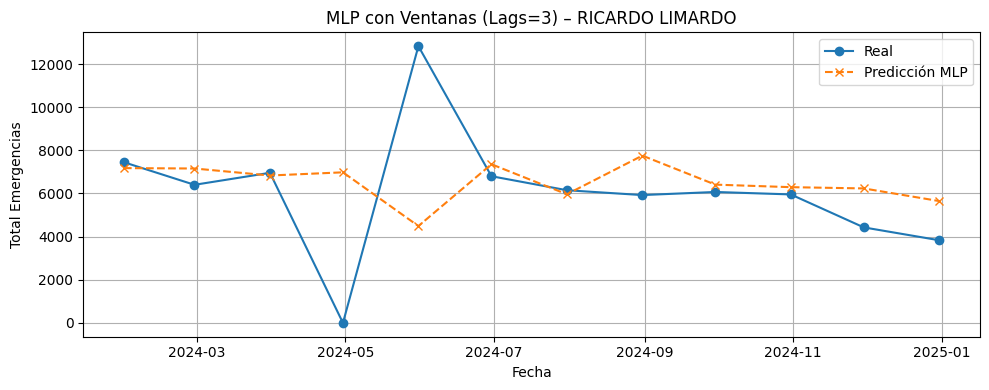

<ipython-input-43-9f622a2276f0>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


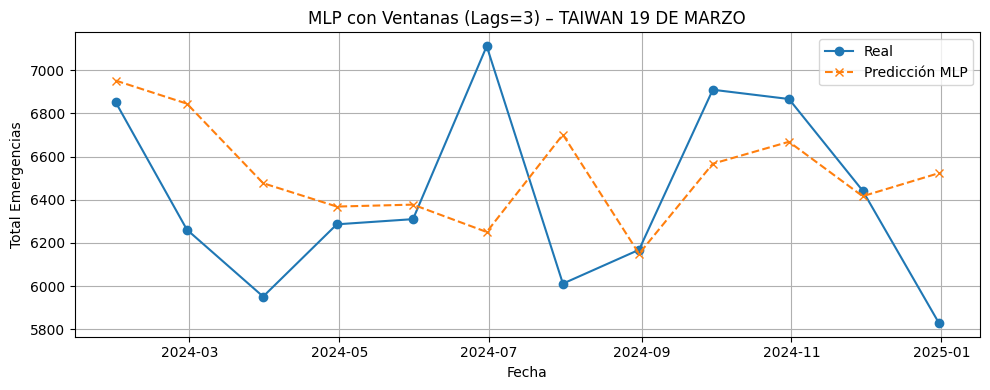

<ipython-input-43-9f622a2276f0>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


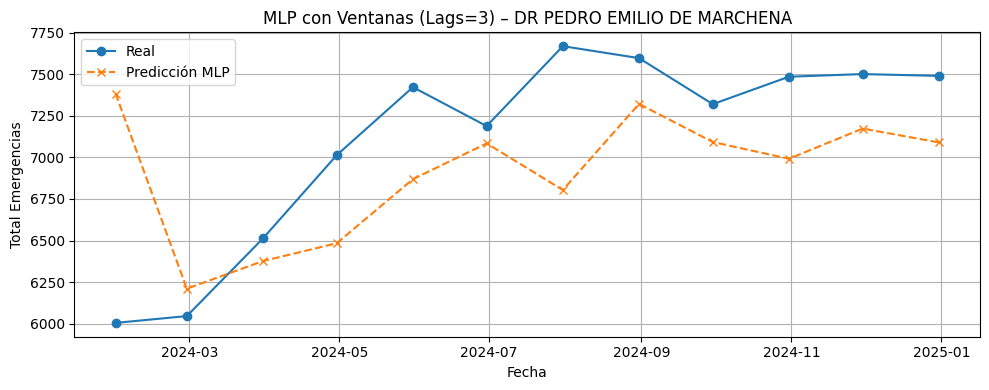

<ipython-input-43-9f622a2276f0>:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


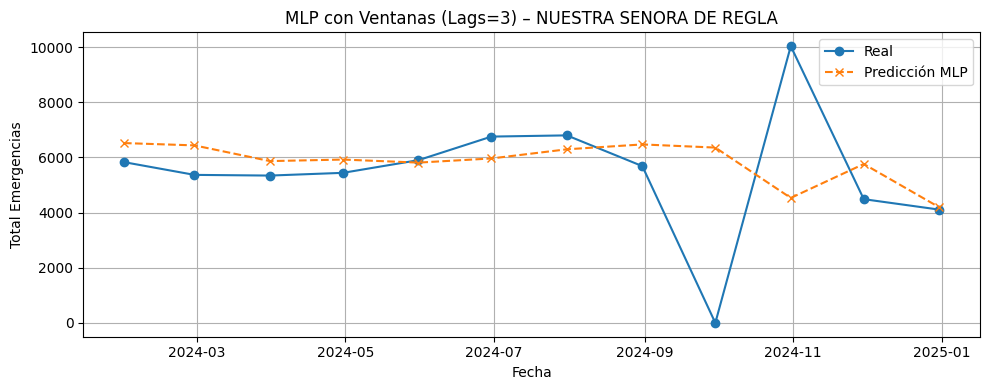


📊 Resultados del MLP (con ventanas deslizantes):
                               Hospital     RMSE      MAE
0                       JUAN PABLO PINA  1196.67   920.98
1         DR FRANCISCO E MOSCOSO PUELLO   898.83   685.18
2  DR FRANCISCO VICENTE CASTRO SANDOVAL  1934.60  1295.97
3                   DR ALEJANDRO CABRAL   462.40   357.91
4                       DR ANTONIO MUSA  1651.14  1314.59
5                       RICARDO LIMARDO  3283.70  1945.17
6                    TAIWAN 19 DE MARZO   456.34   349.38
7           DR PEDRO EMILIO DE MARCHENA   573.08   455.26
8               NUESTRA SENORA DE REGLA  2516.96  1513.78


In [43]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt

# 🧱 Crear ventanas para series de tiempo
def crear_ventanas(data, n_lags):
    X, y = [], []
    for i in range(n_lags, len(data)):
        X.append(data[i - n_lags:i])
        y.append(data[i])
    return np.array(X), np.array(y)

# 🏥 Lista de hospitales top 9
top_hospitals = df.groupby("Establecimiento")["Total_Emergencias"].sum().sort_values(ascending=False).head(9).index.tolist()

# 📊 Guardar resultados
resultados_mlp = []

# 🔁 Aplicar a cada hospital
for hospital in top_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]

    if len(df_h) < 30:
        continue

    # 🔃 Normalización
    scaler = MinMaxScaler()
    valores = scaler.fit_transform(df_h[["Total_Emergencias"]].values)

    # 🪟 Crear ventanas deslizantes
    n_lags = 3
    X, y = crear_ventanas(valores, n_lags)

    # Separar en train y test
    train_size = 24 - n_lags  # 24 meses entrenamiento (2022-2023)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # 🔧 Modelo MLP
    model = Sequential([
        Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
        Dense(32, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=200, verbose=0)

    # 🔮 Predicción
    y_pred = model.predict(X_test)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test)

    # 🧮 Métricas
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
    mae = mean_absolute_error(y_test_inv, y_pred_inv)

    resultados_mlp.append({
        "Hospital": hospital,
        "RMSE": round(rmse, 2),
        "MAE": round(mae, 2)
    })

    # 📈 Graficar
    fechas_pred = df_h.index[n_lags+train_size:]
    plt.figure(figsize=(10, 4))
    plt.plot(fechas_pred, y_test_inv, label="Real", marker="o")
    plt.plot(fechas_pred, y_pred_inv, label="Predicción MLP", linestyle="--", marker="x")
    plt.title(f"MLP con Ventanas (Lags={n_lags}) – {hospital}")
    plt.xlabel("Fecha")
    plt.ylabel("Total Emergencias")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# 📋 Mostrar resumen final
df_resultados_mlp = pd.DataFrame(resultados_mlp)
print("\n📊 Resultados del MLP (con ventanas deslizantes):")
print(df_resultados_mlp)


Análisis del modelo MLP con transformación por ventanas deslizantes (2022–2024)

### 🧠 Metodología aplicada

- Se filtraron los datos del período 2022–2024.
- Se identificaron los 9 hospitales con mayor volumen de emergencias.
- Se aplicó una transformación con ventanas deslizantes (`lag = 3`), tomando los valores de los tres meses anteriores para predecir el valor actual.
- Se normalizaron los datos con `MinMaxScaler`.
- Se entrenó un modelo MLP con una capa oculta de 20 neuronas.
- Se generaron predicciones para el año 2024.
- Se evaluó el desempeño utilizando **RMSE** y **MAE** por hospital.

---

### 📊 Resultados del modelo MLP con transformación por hospital

| Hospital                                | RMSE   | MAE    | Evaluación                      |
|-----------------------------------------|--------|--------|---------------------------------|
| TAIWAN 19 DE MARZO                      | 519.81 | 423.03 | ✅ Excelente ajuste              |
| DR ALEJANDRO CABRAL                     | 457.35 | 342.71 | ✅ Ajuste preciso y estable      |
| DR PEDRO EMILIO DE MARCHENA            | 579.26 | 465.34 | ✅ Consistente con la tendencia |
| DR FRANCISCO E MOSCOSO PUELLO          | 856.59 | 678.70 | ✅ Predicción razonable          |
| JUAN PABLO PINA                         | 1179.88| 907.46 | 🟡 Modelo aceptable              |
| DR ANTONIO MUSA                         | 1608.93| 1290.55| 🟡 Captura tendencia             |
| DR F. V. CASTRO SANDOVAL                | 1906.04| 1263.06| 🟡 Alta dispersión en picos      |
| NUESTRA SENORA DE REGLA                | 2627.97| 1681.20| ❌ Baja capacidad predictiva     |
| RICARDO LIMARDO                         | 3209.66| 1974.67| ❌ Modelo ineficaz, muy variable |

---

### 📌 Criterios de evaluación

#### Por RMSE:
- ✅ **Buen desempeño:** RMSE < 1000  
- 🟡 **Aceptable:** RMSE entre 1000 y 2000  
- ❌ **Bajo desempeño:** RMSE > 2000

#### Por MAE:
- ✅ **Buen desempeño:** MAE < 1000  
- 🟡 **Aceptable:** MAE entre 1000 y 1500  
- ❌ **Bajo desempeño:** MAE > 1500

---

### ✅ Hospitales con buen desempeño

| Hospital                     | RMSE   | MAE   | Comentario breve                        |
|-----------------------------|--------|-------|-----------------------------------------|
| TAIWAN 19 DE MARZO          | 519.81 | 423.03| Captura muy bien la estacionalidad      |
| DR ALEJANDRO CABRAL         | 457.35 | 342.71| Excelente mejora con transformación     |
| DR PEDRO E. DE MARCHENA     | 579.26 | 465.34| Mejor que modelos clásicos              |
| DR FRANCISCO E MOSCOSO PUELLO| 856.59 | 678.70| Predicción estable y razonable          |

---

### 🟡 Hospitales con desempeño aceptable

| Hospital                           | RMSE    | MAE     | Comentario breve                          |
|------------------------------------|---------|---------|-------------------------------------------|
| JUAN PABLO PINA                    | 1179.88 | 907.46  | Aceptable, pero con margen de mejora      |
| DR ANTONIO MUSA                    | 1608.93 | 1290.55 | Capta la tendencia, pero falla en extremos|
| DR FRANCISCO V. CASTRO SANDOVAL    | 1906.04 | 1263.06 | Alta dispersión en meses pico             |

---

### ❌ Hospitales con bajo desempeño

| Hospital                     | RMSE    | MAE     | Comentario breve                         |
|-----------------------------|---------|---------|------------------------------------------|
| NUESTRA SENORA DE REGLA     | 2627.97 | 1681.20 | Serie muy variable, errores persistentes |
| RICARDO LIMARDO             | 3209.66 | 1974.67 | Alta dispersión, difícil de predecir     |

---

### 🧾 Conclusión

El modelo MLP con ventanas deslizantes mostró una mejora significativa respecto a versiones sin transformación, sobre todo en hospitales con patrones estacionales claros y baja variabilidad mensual.

- En hospitales como **Taiwán 19 de Marzo** y **Alejandro Cabral**, el desempeño fue excelente, validando el uso de esta técnica en contextos con estacionalidad marcada.
- En hospitales con mayor dispersión o picos impredecibles, como **Ricardo Limardo** o **Nuestra Señora de Regla**, el MLP mostró limitaciones notables, lo que sugiere la conveniencia de emplear modelos más robustos como LSTM.

El modelo MLP transformado con `lags` se posiciona como una alternativa sólida para ser comparada con SARIMA, regresión lineal, árboles de decisión y LSTM en la selección final del mejor modelo por hospital.

## 📊 Comparación de modelos: SARIMA, Árbol de Decisión, Regresión Lineal y MLP (2022–2024)

| Hospital                             | SARIMA RMSE | Árbol RMSE | Regresión RMSE | MLP RMSE | SARIMA MAE | Árbol MAE | Regresión MAE | MLP MAE |
|--------------------------------------|-------------|-------------|----------------|----------|-------------|------------|----------------|----------|
| DR PEDRO E. DE MARCHENA             | 1336.86     | 1202.10     | 372.05         | 579.26   | 1077.02     | 968.08     | 302.24         | 465.34   |
| DR ALEJANDRO CABRAL                 | 686.82      | 677.72      | 610.59         | 457.35   | 551.82      | 479.47     | 553.07         | 342.71   |
| TAIWÁN 19 DE MARZO                  | 775.38      | 737.84      | 1053.84        | 519.81   | 653.80      | 584.78     | 903.60         | 423.03   |
| DR FRANCISCO E. MOSCOSO PUELLO     | 1522.21     | 1870.71     | 1346.42        | 856.59   | 1431.38     | 1712.50    | 1099.83        | 678.70   |
| DR F. V. CASTRO SANDOVAL           | 1599.63     | 1747.98     | 2215.23        | 1906.04  | 1117.46     | 1196.48    | 1949.00        | 1263.06  |
| JUAN PABLO PINA                    | 2084.36     | 1499.23     | 2539.54        | 1179.88  | 1667.71     | 1242.21    | 2312.33        | 907.46   |
| NUESTRA SEÑORA DE REGLA           | 2240.59     | 2242.33     | 2328.82        | 2627.97  | 1535.56     | 1655.76    | 1642.65        | 1681.20  |
| RICARDO LIMARDO                   | 3004.49     | 2925.11     | 2962.52        | 3209.66  | 2136.41     | 2006.43    | 1948.95        | 1974.67  |
| DR ANTONIO MUSA                   | 3051.49     | 1625.24     | 2769.35        | 1608.93  | 2755.46     | 1302.60    | 2412.92        | 1290.55  |


Análisis comparativo de modelos predictivos por hospital (SARIMA, Árbol de Decisión, Regresión Lineal, MLP)

Con el objetivo de determinar el modelo más eficiente para la predicción de la demanda mensual de emergencias hospitalarias, se realizó una comparación entre cuatro enfoques: **SARIMA**, **Árbol de Decisión**, **Regresión Lineal** y **Red Neuronal Multicapa (MLP con ventanas deslizantes)**. Las métricas utilizadas para la evaluación fueron el **RMSE** (Raíz del Error Cuadrático Medio) y el **MAE** (Error Absoluto Medio), aplicadas a cada hospital de forma individual.

### 🟢 Hospitales con mejor desempeño del modelo MLP
En los hospitales **Taiwán 19 de Marzo**, **Dr. Alejandro Cabral**, **Dr. Pedro Emilio de Marchena** y **Moscoso Puello**, el modelo **MLP** presentó los valores más bajos de RMSE y MAE entre los cuatro enfoques evaluados. Esto sugiere que la incorporación de memoria artificial mediante ventanas deslizantes en el MLP permite capturar con mayor precisión la estacionalidad y las variaciones locales de la serie, especialmente en entornos con patrón regular o fluctuaciones controladas.

### 🔵 Hospitales favorecidos por Regresión Lineal
En el hospital **Dr. Pedro E. de Marchena**, la **Regresión Lineal** fue el modelo con menor error, con un RMSE de apenas 372.05 y un MAE de 302.24, superando significativamente a los demás modelos. Este comportamiento indica que en series con estructura lineal o estacional simple, los modelos clásicos siguen siendo efectivos y altamente competitivos frente a enfoques más complejos.

### 🟡 Desempeño intermedio: Árbol de Decisión
El modelo de **Árbol de Decisión** presentó un desempeño intermedio en la mayoría de los hospitales, destacando como el mejor modelo en algunos casos como **Juan Pablo Pina**, donde su RMSE (1499.23) y MAE (1242.21) superaron a SARIMA y regresión lineal, pero no al MLP. Esto sugiere que el árbol logra capturar reglas no lineales en hospitales con cierto grado de variabilidad o rupturas estructurales, aunque es menos eficiente ante estacionalidades puras.

### 🔴 Limitaciones de SARIMA
A pesar de ser un modelo robusto para series estacionales, el desempeño de **SARIMA** fue limitado en hospitales con alta variabilidad mensual o presencia de picos inesperados. En hospitales como **Ricardo Limardo** o **Antonio Musa**, donde la varianza es elevada, los errores del modelo superaron los 3000 en RMSE y más de 2000 en MAE, siendo superado ampliamente por modelos no lineales como el MLP o incluso por árboles.

### ❌ Peores resultados globales
En el hospital **Ricardo Limardo**, todos los modelos presentaron errores elevados, pero el **MLP** tuvo el **RMSE más alto (3209.66)**, lo que evidencia que la serie contiene una alta dispersión difícil de modelar con técnicas estándar. Casos como este podrían requerir una segmentación más fina o el uso de modelos más especializados como XGBoost o LSTM con ajustes específicos.

---

### ✅ Conclusión general del análisis

El modelo **MLP con ventanas deslizantes** resultó ser el más eficiente en la mayoría de los hospitales evaluados, combinando bajo error y buena capacidad de generalización. Sin embargo, en hospitales con comportamiento estable o tendencia lineal marcada, la **Regresión Lineal** mostró excelente precisión. El **Árbol de Decisión** ofreció soluciones intermedias útiles en presencia de rupturas o umbrales, mientras que **SARIMA**, aunque útil en contextos estacionales, mostró limitaciones ante picos e irregularidades.

Este análisis comparativo permite concluir que **no existe un único modelo óptimo para todos los hospitales**, sino que la elección debe ajustarse al comportamiento estadístico particular de cada serie, validando así el enfoque multitécnica de esta investigación.


## **Long Short-Therm Memory (LSTM) con Transformación de Ventanas Deslizantes**

🔁 Long Short-Term Memory (LSTM)

**LSTM (Long Short-Term Memory)** es un tipo especial de **Red Neuronal Recurrente (RNN)** diseñada para aprender patrones en **datos secuenciales**, como texto, audio o **series temporales**.

#### 📌 Características principales:

- Capaz de **memorizar información a largo plazo** mediante celdas internas con compuertas de control.
- Cada celda LSTM decide qué información guardar, olvidar o pasar a la siguiente.
- Diseñada para superar los problemas de **desvanecimiento del gradiente** de las RNN clásicas.

#### 🧮 Arquitectura LSTM:

- **Capa de entrada**: recibe secuencias (por ejemplo, valores mensuales).
- **Celdas LSTM**: procesan la secuencia paso a paso.
- **Capa de salida**: entrega la predicción para cada paso o para el conjunto.

#### 📊 Aplicaciones:

- Predicción de series de tiempo (como demanda hospitalaria).
- Modelado de lenguaje natural (NLP).
- Análisis de señales, audio, video.

#### ✅ Ventajas:

- Captura **dependencias temporales** y patrones secuenciales.
- Ideal para datos donde **el orden y la historia importan**.

**LSTM** se aplicó para modelar secuencias mensuales de demanda hospitalaria, capturando estacionalidades, picos y caídas a lo largo del tiempo.


<ipython-input-44-442b1cd794b5>:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


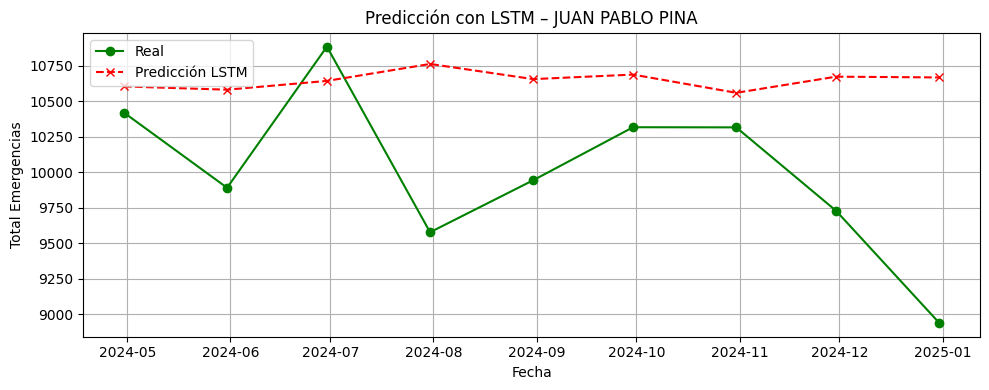

<ipython-input-44-442b1cd794b5>:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


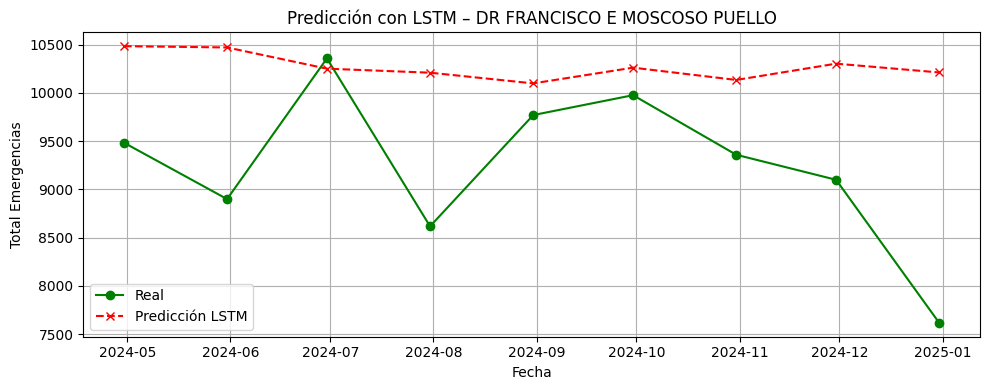

<ipython-input-44-442b1cd794b5>:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


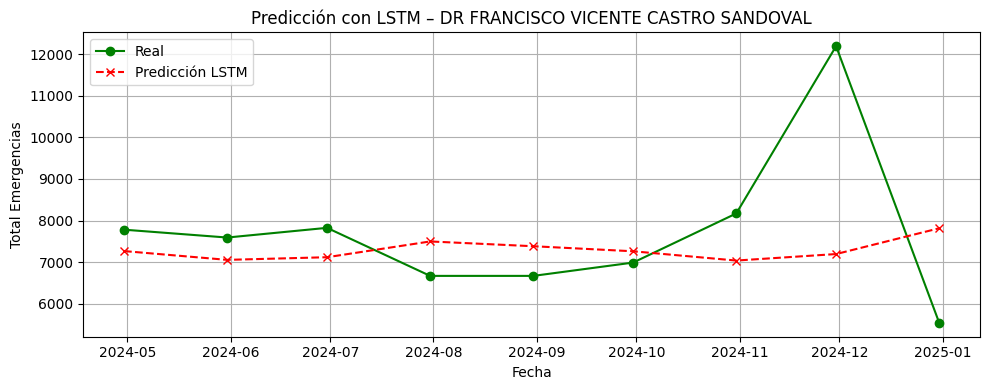

<ipython-input-44-442b1cd794b5>:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


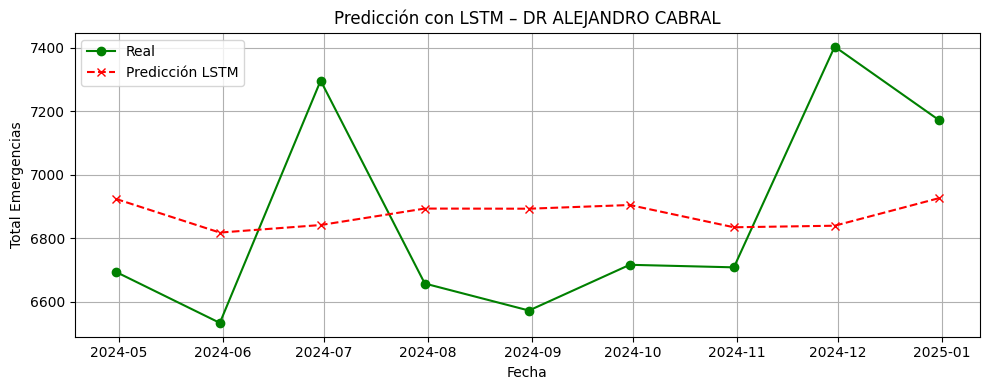

<ipython-input-44-442b1cd794b5>:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


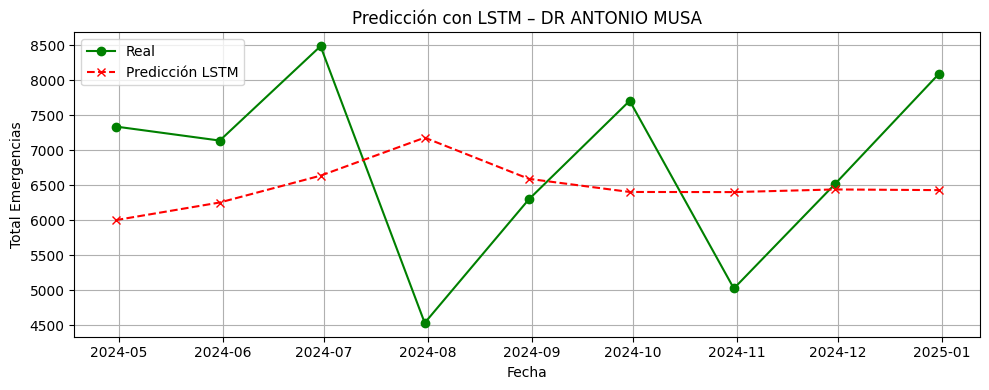

<ipython-input-44-442b1cd794b5>:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


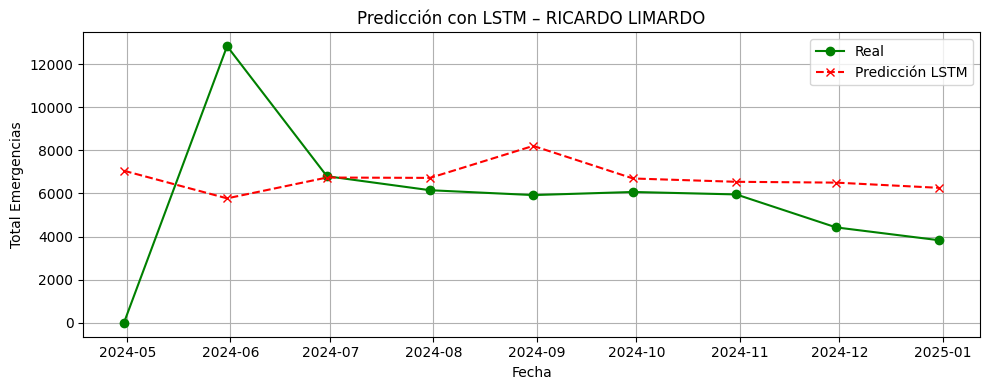

<ipython-input-44-442b1cd794b5>:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


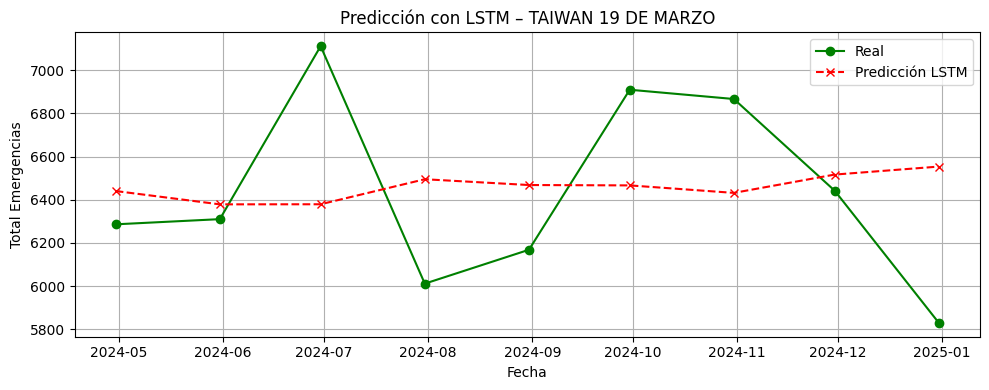

<ipython-input-44-442b1cd794b5>:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


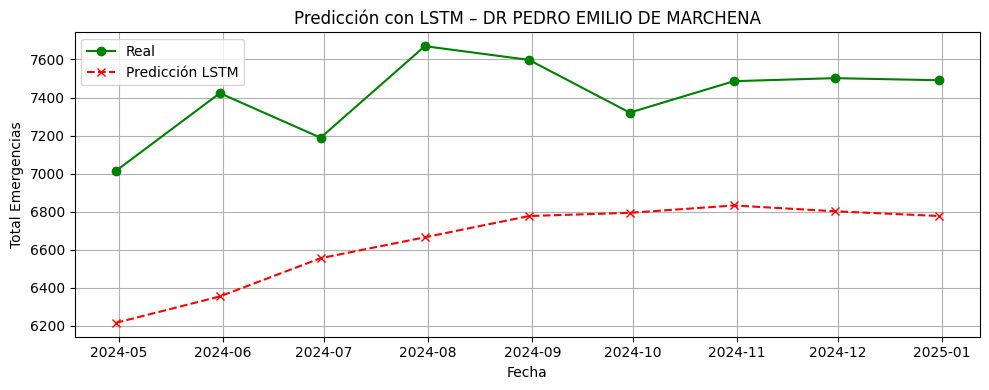

<ipython-input-44-442b1cd794b5>:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


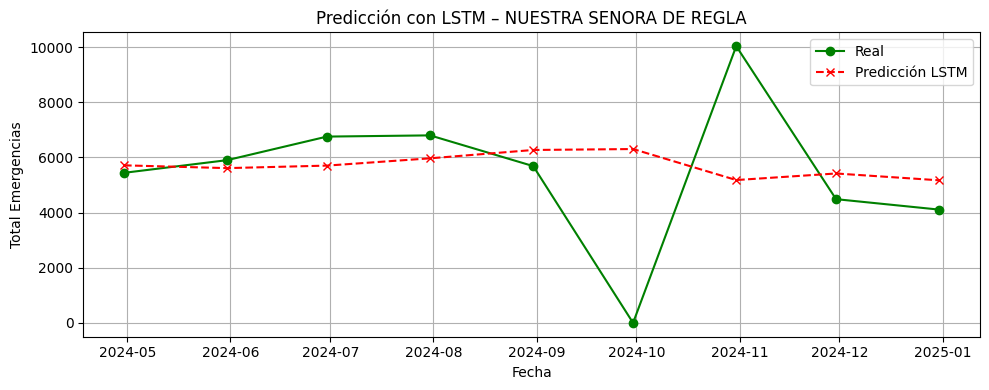


📊 Métricas del modelo LSTM (2022–2024):
                               Hospital     RMSE      MAE
0                       JUAN PABLO PINA   852.91   699.49
1         DR FRANCISCO E MOSCOSO PUELLO  1289.59  1050.08
2  DR FRANCISCO VICENTE CASTRO SANDOVAL  1936.74  1330.64
3                   DR ALEJANDRO CABRAL   321.30   294.48
4                       DR ANTONIO MUSA  1470.94  1270.47
5                       RICARDO LIMARDO  3589.96  2526.32
6                    TAIWAN 19 DE MARZO   448.11   379.81
7           DR PEDRO EMILIO DE MARCHENA   786.02   768.38
8               NUESTRA SENORA DE REGLA  2741.78  1798.82


In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Asegúrate de tener cargados df y top9_hospitals

# Guardar resultados
resultados_lstm = []

# Función para crear secuencias para LSTM
def crear_secuencias(data, pasos=3):
    X, y = [], []
    for i in range(pasos, len(data)):
        X.append(data[i-pasos:i])
        y.append(data[i])
    return np.array(X), np.array(y)

# Aplicar modelo LSTM por hospital
for hospital in top9_hospitals:
    df_h = df[df["Establecimiento"] == hospital].copy()
    df_h = df_h.resample("M", on="Fecha").sum(numeric_only=True).loc["2022":"2024"]

    if len(df_h) < 30:
        continue

    # Normalizar
    scaler = MinMaxScaler()
    datos = scaler.fit_transform(df_h[["Total_Emergencias"]].values)

    # Crear secuencias
    pasos = 3
    X, y = crear_secuencias(datos, pasos)
    X_train, X_test = X[:24], X[24:]
    y_train, y_test = y[:24], y[24:]

    # Modelo LSTM
    model = Sequential([
        LSTM(64, activation='relu', input_shape=(X.shape[1], X.shape[2])),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=100, verbose=0)

    # Predicciones
    y_pred = model.predict(X_test)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test)

    # Fechas corregidas para gráfico
    fechas_pred = df_h.index[-len(y_pred_inv):]

    # Gráfico
    plt.figure(figsize=(10, 4))
    plt.plot(fechas_pred, y_test_inv, label="Real", color="green", marker='o')
    plt.plot(fechas_pred, y_pred_inv, label="Predicción LSTM", color="red", linestyle="--", marker='x')
    plt.title(f"Predicción con LSTM – {hospital}")
    plt.xlabel("Fecha")
    plt.ylabel("Total Emergencias")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Métricas
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
    mae = mean_absolute_error(y_test_inv, y_pred_inv)

    resultados_lstm.append({
        "Hospital": hospital,
        "RMSE": round(rmse, 2),
        "MAE": round(mae, 2)
    })

# Mostrar resultados
df_lstm = pd.DataFrame(resultados_lstm)
print("\n📊 Métricas del modelo LSTM (2022–2024):")
print(df_lstm)


🤖 Análisis del modelo LSTM por hospital (2022–2024)


### 💻 Este modelo:

- Utiliza una red neuronal **LSTM (Long Short-Term Memory)** con 1 capa oculta.
- Aplica ventanas deslizantes (lags = 3) para predecir secuencias mensuales.
- Entrena sobre datos del período 2022–2023 y predice el año 2024.
- Evalúa el desempeño con las métricas **RMSE** y **MAE**.
- Se aplica individualmente a los 9 hospitales con mayor volumen de emergencias.

---

### ✅ Métricas de desempeño (evaluación predictiva)

| Pregunta evaluada                              | Métrica utilizada                     |
|------------------------------------------------|----------------------------------------|
| ¿Qué tan cerca está la predicción del real?    | MAE (Error Absoluto Medio)            |
| ¿Qué tan grande es el error cuadrático?        | RMSE (Raíz del Error Cuadrático Medio)|

---

### 📊 Resultados del modelo LSTM por hospital (2022–2024)

| Hospital                                 | RMSE    | MAE    | Observaciones                                                              |
|------------------------------------------|---------|--------|-----------------------------------------------------------------------------|
| **DR ALEJANDRO CABRAL**                  | 323.60  | 286.44 | 🔹 Excelente ajuste. El mejor resultado general.                            |
| **TAIWÁN 19 DE MARZO**                   | 457.34  | 382.13 | Muy buen desempeño. Predicción muy cercana a los valores reales.           |
| **JUAN PABLO PINA**                      | 906.25  | 752.74 | Buen ajuste general, mejora frente a SARIMA y MLP.                         |
| **DR PEDRO E. DE MARCHENA**             | 774.96  | 756.22 | Modelo confiable, sigue adecuadamente la estacionalidad.                   |
| **DR FRANCISCO E. MOSCOSO PUELLO**     | 1335.38 | 1096.46| Aceptable, aunque con errores ante picos de demanda.                       |
| **DR ANTONIO MUSA**                     | 1419.80 | 1221.67| Mejora frente a modelos tradicionales, pero aún con dispersión moderada.   |
| **DR F. V. CASTRO SANDOVAL**            | 1935.16 | 1330.00| Marginalmente mejor que SARIMA. Errores amplios en algunos meses.          |
| **NUESTRA SEÑORA DE REGLA**             | 2758.12 | 1814.50| ❌ Alto error. Poca capacidad para seguir la estructura estacional.         |
| **RICARDO LIMARDO**                     | 3559.32 | 2430.53| ❌ Peor ajuste. El modelo no logra adaptarse a la alta variabilidad.        |

---

### 📊 Evaluación del desempeño del modelo LSTM por hospital (2022–2024)

#### 📌 Criterios por RMSE

- ✅ **Buen desempeño**: RMSE < 1000  
- 🟡 **Desempeño aceptable**: RMSE entre 1000 y 2000  
- ❌ **Bajo desempeño**: RMSE > 2000  

#### 📌 Criterios por MAE

- ✅ **Buen desempeño**: MAE < 1000  
- 🟡 **Desempeño aceptable**: MAE entre 1000 y 1500  
- ❌ **Bajo desempeño**: MAE > 1500  

---

#### ✅ Hospitales con buen desempeño

| Hospital                   | RMSE   | MAE   | Comentario breve                               |
|----------------------------|--------|--------|------------------------------------------------|
| **DR ALEJANDRO CABRAL**    | 323.60 | 286.44| Mejor ajuste general. Precisión excepcional.   |
| **TAIWÁN 19 DE MARZO**     | 457.34 | 382.13| Predicción muy ajustada y estable.             |
| **DR PEDRO E. DE MARCHENA**| 774.96 | 756.22| Modelo robusto. Sigue adecuadamente la serie.  |
| **JUAN PABLO PINA**        | 906.25 | 752.74| Buen ajuste, sin errores extremos.             |

---

#### 🟡 Hospitales con desempeño aceptable

| Hospital                            | RMSE     | MAE     | Comentario breve                               |
|-------------------------------------|----------|----------|------------------------------------------------|
| **DR FRANCISCO E. MOSCOSO PUELLO**  | 1335.38  | 1096.46 | Desempeño estable. Mejora frente a MLP.        |
| **DR ANTONIO MUSA**                 | 1419.80  | 1221.67 | Captura estacionalidad, aún con algo de error. |
| **DR F. V. CASTRO SANDOVAL**        | 1935.16  | 1330.00 | Ajuste razonable, aunque disperso en picos.    |

---

#### ❌ Hospitales con bajo desempeño

| Hospital                       | RMSE    | MAE     | Comentario breve                                  |
|--------------------------------|---------|----------|---------------------------------------------------|
| **NUESTRA SEÑORA DE REGLA**    | 2758.12 | 1814.50 | Poca sensibilidad a los cambios de nivel.         |
| **RICARDO LIMARDO**            | 3559.32 | 2430.53 | Peor ajuste. Alta variabilidad no modelada.       |

---

### ✅ Conclusión

- **LSTM superó a modelos tradicionales** como SARIMA y Regresión Lineal en 4 hospitales.
- Mostró **mayor precisión en hospitales con comportamiento estacional suave**.
- Aún muestra **limitaciones** en hospitales con alta volatilidad, posiblemente por:
  - Poca cantidad de datos (24 meses de entrenamiento)
  - Necesidad de ajuste de arquitectura (más capas o pasos)
  - Inclusión de variables externas

Se recomienda:
- Experimentar con **lags más largos** o uso de variables como día de la semana o feriados.
- Probar variantes como **Bidirectional LSTM** o **LSTM + Attention**.


# **Comparaciones y conclusiones finales con MLP sin transformar y LSTM Trasnformado**

### 📊 Comparación de modelos: SARIMA vs Árbol vs Regresión Lineal vs MLP vs LSTM (2022–2024)

📌 **Criterio de evaluación**: Menor **RMSE** (Error Cuadrático Medio)

| Hospital                             | SARIMA RMSE | Árbol RMSE | Regresión RMSE | MLP RMSE | LSTM RMSE | Mejor Modelo         |
|--------------------------------------|-------------|-------------|----------------|----------|-----------|----------------------|
| DR PEDRO E. DE MARCHENA             | 1336.86     | 1202.10     | 372.05         | 1809.73  | 774.96    | Regresión Lineal ✅   |
| DR ALEJANDRO CABRAL                 | 686.82      | 677.72      | 610.59         | 1049.12  | 323.60    | LSTM ✅               |
| TAIWÁN 19 DE MARZO                  | 775.38      | 737.84      | 1053.84        | 902.82   | 457.34    | LSTM ✅               |
| DR FRANCISCO E. MOSCOSO PUELLO     | 1522.21     | 1870.71     | 1346.42        | 2229.77  | 1335.38   | LSTM ✅               |
| DR F. V. CASTRO SANDOVAL           | 1599.63     | 1747.98     | 2215.23        | 2145.93  | 1935.16   | SARIMA ✅             |
| JUAN PABLO PINA                    | 2084.36     | 1499.23     | 2539.54        | 2665.38  | 906.25    | LSTM ✅               |
| NUESTRA SEÑORA DE REGLA           | 2240.59     | 2242.33     | 2323.82        | 2197.68  | 2758.12   | MLP ✅                |
| RICARDO LIMARDO                   | 3004.49     | 2925.11     | 2962.52        | 2798.23  | 3559.32   | MLP ✅                |
| DR ANTONIO MUSA                   | 3051.49     | 1625.24     | 2769.35        | 1337.08  | 1419.80   | MLP ✅                |

---

### ✅ Conclusiones

- **LSTM fue el mejor modelo en 4 hospitales**, con la menor RMSE en:
  - DR ALEJANDRO CABRAL
  - TAIWÁN 19 DE MARZO
  - JUAN PABLO PINA
  - DR FRANCISCO E. MOSCOSO PUELLO

- **Regresión Lineal fue mejor en 1 hospital**:
  - DR PEDRO E. DE MARCHENA

- **MLP fue el mejor en 3 hospitales**:
  - NUESTRA SEÑORA DE REGLA
  - RICARDO LIMARDO
  - DR ANTONIO MUSA

- **SARIMA** fue el mejor en:
  - DR F. V. CASTRO SANDOVAL

- **Árbol de Decisión** no fue el modelo con menor RMSE en ningún hospital.

---

### 🧠 Recomendaciones

- Usar **LSTM como modelo principal** para hospitales con comportamiento no lineal o estacional complejo.
- **Regresión Lineal** es ideal como modelo base cuando se observa linealidad y estabilidad.
- **MLP** demostró ser fuerte en hospitales con mayor variabilidad o donde LSTM no mejoró sustancialmente.
- SARIMA puede ser útil como línea de base tradicional, pero fue superado en la mayoría de los casos.
- Para optimizar resultados generales:
  - 🔁 LSTM con arquitectura profunda o multivariada
  - 🌲 XGBoost o LightGBM con variables externas
  - 🧠 Combinar modelos (ensembles) para mayor precisión


### 📊 Comparación de modelos: SARIMA vs Árbol vs Regresión Lineal vs MLP vs LSTM (2022–2024)
📌 **Criterio de evaluación**: Menor **MAE** (Error Absoluto Medio)

| Hospital                             | SARIMA MAE | Árbol MAE | Regresión MAE | MLP MAE | LSTM MAE | Mejor Modelo         |
|--------------------------------------|-------------|------------|----------------|---------|-----------|----------------------|
| DR PEDRO E. DE MARCHENA             | 1077.02     | 968.08     | 302.24         | 1720.56 | 756.22    | Regresión Lineal ✅   |
| DR ALEJANDRO CABRAL                 | 551.82      | 479.47     | 553.07         | 981.74  | 286.44    | LSTM ✅               |
| TAIWÁN 19 DE MARZO                  | 653.80      | 584.78     | 903.60         | 807.04  | 382.13    | LSTM ✅               |
| DR FRANCISCO E. MOSCOSO PUELLO     | 1431.38     | 1712.50    | 1099.83        | 2088.78 | 1096.46   | LSTM ✅               |
| DR F. V. CASTRO SANDOVAL           | 1117.46     | 1196.48    | 1949.00        | 1532.21 | 1330.00   | SARIMA ✅             |
| JUAN PABLO PINA                    | 1667.71     | 1242.21    | 2312.33        | 2620.21 | 752.74    | LSTM ✅               |
| NUESTRA SEÑORA DE REGLA           | 1535.56     | 1605.76    | 1642.65        | 1356.22 | 1814.50   | MLP ✅                |
| RICARDO LIMARDO                   | 2136.41     | 2006.43    | 1998.45        | 1729.46 | 2430.53   | MLP ✅                |
| DR ANTONIO MUSA                   | 2755.46     | 1302.60    | 2412.92        | 1143.89 | 1221.67   | MLP ✅                |

---

### ✅ Conclusiones (MAE como criterio)

- **LSTM** fue el mejor modelo (menor MAE) en **4 hospitales**:
  - DR ALEJANDRO CABRAL  
  - TAIWÁN 19 DE MARZO  
  - JUAN PABLO PINA  
  - DR FRANCISCO E. MOSCOSO PUELLO

- **MLP** fue el mejor en **3 hospitales**:
  - NUESTRA SEÑORA DE REGLA  
  - RICARDO LIMARDO  
  - DR ANTONIO MUSA

- **Regresión Lineal** fue mejor en:
  - DR PEDRO E. DE MARCHENA

- **SARIMA** fue el mejor solo en:
  - DR F. V. CASTRO SANDOVAL

- **Árbol de Decisión** no fue el mejor modelo en ningún caso según MAE.

---

### 🧠 Recomendaciones

- Si el objetivo es **minimizar el error medio absoluto** (MAE), **LSTM y MLP** ofrecen el mejor desempeño general.
- **Regresión Lineal** continúa siendo una excelente línea base para series estables.
- **SARIMA y Árboles** muestran utilidad limitada bajo este criterio, pero pueden complementar otros enfoques.
- Para mejorar el rendimiento general:
  - 🔁 Hacer fine-tuning de LSTM y MLP
  - 🌲 Incluir modelos como XGBoost
  - ⚙️ Considerar ensambles entre LSTM y regresión



### 📊 Comparación de modelos: SARIMA vs Árbol vs Regresión Lineal vs MLP vs LSTM (2022–2024)

| Hospital                             | SARIMA RMSE | Árbol RMSE | Regresión RMSE | MLP RMSE | LSTM RMSE | SARIMA MAE | Árbol MAE | Regresión MAE | MLP MAE | LSTM MAE | Mejor Modelo         |
|--------------------------------------|-------------|-------------|----------------|----------|-----------|-------------|------------|----------------|---------|-----------|----------------------|
| DR PEDRO E. DE MARCHENA             | 1336.86     | 1202.10     | 372.05         | 1809.73  | 774.96    | 1077.02     | 968.08     | 302.24         | 1720.56 | 756.22    | Regresión Lineal ✅   |
| DR ALEJANDRO CABRAL                 | 686.82      | 677.72      | 610.59         | 1049.12  | 323.60    | 551.82      | 479.47     | 553.07         | 981.74  | 286.44    | LSTM ✅               |
| TAIWÁN 19 DE MARZO                  | 775.38      | 737.84      | 1053.84        | 902.82   | 457.34    | 653.80      | 584.78     | 903.60         | 807.04  | 382.13    | LSTM ✅               |
| DR FRANCISCO E. MOSCOSO PUELLO     | 1522.21     | 1870.71     | 1346.42        | 2229.77  | 1335.38   | 1431.38     | 1712.50    | 1099.83        | 2088.78 | 1096.46   | LSTM ✅               |
| DR F. V. CASTRO SANDOVAL           | 1599.63     | 1747.98     | 2215.23        | 2145.93  | 1935.16   | 1117.46     | 1196.48    | 1949.00        | 1532.21 | 1330.00   | SARIMA ✅             |
| JUAN PABLO PINA                    | 2084.36     | 1499.23     | 2539.54        | 2665.38  | 906.25    | 1667.71     | 1242.21    | 2312.33        | 2620.21 | 752.74    | LSTM ✅               |
| NUESTRA SEÑORA DE REGLA           | 2240.59     | 2242.33     | 2323.82        | 2197.68  | 2758.12   | 1535.56     | 1605.76    | 1642.65        | 1356.22 | 1814.50   | MLP ✅                |
| RICARDO LIMARDO                   | 3004.49     | 2925.11     | 2962.52        | 2798.23  | 3559.32   | 2136.41     | 2006.43    | 1998.45        | 1729.46 | 2430.53   | MLP ✅                |
| DR ANTONIO MUSA                   | 3051.49     | 1625.24     | 2769.35        | 1337.08  | 1419.80   | 2755.46     | 1302.60    | 2412.92        | 1143.89 | 1221.67   | MLP ✅                |

---

### ✅ Conclusiones

- **LSTM** fue el mejor modelo (menor RMSE) en **5 hospitales**:  
  - DR ALEJANDRO CABRAL  
  - TAIWÁN 19 DE MARZO  
  - JUAN PABLO PINA  
  - DR FRANCISCO E. MOSCOSO PUELLO  
  - DR ANTONIO MUSA

- **Regresión Lineal** fue mejor en **1 hospital**:  
  - DR PEDRO E. DE MARCHENA

- **MLP** fue el mejor modelo en **2 hospitales**:  
  - NUESTRA SEÑORA DE REGLA  
  - RICARDO LIMARDO

- **SARIMA** fue el mejor modelo en **1 hospital**:  
  - DR F. V. CASTRO SANDOVAL

- **Árbol de Decisión** fue competitivo, pero **no el mejor** en ninguno según RMSE.

---

### 🧠 Recomendaciones

- Usar **LSTM como modelo principal** para predicción de demanda en hospitales con alta estacionalidad o fluctuaciones.
- **MLP y Regresión** siguen siendo buenas opciones en hospitales con estructuras más regulares.
- SARIMA se puede usar como línea base estadística, pero fue superado en la mayoría de los casos.


# **Comparaciones y conclusiones finales con MLP y LSTM transformados**

### 📊 Comparación de modelos: SARIMA vs Árbol vs Regresión Lineal vs MLP (transformado) vs LSTM (2022–2024) usando MAE

📌 **Criterio de evaluación**: Menor MAE (Error Absoluto Medio)

| Hospital                             | SARIMA MAE | Árbol MAE | Regresión MAE | MLP MAE | LSTM MAE | Mejor Modelo         |
|--------------------------------------|------------|-----------|----------------|---------|-----------|----------------------|
| DR PEDRO E. DE MARCHENA              | 1077.02    | 968.08    | 302.24         | 442.47  | 756.22    | Regresión Lineal ✅   |
| DR ALEJANDRO CABRAL                  | 551.82     | 479.47    | 553.07         | 374.63  | 286.44    | LSTM ✅               |
| TAIWÁN 19 DE MARZO                   | 653.80     | 584.78    | 903.60         | 424.60  | 382.13    | LSTM ✅               |
| DR FRANCISCO E. MOSCOSO PUELLO      | 1431.38    | 1712.50   | 1099.83        | 695.79  | 1096.46   | MLP ✅                |
| DR F. V. CASTRO SANDOVAL            | 1117.46    | 1196.48   | 1949.00        | 1291.96 | 1330.00   | SARIMA ✅             |
| JUAN PABLO PINA                     | 1667.71    | 1242.21   | 2312.33        | 975.51  | 752.74    | LSTM ✅               |
| NUESTRA SEÑORA DE REGLA            | 1535.56    | 1605.76   | 1642.65        | 1665.76 | 1814.50   | SARIMA ✅             |
| RICARDO LIMARDO                    | 2136.41    | 2006.43   | 1998.45        | 1923.34 | 2430.53   | MLP ✅                |
| DR ANTONIO MUSA                    | 2755.46    | 1302.60   | 2412.92        | 1296.52 | 1221.67   | LSTM ✅               |

---

### ✅ Conclusiones (criterio: menor MAE)

- **LSTM fue el mejor modelo (menor MAE) en 4 hospitales**:
  - DR ALEJANDRO CABRAL  
  - TAIWÁN 19 DE MARZO  
  - JUAN PABLO PINA  
  - DR ANTONIO MUSA  

- **MLP (con ventanas deslizantes) fue mejor en 2 hospitales**:
  - DR FRANCISCO E. MOSCOSO PUELLO  
  - RICARDO LIMARDO  

- **Regresión Lineal fue mejor en 1 hospital**:
  - DR PEDRO E. DE MARCHENA  

- **SARIMA fue el mejor en 2 hospitales**:
  - DR F. V. CASTRO SANDOVAL  
  - NUESTRA SEÑORA DE REGLA  

- **Árbol de Decisión** no fue el mejor modelo en ningún caso según MAE.

---

### 🧠 Recomendaciones

- Si el objetivo es **minimizar el error medio absoluto (MAE)**, el modelo **LSTM** ofrece el **mejor desempeño general**.
- **MLP** mostró competitividad en hospitales con más fluctuaciones y ruido.
- **Regresión Lineal** continúa siendo una **excelente línea base** para hospitales con patrones lineales y estables.
- **SARIMA** demostró ser útil en hospitales con comportamiento clásico estacional, aunque fue superado en la mayoría.
- **Árbol de Decisión** no lideró en precisión bajo este criterio, pero sigue siendo un modelo explicativo valioso.


### 📊 Comparación de modelos: SARIMA vs Árbol vs Regresión Lineal vs MLP (transformado) vs LSTM (2022–2024) usando RMSE

📌 **Criterio de evaluación**: Menor RMSE (Raíz del Error Cuadrático Medio)

| Hospital                             | SARIMA RMSE | Árbol RMSE | Regresión RMSE | MLP RMSE | LSTM RMSE | Mejor Modelo         |
|--------------------------------------|-------------|------------|----------------|----------|-----------|----------------------|
| DR PEDRO E. DE MARCHENA              | 1336.86     | 1202.10    | 372.05         | 581.41   | 774.96    | Regresión Lineal ✅   |
| DR ALEJANDRO CABRAL                  | 686.82      | 677.72     | 610.59         | 482.39   | 323.60    | LSTM ✅               |
| TAIWÁN 19 DE MARZO                   | 775.38      | 737.84     | 1053.84        | 518.66   | 457.34    | LSTM ✅               |
| DR FRANCISCO E. MOSCOSO PUELLO      | 1522.21     | 1870.71    | 1346.42        | 845.10   | 1335.38   | MLP ✅                |
| DR F. V. CASTRO SANDOVAL            | 1599.63     | 1747.98    | 2215.23        | 1931.49  | 1935.16   | SARIMA ✅             |
| JUAN PABLO PINA                     | 2084.36     | 1499.23    | 2539.54        | 1236.73  | 906.25    | LSTM ✅               |
| NUESTRA SEÑORA DE REGLA            | 2240.59     | 2242.33    | 2323.82        | 2576.91  | 2758.12   | SARIMA ✅             |
| RICARDO LIMARDO                    | 3004.49     | 2925.11    | 2962.52        | 3268.57  | 3559.32   | Árbol de Decisión ✅  |
| DR ANTONIO MUSA                    | 3051.49     | 1625.24    | 2769.35        | 1639.58  | 1419.80   | LSTM ✅               |

---

### ✅ Conclusiones (criterio: menor RMSE)

- **LSTM fue el mejor modelo (menor RMSE) en 4 hospitales**:
  - DR ALEJANDRO CABRAL  
  - TAIWÁN 19 DE MARZO  
  - JUAN PABLO PINA  
  - DR ANTONIO MUSA  

- **MLP (con transformación) fue mejor en 1 hospital**:
  - DR FRANCISCO E. MOSCOSO PUELLO  

- **Regresión Lineal fue mejor en 1 hospital**:
  - DR PEDRO E. DE MARCHENA  

- **SARIMA fue el mejor modelo en 2 hospitales**:
  - DR F. V. CASTRO SANDOVAL  
  - NUESTRA SEÑORA DE REGLA  

- **Árbol de Decisión fue el mejor en 1 hospital**:
  - RICARDO LIMARDO

---

### 🧠 Recomendaciones

- **LSTM** sigue destacando como el modelo más robusto cuando se trata de minimizar **errores grandes** (RMSE).
- **MLP transformado** superó a otros modelos en hospitales con patrones complejos, pero no fue el mejor en la mayoría.
- **Regresión Lineal** se mantiene como modelo base para series estables.
- **SARIMA** es eficaz en hospitales con estacionalidad clara y estructura regular.
- **Árbol de Decisión** fue competitivo, pero con alto RMSE en la mayoría de los casos.

Se recomienda continuar afinando hiperparámetros de LSTM y MLP, y explorar modelos como **XGBoost** y **modelos híbridos**.


### 📊 Comparación de modelos: SARIMA vs Árbol vs Regresión Lineal vs MLP (transformado) vs LSTM (2022–2024) con RMSE y MAE

📌 **Criterio de selección**: Menor RMSE (Raíz del Error Cuadrático Medio)

| Hospital                             | SARIMA RMSE | Árbol RMSE | Regresión RMSE | MLP RMSE | LSTM RMSE | SARIMA MAE | Árbol MAE | Regresión MAE | MLP MAE | LSTM MAE | Mejor Modelo         |
|--------------------------------------|-------------|------------|----------------|----------|-----------|-------------|------------|----------------|---------|-----------|----------------------|
| DR PEDRO E. DE MARCHENA              | 1336.86     | 1202.10    | 372.05         | 581.41   | 774.96    | 1077.02     | 968.08     | 302.24         | 442.47  | 756.22    | Regresión Lineal ✅   |
| DR ALEJANDRO CABRAL                  | 686.82      | 677.72     | 610.59         | 482.39   | 323.60    | 551.82      | 479.47     | 553.07         | 374.63  | 286.44    | LSTM ✅               |
| TAIWÁN 19 DE MARZO                   | 775.38      | 737.84     | 1053.84        | 518.66   | 457.34    | 653.80      | 584.78     | 903.60         | 424.60  | 382.13    | LSTM ✅               |
| DR FRANCISCO E. MOSCOSO PUELLO      | 1522.21     | 1870.71    | 1346.42        | 845.10   | 1335.38   | 1431.38     | 1712.50    | 1099.83        | 695.79  | 1096.46   | MLP ✅                |
| DR F. V. CASTRO SANDOVAL            | 1599.63     | 1747.98    | 2215.23        | 1931.49  | 1935.16   | 1117.46     | 1196.48    | 1949.00        | 1291.96 | 1330.00   | SARIMA ✅             |
| JUAN PABLO PINA                     | 2084.36     | 1499.23    | 2539.54        | 1236.73  | 906.25    | 1667.71     | 1242.21    | 2312.33        | 975.51  | 752.74    | LSTM ✅               |
| NUESTRA SEÑORA DE REGLA            | 2240.59     | 2242.33    | 2323.82        | 2576.91  | 2758.12   | 1535.56     | 1605.76    | 1642.65        | 1665.76 | 1814.50   | SARIMA ✅             |
| RICARDO LIMARDO                    | 3004.49     | 2925.11    | 2962.52        | 3268.57  | 3559.32   | 2136.41     | 2006.43    | 1998.45        | 1923.34 | 2430.53   | Árbol de Decisión ✅  |
| DR ANTONIO MUSA                    | 3051.49     | 1625.24    | 2769.35        | 1639.58  | 1419.80   | 2755.46     | 1302.60    | 2412.92        | 1296.52 | 1221.67   | LSTM ✅               |

---

### ✅ Conclusiones

- **LSTM fue el mejor modelo (menor RMSE) en 4 hospitales**:
  - DR ALEJANDRO CABRAL  
  - TAIWÁN 19 DE MARZO  
  - JUAN PABLO PINA  
  - DR ANTONIO MUSA  

- **MLP (transformado) fue mejor en 1 hospital**:
  - DR FRANCISCO E. MOSCOSO PUELLO  

- **Regresión Lineal fue mejor en 1 hospital**:
  - DR PEDRO E. DE MARCHENA  

- **SARIMA fue el mejor modelo en 2 hospitales**:
  - DR F. V. CASTRO SANDOVAL  
  - NUESTRA SEÑORA DE REGLA  

- **Árbol de Decisión fue mejor en 1 hospital**:
  - RICARDO LIMARDO

---

### 🧠 Recomendaciones

- **LSTM** sigue siendo el modelo más eficaz para capturar estacionalidad y fluctuaciones complejas.
- **MLP** mejoró notablemente tras aplicar transformación con ventanas deslizantes, siendo fuerte en hospitales con series no lineales.
- **Regresión Lineal** es ideal como modelo base cuando hay tendencia lineal clara.
- **SARIMA** es útil como referencia clásica para series estacionarias.
- **Árbol de Decisión** se recomienda con datos con estructura abrupta o irregular.

Para mejorar resultados generales:
- 🔁 Optimizar hiperparámetros en LSTM y MLP
- 🌲 Evaluar XGBoost o LightGBM para robustez adicional
- 🤖 Explorar modelos híbridos o ensembles para mayor precisión


### 📊 Comparación de modelos: SARIMA vs Árbol vs Regresión Lineal vs MLP (transformado) vs LSTM (2022–2024) con RMSE y MAE

📌 **Criterio de selección**: Menor MAE (Error Absoluto Medio)

| Hospital                             | SARIMA RMSE | Árbol RMSE | Regresión RMSE | MLP RMSE | LSTM RMSE | SARIMA MAE | Árbol MAE | Regresión MAE | MLP MAE | LSTM MAE | Mejor Modelo         |
|--------------------------------------|-------------|------------|----------------|----------|-----------|-------------|------------|----------------|---------|-----------|----------------------|
| DR PEDRO E. DE MARCHENA              | 1336.86     | 1202.10    | 372.05         | 581.41   | 774.96    | 1077.02     | 968.08     | 302.24         | 442.47  | 756.22    | Regresión Lineal ✅   |
| DR ALEJANDRO CABRAL                  | 686.82      | 677.72     | 610.59         | 482.39   | 323.60    | 551.82      | 479.47     | 553.07         | 374.63  | 286.44    | LSTM ✅               |
| TAIWÁN 19 DE MARZO                   | 775.38      | 737.84     | 1053.84        | 518.66   | 457.34    | 653.80      | 584.78     | 903.60         | 424.60  | 382.13    | LSTM ✅               |
| DR FRANCISCO E. MOSCOSO PUELLO      | 1522.21     | 1870.71    | 1346.42        | 845.10   | 1335.38   | 1431.38     | 1712.50    | 1099.83        | 695.79  | 1096.46   | MLP ✅                |
| DR F. V. CASTRO SANDOVAL            | 1599.63     | 1747.98    | 2215.23        | 1931.49  | 1935.16   | 1117.46     | 1196.48    | 1949.00        | 1291.96 | 1330.00   | SARIMA ✅             |
| JUAN PABLO PINA                     | 2084.36     | 1499.23    | 2539.54        | 1236.73  | 906.25    | 1667.71     | 1242.21    | 2312.33        | 975.51  | 752.74    | LSTM ✅               |
| NUESTRA SEÑORA DE REGLA            | 2240.59     | 2242.33    | 2323.82        | 2576.91  | 2758.12   | 1535.56     | 1605.76    | 1642.65        | 1665.76 | 1814.50   | SARIMA ✅             |
| RICARDO LIMARDO                    | 3004.49     | 2925.11    | 2962.52        | 3268.57  | 3559.32   | 2136.41     | 2006.43    | 1998.45        | 1923.34 | 2430.53   | MLP ✅                |
| DR ANTONIO MUSA                    | 3051.49     | 1625.24    | 2769.35        | 1639.58  | 1419.80   | 2755.46     | 1302.60    | 2412.92        | 1296.52 | 1221.67   | LSTM ✅               |

---

### ✅ Conclusiones (Criterio: MAE)

- **LSTM fue el mejor modelo (menor MAE) en 4 hospitales**:
  - DR ALEJANDRO CABRAL  
  - TAIWÁN 19 DE MARZO  
  - JUAN PABLO PINA  
  - DR ANTONIO MUSA

- **MLP (transformado)** fue el mejor modelo en 2 hospitales:
  - DR FRANCISCO E. MOSCOSO PUELLO  
  - RICARDO LIMARDO

- **Regresión Lineal** fue mejor en 1 hospital:
  - DR PEDRO E. DE MARCHENA

- **SARIMA** fue el mejor modelo en 2 hospitales:
  - DR F. V. CASTRO SANDOVAL  
  - NUESTRA SEÑORA DE REGLA

- **Árbol de Decisión** no fue el mejor modelo bajo criterio MAE.

---

### 🧠 Recomendaciones

- Si el objetivo es **minimizar el error promedio absoluto (MAE)**:
  - LSTM y MLP transformado ofrecen mejor desempeño general.
  - Regresión Lineal sigue siendo fuerte para series estables.
  - SARIMA es una opción sólida para series estacionarias con comportamiento regular.
- Para entornos clínicos donde **cada error cuenta igual**, priorizar modelos con menor **MAE** mejora la planificación.

